# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
# data_dir = '/input'


# """
# DON'T MODIFY ANYTHING IN THIS CELL
# """
import helper

# helper.download_extract('mnist', data_dir)
# helper.download_extract('celeba', data_dir)

## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

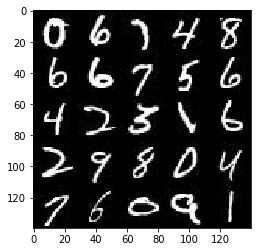

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

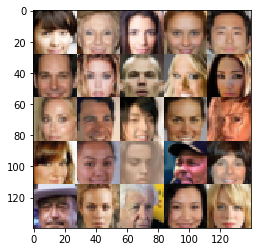

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.3.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    real_input = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='input_real')
    z_input = tf.placeholder(tf.float32, (None, z_dim), name='z_input')
    learning_rate = tf.placeholder(tf.float32, (None), name='lr')
    # TODO: Implement Function

    return real_input, z_input, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Operation'>):
<tf.Operation 'assert_rank_2/Assert/Assert' type=Assert>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
['File "/usr/lib/python3.5/runpy.py", line 184, in _run_module_as_main\n    "__main__", mod_spec)', 'File "/usr/lib/python3.5/runpy.py", line 85, in _run_code\n    exec(code, run_globals)', 'File "/usr/local/lib/python3.5/dist-packages/ipykernel_launcher.py", line 16, in <module>\n    app.launch_new_instance()', 'File "/usr/local/lib/python3.5/dist-packages/traitlets/config/application.py", line 658, in launch_instance\n    app.start()', 'File "/usr/local/lib/python3.5/dist-packages/ipykernel/kernelapp.py", line 477, in start\n    ioloop.IOLoop.instance().start()', 'File "/usr/local/lib/python3.5/dist-packages/zmq/eventloop/ioloop.py", line 177, in start\n    super(ZMQIOLoop, self).start()', 'File "/usr/lo

### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(image_batch, reuse=False, alpha=0.2):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    with tf.variable_scope('discriminator', reuse=reuse):
        #input (none, 28, 28, 3)
        x = tf.layers.conv2d(image_batch, filters=64, kernel_size=5, strides=2, padding='same')
        x = tf.maximum(x*alpha, x)
                
        # input (none, 14, 14, 128)
        x = tf.layers.conv2d(x, filters=128, kernel_size=5, strides=2, padding='same')
        x = tf.layers.batch_normalization(x, training=True)
        x = tf.maximum(x*alpha, x)
        
        x = tf.layers.conv2d(x, filters=256, kernel_size=5, strides=1, padding='same')
        x = tf.layers.batch_normalization(x, training=True)
        x = tf.maximum(x*alpha, x)
        
        # input 7,7 256
        x = tf.reshape(x, (-1, 7*7*256))
        logits = tf.layers.dense(x, 1)
        out = tf.sigmoid(logits)
            
        return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, reuse=True, is_train=True, alpha=0.2, test=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    if test:
        reuse = not reuse
    else:
        reuse = False

    with tf.variable_scope('generator', reuse=reuse):
        x = tf.layers.dense(z, 7*7*512)
        x = tf.reshape(x, (-1,7,7,512))
        x = tf.layers.batch_normalization(x, training=is_train)
        x = tf.maximum(alpha*x, x)
        
        x = tf.layers.conv2d_transpose(x, filters=256, kernel_size=5, strides=2, padding='same')
        x = tf.layers.batch_normalization(x, training=is_train)
        x = tf.maximum(x*alpha, x)
        
        # Shape from 7x7x256 to 14x14x128
        x = tf.layers.conv2d_transpose(x, filters=128, kernel_size=5, strides=2, padding='same')
        x = tf.layers.batch_normalization(x, training=is_train)
        x = tf.maximum(x*alpha, x)
        
        # Shape from 14x14x128 to 28x28x256
        logits = tf.layers.conv2d_transpose(x, filters=out_channel_dim, kernel_size=5, strides=1, padding='same')
        out = tf.tanh(logits)
        
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim, test=False)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
    
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:

def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode,
         print_every = 10, show_every=100):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model   
    real_input, z_input, lr = model_inputs(*data_shape[1:], z_dim)
    d_loss, g_loss = model_loss(real_input, z_input, data_shape[-1])
    d_opt, g_opt = model_opt(d_loss, g_loss, lr, beta1)
    steps = 0
    losses = []
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                
                steps += 1

                print(steps, end='.')
                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))

                _ = sess.run(d_opt, feed_dict={real_input: batch_images, z_input: batch_z,
                                              lr: learning_rate})
                _ = sess.run(g_opt, feed_dict={real_input: batch_images, z_input: batch_z,
                                              lr: learning_rate})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({z_input: batch_z, real_input: batch_images})
                    train_loss_g = g_loss.eval({z_input: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))
                    
                if steps % show_every == 0:
                    print(z_input)
                    show_generator_output(sess, 10, z_input, data_shape[-1], data_image_mode)

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

mnist loaded. starting training...
1.2.3.4.5.6.7.8.9.10.Epoch 1/5... Discriminator Loss: 0.6186... Generator Loss: 25.4588
11.12.13.14.15.16.17.18.19.20.Epoch 1/5... Discriminator Loss: 2.2183... Generator Loss: 1.2193
21.22.23.24.25.26.27.28.29.30.Epoch 1/5... Discriminator Loss: 0.0358... Generator Loss: 4.0295
31.32.33.34.35.36.37.38.39.40.Epoch 1/5... Discriminator Loss: 1.9111... Generator Loss: 1.4542
41.42.43.44.45.46.47.48.49.50.Epoch 1/5... Discriminator Loss: 0.4747... Generator Loss: 2.1700
51.52.53.54.55.56.57.58.59.60.Epoch 1/5... Discriminator Loss: 0.1311... Generator Loss: 3.2062
61.62.63.64.65.66.67.68.69.70.Epoch 1/5... Discriminator Loss: 9.0998... Generator Loss: 11.6018
71.72.73.74.75.76.77.78.79.80.Epoch 1/5... Discriminator Loss: 0.9448... Generator Loss: 1.9760
81.82.83.84.85.86.87.88.89.90.Epoch 1/5... Discriminator Loss: 1.6744... Generator Loss: 5.2002
91.92.93.94.95.96.97.98.99.100.Epoch 1/5... Discriminator Loss: 0.3385... Generator Loss: 2.0970
Tensor("z_i

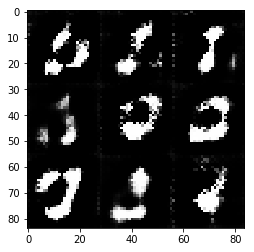

101.102.103.104.105.106.107.108.109.110.Epoch 1/5... Discriminator Loss: 0.2718... Generator Loss: 2.6244
111.112.113.114.115.116.117.118.119.120.Epoch 1/5... Discriminator Loss: 0.2031... Generator Loss: 3.1260
121.122.123.124.125.126.127.128.129.130.Epoch 1/5... Discriminator Loss: 0.4135... Generator Loss: 2.1800
131.132.133.134.135.136.137.138.139.140.Epoch 1/5... Discriminator Loss: 0.1481... Generator Loss: 2.9100
141.142.143.144.145.146.147.148.149.150.Epoch 1/5... Discriminator Loss: 0.3473... Generator Loss: 1.4975
151.152.153.154.155.156.157.158.159.160.Epoch 1/5... Discriminator Loss: 0.1149... Generator Loss: 3.4685
161.162.163.164.165.166.167.168.169.170.Epoch 1/5... Discriminator Loss: 0.1300... Generator Loss: 2.7318
171.172.173.174.175.176.177.178.179.180.Epoch 1/5... Discriminator Loss: 0.0822... Generator Loss: 3.2838
181.182.183.184.185.186.187.188.189.190.Epoch 1/5... Discriminator Loss: 0.0516... Generator Loss: 3.7507
191.192.193.194.195.196.197.198.199.200.Epoch 

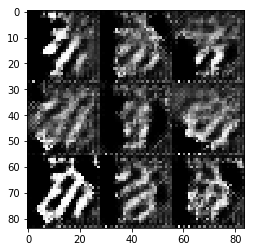

201.202.203.204.205.206.207.208.209.210.Epoch 1/5... Discriminator Loss: 2.6607... Generator Loss: 12.7764
211.212.213.214.215.216.217.218.219.220.Epoch 1/5... Discriminator Loss: 0.0530... Generator Loss: 4.8824
221.222.223.224.225.226.227.228.229.230.Epoch 1/5... Discriminator Loss: 0.0828... Generator Loss: 3.4233
231.232.233.234.235.236.237.238.239.240.Epoch 1/5... Discriminator Loss: 0.0710... Generator Loss: 4.8922
241.242.243.244.245.246.247.248.249.250.Epoch 1/5... Discriminator Loss: 0.0089... Generator Loss: 10.3882
251.252.253.254.255.256.257.258.259.260.Epoch 1/5... Discriminator Loss: 0.0846... Generator Loss: 4.4462
261.262.263.264.265.266.267.268.269.270.Epoch 1/5... Discriminator Loss: 0.2046... Generator Loss: 2.8284
271.272.273.274.275.276.277.278.279.280.Epoch 1/5... Discriminator Loss: 0.0352... Generator Loss: 5.0174
281.282.283.284.285.286.287.288.289.290.Epoch 1/5... Discriminator Loss: 0.0235... Generator Loss: 5.1165
291.292.293.294.295.296.297.298.299.300.Epoc

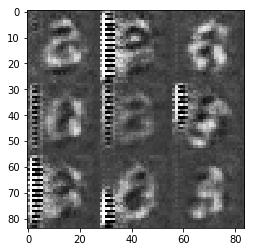

301.302.303.304.305.306.307.308.309.310.Epoch 1/5... Discriminator Loss: 0.2049... Generator Loss: 4.0770
311.312.313.314.315.316.317.318.319.320.Epoch 1/5... Discriminator Loss: 0.0409... Generator Loss: 4.9893
321.322.323.324.325.326.327.328.329.330.Epoch 1/5... Discriminator Loss: 0.1048... Generator Loss: 8.7449
331.332.333.334.335.336.337.338.339.340.Epoch 1/5... Discriminator Loss: 0.1818... Generator Loss: 2.6118
341.342.343.344.345.346.347.348.349.350.Epoch 1/5... Discriminator Loss: 0.0224... Generator Loss: 5.2190
351.352.353.354.355.356.357.358.359.360.Epoch 1/5... Discriminator Loss: 0.0100... Generator Loss: 6.9532
361.362.363.364.365.366.367.368.369.370.Epoch 1/5... Discriminator Loss: 0.0287... Generator Loss: 7.0792
371.372.373.374.375.376.377.378.379.380.Epoch 1/5... Discriminator Loss: 0.0546... Generator Loss: 3.5280
381.382.383.384.385.386.387.388.389.390.Epoch 1/5... Discriminator Loss: 0.3246... Generator Loss: 4.6904
391.392.393.394.395.396.397.398.399.400.Epoch 

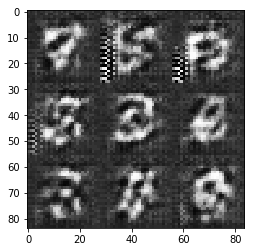

401.402.403.404.405.406.407.408.409.410.Epoch 1/5... Discriminator Loss: 0.0693... Generator Loss: 3.9769
411.412.413.414.415.416.417.418.419.420.Epoch 1/5... Discriminator Loss: 0.0173... Generator Loss: 4.9734
421.422.423.424.425.426.427.428.429.430.Epoch 1/5... Discriminator Loss: 0.1057... Generator Loss: 4.3114
431.432.433.434.435.436.437.438.439.440.Epoch 1/5... Discriminator Loss: 0.1214... Generator Loss: 3.4764
441.442.443.444.445.446.447.448.449.450.Epoch 1/5... Discriminator Loss: 0.0492... Generator Loss: 4.3376
451.452.453.454.455.456.457.458.459.460.Epoch 1/5... Discriminator Loss: 0.0280... Generator Loss: 5.0053
461.462.463.464.465.466.467.468.469.470.Epoch 1/5... Discriminator Loss: 3.0612... Generator Loss: 0.1057
471.472.473.474.475.476.477.478.479.480.Epoch 1/5... Discriminator Loss: 2.3674... Generator Loss: 5.7972
481.482.483.484.485.486.487.488.489.490.Epoch 1/5... Discriminator Loss: 0.6815... Generator Loss: 6.1609
491.492.493.494.495.496.497.498.499.500.Epoch 

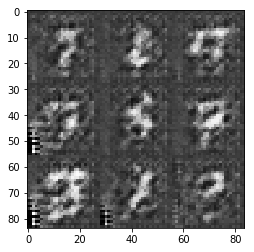

501.502.503.504.505.506.507.508.509.510.Epoch 1/5... Discriminator Loss: 0.1988... Generator Loss: 5.2159
511.512.513.514.515.516.517.518.519.520.Epoch 1/5... Discriminator Loss: 0.5672... Generator Loss: 7.8378
521.522.523.524.525.526.527.528.529.530.Epoch 1/5... Discriminator Loss: 1.5313... Generator Loss: 0.4200
531.532.533.534.535.536.537.538.539.540.Epoch 1/5... Discriminator Loss: 0.7351... Generator Loss: 1.2763
541.542.543.544.545.546.547.548.549.550.Epoch 1/5... Discriminator Loss: 0.1487... Generator Loss: 3.3440
551.552.553.554.555.556.557.558.559.560.Epoch 1/5... Discriminator Loss: 0.2047... Generator Loss: 3.6504
561.562.563.564.565.566.567.568.569.570.Epoch 1/5... Discriminator Loss: 0.2263... Generator Loss: 2.7692
571.572.573.574.575.576.577.578.579.580.Epoch 1/5... Discriminator Loss: 0.5783... Generator Loss: 4.3417
581.582.583.584.585.586.587.588.589.590.Epoch 1/5... Discriminator Loss: 1.4256... Generator Loss: 0.4743
591.592.593.594.595.596.597.598.599.600.Epoch 

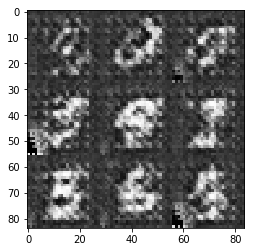

601.602.603.604.605.606.607.608.609.610.Epoch 2/5... Discriminator Loss: 0.0809... Generator Loss: 4.0803
611.612.613.614.615.616.617.618.619.620.Epoch 2/5... Discriminator Loss: 0.4749... Generator Loss: 9.3318
621.622.623.624.625.626.627.628.629.630.Epoch 2/5... Discriminator Loss: 0.0089... Generator Loss: 6.2410
631.632.633.634.635.636.637.638.639.640.Epoch 2/5... Discriminator Loss: 0.0316... Generator Loss: 5.0310
641.642.643.644.645.646.647.648.649.650.Epoch 2/5... Discriminator Loss: 0.0217... Generator Loss: 5.7480
651.652.653.654.655.656.657.658.659.660.Epoch 2/5... Discriminator Loss: 0.2348... Generator Loss: 2.7185
661.662.663.664.665.666.667.668.669.670.Epoch 2/5... Discriminator Loss: 0.0120... Generator Loss: 5.4132
671.672.673.674.675.676.677.678.679.680.Epoch 2/5... Discriminator Loss: 0.0267... Generator Loss: 4.8329
681.682.683.684.685.686.687.688.689.690.Epoch 2/5... Discriminator Loss: 0.0175... Generator Loss: 6.0626
691.692.693.694.695.696.697.698.699.700.Epoch 

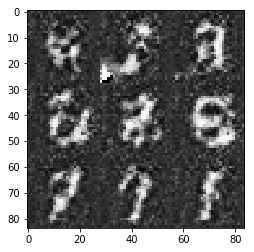

701.702.703.704.705.706.707.708.709.710.Epoch 2/5... Discriminator Loss: 0.0289... Generator Loss: 8.6301
711.712.713.714.715.716.717.718.719.720.Epoch 2/5... Discriminator Loss: 0.0702... Generator Loss: 3.8561
721.722.723.724.725.726.727.728.729.730.Epoch 2/5... Discriminator Loss: 0.0153... Generator Loss: 5.5295
731.732.733.734.735.736.737.738.739.740.Epoch 2/5... Discriminator Loss: 0.0125... Generator Loss: 5.8203
741.742.743.744.745.746.747.748.749.750.Epoch 2/5... Discriminator Loss: 0.0266... Generator Loss: 4.6140
751.752.753.754.755.756.757.758.759.760.Epoch 2/5... Discriminator Loss: 0.0115... Generator Loss: 5.5917
761.762.763.764.765.766.767.768.769.770.Epoch 2/5... Discriminator Loss: 0.0070... Generator Loss: 5.8082
771.772.773.774.775.776.777.778.779.780.Epoch 2/5... Discriminator Loss: 0.0276... Generator Loss: 5.4277
781.782.783.784.785.786.787.788.789.790.Epoch 2/5... Discriminator Loss: 0.0045... Generator Loss: 7.4325
791.792.793.794.795.796.797.798.799.800.Epoch 

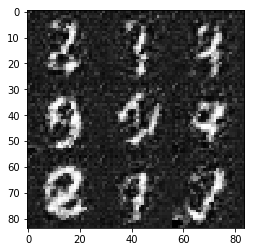

801.802.803.804.805.806.807.808.809.810.Epoch 2/5... Discriminator Loss: 0.0072... Generator Loss: 8.1162
811.812.813.814.815.816.817.818.819.820.Epoch 2/5... Discriminator Loss: 0.0096... Generator Loss: 8.0482
821.822.823.824.825.826.827.828.829.830.Epoch 2/5... Discriminator Loss: 0.0589... Generator Loss: 3.7587
831.832.833.834.835.836.837.838.839.840.Epoch 2/5... Discriminator Loss: 0.0037... Generator Loss: 9.2112
841.842.843.844.845.846.847.848.849.850.Epoch 2/5... Discriminator Loss: 0.0119... Generator Loss: 7.5012
851.852.853.854.855.856.857.858.859.860.Epoch 2/5... Discriminator Loss: 0.0427... Generator Loss: 4.0501
861.862.863.864.865.866.867.868.869.870.Epoch 2/5... Discriminator Loss: 0.0414... Generator Loss: 4.8055
871.872.873.874.875.876.877.878.879.880.Epoch 2/5... Discriminator Loss: 0.0335... Generator Loss: 4.9710
881.882.883.884.885.886.887.888.889.890.Epoch 2/5... Discriminator Loss: 0.0130... Generator Loss: 6.8232
891.892.893.894.895.896.897.898.899.900.Epoch 

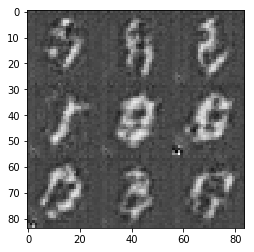

901.902.903.904.905.906.907.908.909.910.Epoch 2/5... Discriminator Loss: 0.0241... Generator Loss: 4.9730
911.912.913.914.915.916.917.918.919.920.Epoch 2/5... Discriminator Loss: 0.0136... Generator Loss: 5.4602
921.922.923.924.925.926.927.928.929.930.Epoch 2/5... Discriminator Loss: 0.0232... Generator Loss: 5.4214
931.932.933.934.935.936.937.938.939.940.Epoch 2/5... Discriminator Loss: 0.0342... Generator Loss: 8.2735
941.942.943.944.945.946.947.948.949.950.Epoch 2/5... Discriminator Loss: 9.0764... Generator Loss: 0.0108
951.952.953.954.955.956.957.958.959.960.Epoch 2/5... Discriminator Loss: 1.2572... Generator Loss: 1.7836
961.962.963.964.965.966.967.968.969.970.Epoch 2/5... Discriminator Loss: 1.0333... Generator Loss: 0.6703
971.972.973.974.975.976.977.978.979.980.Epoch 2/5... Discriminator Loss: 1.5033... Generator Loss: 0.5613
981.982.983.984.985.986.987.988.989.990.Epoch 2/5... Discriminator Loss: 1.4755... Generator Loss: 1.0089
991.992.993.994.995.996.997.998.999.1000.Epoch

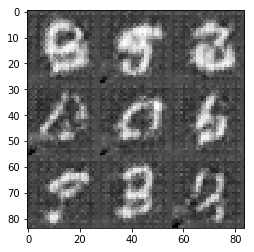

1001.1002.1003.1004.1005.1006.1007.1008.1009.1010.Epoch 2/5... Discriminator Loss: 1.3331... Generator Loss: 0.5341
1011.1012.1013.1014.1015.1016.1017.1018.1019.1020.Epoch 2/5... Discriminator Loss: 0.8299... Generator Loss: 2.4543
1021.1022.1023.1024.1025.1026.1027.1028.1029.1030.Epoch 2/5... Discriminator Loss: 0.6979... Generator Loss: 2.8778
1031.1032.1033.1034.1035.1036.1037.1038.1039.1040.Epoch 2/5... Discriminator Loss: 0.3242... Generator Loss: 2.5537
1041.1042.1043.1044.1045.1046.1047.1048.1049.1050.Epoch 2/5... Discriminator Loss: 0.5659... Generator Loss: 1.2647
1051.1052.1053.1054.1055.1056.1057.1058.1059.1060.Epoch 2/5... Discriminator Loss: 0.2514... Generator Loss: 3.3348
1061.1062.1063.1064.1065.1066.1067.1068.1069.1070.Epoch 2/5... Discriminator Loss: 0.2749... Generator Loss: 2.5129
1071.1072.1073.1074.1075.1076.1077.1078.1079.1080.Epoch 2/5... Discriminator Loss: 0.2010... Generator Loss: 3.0584
1081.1082.1083.1084.1085.1086.1087.1088.1089.1090.Epoch 2/5... Discrimin

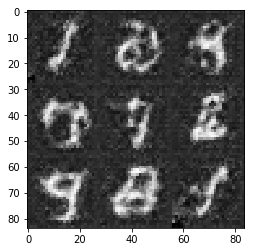

1101.1102.1103.1104.1105.1106.1107.1108.1109.1110.Epoch 2/5... Discriminator Loss: 0.2517... Generator Loss: 2.7078
1111.1112.1113.1114.1115.1116.1117.1118.1119.1120.Epoch 2/5... Discriminator Loss: 0.1375... Generator Loss: 3.0959
1121.1122.1123.1124.1125.1126.1127.1128.1129.1130.Epoch 2/5... Discriminator Loss: 0.5536... Generator Loss: 4.9992
1131.1132.1133.1134.1135.1136.1137.1138.1139.1140.Epoch 2/5... Discriminator Loss: 0.2976... Generator Loss: 3.4070
1141.1142.1143.1144.1145.1146.1147.1148.1149.1150.Epoch 2/5... Discriminator Loss: 0.1162... Generator Loss: 3.3088
1151.1152.1153.1154.1155.1156.1157.1158.1159.1160.Epoch 2/5... Discriminator Loss: 0.0290... Generator Loss: 5.7016
1161.1162.1163.1164.1165.1166.1167.1168.1169.1170.Epoch 2/5... Discriminator Loss: 0.0169... Generator Loss: 8.3019
1171.1172.1173.1174.1175.1176.1177.1178.1179.1180.Epoch 2/5... Discriminator Loss: 0.0266... Generator Loss: 5.5983
1181.1182.1183.1184.1185.1186.1187.1188.1189.1190.Epoch 2/5... Discrimin

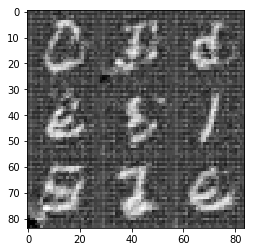

1201.1202.1203.1204.1205.1206.1207.1208.1209.1210.Epoch 3/5... Discriminator Loss: 0.2815... Generator Loss: 2.0449
1211.1212.1213.1214.1215.1216.1217.1218.1219.1220.Epoch 3/5... Discriminator Loss: 0.2993... Generator Loss: 9.5699
1221.1222.1223.1224.1225.1226.1227.1228.1229.1230.Epoch 3/5... Discriminator Loss: 2.6344... Generator Loss: 0.2152
1231.1232.1233.1234.1235.1236.1237.1238.1239.1240.Epoch 3/5... Discriminator Loss: 0.8206... Generator Loss: 2.0813
1241.1242.1243.1244.1245.1246.1247.1248.1249.1250.Epoch 3/5... Discriminator Loss: 0.7354... Generator Loss: 1.1314
1251.1252.1253.1254.1255.1256.1257.1258.1259.1260.Epoch 3/5... Discriminator Loss: 0.8987... Generator Loss: 0.8893
1261.1262.1263.1264.1265.1266.1267.1268.1269.1270.Epoch 3/5... Discriminator Loss: 0.8652... Generator Loss: 1.0515
1271.1272.1273.1274.1275.1276.1277.1278.1279.1280.Epoch 3/5... Discriminator Loss: 0.1988... Generator Loss: 3.2417
1281.1282.1283.1284.1285.1286.1287.1288.1289.1290.Epoch 3/5... Discrimin

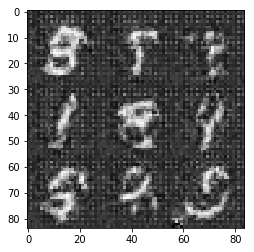

1301.1302.1303.1304.1305.1306.1307.1308.1309.1310.Epoch 3/5... Discriminator Loss: 0.8636... Generator Loss: 1.7964
1311.1312.1313.1314.1315.1316.1317.1318.1319.1320.Epoch 3/5... Discriminator Loss: 0.0310... Generator Loss: 6.1314
1321.1322.1323.1324.1325.1326.1327.1328.1329.1330.Epoch 3/5... Discriminator Loss: 2.3373... Generator Loss: 2.2064
1331.1332.1333.1334.1335.1336.1337.1338.1339.1340.Epoch 3/5... Discriminator Loss: 1.0522... Generator Loss: 0.6171
1341.1342.1343.1344.1345.1346.1347.1348.1349.1350.Epoch 3/5... Discriminator Loss: 1.2319... Generator Loss: 2.9898
1351.1352.1353.1354.1355.1356.1357.1358.1359.1360.Epoch 3/5... Discriminator Loss: 0.7929... Generator Loss: 5.2301
1361.1362.1363.1364.1365.1366.1367.1368.1369.1370.Epoch 3/5... Discriminator Loss: 0.2795... Generator Loss: 2.1054
1371.1372.1373.1374.1375.1376.1377.1378.1379.1380.Epoch 3/5... Discriminator Loss: 0.1155... Generator Loss: 4.5474
1381.1382.1383.1384.1385.1386.1387.1388.1389.1390.Epoch 3/5... Discrimin

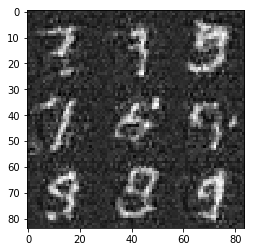

1401.1402.1403.1404.1405.1406.1407.1408.1409.1410.Epoch 3/5... Discriminator Loss: 0.0155... Generator Loss: 8.3997
1411.1412.1413.1414.1415.1416.1417.1418.1419.1420.Epoch 3/5... Discriminator Loss: 0.0705... Generator Loss: 3.5968
1421.1422.1423.1424.1425.1426.1427.1428.1429.1430.Epoch 3/5... Discriminator Loss: 0.0537... Generator Loss: 3.5618
1431.1432.1433.1434.1435.1436.1437.1438.1439.1440.Epoch 3/5... Discriminator Loss: 0.0072... Generator Loss: 9.4217
1441.1442.1443.1444.1445.1446.1447.1448.1449.1450.Epoch 3/5... Discriminator Loss: 0.0078... Generator Loss: 7.0616
1451.1452.1453.1454.1455.1456.1457.1458.1459.1460.Epoch 3/5... Discriminator Loss: 0.0423... Generator Loss: 4.0895
1461.1462.1463.1464.1465.1466.1467.1468.1469.1470.Epoch 3/5... Discriminator Loss: 0.1190... Generator Loss: 3.0741
1471.1472.1473.1474.1475.1476.1477.1478.1479.1480.Epoch 3/5... Discriminator Loss: 4.1434... Generator Loss: 8.0692
1481.1482.1483.1484.1485.1486.1487.1488.1489.1490.Epoch 3/5... Discrimin

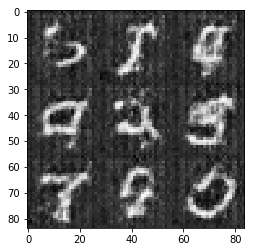

1501.1502.1503.1504.1505.1506.1507.1508.1509.1510.Epoch 3/5... Discriminator Loss: 1.0546... Generator Loss: 0.6827
1511.1512.1513.1514.1515.1516.1517.1518.1519.1520.Epoch 3/5... Discriminator Loss: 2.1238... Generator Loss: 0.1804
1521.1522.1523.1524.1525.1526.1527.1528.1529.1530.Epoch 3/5... Discriminator Loss: 1.2384... Generator Loss: 3.2975
1531.1532.1533.1534.1535.1536.1537.1538.1539.1540.Epoch 3/5... Discriminator Loss: 0.7094... Generator Loss: 1.1261
1541.1542.1543.1544.1545.1546.1547.1548.1549.1550.Epoch 3/5... Discriminator Loss: 0.7656... Generator Loss: 1.1310
1551.1552.1553.1554.1555.1556.1557.1558.1559.1560.Epoch 3/5... Discriminator Loss: 1.4423... Generator Loss: 0.4459
1561.1562.1563.1564.1565.1566.1567.1568.1569.1570.Epoch 3/5... Discriminator Loss: 0.8223... Generator Loss: 2.2168
1571.1572.1573.1574.1575.1576.1577.1578.1579.1580.Epoch 3/5... Discriminator Loss: 1.0908... Generator Loss: 3.3138
1581.1582.1583.1584.1585.1586.1587.1588.1589.1590.Epoch 3/5... Discrimin

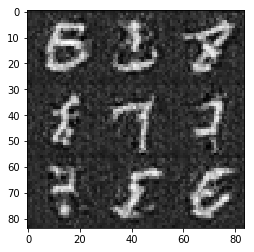

1601.1602.1603.1604.1605.1606.1607.1608.1609.1610.Epoch 3/5... Discriminator Loss: 0.4362... Generator Loss: 2.0986
1611.1612.1613.1614.1615.1616.1617.1618.1619.1620.Epoch 3/5... Discriminator Loss: 1.0904... Generator Loss: 3.6903
1621.1622.1623.1624.1625.1626.1627.1628.1629.1630.Epoch 3/5... Discriminator Loss: 0.3471... Generator Loss: 1.9411
1631.1632.1633.1634.1635.1636.1637.1638.1639.1640.Epoch 3/5... Discriminator Loss: 0.6040... Generator Loss: 3.6103
1641.1642.1643.1644.1645.1646.1647.1648.1649.1650.Epoch 3/5... Discriminator Loss: 0.4941... Generator Loss: 1.4435
1651.1652.1653.1654.1655.1656.1657.1658.1659.1660.Epoch 3/5... Discriminator Loss: 0.2220... Generator Loss: 2.0046
1661.1662.1663.1664.1665.1666.1667.1668.1669.1670.Epoch 3/5... Discriminator Loss: 0.8164... Generator Loss: 2.3867
1671.1672.1673.1674.1675.1676.1677.1678.1679.1680.Epoch 3/5... Discriminator Loss: 0.9774... Generator Loss: 1.8138
1681.1682.1683.1684.1685.1686.1687.1688.1689.1690.Epoch 3/5... Discrimin

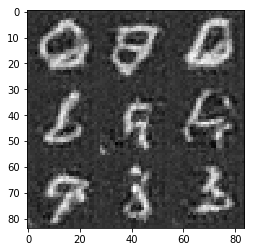

1701.1702.1703.1704.1705.1706.1707.1708.1709.1710.Epoch 3/5... Discriminator Loss: 0.7416... Generator Loss: 2.9316
1711.1712.1713.1714.1715.1716.1717.1718.1719.1720.Epoch 3/5... Discriminator Loss: 0.6024... Generator Loss: 1.6287
1721.1722.1723.1724.1725.1726.1727.1728.1729.1730.Epoch 3/5... Discriminator Loss: 0.7348... Generator Loss: 0.7987
1731.1732.1733.1734.1735.1736.1737.1738.1739.1740.Epoch 3/5... Discriminator Loss: 0.7252... Generator Loss: 1.1442
1741.1742.1743.1744.1745.1746.1747.1748.1749.1750.Epoch 3/5... Discriminator Loss: 0.4028... Generator Loss: 4.6754
1751.1752.1753.1754.1755.1756.1757.1758.1759.1760.Epoch 3/5... Discriminator Loss: 0.1629... Generator Loss: 2.9601
1761.1762.1763.1764.1765.1766.1767.1768.1769.1770.Epoch 3/5... Discriminator Loss: 0.0323... Generator Loss: 6.2955
1771.1772.1773.1774.1775.1776.1777.1778.1779.1780.Epoch 3/5... Discriminator Loss: 0.3400... Generator Loss: 1.8315
1781.1782.1783.1784.1785.1786.1787.1788.1789.1790.Epoch 3/5... Discrimin

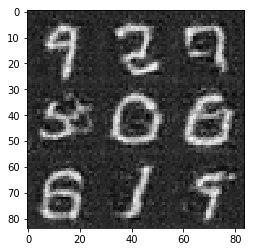

1801.1802.1803.1804.1805.1806.1807.1808.1809.1810.Epoch 4/5... Discriminator Loss: 0.8356... Generator Loss: 0.8299
1811.1812.1813.1814.1815.1816.1817.1818.1819.1820.Epoch 4/5... Discriminator Loss: 0.5922... Generator Loss: 1.2660
1821.1822.1823.1824.1825.1826.1827.1828.1829.1830.Epoch 4/5... Discriminator Loss: 0.5916... Generator Loss: 1.2063
1831.1832.1833.1834.1835.1836.1837.1838.1839.1840.Epoch 4/5... Discriminator Loss: 0.3633... Generator Loss: 3.2366
1841.1842.1843.1844.1845.1846.1847.1848.1849.1850.Epoch 4/5... Discriminator Loss: 0.3348... Generator Loss: 1.5171
1851.1852.1853.1854.1855.1856.1857.1858.1859.1860.Epoch 4/5... Discriminator Loss: 0.0629... Generator Loss: 3.7470
1861.1862.1863.1864.1865.1866.1867.1868.1869.1870.Epoch 4/5... Discriminator Loss: 0.2053... Generator Loss: 2.1664
1871.1872.1873.1874.1875.1876.1877.1878.1879.1880.Epoch 4/5... Discriminator Loss: 0.0214... Generator Loss: 5.0836
1881.1882.1883.1884.1885.1886.1887.1888.1889.1890.Epoch 4/5... Discrimin

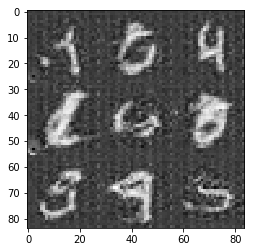

1901.1902.1903.1904.1905.1906.1907.1908.1909.1910.Epoch 4/5... Discriminator Loss: 0.0343... Generator Loss: 4.6986
1911.1912.1913.1914.1915.1916.1917.1918.1919.1920.Epoch 4/5... Discriminator Loss: 0.0325... Generator Loss: 10.8136
1921.1922.1923.1924.1925.1926.1927.1928.1929.1930.Epoch 4/5... Discriminator Loss: 0.0204... Generator Loss: 4.6662
1931.1932.1933.1934.1935.1936.1937.1938.1939.1940.Epoch 4/5... Discriminator Loss: 0.0747... Generator Loss: 3.2207
1941.1942.1943.1944.1945.1946.1947.1948.1949.1950.Epoch 4/5... Discriminator Loss: 0.0150... Generator Loss: 6.5835
1951.1952.1953.1954.1955.1956.1957.1958.1959.1960.Epoch 4/5... Discriminator Loss: 0.0334... Generator Loss: 4.6540
1961.1962.1963.1964.1965.1966.1967.1968.1969.1970.Epoch 4/5... Discriminator Loss: 0.0105... Generator Loss: 5.9041
1971.1972.1973.1974.1975.1976.1977.1978.1979.1980.Epoch 4/5... Discriminator Loss: 0.0088... Generator Loss: 6.5937
1981.1982.1983.1984.1985.1986.1987.1988.1989.1990.Epoch 4/5... Discrimi

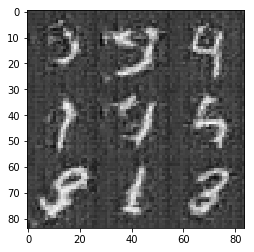

2001.2002.2003.2004.2005.2006.2007.2008.2009.2010.Epoch 4/5... Discriminator Loss: 0.0157... Generator Loss: 6.1935
2011.2012.2013.2014.2015.2016.2017.2018.2019.2020.Epoch 4/5... Discriminator Loss: 0.0087... Generator Loss: 6.0292
2021.2022.2023.2024.2025.2026.2027.2028.2029.2030.Epoch 4/5... Discriminator Loss: 0.0727... Generator Loss: 3.2183
2031.2032.2033.2034.2035.2036.2037.2038.2039.2040.Epoch 4/5... Discriminator Loss: 0.0279... Generator Loss: 4.1397
2041.2042.2043.2044.2045.2046.2047.2048.2049.2050.Epoch 4/5... Discriminator Loss: 0.0129... Generator Loss: 5.4395
2051.2052.2053.2054.2055.2056.2057.2058.2059.2060.Epoch 4/5... Discriminator Loss: 0.0069... Generator Loss: 7.3495
2061.2062.2063.2064.2065.2066.2067.2068.2069.2070.Epoch 4/5... Discriminator Loss: 0.0127... Generator Loss: 6.7091
2071.2072.2073.2074.2075.2076.2077.2078.2079.2080.Epoch 4/5... Discriminator Loss: 0.0061... Generator Loss: 7.0567
2081.2082.2083.2084.2085.2086.2087.2088.2089.2090.Epoch 4/5... Discrimin

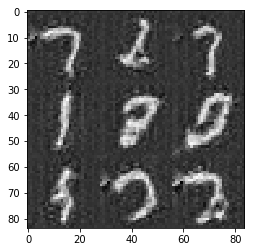

2101.2102.2103.2104.2105.2106.2107.2108.2109.2110.Epoch 4/5... Discriminator Loss: 1.3349... Generator Loss: 2.2322
2111.2112.2113.2114.2115.2116.2117.2118.2119.2120.Epoch 4/5... Discriminator Loss: 1.7005... Generator Loss: 3.3688
2121.2122.2123.2124.2125.2126.2127.2128.2129.2130.Epoch 4/5... Discriminator Loss: 0.7480... Generator Loss: 1.1735
2131.2132.2133.2134.2135.2136.2137.2138.2139.2140.Epoch 4/5... Discriminator Loss: 0.7423... Generator Loss: 1.5359
2141.2142.2143.2144.2145.2146.2147.2148.2149.2150.Epoch 4/5... Discriminator Loss: 0.6503... Generator Loss: 1.9004
2151.2152.2153.2154.2155.2156.2157.2158.2159.2160.Epoch 4/5... Discriminator Loss: 0.8190... Generator Loss: 0.8478
2161.2162.2163.2164.2165.2166.2167.2168.2169.2170.Epoch 4/5... Discriminator Loss: 0.5316... Generator Loss: 2.0011
2171.2172.2173.2174.2175.2176.2177.2178.2179.2180.Epoch 4/5... Discriminator Loss: 0.6660... Generator Loss: 1.1033
2181.2182.2183.2184.2185.2186.2187.2188.2189.2190.Epoch 4/5... Discrimin

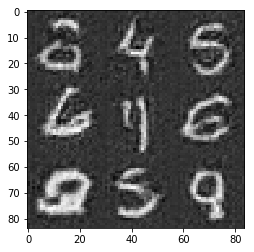

2201.2202.2203.2204.2205.2206.2207.2208.2209.2210.Epoch 4/5... Discriminator Loss: 0.7618... Generator Loss: 2.6018
2211.2212.2213.2214.2215.2216.2217.2218.2219.2220.Epoch 4/5... Discriminator Loss: 0.6039... Generator Loss: 1.4747
2221.2222.2223.2224.2225.2226.2227.2228.2229.2230.Epoch 4/5... Discriminator Loss: 0.7204... Generator Loss: 3.0368
2231.2232.2233.2234.2235.2236.2237.2238.2239.2240.Epoch 4/5... Discriminator Loss: 1.8098... Generator Loss: 0.3029
2241.2242.2243.2244.2245.2246.2247.2248.2249.2250.Epoch 4/5... Discriminator Loss: 0.5714... Generator Loss: 1.6216
2251.2252.2253.2254.2255.2256.2257.2258.2259.2260.Epoch 4/5... Discriminator Loss: 0.7115... Generator Loss: 0.8993
2261.2262.2263.2264.2265.2266.2267.2268.2269.2270.Epoch 4/5... Discriminator Loss: 0.2147... Generator Loss: 2.9462
2271.2272.2273.2274.2275.2276.2277.2278.2279.2280.Epoch 4/5... Discriminator Loss: 0.3383... Generator Loss: 1.6075
2281.2282.2283.2284.2285.2286.2287.2288.2289.2290.Epoch 4/5... Discrimin

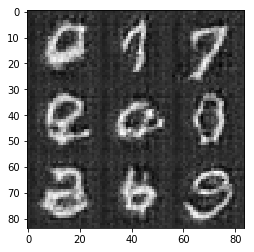

2301.2302.2303.2304.2305.2306.2307.2308.2309.2310.Epoch 4/5... Discriminator Loss: 1.1880... Generator Loss: 2.1511
2311.2312.2313.2314.2315.2316.2317.2318.2319.2320.Epoch 4/5... Discriminator Loss: 0.8025... Generator Loss: 1.0868
2321.2322.2323.2324.2325.2326.2327.2328.2329.2330.Epoch 4/5... Discriminator Loss: 1.3716... Generator Loss: 3.1436
2331.2332.2333.2334.2335.2336.2337.2338.2339.2340.Epoch 4/5... Discriminator Loss: 0.7541... Generator Loss: 1.3396
2341.2342.2343.2344.2345.2346.2347.2348.2349.2350.Epoch 4/5... Discriminator Loss: 0.5512... Generator Loss: 2.2284
2351.2352.2353.2354.2355.2356.2357.2358.2359.2360.Epoch 4/5... Discriminator Loss: 1.4206... Generator Loss: 4.0675
2361.2362.2363.2364.2365.2366.2367.2368.2369.2370.Epoch 4/5... Discriminator Loss: 0.5251... Generator Loss: 1.3008
2371.2372.2373.2374.2375.2376.2377.2378.2379.2380.Epoch 4/5... Discriminator Loss: 0.7935... Generator Loss: 0.9293
2381.2382.2383.2384.2385.2386.2387.2388.2389.2390.Epoch 4/5... Discrimin

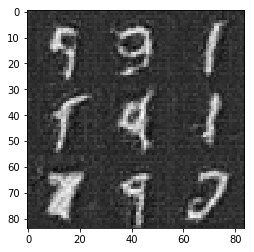

2401.2402.2403.2404.2405.2406.2407.2408.2409.2410.Epoch 5/5... Discriminator Loss: 0.1453... Generator Loss: 2.6393
2411.2412.2413.2414.2415.2416.2417.2418.2419.2420.Epoch 5/5... Discriminator Loss: 0.1497... Generator Loss: 6.8731
2421.2422.2423.2424.2425.2426.2427.2428.2429.2430.Epoch 5/5... Discriminator Loss: 2.2590... Generator Loss: 7.5149
2431.2432.2433.2434.2435.2436.2437.2438.2439.2440.Epoch 5/5... Discriminator Loss: 0.9098... Generator Loss: 2.2282
2441.2442.2443.2444.2445.2446.2447.2448.2449.2450.Epoch 5/5... Discriminator Loss: 0.8449... Generator Loss: 1.7492
2451.2452.2453.2454.2455.2456.2457.2458.2459.2460.Epoch 5/5... Discriminator Loss: 0.6178... Generator Loss: 1.8989
2461.2462.2463.2464.2465.2466.2467.2468.2469.2470.Epoch 5/5... Discriminator Loss: 0.6718... Generator Loss: 1.4716
2471.2472.2473.2474.2475.2476.2477.2478.2479.2480.Epoch 5/5... Discriminator Loss: 0.8240... Generator Loss: 3.6536
2481.2482.2483.2484.2485.2486.2487.2488.2489.2490.Epoch 5/5... Discrimin

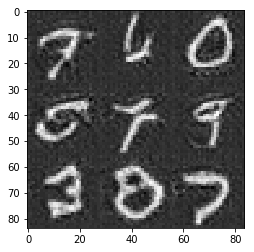

2501.2502.2503.2504.2505.2506.2507.2508.2509.2510.Epoch 5/5... Discriminator Loss: 0.1033... Generator Loss: 3.8844
2511.2512.2513.2514.2515.2516.2517.2518.2519.2520.Epoch 5/5... Discriminator Loss: 0.2956... Generator Loss: 1.8743
2521.2522.2523.2524.2525.2526.2527.2528.2529.2530.Epoch 5/5... Discriminator Loss: 0.0396... Generator Loss: 5.0169
2531.2532.2533.2534.2535.2536.2537.2538.2539.2540.Epoch 5/5... Discriminator Loss: 0.0203... Generator Loss: 6.8830
2541.2542.2543.2544.2545.2546.2547.2548.2549.2550.Epoch 5/5... Discriminator Loss: 0.0303... Generator Loss: 5.0506
2551.2552.2553.2554.2555.2556.2557.2558.2559.2560.Epoch 5/5... Discriminator Loss: 0.0204... Generator Loss: 4.7741
2561.2562.2563.2564.2565.2566.2567.2568.2569.2570.Epoch 5/5... Discriminator Loss: 0.0092... Generator Loss: 6.2040
2571.2572.2573.2574.2575.2576.2577.2578.2579.2580.Epoch 5/5... Discriminator Loss: 0.0111... Generator Loss: 8.7248
2581.2582.2583.2584.2585.2586.2587.2588.2589.2590.Epoch 5/5... Discrimin

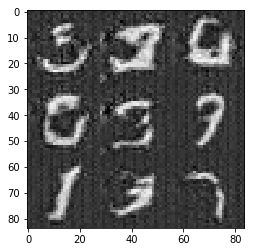

2601.2602.2603.2604.2605.2606.2607.2608.2609.2610.Epoch 5/5... Discriminator Loss: 0.0216... Generator Loss: 6.4298
2611.2612.2613.2614.2615.2616.2617.2618.2619.2620.Epoch 5/5... Discriminator Loss: 0.3864... Generator Loss: 1.4628
2621.2622.2623.2624.2625.2626.2627.2628.2629.2630.Epoch 5/5... Discriminator Loss: 0.1893... Generator Loss: 2.1512
2631.2632.2633.2634.2635.2636.2637.2638.2639.2640.Epoch 5/5... Discriminator Loss: 0.0096... Generator Loss: 5.5607
2641.2642.2643.2644.2645.2646.2647.2648.2649.2650.Epoch 5/5... Discriminator Loss: 0.0092... Generator Loss: 6.0178
2651.2652.2653.2654.2655.2656.2657.2658.2659.2660.Epoch 5/5... Discriminator Loss: 2.2028... Generator Loss: 0.3800
2661.2662.2663.2664.2665.2666.2667.2668.2669.2670.Epoch 5/5... Discriminator Loss: 0.7645... Generator Loss: 0.9713
2671.2672.2673.2674.2675.2676.2677.2678.2679.2680.Epoch 5/5... Discriminator Loss: 0.8645... Generator Loss: 2.1537
2681.2682.2683.2684.2685.2686.2687.2688.2689.2690.Epoch 5/5... Discrimin

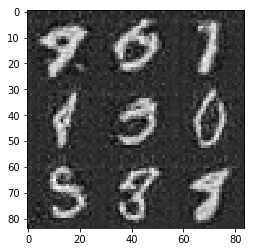

2701.2702.2703.2704.2705.2706.2707.2708.2709.2710.Epoch 5/5... Discriminator Loss: 0.6371... Generator Loss: 1.3174
2711.2712.2713.2714.2715.2716.2717.2718.2719.2720.Epoch 5/5... Discriminator Loss: 0.7426... Generator Loss: 0.9309
2721.2722.2723.2724.2725.2726.2727.2728.2729.2730.Epoch 5/5... Discriminator Loss: 0.4266... Generator Loss: 2.8163
2731.2732.2733.2734.2735.2736.2737.2738.2739.2740.Epoch 5/5... Discriminator Loss: 0.8301... Generator Loss: 3.7980
2741.2742.2743.2744.2745.2746.2747.2748.2749.2750.Epoch 5/5... Discriminator Loss: 0.3507... Generator Loss: 1.7417
2751.2752.2753.2754.2755.2756.2757.2758.2759.2760.Epoch 5/5... Discriminator Loss: 1.2542... Generator Loss: 0.4925
2761.2762.2763.2764.2765.2766.2767.2768.2769.2770.Epoch 5/5... Discriminator Loss: 0.0416... Generator Loss: 6.7707
2771.2772.2773.2774.2775.2776.2777.2778.2779.2780.Epoch 5/5... Discriminator Loss: 0.0294... Generator Loss: 4.9585
2781.2782.2783.2784.2785.2786.2787.2788.2789.2790.Epoch 5/5... Discrimin

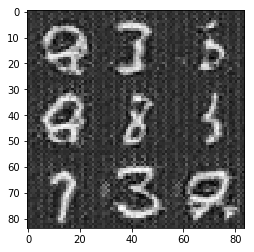

2801.2802.2803.2804.2805.2806.2807.2808.2809.2810.Epoch 5/5... Discriminator Loss: 0.0099... Generator Loss: 7.0559
2811.2812.2813.2814.2815.2816.2817.2818.2819.2820.Epoch 5/5... Discriminator Loss: 0.1430... Generator Loss: 2.3708
2821.2822.2823.2824.2825.2826.2827.2828.2829.2830.Epoch 5/5... Discriminator Loss: 0.0093... Generator Loss: 6.6415
2831.2832.2833.2834.2835.2836.2837.2838.2839.2840.Epoch 5/5... Discriminator Loss: 0.0188... Generator Loss: 10.0158
2841.2842.2843.2844.2845.2846.2847.2848.2849.2850.Epoch 5/5... Discriminator Loss: 0.0104... Generator Loss: 6.6463
2851.2852.2853.2854.2855.2856.2857.2858.2859.2860.Epoch 5/5... Discriminator Loss: 0.0184... Generator Loss: 5.2053
2861.2862.2863.2864.2865.2866.2867.2868.2869.2870.Epoch 5/5... Discriminator Loss: 0.4072... Generator Loss: 1.4141
2871.2872.2873.2874.2875.2876.2877.2878.2879.2880.Epoch 5/5... Discriminator Loss: 0.1954... Generator Loss: 3.5836
2881.2882.2883.2884.2885.2886.2887.2888.2889.2890.Epoch 5/5... Discrimi

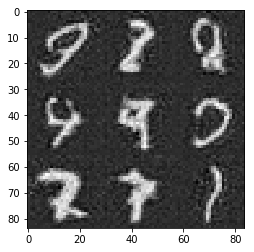

2901.2902.2903.2904.2905.2906.2907.2908.2909.2910.Epoch 5/5... Discriminator Loss: 0.1804... Generator Loss: 2.5046
2911.2912.2913.2914.2915.2916.2917.2918.2919.2920.Epoch 5/5... Discriminator Loss: 1.6433... Generator Loss: 6.1897
2921.2922.2923.2924.2925.2926.2927.2928.2929.2930.Epoch 5/5... Discriminator Loss: 0.9980... Generator Loss: 0.6769
2931.2932.2933.2934.2935.2936.2937.2938.2939.2940.Epoch 5/5... Discriminator Loss: 0.4088... Generator Loss: 4.5702
2941.2942.2943.2944.2945.2946.2947.2948.2949.2950.Epoch 5/5... Discriminator Loss: 0.5355... Generator Loss: 1.2026
2951.2952.2953.2954.2955.2956.2957.2958.2959.2960.Epoch 5/5... Discriminator Loss: 0.0391... Generator Loss: 4.4870
2961.2962.2963.2964.2965.2966.2967.2968.2969.2970.Epoch 5/5... Discriminator Loss: 0.0859... Generator Loss: 2.8965
2971.2972.2973.2974.2975.2976.2977.2978.2979.2980.Epoch 5/5... Discriminator Loss: 0.0132... Generator Loss: 6.1781
2981.2982.2983.2984.2985.2986.2987.2988.2989.2990.Epoch 5/5... Discrimin

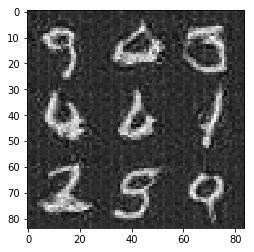

In [12]:
batch_size = 100
z_dim = 80
learning_rate = 0.0004
beta1 = 0.50


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 5

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
print("mnist loaded. starting training...")
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

1.2.3.4.5.6.7.8.9.10.Epoch 1/5... Discriminator Loss: 0.0957... Generator Loss: 9.9209
11.12.13.14.15.16.17.18.19.20.Epoch 1/5... Discriminator Loss: 0.0260... Generator Loss: 14.0094
21.22.23.24.25.26.27.28.29.30.Epoch 1/5... Discriminator Loss: 0.0643... Generator Loss: 4.0951
31.32.33.34.35.36.37.38.39.40.Epoch 1/5... Discriminator Loss: 0.8348... Generator Loss: 7.4560
41.42.43.44.45.46.47.48.49.50.Epoch 1/5... Discriminator Loss: 0.4149... Generator Loss: 3.6086
51.52.53.54.55.56.57.58.59.60.Epoch 1/5... Discriminator Loss: 0.6760... Generator Loss: 1.2192
61.62.63.64.65.66.67.68.69.70.Epoch 1/5... Discriminator Loss: 0.7383... Generator Loss: 0.9999
71.72.73.74.75.76.77.78.79.80.Epoch 1/5... Discriminator Loss: 0.1411... Generator Loss: 3.5204
81.82.83.84.85.86.87.88.89.90.Epoch 1/5... Discriminator Loss: 0.0223... Generator Loss: 4.6589
91.92.93.94.95.96.97.98.99.100.Epoch 1/5... Discriminator Loss: 0.0063... Generator Loss: 6.3514
Tensor("z_input:0", shape=(?, 80), dtype=float3

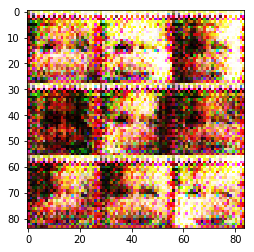

101.102.103.104.105.106.107.108.109.110.Epoch 1/5... Discriminator Loss: 0.0068... Generator Loss: 6.4306
111.112.113.114.115.116.117.118.119.120.Epoch 1/5... Discriminator Loss: 0.0124... Generator Loss: 4.9298
121.122.123.124.125.126.127.128.129.130.Epoch 1/5... Discriminator Loss: 0.0134... Generator Loss: 4.4927
131.132.133.134.135.136.137.138.139.140.Epoch 1/5... Discriminator Loss: 2.8542... Generator Loss: 20.5592
141.142.143.144.145.146.147.148.149.150.Epoch 1/5... Discriminator Loss: 1.8144... Generator Loss: 1.6059
151.152.153.154.155.156.157.158.159.160.Epoch 1/5... Discriminator Loss: 0.4573... Generator Loss: 2.2182
161.162.163.164.165.166.167.168.169.170.Epoch 1/5... Discriminator Loss: 0.0006... Generator Loss: 9.1271
171.172.173.174.175.176.177.178.179.180.Epoch 1/5... Discriminator Loss: 0.5181... Generator Loss: 1.9631
181.182.183.184.185.186.187.188.189.190.Epoch 1/5... Discriminator Loss: 0.1475... Generator Loss: 3.3917
191.192.193.194.195.196.197.198.199.200.Epoch

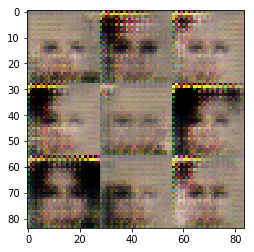

201.202.203.204.205.206.207.208.209.210.Epoch 1/5... Discriminator Loss: 0.1326... Generator Loss: 2.5765
211.212.213.214.215.216.217.218.219.220.Epoch 1/5... Discriminator Loss: 0.0331... Generator Loss: 4.1165
221.222.223.224.225.226.227.228.229.230.Epoch 1/5... Discriminator Loss: 1.0822... Generator Loss: 1.7091
231.232.233.234.235.236.237.238.239.240.Epoch 1/5... Discriminator Loss: 0.0696... Generator Loss: 3.5929
241.242.243.244.245.246.247.248.249.250.Epoch 1/5... Discriminator Loss: 1.7239... Generator Loss: 1.7742
251.252.253.254.255.256.257.258.259.260.Epoch 1/5... Discriminator Loss: 0.3165... Generator Loss: 1.8098
261.262.263.264.265.266.267.268.269.270.Epoch 1/5... Discriminator Loss: 0.9902... Generator Loss: 0.6060
271.272.273.274.275.276.277.278.279.280.Epoch 1/5... Discriminator Loss: 3.0736... Generator Loss: 0.1058
281.282.283.284.285.286.287.288.289.290.Epoch 1/5... Discriminator Loss: 1.8361... Generator Loss: 0.5512
291.292.293.294.295.296.297.298.299.300.Epoch 

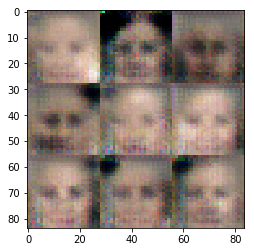

301.302.303.304.305.306.307.308.309.310.Epoch 1/5... Discriminator Loss: 0.7218... Generator Loss: 1.2559
311.312.313.314.315.316.317.318.319.320.Epoch 1/5... Discriminator Loss: 0.3505... Generator Loss: 1.9586
321.322.323.324.325.326.327.328.329.330.Epoch 1/5... Discriminator Loss: 0.0603... Generator Loss: 6.8343
331.332.333.334.335.336.337.338.339.340.Epoch 1/5... Discriminator Loss: 0.3514... Generator Loss: 1.6626
341.342.343.344.345.346.347.348.349.350.Epoch 1/5... Discriminator Loss: 0.1011... Generator Loss: 4.3478
351.352.353.354.355.356.357.358.359.360.Epoch 1/5... Discriminator Loss: 3.0566... Generator Loss: 0.1006
361.362.363.364.365.366.367.368.369.370.Epoch 1/5... Discriminator Loss: 0.1502... Generator Loss: 2.7355
371.372.373.374.375.376.377.378.379.380.Epoch 1/5... Discriminator Loss: 0.1075... Generator Loss: 4.5985
381.382.383.384.385.386.387.388.389.390.Epoch 1/5... Discriminator Loss: 0.4727... Generator Loss: 1.8254
391.392.393.394.395.396.397.398.399.400.Epoch 

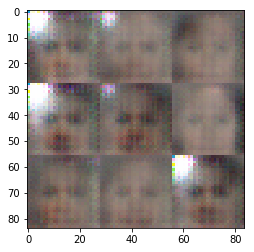

401.402.403.404.405.406.407.408.409.410.Epoch 1/5... Discriminator Loss: 0.2638... Generator Loss: 2.3857
411.412.413.414.415.416.417.418.419.420.Epoch 1/5... Discriminator Loss: 0.0331... Generator Loss: 6.5269
421.422.423.424.425.426.427.428.429.430.Epoch 1/5... Discriminator Loss: 0.2295... Generator Loss: 5.2599
431.432.433.434.435.436.437.438.439.440.Epoch 1/5... Discriminator Loss: 0.0288... Generator Loss: 5.5278
441.442.443.444.445.446.447.448.449.450.Epoch 1/5... Discriminator Loss: 0.0609... Generator Loss: 4.4844
451.452.453.454.455.456.457.458.459.460.Epoch 1/5... Discriminator Loss: 0.6305... Generator Loss: 8.3832
461.462.463.464.465.466.467.468.469.470.Epoch 1/5... Discriminator Loss: 0.2134... Generator Loss: 3.2350
471.472.473.474.475.476.477.478.479.480.Epoch 1/5... Discriminator Loss: 0.0776... Generator Loss: 5.1660
481.482.483.484.485.486.487.488.489.490.Epoch 1/5... Discriminator Loss: 0.0125... Generator Loss: 5.9202
491.492.493.494.495.496.497.498.499.500.Epoch 

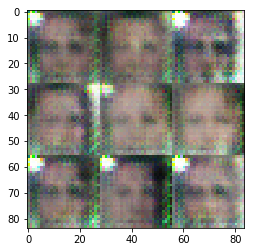

501.502.503.504.505.506.507.508.509.510.Epoch 1/5... Discriminator Loss: 0.1048... Generator Loss: 2.9320
511.512.513.514.515.516.517.518.519.520.Epoch 1/5... Discriminator Loss: 0.2978... Generator Loss: 2.5678
521.522.523.524.525.526.527.528.529.530.Epoch 1/5... Discriminator Loss: 0.1035... Generator Loss: 7.3994
531.532.533.534.535.536.537.538.539.540.Epoch 1/5... Discriminator Loss: 0.0586... Generator Loss: 4.1373
541.542.543.544.545.546.547.548.549.550.Epoch 1/5... Discriminator Loss: 0.5625... Generator Loss: 1.6001
551.552.553.554.555.556.557.558.559.560.Epoch 1/5... Discriminator Loss: 0.1175... Generator Loss: 3.3748
561.562.563.564.565.566.567.568.569.570.Epoch 1/5... Discriminator Loss: 0.1339... Generator Loss: 4.3378
571.572.573.574.575.576.577.578.579.580.Epoch 1/5... Discriminator Loss: 0.0453... Generator Loss: 6.0222
581.582.583.584.585.586.587.588.589.590.Epoch 1/5... Discriminator Loss: 0.1030... Generator Loss: 3.7412
591.592.593.594.595.596.597.598.599.600.Epoch 

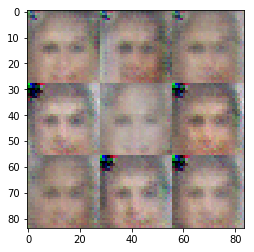

601.602.603.604.605.606.607.608.609.610.Epoch 1/5... Discriminator Loss: 0.1020... Generator Loss: 3.6354
611.612.613.614.615.616.617.618.619.620.Epoch 1/5... Discriminator Loss: 0.0402... Generator Loss: 5.0308
621.622.623.624.625.626.627.628.629.630.Epoch 1/5... Discriminator Loss: 1.0816... Generator Loss: 3.8530
631.632.633.634.635.636.637.638.639.640.Epoch 1/5... Discriminator Loss: 0.3822... Generator Loss: 1.7819
641.642.643.644.645.646.647.648.649.650.Epoch 1/5... Discriminator Loss: 0.0208... Generator Loss: 6.8354
651.652.653.654.655.656.657.658.659.660.Epoch 1/5... Discriminator Loss: 0.0924... Generator Loss: 3.8862
661.662.663.664.665.666.667.668.669.670.Epoch 1/5... Discriminator Loss: 0.2226... Generator Loss: 3.4732
671.672.673.674.675.676.677.678.679.680.Epoch 1/5... Discriminator Loss: 0.1744... Generator Loss: 2.4315
681.682.683.684.685.686.687.688.689.690.Epoch 1/5... Discriminator Loss: 0.0530... Generator Loss: 4.8979
691.692.693.694.695.696.697.698.699.700.Epoch 

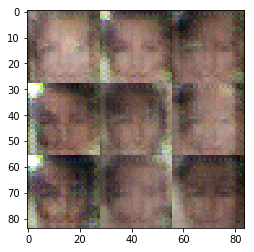

701.702.703.704.705.706.707.708.709.710.Epoch 1/5... Discriminator Loss: 0.0322... Generator Loss: 7.0830
711.712.713.714.715.716.717.718.719.720.Epoch 1/5... Discriminator Loss: 0.2299... Generator Loss: 2.6605
721.722.723.724.725.726.727.728.729.730.Epoch 1/5... Discriminator Loss: 0.0854... Generator Loss: 4.4142
731.732.733.734.735.736.737.738.739.740.Epoch 1/5... Discriminator Loss: 0.0150... Generator Loss: 5.2538
741.742.743.744.745.746.747.748.749.750.Epoch 1/5... Discriminator Loss: 0.0265... Generator Loss: 5.0746
751.752.753.754.755.756.757.758.759.760.Epoch 1/5... Discriminator Loss: 0.1579... Generator Loss: 4.3164
761.762.763.764.765.766.767.768.769.770.Epoch 1/5... Discriminator Loss: 0.0110... Generator Loss: 8.2173
771.772.773.774.775.776.777.778.779.780.Epoch 1/5... Discriminator Loss: 2.8755... Generator Loss: 2.3441
781.782.783.784.785.786.787.788.789.790.Epoch 1/5... Discriminator Loss: 0.6094... Generator Loss: 1.2044
791.792.793.794.795.796.797.798.799.800.Epoch 

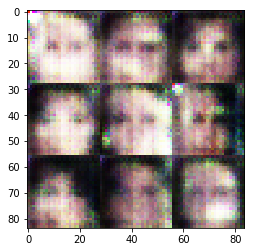

801.802.803.804.805.806.807.808.809.810.Epoch 1/5... Discriminator Loss: 0.0795... Generator Loss: 5.4473
811.812.813.814.815.816.817.818.819.820.Epoch 1/5... Discriminator Loss: 0.3987... Generator Loss: 1.7792
821.822.823.824.825.826.827.828.829.830.Epoch 1/5... Discriminator Loss: 0.1827... Generator Loss: 2.5026
831.832.833.834.835.836.837.838.839.840.Epoch 1/5... Discriminator Loss: 0.0284... Generator Loss: 4.3885
841.842.843.844.845.846.847.848.849.850.Epoch 1/5... Discriminator Loss: 3.3553... Generator Loss: 0.0695
851.852.853.854.855.856.857.858.859.860.Epoch 1/5... Discriminator Loss: 0.6396... Generator Loss: 1.4780
861.862.863.864.865.866.867.868.869.870.Epoch 1/5... Discriminator Loss: 0.0226... Generator Loss: 6.7938
871.872.873.874.875.876.877.878.879.880.Epoch 1/5... Discriminator Loss: 0.0989... Generator Loss: 3.4701
881.882.883.884.885.886.887.888.889.890.Epoch 1/5... Discriminator Loss: 0.0539... Generator Loss: 5.4650
891.892.893.894.895.896.897.898.899.900.Epoch 

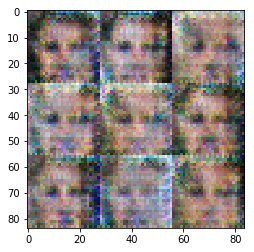

901.902.903.904.905.906.907.908.909.910.Epoch 1/5... Discriminator Loss: 0.0767... Generator Loss: 3.0521
911.912.913.914.915.916.917.918.919.920.Epoch 1/5... Discriminator Loss: 0.0971... Generator Loss: 3.4065
921.922.923.924.925.926.927.928.929.930.Epoch 1/5... Discriminator Loss: 0.0796... Generator Loss: 3.9856
931.932.933.934.935.936.937.938.939.940.Epoch 1/5... Discriminator Loss: 0.2295... Generator Loss: 3.0876
941.942.943.944.945.946.947.948.949.950.Epoch 1/5... Discriminator Loss: 0.0066... Generator Loss: 7.2379
951.952.953.954.955.956.957.958.959.960.Epoch 1/5... Discriminator Loss: 0.0058... Generator Loss: 7.3534
961.962.963.964.965.966.967.968.969.970.Epoch 1/5... Discriminator Loss: 0.0001... Generator Loss: 14.0237
971.972.973.974.975.976.977.978.979.980.Epoch 1/5... Discriminator Loss: 0.1705... Generator Loss: 2.7290
981.982.983.984.985.986.987.988.989.990.Epoch 1/5... Discriminator Loss: 0.0013... Generator Loss: 8.7740
991.992.993.994.995.996.997.998.999.1000.Epoc

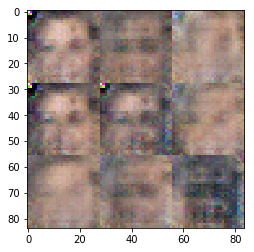

1001.1002.1003.1004.1005.1006.1007.1008.1009.1010.Epoch 1/5... Discriminator Loss: 0.0050... Generator Loss: 6.5807
1011.1012.1013.1014.1015.1016.1017.1018.1019.1020.Epoch 1/5... Discriminator Loss: 0.0067... Generator Loss: 6.9310
1021.1022.1023.1024.1025.1026.1027.1028.1029.1030.Epoch 1/5... Discriminator Loss: 0.0890... Generator Loss: 3.1854
1031.1032.1033.1034.1035.1036.1037.1038.1039.1040.Epoch 1/5... Discriminator Loss: 0.0334... Generator Loss: 4.7565
1041.1042.1043.1044.1045.1046.1047.1048.1049.1050.Epoch 1/5... Discriminator Loss: 0.4868... Generator Loss: 10.9495
1051.1052.1053.1054.1055.1056.1057.1058.1059.1060.Epoch 1/5... Discriminator Loss: 0.2654... Generator Loss: 2.2125
1061.1062.1063.1064.1065.1066.1067.1068.1069.1070.Epoch 1/5... Discriminator Loss: 0.0594... Generator Loss: 5.1014
1071.1072.1073.1074.1075.1076.1077.1078.1079.1080.Epoch 1/5... Discriminator Loss: 0.2120... Generator Loss: 2.3062
1081.1082.1083.1084.1085.1086.1087.1088.1089.1090.Epoch 1/5... Discrimi

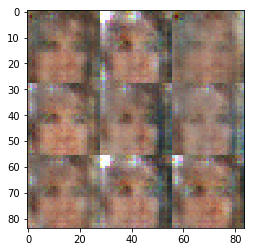

1101.1102.1103.1104.1105.1106.1107.1108.1109.1110.Epoch 1/5... Discriminator Loss: 0.0454... Generator Loss: 4.1843
1111.1112.1113.1114.1115.1116.1117.1118.1119.1120.Epoch 1/5... Discriminator Loss: 2.9722... Generator Loss: 0.1910
1121.1122.1123.1124.1125.1126.1127.1128.1129.1130.Epoch 1/5... Discriminator Loss: 0.3816... Generator Loss: 2.6512
1131.1132.1133.1134.1135.1136.1137.1138.1139.1140.Epoch 1/5... Discriminator Loss: 0.0114... Generator Loss: 6.9097
1141.1142.1143.1144.1145.1146.1147.1148.1149.1150.Epoch 1/5... Discriminator Loss: 1.2715... Generator Loss: 0.4427
1151.1152.1153.1154.1155.1156.1157.1158.1159.1160.Epoch 1/5... Discriminator Loss: 0.0949... Generator Loss: 3.8699
1161.1162.1163.1164.1165.1166.1167.1168.1169.1170.Epoch 1/5... Discriminator Loss: 0.0334... Generator Loss: 3.8427
1171.1172.1173.1174.1175.1176.1177.1178.1179.1180.Epoch 1/5... Discriminator Loss: 0.0421... Generator Loss: 3.7647
1181.1182.1183.1184.1185.1186.1187.1188.1189.1190.Epoch 1/5... Discrimin

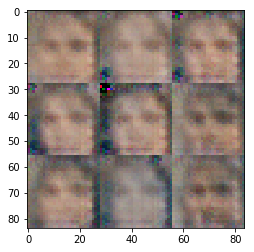

1201.1202.1203.1204.1205.1206.1207.1208.1209.1210.Epoch 1/5... Discriminator Loss: 0.1302... Generator Loss: 3.3203
1211.1212.1213.1214.1215.1216.1217.1218.1219.1220.Epoch 1/5... Discriminator Loss: 0.0529... Generator Loss: 4.2051
1221.1222.1223.1224.1225.1226.1227.1228.1229.1230.Epoch 1/5... Discriminator Loss: 0.0097... Generator Loss: 7.0214
1231.1232.1233.1234.1235.1236.1237.1238.1239.1240.Epoch 1/5... Discriminator Loss: 0.0025... Generator Loss: 7.4269
1241.1242.1243.1244.1245.1246.1247.1248.1249.1250.Epoch 1/5... Discriminator Loss: 0.0067... Generator Loss: 8.1417
1251.1252.1253.1254.1255.1256.1257.1258.1259.1260.Epoch 1/5... Discriminator Loss: 0.0118... Generator Loss: 7.5276
1261.1262.1263.1264.1265.1266.1267.1268.1269.1270.Epoch 1/5... Discriminator Loss: 0.0345... Generator Loss: 5.0870
1271.1272.1273.1274.1275.1276.1277.1278.1279.1280.Epoch 1/5... Discriminator Loss: 0.0006... Generator Loss: 10.2813
1281.1282.1283.1284.1285.1286.1287.1288.1289.1290.Epoch 1/5... Discrimi

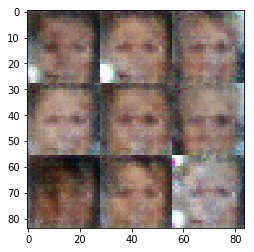

1301.1302.1303.1304.1305.1306.1307.1308.1309.1310.Epoch 1/5... Discriminator Loss: 0.0610... Generator Loss: 4.5727
1311.1312.1313.1314.1315.1316.1317.1318.1319.1320.Epoch 1/5... Discriminator Loss: 0.1185... Generator Loss: 3.2585
1321.1322.1323.1324.1325.1326.1327.1328.1329.1330.Epoch 1/5... Discriminator Loss: 0.0930... Generator Loss: 2.9514
1331.1332.1333.1334.1335.1336.1337.1338.1339.1340.Epoch 1/5... Discriminator Loss: 0.0053... Generator Loss: 5.8689
1341.1342.1343.1344.1345.1346.1347.1348.1349.1350.Epoch 1/5... Discriminator Loss: 0.4638... Generator Loss: 6.2298
1351.1352.1353.1354.1355.1356.1357.1358.1359.1360.Epoch 1/5... Discriminator Loss: 0.0993... Generator Loss: 5.8716
1361.1362.1363.1364.1365.1366.1367.1368.1369.1370.Epoch 1/5... Discriminator Loss: 1.2979... Generator Loss: 0.5611
1371.1372.1373.1374.1375.1376.1377.1378.1379.1380.Epoch 1/5... Discriminator Loss: 0.2823... Generator Loss: 2.2243
1381.1382.1383.1384.1385.1386.1387.1388.1389.1390.Epoch 1/5... Discrimin

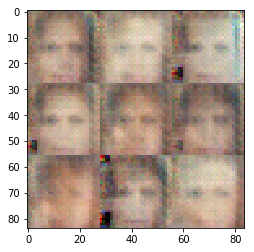

1401.1402.1403.1404.1405.1406.1407.1408.1409.1410.Epoch 1/5... Discriminator Loss: 0.0334... Generator Loss: 4.2902
1411.1412.1413.1414.1415.1416.1417.1418.1419.1420.Epoch 1/5... Discriminator Loss: 0.0540... Generator Loss: 3.4531
1421.1422.1423.1424.1425.1426.1427.1428.1429.1430.Epoch 1/5... Discriminator Loss: 0.0175... Generator Loss: 4.9432
1431.1432.1433.1434.1435.1436.1437.1438.1439.1440.Epoch 1/5... Discriminator Loss: 0.0507... Generator Loss: 3.5718
1441.1442.1443.1444.1445.1446.1447.1448.1449.1450.Epoch 1/5... Discriminator Loss: 0.0106... Generator Loss: 10.2871
1451.1452.1453.1454.1455.1456.1457.1458.1459.1460.Epoch 1/5... Discriminator Loss: 6.9049... Generator Loss: 3.7491
1461.1462.1463.1464.1465.1466.1467.1468.1469.1470.Epoch 1/5... Discriminator Loss: 0.3733... Generator Loss: 2.1269
1471.1472.1473.1474.1475.1476.1477.1478.1479.1480.Epoch 1/5... Discriminator Loss: 0.3461... Generator Loss: 7.6638
1481.1482.1483.1484.1485.1486.1487.1488.1489.1490.Epoch 1/5... Discrimi

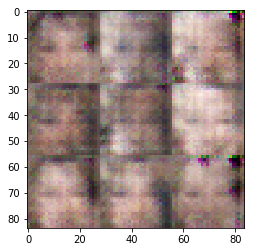

1501.1502.1503.1504.1505.1506.1507.1508.1509.1510.Epoch 1/5... Discriminator Loss: 1.1507... Generator Loss: 0.7016
1511.1512.1513.1514.1515.1516.1517.1518.1519.1520.Epoch 1/5... Discriminator Loss: 0.0555... Generator Loss: 6.3960
1521.1522.1523.1524.1525.1526.1527.1528.1529.1530.Epoch 1/5... Discriminator Loss: 0.1987... Generator Loss: 3.2779
1531.1532.1533.1534.1535.1536.1537.1538.1539.1540.Epoch 1/5... Discriminator Loss: 0.0186... Generator Loss: 5.2129
1541.1542.1543.1544.1545.1546.1547.1548.1549.1550.Epoch 1/5... Discriminator Loss: 2.8179... Generator Loss: 3.4582
1551.1552.1553.1554.1555.1556.1557.1558.1559.1560.Epoch 1/5... Discriminator Loss: 0.0719... Generator Loss: 3.6512
1561.1562.1563.1564.1565.1566.1567.1568.1569.1570.Epoch 1/5... Discriminator Loss: 0.3628... Generator Loss: 2.1117
1571.1572.1573.1574.1575.1576.1577.1578.1579.1580.Epoch 1/5... Discriminator Loss: 0.1819... Generator Loss: 3.1892
1581.1582.1583.1584.1585.1586.1587.1588.1589.1590.Epoch 1/5... Discrimin

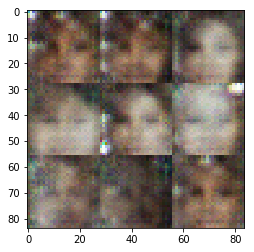

1601.1602.1603.1604.1605.1606.1607.1608.1609.1610.Epoch 1/5... Discriminator Loss: 1.6160... Generator Loss: 7.8164
1611.1612.1613.1614.1615.1616.1617.1618.1619.1620.Epoch 1/5... Discriminator Loss: 0.0948... Generator Loss: 3.7111
1621.1622.1623.1624.1625.1626.1627.1628.1629.1630.Epoch 1/5... Discriminator Loss: 0.0106... Generator Loss: 9.8658
1631.1632.1633.1634.1635.1636.1637.1638.1639.1640.Epoch 1/5... Discriminator Loss: 0.0449... Generator Loss: 4.4159
1641.1642.1643.1644.1645.1646.1647.1648.1649.1650.Epoch 1/5... Discriminator Loss: 1.7542... Generator Loss: 0.8174
1651.1652.1653.1654.1655.1656.1657.1658.1659.1660.Epoch 1/5... Discriminator Loss: 0.1342... Generator Loss: 4.0913
1661.1662.1663.1664.1665.1666.1667.1668.1669.1670.Epoch 1/5... Discriminator Loss: 0.7603... Generator Loss: 0.9199
1671.1672.1673.1674.1675.1676.1677.1678.1679.1680.Epoch 1/5... Discriminator Loss: 0.0519... Generator Loss: 4.2193
1681.1682.1683.1684.1685.1686.1687.1688.1689.1690.Epoch 1/5... Discrimin

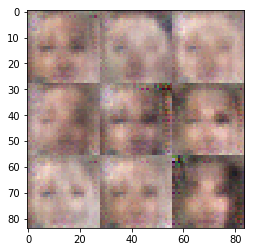

1701.1702.1703.1704.1705.1706.1707.1708.1709.1710.Epoch 1/5... Discriminator Loss: 0.7937... Generator Loss: 1.0468
1711.1712.1713.1714.1715.1716.1717.1718.1719.1720.Epoch 1/5... Discriminator Loss: 1.1905... Generator Loss: 1.9866
1721.1722.1723.1724.1725.1726.1727.1728.1729.1730.Epoch 1/5... Discriminator Loss: 0.0017... Generator Loss: 7.4257
1731.1732.1733.1734.1735.1736.1737.1738.1739.1740.Epoch 1/5... Discriminator Loss: 0.2808... Generator Loss: 1.8211
1741.1742.1743.1744.1745.1746.1747.1748.1749.1750.Epoch 1/5... Discriminator Loss: 1.1298... Generator Loss: 0.6591
1751.1752.1753.1754.1755.1756.1757.1758.1759.1760.Epoch 1/5... Discriminator Loss: 2.1311... Generator Loss: 0.2130
1761.1762.1763.1764.1765.1766.1767.1768.1769.1770.Epoch 1/5... Discriminator Loss: 1.0446... Generator Loss: 0.6368
1771.1772.1773.1774.1775.1776.1777.1778.1779.1780.Epoch 1/5... Discriminator Loss: 0.0135... Generator Loss: 9.7397
1781.1782.1783.1784.1785.1786.1787.1788.1789.1790.Epoch 1/5... Discrimin

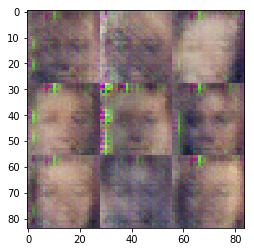

1801.1802.1803.1804.1805.1806.1807.1808.1809.1810.Epoch 1/5... Discriminator Loss: 0.0024... Generator Loss: 11.0699
1811.1812.1813.1814.1815.1816.1817.1818.1819.1820.Epoch 1/5... Discriminator Loss: 0.0010... Generator Loss: 13.8225
1821.1822.1823.1824.1825.1826.1827.1828.1829.1830.Epoch 1/5... Discriminator Loss: 5.2696... Generator Loss: 3.9674
1831.1832.1833.1834.1835.1836.1837.1838.1839.1840.Epoch 1/5... Discriminator Loss: 0.1094... Generator Loss: 5.5753
1841.1842.1843.1844.1845.1846.1847.1848.1849.1850.Epoch 1/5... Discriminator Loss: 1.4216... Generator Loss: 0.4437
1851.1852.1853.1854.1855.1856.1857.1858.1859.1860.Epoch 1/5... Discriminator Loss: 0.0421... Generator Loss: 4.8098
1861.1862.1863.1864.1865.1866.1867.1868.1869.1870.Epoch 1/5... Discriminator Loss: 0.0176... Generator Loss: 6.6148
1871.1872.1873.1874.1875.1876.1877.1878.1879.1880.Epoch 1/5... Discriminator Loss: 2.3951... Generator Loss: 0.1163
1881.1882.1883.1884.1885.1886.1887.1888.1889.1890.Epoch 1/5... Discrim

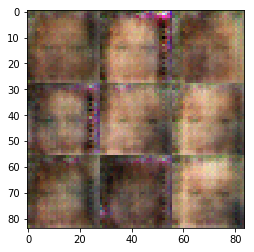

1901.1902.1903.1904.1905.1906.1907.1908.1909.1910.Epoch 1/5... Discriminator Loss: 1.5943... Generator Loss: 0.6130
1911.1912.1913.1914.1915.1916.1917.1918.1919.1920.Epoch 1/5... Discriminator Loss: 1.4887... Generator Loss: 0.7286
1921.1922.1923.1924.1925.1926.1927.1928.1929.1930.Epoch 1/5... Discriminator Loss: 1.0557... Generator Loss: 0.8669
1931.1932.1933.1934.1935.1936.1937.1938.1939.1940.Epoch 1/5... Discriminator Loss: 1.1835... Generator Loss: 0.9557
1941.1942.1943.1944.1945.1946.1947.1948.1949.1950.Epoch 1/5... Discriminator Loss: 1.0168... Generator Loss: 0.6508
1951.1952.1953.1954.1955.1956.1957.1958.1959.1960.Epoch 1/5... Discriminator Loss: 1.0483... Generator Loss: 0.9444
1961.1962.1963.1964.1965.1966.1967.1968.1969.1970.Epoch 1/5... Discriminator Loss: 1.3321... Generator Loss: 1.1481
1971.1972.1973.1974.1975.1976.1977.1978.1979.1980.Epoch 1/5... Discriminator Loss: 1.1728... Generator Loss: 1.4155
1981.1982.1983.1984.1985.1986.1987.1988.1989.1990.Epoch 1/5... Discrimin

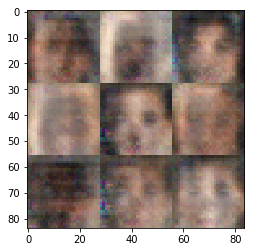

2001.2002.2003.2004.2005.2006.2007.2008.2009.2010.Epoch 1/5... Discriminator Loss: 0.8976... Generator Loss: 0.7476
2011.2012.2013.2014.2015.2016.2017.2018.2019.2020.Epoch 1/5... Discriminator Loss: 1.3870... Generator Loss: 0.6921
2021.2022.2023.2024.2025.2026.2027.2028.2029.2030.Epoch 1/5... Discriminator Loss: 0.0769... Generator Loss: 6.1159
2031.2032.2033.2034.2035.2036.2037.2038.2039.2040.Epoch 1/5... Discriminator Loss: 1.4001... Generator Loss: 4.0924
2041.2042.2043.2044.2045.2046.2047.2048.2049.2050.Epoch 1/5... Discriminator Loss: 0.0025... Generator Loss: 8.7596
2051.2052.2053.2054.2055.2056.2057.2058.2059.2060.Epoch 1/5... Discriminator Loss: 2.3492... Generator Loss: 0.1950
2061.2062.2063.2064.2065.2066.2067.2068.2069.2070.Epoch 1/5... Discriminator Loss: 0.0028... Generator Loss: 8.2378
2071.2072.2073.2074.2075.2076.2077.2078.2079.2080.Epoch 1/5... Discriminator Loss: 0.0052... Generator Loss: 9.5557
2081.2082.2083.2084.2085.2086.2087.2088.2089.2090.Epoch 1/5... Discrimin

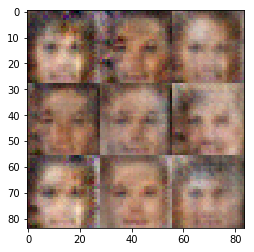

2101.2102.2103.2104.2105.2106.2107.2108.2109.2110.Epoch 1/5... Discriminator Loss: 1.1113... Generator Loss: 0.9519
2111.2112.2113.2114.2115.2116.2117.2118.2119.2120.Epoch 1/5... Discriminator Loss: 0.9021... Generator Loss: 0.9530
2121.2122.2123.2124.2125.2126.2127.2128.2129.2130.Epoch 1/5... Discriminator Loss: 1.7846... Generator Loss: 0.4167
2131.2132.2133.2134.2135.2136.2137.2138.2139.2140.Epoch 1/5... Discriminator Loss: 1.6702... Generator Loss: 0.4438
2141.2142.2143.2144.2145.2146.2147.2148.2149.2150.Epoch 1/5... Discriminator Loss: 0.8838... Generator Loss: 1.6098
2151.2152.2153.2154.2155.2156.2157.2158.2159.2160.Epoch 1/5... Discriminator Loss: 0.2593... Generator Loss: 5.4581
2161.2162.2163.2164.2165.2166.2167.2168.2169.2170.Epoch 1/5... Discriminator Loss: 0.1009... Generator Loss: 4.5694
2171.2172.2173.2174.2175.2176.2177.2178.2179.2180.Epoch 1/5... Discriminator Loss: 0.8882... Generator Loss: 1.0192
2181.2182.2183.2184.2185.2186.2187.2188.2189.2190.Epoch 1/5... Discrimin

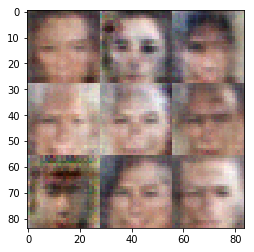

2201.2202.2203.2204.2205.2206.2207.2208.2209.2210.Epoch 1/5... Discriminator Loss: 1.0390... Generator Loss: 1.1095
2211.2212.2213.2214.2215.2216.2217.2218.2219.2220.Epoch 1/5... Discriminator Loss: 1.2615... Generator Loss: 0.6743
2221.2222.2223.2224.2225.2226.2227.2228.2229.2230.Epoch 1/5... Discriminator Loss: 1.3013... Generator Loss: 0.8581
2231.2232.2233.2234.2235.2236.2237.2238.2239.2240.Epoch 1/5... Discriminator Loss: 0.4338... Generator Loss: 1.6440
2241.2242.2243.2244.2245.2246.2247.2248.2249.2250.Epoch 1/5... Discriminator Loss: 0.0521... Generator Loss: 4.9819
2251.2252.2253.2254.2255.2256.2257.2258.2259.2260.Epoch 1/5... Discriminator Loss: 0.3762... Generator Loss: 1.6442
2261.2262.2263.2264.2265.2266.2267.2268.2269.2270.Epoch 1/5... Discriminator Loss: 1.1825... Generator Loss: 2.3485
2271.2272.2273.2274.2275.2276.2277.2278.2279.2280.Epoch 1/5... Discriminator Loss: 0.7955... Generator Loss: 1.7386
2281.2282.2283.2284.2285.2286.2287.2288.2289.2290.Epoch 1/5... Discrimin

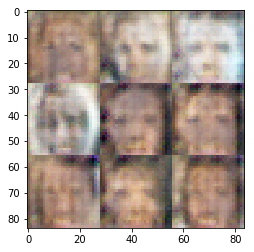

2301.2302.2303.2304.2305.2306.2307.2308.2309.2310.Epoch 1/5... Discriminator Loss: 1.2204... Generator Loss: 0.5955
2311.2312.2313.2314.2315.2316.2317.2318.2319.2320.Epoch 1/5... Discriminator Loss: 0.0508... Generator Loss: 5.5254
2321.2322.2323.2324.2325.2326.2327.2328.2329.2330.Epoch 1/5... Discriminator Loss: 1.0088... Generator Loss: 0.6252
2331.2332.2333.2334.2335.2336.2337.2338.2339.2340.Epoch 1/5... Discriminator Loss: 1.4320... Generator Loss: 0.5808
2341.2342.2343.2344.2345.2346.2347.2348.2349.2350.Epoch 1/5... Discriminator Loss: 0.7458... Generator Loss: 2.1963
2351.2352.2353.2354.2355.2356.2357.2358.2359.2360.Epoch 1/5... Discriminator Loss: 0.0111... Generator Loss: 9.1656
2361.2362.2363.2364.2365.2366.2367.2368.2369.2370.Epoch 1/5... Discriminator Loss: 1.2213... Generator Loss: 0.4871
2371.2372.2373.2374.2375.2376.2377.2378.2379.2380.Epoch 1/5... Discriminator Loss: 1.5212... Generator Loss: 5.6670
2381.2382.2383.2384.2385.2386.2387.2388.2389.2390.Epoch 1/5... Discrimin

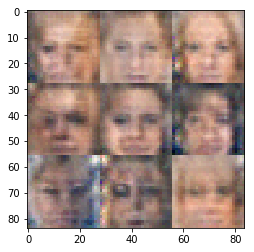

2401.2402.2403.2404.2405.2406.2407.2408.2409.2410.Epoch 1/5... Discriminator Loss: 1.1241... Generator Loss: 0.8693
2411.2412.2413.2414.2415.2416.2417.2418.2419.2420.Epoch 1/5... Discriminator Loss: 1.1283... Generator Loss: 0.7621
2421.2422.2423.2424.2425.2426.2427.2428.2429.2430.Epoch 1/5... Discriminator Loss: 1.3557... Generator Loss: 0.6109
2431.2432.2433.2434.2435.2436.2437.2438.2439.2440.Epoch 1/5... Discriminator Loss: 1.0321... Generator Loss: 0.7125
2441.2442.2443.2444.2445.2446.2447.2448.2449.2450.Epoch 1/5... Discriminator Loss: 1.3005... Generator Loss: 1.1165
2451.2452.2453.2454.2455.2456.2457.2458.2459.2460.Epoch 1/5... Discriminator Loss: 0.8933... Generator Loss: 0.9436
2461.2462.2463.2464.2465.2466.2467.2468.2469.2470.Epoch 1/5... Discriminator Loss: 0.1579... Generator Loss: 6.1946
2471.2472.2473.2474.2475.2476.2477.2478.2479.2480.Epoch 1/5... Discriminator Loss: 2.6542... Generator Loss: 0.1097
2481.2482.2483.2484.2485.2486.2487.2488.2489.2490.Epoch 1/5... Discrimin

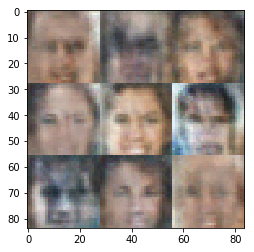

2501.2502.2503.2504.2505.2506.2507.2508.2509.2510.Epoch 1/5... Discriminator Loss: 0.5744... Generator Loss: 4.2362
2511.2512.2513.2514.2515.2516.2517.2518.2519.2520.Epoch 1/5... Discriminator Loss: 0.0413... Generator Loss: 4.6015
2521.2522.2523.2524.2525.2526.2527.2528.2529.2530.Epoch 1/5... Discriminator Loss: 0.0389... Generator Loss: 3.7799
2531.2532.2533.2534.2535.2536.2537.2538.2539.2540.Epoch 1/5... Discriminator Loss: 0.8435... Generator Loss: 1.6918
2541.2542.2543.2544.2545.2546.2547.2548.2549.2550.Epoch 1/5... Discriminator Loss: 0.2967... Generator Loss: 1.6962
2551.2552.2553.2554.2555.2556.2557.2558.2559.2560.Epoch 1/5... Discriminator Loss: 0.1175... Generator Loss: 7.4407
2561.2562.2563.2564.2565.2566.2567.2568.2569.2570.Epoch 1/5... Discriminator Loss: 1.3396... Generator Loss: 0.3924
2571.2572.2573.2574.2575.2576.2577.2578.2579.2580.Epoch 1/5... Discriminator Loss: 0.2993... Generator Loss: 4.6542
2581.2582.2583.2584.2585.2586.2587.2588.2589.2590.Epoch 1/5... Discrimin

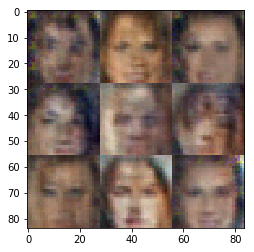

2601.2602.2603.2604.2605.2606.2607.2608.2609.2610.Epoch 1/5... Discriminator Loss: 1.3167... Generator Loss: 0.9056
2611.2612.2613.2614.2615.2616.2617.2618.2619.2620.Epoch 1/5... Discriminator Loss: 0.8178... Generator Loss: 3.7707
2621.2622.2623.2624.2625.2626.2627.2628.2629.2630.Epoch 1/5... Discriminator Loss: 0.5078... Generator Loss: 3.5874
2631.2632.2633.2634.2635.2636.2637.2638.2639.2640.Epoch 1/5... Discriminator Loss: 0.1322... Generator Loss: 9.8728
2641.2642.2643.2644.2645.2646.2647.2648.2649.2650.Epoch 1/5... Discriminator Loss: 0.5807... Generator Loss: 1.6111
2651.2652.2653.2654.2655.2656.2657.2658.2659.2660.Epoch 1/5... Discriminator Loss: 1.9269... Generator Loss: 0.5273
2661.2662.2663.2664.2665.2666.2667.2668.2669.2670.Epoch 1/5... Discriminator Loss: 1.1064... Generator Loss: 0.7394
2671.2672.2673.2674.2675.2676.2677.2678.2679.2680.Epoch 1/5... Discriminator Loss: 1.0184... Generator Loss: 0.8160
2681.2682.2683.2684.2685.2686.2687.2688.2689.2690.Epoch 1/5... Discrimin

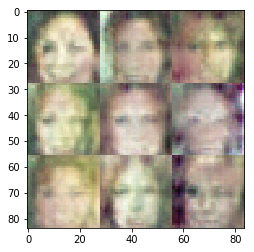

2701.2702.2703.2704.2705.2706.2707.2708.2709.2710.Epoch 1/5... Discriminator Loss: 0.7840... Generator Loss: 6.6066
2711.2712.2713.2714.2715.2716.2717.2718.2719.2720.Epoch 1/5... Discriminator Loss: 1.4964... Generator Loss: 0.3575
2721.2722.2723.2724.2725.2726.2727.2728.2729.2730.Epoch 1/5... Discriminator Loss: 1.2837... Generator Loss: 0.5127
2731.2732.2733.2734.2735.2736.2737.2738.2739.2740.Epoch 1/5... Discriminator Loss: 0.9118... Generator Loss: 0.7498
2741.2742.2743.2744.2745.2746.2747.2748.2749.2750.Epoch 1/5... Discriminator Loss: 1.5175... Generator Loss: 0.8065
2751.2752.2753.2754.2755.2756.2757.2758.2759.2760.Epoch 1/5... Discriminator Loss: 0.5295... Generator Loss: 3.3139
2761.2762.2763.2764.2765.2766.2767.2768.2769.2770.Epoch 1/5... Discriminator Loss: 1.7459... Generator Loss: 1.4716
2771.2772.2773.2774.2775.2776.2777.2778.2779.2780.Epoch 1/5... Discriminator Loss: 1.8446... Generator Loss: 1.4365
2781.2782.2783.2784.2785.2786.2787.2788.2789.2790.Epoch 1/5... Discrimin

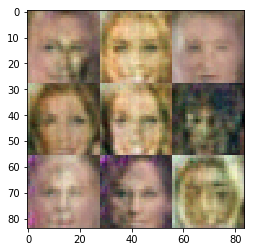

2801.2802.2803.2804.2805.2806.2807.2808.2809.2810.Epoch 1/5... Discriminator Loss: 0.1928... Generator Loss: 2.8287
2811.2812.2813.2814.2815.2816.2817.2818.2819.2820.Epoch 1/5... Discriminator Loss: 0.3931... Generator Loss: 1.4544
2821.2822.2823.2824.2825.2826.2827.2828.2829.2830.Epoch 1/5... Discriminator Loss: 0.8287... Generator Loss: 0.7295
2831.2832.2833.2834.2835.2836.2837.2838.2839.2840.Epoch 1/5... Discriminator Loss: 0.0012... Generator Loss: 11.9059
2841.2842.2843.2844.2845.2846.2847.2848.2849.2850.Epoch 1/5... Discriminator Loss: 0.5587... Generator Loss: 1.5631
2851.2852.2853.2854.2855.2856.2857.2858.2859.2860.Epoch 1/5... Discriminator Loss: 0.0042... Generator Loss: 8.6627
2861.2862.2863.2864.2865.2866.2867.2868.2869.2870.Epoch 1/5... Discriminator Loss: 0.0738... Generator Loss: 4.9964
2871.2872.2873.2874.2875.2876.2877.2878.2879.2880.Epoch 1/5... Discriminator Loss: 8.7095... Generator Loss: 8.3080
2881.2882.2883.2884.2885.2886.2887.2888.2889.2890.Epoch 1/5... Discrimi

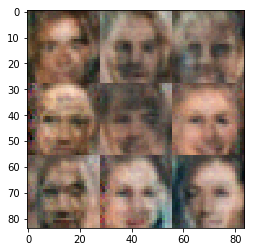

2901.2902.2903.2904.2905.2906.2907.2908.2909.2910.Epoch 1/5... Discriminator Loss: 1.4499... Generator Loss: 0.5098
2911.2912.2913.2914.2915.2916.2917.2918.2919.2920.Epoch 1/5... Discriminator Loss: 0.2987... Generator Loss: 2.5489
2921.2922.2923.2924.2925.2926.2927.2928.2929.2930.Epoch 1/5... Discriminator Loss: 1.0400... Generator Loss: 1.7954
2931.2932.2933.2934.2935.2936.2937.2938.2939.2940.Epoch 1/5... Discriminator Loss: 0.7041... Generator Loss: 3.5124
2941.2942.2943.2944.2945.2946.2947.2948.2949.2950.Epoch 1/5... Discriminator Loss: 1.2018... Generator Loss: 0.5529
2951.2952.2953.2954.2955.2956.2957.2958.2959.2960.Epoch 1/5... Discriminator Loss: 0.5663... Generator Loss: 1.7164
2961.2962.2963.2964.2965.2966.2967.2968.2969.2970.Epoch 1/5... Discriminator Loss: 1.1846... Generator Loss: 1.3428
2971.2972.2973.2974.2975.2976.2977.2978.2979.2980.Epoch 1/5... Discriminator Loss: 0.9201... Generator Loss: 1.0177
2981.2982.2983.2984.2985.2986.2987.2988.2989.2990.Epoch 1/5... Discrimin

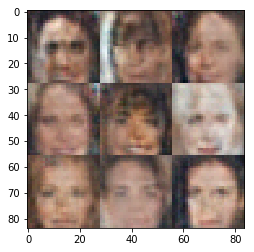

3001.3002.3003.3004.3005.3006.3007.3008.3009.3010.Epoch 1/5... Discriminator Loss: 0.8333... Generator Loss: 0.9018
3011.3012.3013.3014.3015.3016.3017.3018.3019.3020.Epoch 1/5... Discriminator Loss: 1.2902... Generator Loss: 0.4307
3021.3022.3023.3024.3025.3026.3027.3028.3029.3030.Epoch 1/5... Discriminator Loss: 0.3673... Generator Loss: 2.5438
3031.3032.3033.3034.3035.3036.3037.3038.3039.3040.Epoch 1/5... Discriminator Loss: 0.0667... Generator Loss: 6.7526
3041.3042.3043.3044.3045.3046.3047.3048.3049.3050.Epoch 1/5... Discriminator Loss: 1.3725... Generator Loss: 0.5126
3051.3052.3053.3054.3055.3056.3057.3058.3059.3060.Epoch 1/5... Discriminator Loss: 1.2703... Generator Loss: 0.6505
3061.3062.3063.3064.3065.3066.3067.3068.3069.3070.Epoch 1/5... Discriminator Loss: 1.1480... Generator Loss: 0.6405
3071.3072.3073.3074.3075.3076.3077.3078.3079.3080.Epoch 1/5... Discriminator Loss: 2.2628... Generator Loss: 0.2243
3081.3082.3083.3084.3085.3086.3087.3088.3089.3090.Epoch 1/5... Discrimin

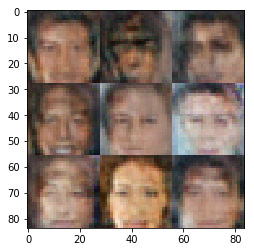

3101.3102.3103.3104.3105.3106.3107.3108.3109.3110.Epoch 1/5... Discriminator Loss: 0.0912... Generator Loss: 6.8382
3111.3112.3113.3114.3115.3116.3117.3118.3119.3120.Epoch 1/5... Discriminator Loss: 2.0582... Generator Loss: 0.6727
3121.3122.3123.3124.3125.3126.3127.3128.3129.3130.Epoch 1/5... Discriminator Loss: 2.0715... Generator Loss: 0.1877
3131.3132.3133.3134.3135.3136.3137.3138.3139.3140.Epoch 1/5... Discriminator Loss: 1.0078... Generator Loss: 0.8130
3141.3142.3143.3144.3145.3146.3147.3148.3149.3150.Epoch 1/5... Discriminator Loss: 0.4310... Generator Loss: 2.6081
3151.3152.3153.3154.3155.3156.3157.3158.3159.3160.Epoch 1/5... Discriminator Loss: 1.1291... Generator Loss: 1.8852
3161.3162.3163.3164.3165.3166.3167.3168.3169.3170.Epoch 1/5... Discriminator Loss: 0.6928... Generator Loss: 6.8163
3171.3172.3173.3174.3175.3176.3177.3178.3179.3180.Epoch 1/5... Discriminator Loss: 0.1493... Generator Loss: 3.2106
3181.3182.3183.3184.3185.3186.3187.3188.3189.3190.Epoch 1/5... Discrimin

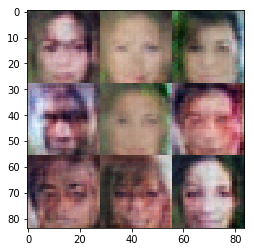

3201.3202.3203.3204.3205.3206.3207.3208.3209.3210.Epoch 1/5... Discriminator Loss: 0.1685... Generator Loss: 7.0362
3211.3212.3213.3214.3215.3216.3217.3218.3219.3220.Epoch 1/5... Discriminator Loss: 0.2041... Generator Loss: 3.3277
3221.3222.3223.3224.3225.3226.3227.3228.3229.3230.Epoch 1/5... Discriminator Loss: 0.4476... Generator Loss: 2.0161
3231.3232.3233.3234.3235.3236.3237.3238.3239.3240.Epoch 1/5... Discriminator Loss: 1.1516... Generator Loss: 3.2694
3241.3242.3243.3244.3245.3246.3247.3248.3249.3250.Epoch 1/5... Discriminator Loss: 1.5024... Generator Loss: 0.4966
3251.3252.3253.3254.3255.3256.3257.3258.3259.3260.Epoch 1/5... Discriminator Loss: 0.6204... Generator Loss: 1.1064
3261.3262.3263.3264.3265.3266.3267.3268.3269.3270.Epoch 1/5... Discriminator Loss: 1.0649... Generator Loss: 1.2134
3271.3272.3273.3274.3275.3276.3277.3278.3279.3280.Epoch 1/5... Discriminator Loss: 1.8069... Generator Loss: 0.2229
3281.3282.3283.3284.3285.3286.3287.3288.3289.3290.Epoch 1/5... Discrimin

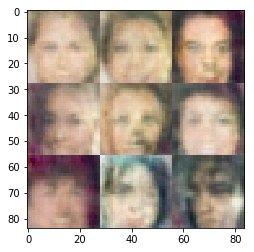

3301.3302.3303.3304.3305.3306.3307.3308.3309.3310.Epoch 1/5... Discriminator Loss: 0.8884... Generator Loss: 0.8747
3311.3312.3313.3314.3315.3316.3317.3318.3319.3320.Epoch 1/5... Discriminator Loss: 0.3899... Generator Loss: 2.2673
3321.3322.3323.3324.3325.3326.3327.3328.3329.3330.Epoch 1/5... Discriminator Loss: 1.1479... Generator Loss: 0.9978
3331.3332.3333.3334.3335.3336.3337.3338.3339.3340.Epoch 1/5... Discriminator Loss: 0.4697... Generator Loss: 1.4169
3341.3342.3343.3344.3345.3346.3347.3348.3349.3350.Epoch 1/5... Discriminator Loss: 2.3035... Generator Loss: 0.1324
3351.3352.3353.3354.3355.3356.3357.3358.3359.3360.Epoch 1/5... Discriminator Loss: 0.0316... Generator Loss: 4.2525
3361.3362.3363.3364.3365.3366.3367.3368.3369.3370.Epoch 1/5... Discriminator Loss: 0.0334... Generator Loss: 7.3371
3371.3372.3373.3374.3375.3376.3377.3378.3379.3380.Epoch 1/5... Discriminator Loss: 0.0946... Generator Loss: 8.1242
3381.3382.3383.3384.3385.3386.3387.3388.3389.3390.Epoch 1/5... Discrimin

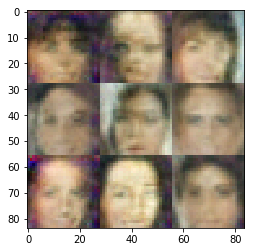

3401.3402.3403.3404.3405.3406.3407.3408.3409.3410.Epoch 1/5... Discriminator Loss: 1.4195... Generator Loss: 0.4173
3411.3412.3413.3414.3415.3416.3417.3418.3419.3420.Epoch 1/5... Discriminator Loss: 0.4947... Generator Loss: 1.4670
3421.3422.3423.3424.3425.3426.3427.3428.3429.3430.Epoch 1/5... Discriminator Loss: 0.6246... Generator Loss: 4.4002
3431.3432.3433.3434.3435.3436.3437.3438.3439.3440.Epoch 1/5... Discriminator Loss: 0.0352... Generator Loss: 7.6371
3441.3442.3443.3444.3445.3446.3447.3448.3449.3450.Epoch 1/5... Discriminator Loss: 0.1405... Generator Loss: 4.8036
3451.3452.3453.3454.3455.3456.3457.3458.3459.3460.Epoch 1/5... Discriminator Loss: 0.2918... Generator Loss: 1.7629
3461.3462.3463.3464.3465.3466.3467.3468.3469.3470.Epoch 1/5... Discriminator Loss: 0.2597... Generator Loss: 2.0205
3471.3472.3473.3474.3475.3476.3477.3478.3479.3480.Epoch 1/5... Discriminator Loss: 0.0105... Generator Loss: 8.2642
3481.3482.3483.3484.3485.3486.3487.3488.3489.3490.Epoch 1/5... Discrimin

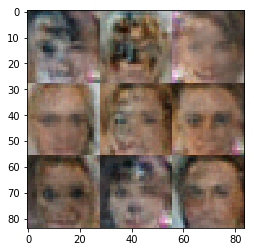

3501.3502.3503.3504.3505.3506.3507.3508.3509.3510.Epoch 1/5... Discriminator Loss: 1.0536... Generator Loss: 0.7166
3511.3512.3513.3514.3515.3516.3517.3518.3519.3520.Epoch 1/5... Discriminator Loss: 0.7060... Generator Loss: 1.2130
3521.3522.3523.3524.3525.3526.3527.3528.3529.3530.Epoch 1/5... Discriminator Loss: 1.1098... Generator Loss: 4.2714
3531.3532.3533.3534.3535.3536.3537.3538.3539.3540.Epoch 1/5... Discriminator Loss: 2.0316... Generator Loss: 0.2541
3541.3542.3543.3544.3545.3546.3547.3548.3549.3550.Epoch 1/5... Discriminator Loss: 0.4012... Generator Loss: 1.8772
3551.3552.3553.3554.3555.3556.3557.3558.3559.3560.Epoch 1/5... Discriminator Loss: 0.1180... Generator Loss: 2.6765
3561.3562.3563.3564.3565.3566.3567.3568.3569.3570.Epoch 1/5... Discriminator Loss: 0.0773... Generator Loss: 6.6254
3571.3572.3573.3574.3575.3576.3577.3578.3579.3580.Epoch 1/5... Discriminator Loss: 0.5218... Generator Loss: 1.7940
3581.3582.3583.3584.3585.3586.3587.3588.3589.3590.Epoch 1/5... Discrimin

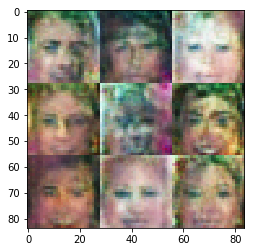

3601.3602.3603.3604.3605.3606.3607.3608.3609.3610.Epoch 1/5... Discriminator Loss: 0.0845... Generator Loss: 8.8236
3611.3612.3613.3614.3615.3616.3617.3618.3619.3620.Epoch 1/5... Discriminator Loss: 0.9979... Generator Loss: 0.9541
3621.3622.3623.3624.3625.3626.3627.3628.3629.3630.Epoch 1/5... Discriminator Loss: 0.0127... Generator Loss: 6.2962
3631.3632.3633.3634.3635.3636.3637.3638.3639.3640.Epoch 1/5... Discriminator Loss: 0.0217... Generator Loss: 10.1040
3641.3642.3643.3644.3645.3646.3647.3648.3649.3650.Epoch 1/5... Discriminator Loss: 0.3217... Generator Loss: 1.5105
3651.3652.3653.3654.3655.3656.3657.3658.3659.3660.Epoch 1/5... Discriminator Loss: 0.0614... Generator Loss: 5.3408
3661.3662.3663.3664.3665.3666.3667.3668.3669.3670.Epoch 1/5... Discriminator Loss: 0.0016... Generator Loss: 8.1545
3671.3672.3673.3674.3675.3676.3677.3678.3679.3680.Epoch 1/5... Discriminator Loss: 0.0745... Generator Loss: 4.4618
3681.3682.3683.3684.3685.3686.3687.3688.3689.3690.Epoch 1/5... Discrimi

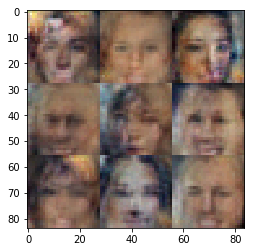

3701.3702.3703.3704.3705.3706.3707.3708.3709.3710.Epoch 1/5... Discriminator Loss: 2.8909... Generator Loss: 0.1009
3711.3712.3713.3714.3715.3716.3717.3718.3719.3720.Epoch 1/5... Discriminator Loss: 0.5649... Generator Loss: 2.3819
3721.3722.3723.3724.3725.3726.3727.3728.3729.3730.Epoch 1/5... Discriminator Loss: 1.2264... Generator Loss: 0.7491
3731.3732.3733.3734.3735.3736.3737.3738.3739.3740.Epoch 1/5... Discriminator Loss: 1.5336... Generator Loss: 0.4133
3741.3742.3743.3744.3745.3746.3747.3748.3749.3750.Epoch 1/5... Discriminator Loss: 1.2420... Generator Loss: 0.6765
3751.3752.3753.3754.3755.3756.3757.3758.3759.3760.Epoch 1/5... Discriminator Loss: 1.1608... Generator Loss: 0.9698
3761.3762.3763.3764.3765.3766.3767.3768.3769.3770.Epoch 1/5... Discriminator Loss: 1.2781... Generator Loss: 1.1576
3771.3772.3773.3774.3775.3776.3777.3778.3779.3780.Epoch 1/5... Discriminator Loss: 1.0175... Generator Loss: 0.6726
3781.3782.3783.3784.3785.3786.3787.3788.3789.3790.Epoch 1/5... Discrimin

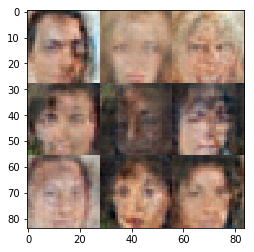

3801.3802.3803.3804.3805.3806.3807.3808.3809.3810.Epoch 1/5... Discriminator Loss: 1.4953... Generator Loss: 1.2110
3811.3812.3813.3814.3815.3816.3817.3818.3819.3820.Epoch 1/5... Discriminator Loss: 1.3011... Generator Loss: 0.9788
3821.3822.3823.3824.3825.3826.3827.3828.3829.3830.Epoch 1/5... Discriminator Loss: 1.1885... Generator Loss: 0.6656
3831.3832.3833.3834.3835.3836.3837.3838.3839.3840.Epoch 1/5... Discriminator Loss: 1.2198... Generator Loss: 0.6401
3841.3842.3843.3844.3845.3846.3847.3848.3849.3850.Epoch 1/5... Discriminator Loss: 1.1575... Generator Loss: 0.6702
3851.3852.3853.3854.3855.3856.3857.3858.3859.3860.Epoch 1/5... Discriminator Loss: 1.6726... Generator Loss: 0.3203
3861.3862.3863.3864.3865.3866.3867.3868.3869.3870.Epoch 1/5... Discriminator Loss: 1.1939... Generator Loss: 1.0753
3871.3872.3873.3874.3875.3876.3877.3878.3879.3880.Epoch 1/5... Discriminator Loss: 1.4558... Generator Loss: 0.4748
3881.3882.3883.3884.3885.3886.3887.3888.3889.3890.Epoch 1/5... Discrimin

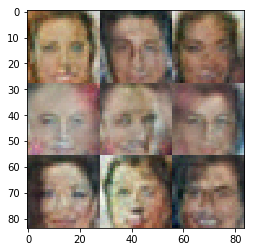

3901.3902.3903.3904.3905.3906.3907.3908.3909.3910.Epoch 1/5... Discriminator Loss: 0.7039... Generator Loss: 2.7214
3911.3912.3913.3914.3915.3916.3917.3918.3919.3920.Epoch 1/5... Discriminator Loss: 2.3531... Generator Loss: 0.2256
3921.3922.3923.3924.3925.3926.3927.3928.3929.3930.Epoch 1/5... Discriminator Loss: 0.1337... Generator Loss: 3.4602
3931.3932.3933.3934.3935.3936.3937.3938.3939.3940.Epoch 1/5... Discriminator Loss: 1.2784... Generator Loss: 0.6331
3941.3942.3943.3944.3945.3946.3947.3948.3949.3950.Epoch 1/5... Discriminator Loss: 1.0076... Generator Loss: 0.7102
3951.3952.3953.3954.3955.3956.3957.3958.3959.3960.Epoch 1/5... Discriminator Loss: 0.1924... Generator Loss: 8.8297
3961.3962.3963.3964.3965.3966.3967.3968.3969.3970.Epoch 1/5... Discriminator Loss: 0.1829... Generator Loss: 6.6308
3971.3972.3973.3974.3975.3976.3977.3978.3979.3980.Epoch 1/5... Discriminator Loss: 0.1791... Generator Loss: 3.7891
3981.3982.3983.3984.3985.3986.3987.3988.3989.3990.Epoch 1/5... Discrimin

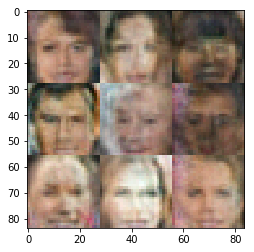

4001.4002.4003.4004.4005.4006.4007.4008.4009.4010.Epoch 1/5... Discriminator Loss: 1.4303... Generator Loss: 0.3715
4011.4012.4013.4014.4015.4016.4017.4018.4019.4020.Epoch 1/5... Discriminator Loss: 0.2404... Generator Loss: 3.1347
4021.4022.4023.4024.4025.4026.4027.4028.4029.4030.Epoch 1/5... Discriminator Loss: 0.0139... Generator Loss: 6.1906
4031.4032.4033.4034.4035.4036.4037.4038.4039.4040.Epoch 1/5... Discriminator Loss: 0.2830... Generator Loss: 2.0836
4041.4042.4043.4044.4045.4046.4047.4048.4049.4050.Epoch 1/5... Discriminator Loss: 0.0779... Generator Loss: 3.1078
4051.4052.4053.4054.4055.4056.4057.4058.4059.4060.Epoch 1/5... Discriminator Loss: 0.1000... Generator Loss: 4.5564
4061.4062.4063.4064.4065.4066.4067.4068.4069.4070.Epoch 1/5... Discriminator Loss: 0.1711... Generator Loss: 3.6631
4071.4072.4073.4074.4075.4076.4077.4078.4079.4080.Epoch 1/5... Discriminator Loss: 0.2704... Generator Loss: 3.1673
4081.4082.4083.4084.4085.4086.4087.4088.4089.4090.Epoch 1/5... Discrimin

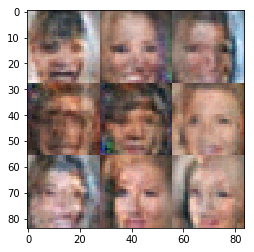

4101.4102.4103.4104.4105.4106.4107.4108.4109.4110.Epoch 1/5... Discriminator Loss: 2.6793... Generator Loss: 0.0967
4111.4112.4113.4114.4115.4116.4117.4118.4119.4120.Epoch 1/5... Discriminator Loss: 0.0383... Generator Loss: 4.7394
4121.4122.4123.4124.4125.4126.4127.4128.4129.4130.Epoch 1/5... Discriminator Loss: 0.1636... Generator Loss: 2.5922
4131.4132.4133.4134.4135.4136.4137.4138.4139.4140.Epoch 1/5... Discriminator Loss: 2.4313... Generator Loss: 0.2532
4141.4142.4143.4144.4145.4146.4147.4148.4149.4150.Epoch 1/5... Discriminator Loss: 1.1297... Generator Loss: 0.5830
4151.4152.4153.4154.4155.4156.4157.4158.4159.4160.Epoch 1/5... Discriminator Loss: 0.4966... Generator Loss: 4.1223
4161.4162.4163.4164.4165.4166.4167.4168.4169.4170.Epoch 1/5... Discriminator Loss: 0.9223... Generator Loss: 0.9665
4171.4172.4173.4174.4175.4176.4177.4178.4179.4180.Epoch 1/5... Discriminator Loss: 0.0846... Generator Loss: 2.8563
4181.4182.4183.4184.4185.4186.4187.4188.4189.4190.Epoch 1/5... Discrimin

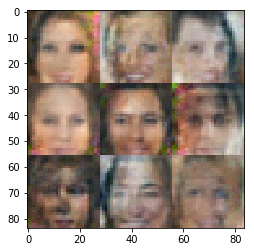

4201.4202.4203.4204.4205.4206.4207.4208.4209.4210.Epoch 1/5... Discriminator Loss: 0.0935... Generator Loss: 6.4154
4211.4212.4213.4214.4215.4216.4217.4218.4219.4220.Epoch 1/5... Discriminator Loss: 0.0142... Generator Loss: 9.3678
4221.4222.4223.4224.4225.4226.4227.4228.4229.4230.Epoch 1/5... Discriminator Loss: 0.6373... Generator Loss: 1.4796
4231.4232.4233.4234.4235.4236.4237.4238.4239.4240.Epoch 1/5... Discriminator Loss: 1.1067... Generator Loss: 1.2766
4241.4242.4243.4244.4245.4246.4247.4248.4249.4250.Epoch 1/5... Discriminator Loss: 2.0402... Generator Loss: 0.2039
4251.4252.4253.4254.4255.4256.4257.4258.4259.4260.Epoch 1/5... Discriminator Loss: 0.3003... Generator Loss: 3.6330
4261.4262.4263.4264.4265.4266.4267.4268.4269.4270.Epoch 1/5... Discriminator Loss: 0.0173... Generator Loss: 6.4490
4271.4272.4273.4274.4275.4276.4277.4278.4279.4280.Epoch 1/5... Discriminator Loss: 0.1143... Generator Loss: 2.5589
4281.4282.4283.4284.4285.4286.4287.4288.4289.4290.Epoch 1/5... Discrimin

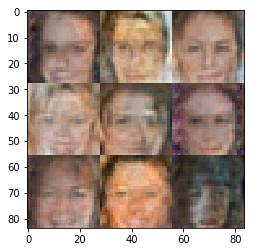

4301.4302.4303.4304.4305.4306.4307.4308.4309.4310.Epoch 1/5... Discriminator Loss: 1.2484... Generator Loss: 0.8138
4311.4312.4313.4314.4315.4316.4317.4318.4319.4320.Epoch 1/5... Discriminator Loss: 2.0623... Generator Loss: 0.2305
4321.4322.4323.4324.4325.4326.4327.4328.4329.4330.Epoch 1/5... Discriminator Loss: 2.2368... Generator Loss: 0.1780
4331.4332.4333.4334.4335.4336.4337.4338.4339.4340.Epoch 1/5... Discriminator Loss: 0.9823... Generator Loss: 0.6628
4341.4342.4343.4344.4345.4346.4347.4348.4349.4350.Epoch 1/5... Discriminator Loss: 0.6655... Generator Loss: 1.0364
4351.4352.4353.4354.4355.4356.4357.4358.4359.4360.Epoch 1/5... Discriminator Loss: 1.7586... Generator Loss: 0.2919
4361.4362.4363.4364.4365.4366.4367.4368.4369.4370.Epoch 1/5... Discriminator Loss: 0.0794... Generator Loss: 3.1750
4371.4372.4373.4374.4375.4376.4377.4378.4379.4380.Epoch 1/5... Discriminator Loss: 0.0581... Generator Loss: 4.3282
4381.4382.4383.4384.4385.4386.4387.4388.4389.4390.Epoch 1/5... Discrimin

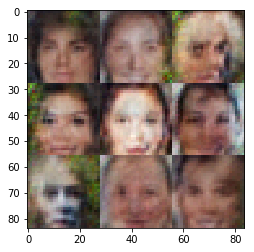

4401.4402.4403.4404.4405.4406.4407.4408.4409.4410.Epoch 1/5... Discriminator Loss: 1.6241... Generator Loss: 0.3429
4411.4412.4413.4414.4415.4416.4417.4418.4419.4420.Epoch 1/5... Discriminator Loss: 0.0504... Generator Loss: 9.1033
4421.4422.4423.4424.4425.4426.4427.4428.4429.4430.Epoch 1/5... Discriminator Loss: 0.0091... Generator Loss: 9.3405
4431.4432.4433.4434.4435.4436.4437.4438.4439.4440.Epoch 1/5... Discriminator Loss: 0.6105... Generator Loss: 0.9260
4441.4442.4443.4444.4445.4446.4447.4448.4449.4450.Epoch 1/5... Discriminator Loss: 0.2817... Generator Loss: 2.9783
4451.4452.4453.4454.4455.4456.4457.4458.4459.4460.Epoch 1/5... Discriminator Loss: 2.0678... Generator Loss: 9.9599
4461.4462.4463.4464.4465.4466.4467.4468.4469.4470.Epoch 1/5... Discriminator Loss: 0.0257... Generator Loss: 9.4178
4471.4472.4473.4474.4475.4476.4477.4478.4479.4480.Epoch 1/5... Discriminator Loss: 1.4153... Generator Loss: 5.2433
4481.4482.4483.4484.4485.4486.4487.4488.4489.4490.Epoch 1/5... Discrimin

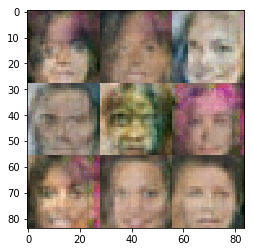

4501.4502.4503.4504.4505.4506.4507.4508.4509.4510.Epoch 1/5... Discriminator Loss: 0.3805... Generator Loss: 1.4318
4511.4512.4513.4514.4515.4516.4517.4518.4519.4520.Epoch 1/5... Discriminator Loss: 0.1181... Generator Loss: 7.2633
4521.4522.4523.4524.4525.4526.4527.4528.4529.4530.Epoch 1/5... Discriminator Loss: 1.9295... Generator Loss: 5.8518
4531.4532.4533.4534.4535.4536.4537.4538.4539.4540.Epoch 1/5... Discriminator Loss: 0.0583... Generator Loss: 7.3708
4541.4542.4543.4544.4545.4546.4547.4548.4549.4550.Epoch 1/5... Discriminator Loss: 0.0412... Generator Loss: 3.6744
4551.4552.4553.4554.4555.4556.4557.4558.4559.4560.Epoch 1/5... Discriminator Loss: 0.1544... Generator Loss: 3.8565
4561.4562.4563.4564.4565.4566.4567.4568.4569.4570.Epoch 1/5... Discriminator Loss: 2.8432... Generator Loss: 0.0838
4571.4572.4573.4574.4575.4576.4577.4578.4579.4580.Epoch 1/5... Discriminator Loss: 0.1044... Generator Loss: 2.6002
4581.4582.4583.4584.4585.4586.4587.4588.4589.4590.Epoch 1/5... Discrimin

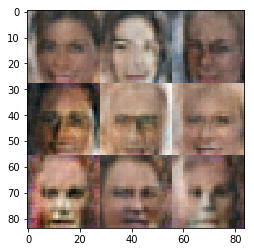

4601.4602.4603.4604.4605.4606.4607.4608.4609.4610.Epoch 1/5... Discriminator Loss: 3.6819... Generator Loss: 0.0418
4611.4612.4613.4614.4615.4616.4617.4618.4619.4620.Epoch 1/5... Discriminator Loss: 1.9483... Generator Loss: 0.2092
4621.4622.4623.4624.4625.4626.4627.4628.4629.4630.Epoch 1/5... Discriminator Loss: 0.4993... Generator Loss: 3.1474
4631.4632.4633.4634.4635.4636.4637.4638.4639.4640.Epoch 1/5... Discriminator Loss: 3.6487... Generator Loss: 0.0613
4641.4642.4643.4644.4645.4646.4647.4648.4649.4650.Epoch 1/5... Discriminator Loss: 0.1912... Generator Loss: 4.0881
4651.4652.4653.4654.4655.4656.4657.4658.4659.4660.Epoch 1/5... Discriminator Loss: 0.0691... Generator Loss: 7.1135
4661.4662.4663.4664.4665.4666.4667.4668.4669.4670.Epoch 1/5... Discriminator Loss: 0.0303... Generator Loss: 9.5360
4671.4672.4673.4674.4675.4676.4677.4678.4679.4680.Epoch 1/5... Discriminator Loss: 0.4212... Generator Loss: 1.8009
4681.4682.4683.4684.4685.4686.4687.4688.4689.4690.Epoch 1/5... Discrimin

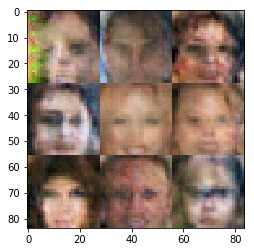

4701.4702.4703.4704.4705.4706.4707.4708.4709.4710.Epoch 1/5... Discriminator Loss: 0.0149... Generator Loss: 5.8261
4711.4712.4713.4714.4715.4716.4717.4718.4719.4720.Epoch 1/5... Discriminator Loss: 0.8035... Generator Loss: 4.5455
4721.4722.4723.4724.4725.4726.4727.4728.4729.4730.Epoch 1/5... Discriminator Loss: 0.1698... Generator Loss: 6.5225
4731.4732.4733.4734.4735.4736.4737.4738.4739.4740.Epoch 1/5... Discriminator Loss: 0.3317... Generator Loss: 2.2515
4741.4742.4743.4744.4745.4746.4747.4748.4749.4750.Epoch 1/5... Discriminator Loss: 0.1056... Generator Loss: 3.1593
4751.4752.4753.4754.4755.4756.4757.4758.4759.4760.Epoch 1/5... Discriminator Loss: 2.7614... Generator Loss: 7.6657
4761.4762.4763.4764.4765.4766.4767.4768.4769.4770.Epoch 1/5... Discriminator Loss: 2.4442... Generator Loss: 0.2333
4771.4772.4773.4774.4775.4776.4777.4778.4779.4780.Epoch 1/5... Discriminator Loss: 1.0240... Generator Loss: 0.8229
4781.4782.4783.4784.4785.4786.4787.4788.4789.4790.Epoch 1/5... Discrimin

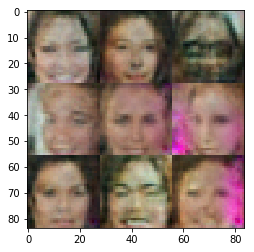

4801.4802.4803.4804.4805.4806.4807.4808.4809.4810.Epoch 1/5... Discriminator Loss: 0.8236... Generator Loss: 0.7209
4811.4812.4813.4814.4815.4816.4817.4818.4819.4820.Epoch 1/5... Discriminator Loss: 1.6509... Generator Loss: 0.3671
4821.4822.4823.4824.4825.4826.4827.4828.4829.4830.Epoch 1/5... Discriminator Loss: 0.0704... Generator Loss: 3.2763
4831.4832.4833.4834.4835.4836.4837.4838.4839.4840.Epoch 1/5... Discriminator Loss: 3.5558... Generator Loss: 0.0526
4841.4842.4843.4844.4845.4846.4847.4848.4849.4850.Epoch 1/5... Discriminator Loss: 1.6176... Generator Loss: 0.4502
4851.4852.4853.4854.4855.4856.4857.4858.4859.4860.Epoch 1/5... Discriminator Loss: 1.1817... Generator Loss: 0.8882
4861.4862.4863.4864.4865.4866.4867.4868.4869.4870.Epoch 1/5... Discriminator Loss: 1.2946... Generator Loss: 0.6146
4871.4872.4873.4874.4875.4876.4877.4878.4879.4880.Epoch 1/5... Discriminator Loss: 1.4540... Generator Loss: 0.4444
4881.4882.4883.4884.4885.4886.4887.4888.4889.4890.Epoch 1/5... Discrimin

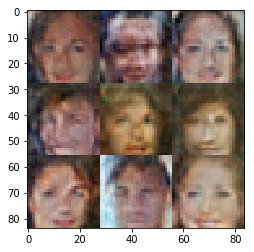

4901.4902.4903.4904.4905.4906.4907.4908.4909.4910.Epoch 1/5... Discriminator Loss: 1.5393... Generator Loss: 0.5072
4911.4912.4913.4914.4915.4916.4917.4918.4919.4920.Epoch 1/5... Discriminator Loss: 1.5289... Generator Loss: 0.5945
4921.4922.4923.4924.4925.4926.4927.4928.4929.4930.Epoch 1/5... Discriminator Loss: 1.1460... Generator Loss: 0.7675
4931.4932.4933.4934.4935.4936.4937.4938.4939.4940.Epoch 1/5... Discriminator Loss: 1.3992... Generator Loss: 0.5172
4941.4942.4943.4944.4945.4946.4947.4948.4949.4950.Epoch 1/5... Discriminator Loss: 1.1662... Generator Loss: 0.6994
4951.4952.4953.4954.4955.4956.4957.4958.4959.4960.Epoch 1/5... Discriminator Loss: 1.3657... Generator Loss: 0.5495
4961.4962.4963.4964.4965.4966.4967.4968.4969.4970.Epoch 1/5... Discriminator Loss: 1.4941... Generator Loss: 0.4111
4971.4972.4973.4974.4975.4976.4977.4978.4979.4980.Epoch 1/5... Discriminator Loss: 1.3752... Generator Loss: 0.7858
4981.4982.4983.4984.4985.4986.4987.4988.4989.4990.Epoch 1/5... Discrimin

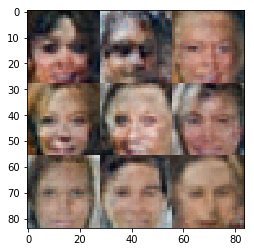

5001.5002.5003.5004.5005.5006.5007.5008.5009.5010.Epoch 1/5... Discriminator Loss: 1.1975... Generator Loss: 0.7161
5011.5012.5013.5014.5015.5016.5017.5018.5019.5020.Epoch 1/5... Discriminator Loss: 0.9707... Generator Loss: 0.9632
5021.5022.5023.5024.5025.5026.5027.5028.5029.5030.Epoch 1/5... Discriminator Loss: 1.5800... Generator Loss: 0.3480
5031.5032.5033.5034.5035.5036.5037.5038.5039.5040.Epoch 1/5... Discriminator Loss: 1.4944... Generator Loss: 0.4077
5041.5042.5043.5044.5045.5046.5047.5048.5049.5050.Epoch 1/5... Discriminator Loss: 1.7269... Generator Loss: 0.4831
5051.5052.5053.5054.5055.5056.5057.5058.5059.5060.Epoch 1/5... Discriminator Loss: 1.2956... Generator Loss: 0.5366
5061.5062.5063.5064.5065.5066.5067.5068.5069.5070.Epoch 1/5... Discriminator Loss: 1.4209... Generator Loss: 0.4441
5071.5072.5073.5074.5075.5076.5077.5078.5079.5080.Epoch 1/5... Discriminator Loss: 1.3933... Generator Loss: 0.5335
5081.5082.5083.5084.5085.5086.5087.5088.5089.5090.Epoch 1/5... Discrimin

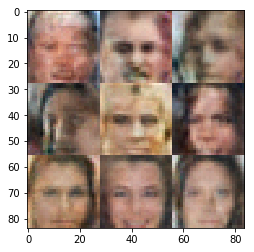

5101.5102.5103.5104.5105.5106.5107.5108.5109.5110.Epoch 1/5... Discriminator Loss: 1.4131... Generator Loss: 0.7632
5111.5112.5113.5114.5115.5116.5117.5118.5119.5120.Epoch 1/5... Discriminator Loss: 1.3948... Generator Loss: 0.5358
5121.5122.5123.5124.5125.5126.5127.5128.5129.5130.Epoch 1/5... Discriminator Loss: 1.0361... Generator Loss: 0.9900
5131.5132.5133.5134.5135.5136.5137.5138.5139.5140.Epoch 1/5... Discriminator Loss: 1.1074... Generator Loss: 0.6444
5141.5142.5143.5144.5145.5146.5147.5148.5149.5150.Epoch 1/5... Discriminator Loss: 0.8998... Generator Loss: 2.3871
5151.5152.5153.5154.5155.5156.5157.5158.5159.5160.Epoch 1/5... Discriminator Loss: 1.5752... Generator Loss: 0.3688
5161.5162.5163.5164.5165.5166.5167.5168.5169.5170.Epoch 1/5... Discriminator Loss: 1.2451... Generator Loss: 0.8008
5171.5172.5173.5174.5175.5176.5177.5178.5179.5180.Epoch 1/5... Discriminator Loss: 1.0103... Generator Loss: 0.8176
5181.5182.5183.5184.5185.5186.5187.5188.5189.5190.Epoch 1/5... Discrimin

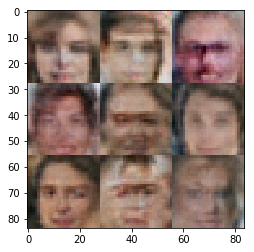

5201.5202.5203.5204.5205.5206.5207.5208.5209.5210.Epoch 1/5... Discriminator Loss: 1.5801... Generator Loss: 0.4494
5211.5212.5213.5214.5215.5216.5217.5218.5219.5220.Epoch 1/5... Discriminator Loss: 1.2923... Generator Loss: 0.5970
5221.5222.5223.5224.5225.5226.5227.5228.5229.5230.Epoch 1/5... Discriminator Loss: 0.9040... Generator Loss: 1.6245
5231.5232.5233.5234.5235.5236.5237.5238.5239.5240.Epoch 1/5... Discriminator Loss: 1.1166... Generator Loss: 0.7516
5241.5242.5243.5244.5245.5246.5247.5248.5249.5250.Epoch 1/5... Discriminator Loss: 1.3994... Generator Loss: 0.6720
5251.5252.5253.5254.5255.5256.5257.5258.5259.5260.Epoch 1/5... Discriminator Loss: 1.5854... Generator Loss: 0.3322
5261.5262.5263.5264.5265.5266.5267.5268.5269.5270.Epoch 1/5... Discriminator Loss: 1.2533... Generator Loss: 0.5309
5271.5272.5273.5274.5275.5276.5277.5278.5279.5280.Epoch 1/5... Discriminator Loss: 0.8501... Generator Loss: 1.1690
5281.5282.5283.5284.5285.5286.5287.5288.5289.5290.Epoch 1/5... Discrimin

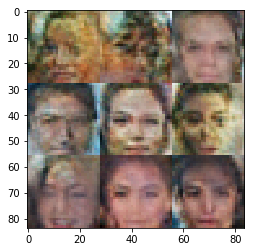

5301.5302.5303.5304.5305.5306.5307.5308.5309.5310.Epoch 1/5... Discriminator Loss: 1.2162... Generator Loss: 0.8316
5311.5312.5313.5314.5315.5316.5317.5318.5319.5320.Epoch 1/5... Discriminator Loss: 1.1301... Generator Loss: 0.7740
5321.5322.5323.5324.5325.5326.5327.5328.5329.5330.Epoch 1/5... Discriminator Loss: 1.1978... Generator Loss: 0.8404
5331.5332.5333.5334.5335.5336.5337.5338.5339.5340.Epoch 1/5... Discriminator Loss: 1.4338... Generator Loss: 0.3781
5341.5342.5343.5344.5345.5346.5347.5348.5349.5350.Epoch 1/5... Discriminator Loss: 1.1819... Generator Loss: 0.7473
5351.5352.5353.5354.5355.5356.5357.5358.5359.5360.Epoch 1/5... Discriminator Loss: 1.1610... Generator Loss: 0.5592
5361.5362.5363.5364.5365.5366.5367.5368.5369.5370.Epoch 1/5... Discriminator Loss: 0.7719... Generator Loss: 1.1225
5371.5372.5373.5374.5375.5376.5377.5378.5379.5380.Epoch 1/5... Discriminator Loss: 1.4822... Generator Loss: 0.4234
5381.5382.5383.5384.5385.5386.5387.5388.5389.5390.Epoch 1/5... Discrimin

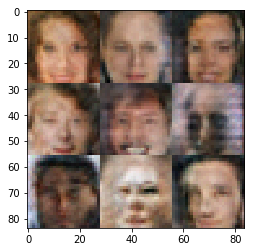

5401.5402.5403.5404.5405.5406.5407.5408.5409.5410.Epoch 1/5... Discriminator Loss: 1.4036... Generator Loss: 0.9376
5411.5412.5413.5414.5415.5416.5417.5418.5419.5420.Epoch 1/5... Discriminator Loss: 0.8156... Generator Loss: 1.3334
5421.5422.5423.5424.5425.5426.5427.5428.5429.5430.Epoch 1/5... Discriminator Loss: 0.4206... Generator Loss: 4.5162
5431.5432.5433.5434.5435.5436.5437.5438.5439.5440.Epoch 1/5... Discriminator Loss: 0.5265... Generator Loss: 1.9396
5441.5442.5443.5444.5445.5446.5447.5448.5449.5450.Epoch 1/5... Discriminator Loss: 0.1722... Generator Loss: 5.0811
5451.5452.5453.5454.5455.5456.5457.5458.5459.5460.Epoch 1/5... Discriminator Loss: 0.8507... Generator Loss: 0.8547
5461.5462.5463.5464.5465.5466.5467.5468.5469.5470.Epoch 1/5... Discriminator Loss: 0.4164... Generator Loss: 2.2863
5471.5472.5473.5474.5475.5476.5477.5478.5479.5480.Epoch 1/5... Discriminator Loss: 0.0785... Generator Loss: 6.3007
5481.5482.5483.5484.5485.5486.5487.5488.5489.5490.Epoch 1/5... Discrimin

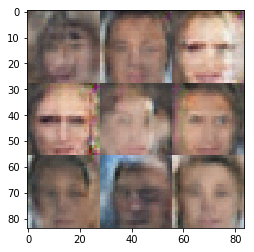

5501.5502.5503.5504.5505.5506.5507.5508.5509.5510.Epoch 1/5... Discriminator Loss: 1.2377... Generator Loss: 0.6163
5511.5512.5513.5514.5515.5516.5517.5518.5519.5520.Epoch 1/5... Discriminator Loss: 1.8740... Generator Loss: 0.2457
5521.5522.5523.5524.5525.5526.5527.5528.5529.5530.Epoch 1/5... Discriminator Loss: 0.2224... Generator Loss: 2.6088
5531.5532.5533.5534.5535.5536.5537.5538.5539.5540.Epoch 1/5... Discriminator Loss: 1.8265... Generator Loss: 4.0662
5541.5542.5543.5544.5545.5546.5547.5548.5549.5550.Epoch 1/5... Discriminator Loss: 2.2408... Generator Loss: 0.1495
5551.5552.5553.5554.5555.5556.5557.5558.5559.5560.Epoch 1/5... Discriminator Loss: 0.8520... Generator Loss: 0.7923
5561.5562.5563.5564.5565.5566.5567.5568.5569.5570.Epoch 1/5... Discriminator Loss: 0.8996... Generator Loss: 1.2654
5571.5572.5573.5574.5575.5576.5577.5578.5579.5580.Epoch 1/5... Discriminator Loss: 0.4806... Generator Loss: 1.8278
5581.5582.5583.5584.5585.5586.5587.5588.5589.5590.Epoch 1/5... Discrimin

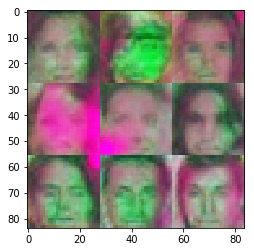

5601.5602.5603.5604.5605.5606.5607.5608.5609.5610.Epoch 1/5... Discriminator Loss: 0.2527... Generator Loss: 1.6689
5611.5612.5613.5614.5615.5616.5617.5618.5619.5620.Epoch 1/5... Discriminator Loss: 0.2068... Generator Loss: 2.6029
5621.5622.5623.5624.5625.5626.5627.5628.5629.5630.Epoch 1/5... Discriminator Loss: 0.2753... Generator Loss: 2.5280
5631.5632.5633.5634.5635.5636.5637.5638.5639.5640.Epoch 1/5... Discriminator Loss: 0.0340... Generator Loss: 7.8054
5641.5642.5643.5644.5645.5646.5647.5648.5649.5650.Epoch 1/5... Discriminator Loss: 0.9440... Generator Loss: 9.1915
5651.5652.5653.5654.5655.5656.5657.5658.5659.5660.Epoch 1/5... Discriminator Loss: 0.0908... Generator Loss: 3.6604
5661.5662.5663.5664.5665.5666.5667.5668.5669.5670.Epoch 1/5... Discriminator Loss: 4.3031... Generator Loss: 6.7502
5671.5672.5673.5674.5675.5676.5677.5678.5679.5680.Epoch 1/5... Discriminator Loss: 0.8799... Generator Loss: 0.8780
5681.5682.5683.5684.5685.5686.5687.5688.5689.5690.Epoch 1/5... Discrimin

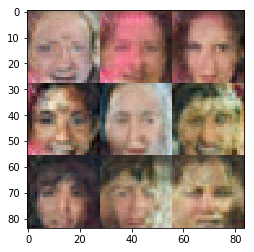

5701.5702.5703.5704.5705.5706.5707.5708.5709.5710.Epoch 1/5... Discriminator Loss: 0.6295... Generator Loss: 1.8901
5711.5712.5713.5714.5715.5716.5717.5718.5719.5720.Epoch 1/5... Discriminator Loss: 0.1696... Generator Loss: 4.1294
5721.5722.5723.5724.5725.5726.5727.5728.5729.5730.Epoch 1/5... Discriminator Loss: 0.3376... Generator Loss: 1.9537
5731.5732.5733.5734.5735.5736.5737.5738.5739.5740.Epoch 1/5... Discriminator Loss: 1.6754... Generator Loss: 0.3697
5741.5742.5743.5744.5745.5746.5747.5748.5749.5750.Epoch 1/5... Discriminator Loss: 1.3241... Generator Loss: 0.4591
5751.5752.5753.5754.5755.5756.5757.5758.5759.5760.Epoch 1/5... Discriminator Loss: 0.0859... Generator Loss: 5.2444
5761.5762.5763.5764.5765.5766.5767.5768.5769.5770.Epoch 1/5... Discriminator Loss: 1.0228... Generator Loss: 0.5340
5771.5772.5773.5774.5775.5776.5777.5778.5779.5780.Epoch 1/5... Discriminator Loss: 0.2205... Generator Loss: 3.2024
5781.5782.5783.5784.5785.5786.5787.5788.5789.5790.Epoch 1/5... Discrimin

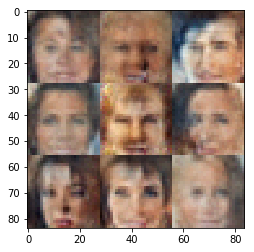

5801.5802.5803.5804.5805.5806.5807.5808.5809.5810.Epoch 1/5... Discriminator Loss: 0.0524... Generator Loss: 5.2502
5811.5812.5813.5814.5815.5816.5817.5818.5819.5820.Epoch 1/5... Discriminator Loss: 0.0872... Generator Loss: 3.4535
5821.5822.5823.5824.5825.5826.5827.5828.5829.5830.Epoch 1/5... Discriminator Loss: 0.1103... Generator Loss: 4.1904
5831.5832.5833.5834.5835.5836.5837.5838.5839.5840.Epoch 1/5... Discriminator Loss: 0.1266... Generator Loss: 11.2868
5841.5842.5843.5844.5845.5846.5847.5848.5849.5850.Epoch 1/5... Discriminator Loss: 2.0884... Generator Loss: 0.3155
5851.5852.5853.5854.5855.5856.5857.5858.5859.5860.Epoch 1/5... Discriminator Loss: 0.0486... Generator Loss: 4.6536
5861.5862.5863.5864.5865.5866.5867.5868.5869.5870.Epoch 1/5... Discriminator Loss: 0.0275... Generator Loss: 8.3765
5871.5872.5873.5874.5875.5876.5877.5878.5879.5880.Epoch 1/5... Discriminator Loss: 1.8106... Generator Loss: 0.2626
5881.5882.5883.5884.5885.5886.5887.5888.5889.5890.Epoch 1/5... Discrimi

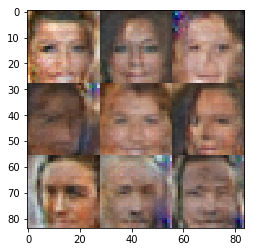

5901.5902.5903.5904.5905.5906.5907.5908.5909.5910.Epoch 1/5... Discriminator Loss: 1.8130... Generator Loss: 0.5339
5911.5912.5913.5914.5915.5916.5917.5918.5919.5920.Epoch 1/5... Discriminator Loss: 0.8449... Generator Loss: 1.3699
5921.5922.5923.5924.5925.5926.5927.5928.5929.5930.Epoch 1/5... Discriminator Loss: 0.0049... Generator Loss: 6.6143
5931.5932.5933.5934.5935.5936.5937.5938.5939.5940.Epoch 1/5... Discriminator Loss: 4.0584... Generator Loss: 0.2252
5941.5942.5943.5944.5945.5946.5947.5948.5949.5950.Epoch 1/5... Discriminator Loss: 1.7115... Generator Loss: 0.3058
5951.5952.5953.5954.5955.5956.5957.5958.5959.5960.Epoch 1/5... Discriminator Loss: 0.0201... Generator Loss: 4.6516
5961.5962.5963.5964.5965.5966.5967.5968.5969.5970.Epoch 1/5... Discriminator Loss: 0.0571... Generator Loss: 7.6429
5971.5972.5973.5974.5975.5976.5977.5978.5979.5980.Epoch 1/5... Discriminator Loss: 0.4258... Generator Loss: 1.6318
5981.5982.5983.5984.5985.5986.5987.5988.5989.5990.Epoch 1/5... Discrimin

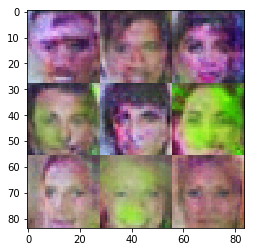

6001.6002.6003.6004.6005.6006.6007.6008.6009.6010.Epoch 1/5... Discriminator Loss: 0.1326... Generator Loss: 3.5652
6011.6012.6013.6014.6015.6016.6017.6018.6019.6020.Epoch 1/5... Discriminator Loss: 0.0587... Generator Loss: 4.7409
6021.6022.6023.6024.6025.6026.6027.6028.6029.6030.Epoch 1/5... Discriminator Loss: 0.3454... Generator Loss: 4.0560
6031.6032.6033.6034.6035.6036.6037.6038.6039.6040.Epoch 1/5... Discriminator Loss: 0.1157... Generator Loss: 7.1289
6041.6042.6043.6044.6045.6046.6047.6048.6049.6050.Epoch 1/5... Discriminator Loss: 0.0973... Generator Loss: 9.2590
6051.6052.6053.6054.6055.6056.6057.6058.6059.6060.Epoch 1/5... Discriminator Loss: 0.0532... Generator Loss: 7.8872
6061.6062.6063.6064.6065.6066.6067.6068.6069.6070.Epoch 1/5... Discriminator Loss: 0.0036... Generator Loss: 6.3381
6071.6072.6073.6074.6075.6076.6077.6078.6079.6080.Epoch 1/5... Discriminator Loss: 0.2881... Generator Loss: 3.4909
6081.6082.6083.6084.6085.6086.6087.6088.6089.6090.Epoch 1/5... Discrimin

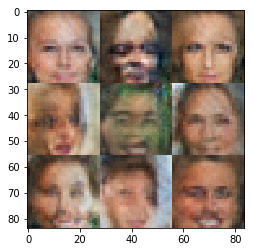

6101.6102.6103.6104.6105.6106.6107.6108.6109.6110.Epoch 1/5... Discriminator Loss: 0.2753... Generator Loss: 7.0516
6111.6112.6113.6114.6115.6116.6117.6118.6119.6120.Epoch 1/5... Discriminator Loss: 1.6552... Generator Loss: 4.7917
6121.6122.6123.6124.6125.6126.6127.6128.6129.6130.Epoch 1/5... Discriminator Loss: 0.8247... Generator Loss: 0.8322
6131.6132.6133.6134.6135.6136.6137.6138.6139.6140.Epoch 1/5... Discriminator Loss: 0.4079... Generator Loss: 1.6520
6141.6142.6143.6144.6145.6146.6147.6148.6149.6150.Epoch 1/5... Discriminator Loss: 0.6993... Generator Loss: 7.7235
6151.6152.6153.6154.6155.6156.6157.6158.6159.6160.Epoch 1/5... Discriminator Loss: 1.5841... Generator Loss: 0.4061
6161.6162.6163.6164.6165.6166.6167.6168.6169.6170.Epoch 1/5... Discriminator Loss: 0.8775... Generator Loss: 1.4066
6171.6172.6173.6174.6175.6176.6177.6178.6179.6180.Epoch 1/5... Discriminator Loss: 0.0905... Generator Loss: 5.0916
6181.6182.6183.6184.6185.6186.6187.6188.6189.6190.Epoch 1/5... Discrimin

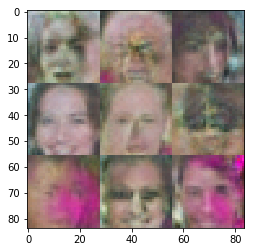

6201.6202.6203.6204.6205.6206.6207.6208.6209.6210.Epoch 1/5... Discriminator Loss: 1.7959... Generator Loss: 6.7580
6211.6212.6213.6214.6215.6216.6217.6218.6219.6220.Epoch 1/5... Discriminator Loss: 0.7697... Generator Loss: 1.0935
6221.6222.6223.6224.6225.6226.6227.6228.6229.6230.Epoch 1/5... Discriminator Loss: 0.6014... Generator Loss: 1.6456
6231.6232.6233.6234.6235.6236.6237.6238.6239.6240.Epoch 1/5... Discriminator Loss: 0.4357... Generator Loss: 2.0017
6241.6242.6243.6244.6245.6246.6247.6248.6249.6250.Epoch 1/5... Discriminator Loss: 0.3428... Generator Loss: 8.9996
6251.6252.6253.6254.6255.6256.6257.6258.6259.6260.Epoch 1/5... Discriminator Loss: 0.2014... Generator Loss: 2.8313
6261.6262.6263.6264.6265.6266.6267.6268.6269.6270.Epoch 1/5... Discriminator Loss: 0.6877... Generator Loss: 1.9783
6271.6272.6273.6274.6275.6276.6277.6278.6279.6280.Epoch 1/5... Discriminator Loss: 1.2800... Generator Loss: 3.7796
6281.6282.6283.6284.6285.6286.6287.6288.6289.6290.Epoch 1/5... Discrimin

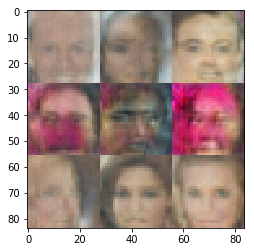

6301.6302.6303.6304.6305.6306.6307.6308.6309.6310.Epoch 1/5... Discriminator Loss: 0.0228... Generator Loss: 7.3481
6311.6312.6313.6314.6315.6316.6317.6318.6319.6320.Epoch 1/5... Discriminator Loss: 0.5468... Generator Loss: 9.9244
6321.6322.6323.6324.6325.6326.6327.6328.6329.6330.Epoch 1/5... Discriminator Loss: 0.0679... Generator Loss: 7.4960
6331.6332.6333.6334.6335.6336.6337.6338.6339.6340.Epoch 2/5... Discriminator Loss: 0.6161... Generator Loss: 1.2705
6341.6342.6343.6344.6345.6346.6347.6348.6349.6350.Epoch 2/5... Discriminator Loss: 2.1275... Generator Loss: 3.5599
6351.6352.6353.6354.6355.6356.6357.6358.6359.6360.Epoch 2/5... Discriminator Loss: 2.6062... Generator Loss: 0.1196
6361.6362.6363.6364.6365.6366.6367.6368.6369.6370.Epoch 2/5... Discriminator Loss: 0.0711... Generator Loss: 8.0056
6371.6372.6373.6374.6375.6376.6377.6378.6379.6380.Epoch 2/5... Discriminator Loss: 0.1915... Generator Loss: 3.2352
6381.6382.6383.6384.6385.6386.6387.6388.6389.6390.Epoch 2/5... Discrimin

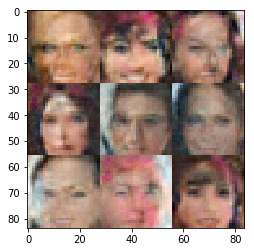

6401.6402.6403.6404.6405.6406.6407.6408.6409.6410.Epoch 2/5... Discriminator Loss: 0.0133... Generator Loss: 8.4422
6411.6412.6413.6414.6415.6416.6417.6418.6419.6420.Epoch 2/5... Discriminator Loss: 0.0214... Generator Loss: 7.1651
6421.6422.6423.6424.6425.6426.6427.6428.6429.6430.Epoch 2/5... Discriminator Loss: 0.0161... Generator Loss: 4.4642
6431.6432.6433.6434.6435.6436.6437.6438.6439.6440.Epoch 2/5... Discriminator Loss: 0.6958... Generator Loss: 1.0179
6441.6442.6443.6444.6445.6446.6447.6448.6449.6450.Epoch 2/5... Discriminator Loss: 0.0382... Generator Loss: 4.9651
6451.6452.6453.6454.6455.6456.6457.6458.6459.6460.Epoch 2/5... Discriminator Loss: 0.7677... Generator Loss: 8.4944
6461.6462.6463.6464.6465.6466.6467.6468.6469.6470.Epoch 2/5... Discriminator Loss: 1.4317... Generator Loss: 0.8518
6471.6472.6473.6474.6475.6476.6477.6478.6479.6480.Epoch 2/5... Discriminator Loss: 0.9418... Generator Loss: 0.7574
6481.6482.6483.6484.6485.6486.6487.6488.6489.6490.Epoch 2/5... Discrimin

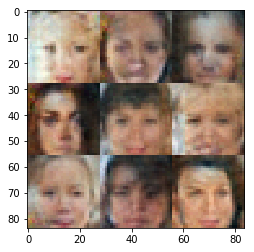

6501.6502.6503.6504.6505.6506.6507.6508.6509.6510.Epoch 2/5... Discriminator Loss: 0.6042... Generator Loss: 1.7784
6511.6512.6513.6514.6515.6516.6517.6518.6519.6520.Epoch 2/5... Discriminator Loss: 0.1126... Generator Loss: 5.6494
6521.6522.6523.6524.6525.6526.6527.6528.6529.6530.Epoch 2/5... Discriminator Loss: 1.2876... Generator Loss: 0.5600
6531.6532.6533.6534.6535.6536.6537.6538.6539.6540.Epoch 2/5... Discriminator Loss: 1.4152... Generator Loss: 0.7918
6541.6542.6543.6544.6545.6546.6547.6548.6549.6550.Epoch 2/5... Discriminator Loss: 1.5947... Generator Loss: 0.4101
6551.6552.6553.6554.6555.6556.6557.6558.6559.6560.Epoch 2/5... Discriminator Loss: 1.1634... Generator Loss: 0.8878
6561.6562.6563.6564.6565.6566.6567.6568.6569.6570.Epoch 2/5... Discriminator Loss: 1.3113... Generator Loss: 0.5949
6571.6572.6573.6574.6575.6576.6577.6578.6579.6580.Epoch 2/5... Discriminator Loss: 1.2932... Generator Loss: 0.8474
6581.6582.6583.6584.6585.6586.6587.6588.6589.6590.Epoch 2/5... Discrimin

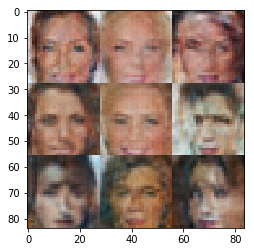

6601.6602.6603.6604.6605.6606.6607.6608.6609.6610.Epoch 2/5... Discriminator Loss: 1.3904... Generator Loss: 0.6428
6611.6612.6613.6614.6615.6616.6617.6618.6619.6620.Epoch 2/5... Discriminator Loss: 1.0607... Generator Loss: 0.7589
6621.6622.6623.6624.6625.6626.6627.6628.6629.6630.Epoch 2/5... Discriminator Loss: 1.0733... Generator Loss: 0.7553
6631.6632.6633.6634.6635.6636.6637.6638.6639.6640.Epoch 2/5... Discriminator Loss: 1.1596... Generator Loss: 0.8918
6641.6642.6643.6644.6645.6646.6647.6648.6649.6650.Epoch 2/5... Discriminator Loss: 1.1482... Generator Loss: 0.9503
6651.6652.6653.6654.6655.6656.6657.6658.6659.6660.Epoch 2/5... Discriminator Loss: 1.1759... Generator Loss: 1.1033
6661.6662.6663.6664.6665.6666.6667.6668.6669.6670.Epoch 2/5... Discriminator Loss: 1.0853... Generator Loss: 0.7341
6671.6672.6673.6674.6675.6676.6677.6678.6679.6680.Epoch 2/5... Discriminator Loss: 1.0465... Generator Loss: 1.0998
6681.6682.6683.6684.6685.6686.6687.6688.6689.6690.Epoch 2/5... Discrimin

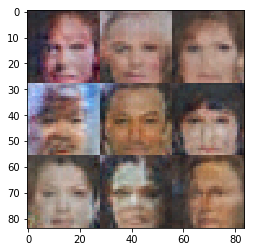

6701.6702.6703.6704.6705.6706.6707.6708.6709.6710.Epoch 2/5... Discriminator Loss: 1.2563... Generator Loss: 0.8646
6711.6712.6713.6714.6715.6716.6717.6718.6719.6720.Epoch 2/5... Discriminator Loss: 1.2655... Generator Loss: 0.9252
6721.6722.6723.6724.6725.6726.6727.6728.6729.6730.Epoch 2/5... Discriminator Loss: 1.1835... Generator Loss: 0.7865
6731.6732.6733.6734.6735.6736.6737.6738.6739.6740.Epoch 2/5... Discriminator Loss: 1.1336... Generator Loss: 1.0166
6741.6742.6743.6744.6745.6746.6747.6748.6749.6750.Epoch 2/5... Discriminator Loss: 1.5046... Generator Loss: 0.5208
6751.6752.6753.6754.6755.6756.6757.6758.6759.6760.Epoch 2/5... Discriminator Loss: 0.9906... Generator Loss: 0.9199
6761.6762.6763.6764.6765.6766.6767.6768.6769.6770.Epoch 2/5... Discriminator Loss: 1.2998... Generator Loss: 0.5276
6771.6772.6773.6774.6775.6776.6777.6778.6779.6780.Epoch 2/5... Discriminator Loss: 1.1063... Generator Loss: 0.7007
6781.6782.6783.6784.6785.6786.6787.6788.6789.6790.Epoch 2/5... Discrimin

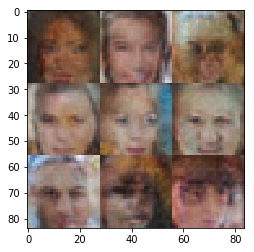

6801.6802.6803.6804.6805.6806.6807.6808.6809.6810.Epoch 2/5... Discriminator Loss: 1.2635... Generator Loss: 0.6428
6811.6812.6813.6814.6815.6816.6817.6818.6819.6820.Epoch 2/5... Discriminator Loss: 1.0349... Generator Loss: 0.8863
6821.6822.6823.6824.6825.6826.6827.6828.6829.6830.Epoch 2/5... Discriminator Loss: 1.3685... Generator Loss: 0.5170
6831.6832.6833.6834.6835.6836.6837.6838.6839.6840.Epoch 2/5... Discriminator Loss: 0.9253... Generator Loss: 1.0991
6841.6842.6843.6844.6845.6846.6847.6848.6849.6850.Epoch 2/5... Discriminator Loss: 1.2160... Generator Loss: 0.6204
6851.6852.6853.6854.6855.6856.6857.6858.6859.6860.Epoch 2/5... Discriminator Loss: 1.3475... Generator Loss: 0.5991
6861.6862.6863.6864.6865.6866.6867.6868.6869.6870.Epoch 2/5... Discriminator Loss: 1.0682... Generator Loss: 0.8339
6871.6872.6873.6874.6875.6876.6877.6878.6879.6880.Epoch 2/5... Discriminator Loss: 1.0326... Generator Loss: 0.8434
6881.6882.6883.6884.6885.6886.6887.6888.6889.6890.Epoch 2/5... Discrimin

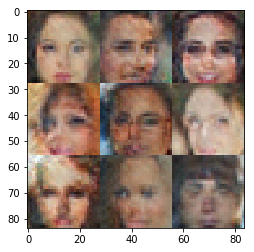

6901.6902.6903.6904.6905.6906.6907.6908.6909.6910.Epoch 2/5... Discriminator Loss: 0.9548... Generator Loss: 1.4236
6911.6912.6913.6914.6915.6916.6917.6918.6919.6920.Epoch 2/5... Discriminator Loss: 1.1802... Generator Loss: 0.6888
6921.6922.6923.6924.6925.6926.6927.6928.6929.6930.Epoch 2/5... Discriminator Loss: 1.1074... Generator Loss: 0.7924
6931.6932.6933.6934.6935.6936.6937.6938.6939.6940.Epoch 2/5... Discriminator Loss: 1.2266... Generator Loss: 1.2075
6941.6942.6943.6944.6945.6946.6947.6948.6949.6950.Epoch 2/5... Discriminator Loss: 1.4112... Generator Loss: 0.5327
6951.6952.6953.6954.6955.6956.6957.6958.6959.6960.Epoch 2/5... Discriminator Loss: 0.9834... Generator Loss: 1.0828
6961.6962.6963.6964.6965.6966.6967.6968.6969.6970.Epoch 2/5... Discriminator Loss: 1.4694... Generator Loss: 0.4448
6971.6972.6973.6974.6975.6976.6977.6978.6979.6980.Epoch 2/5... Discriminator Loss: 1.2168... Generator Loss: 0.6327
6981.6982.6983.6984.6985.6986.6987.6988.6989.6990.Epoch 2/5... Discrimin

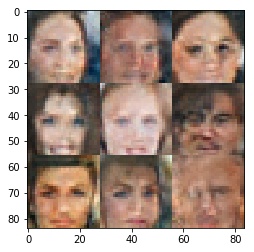

7001.7002.7003.7004.7005.7006.7007.7008.7009.7010.Epoch 2/5... Discriminator Loss: 1.3109... Generator Loss: 0.4861
7011.7012.7013.7014.7015.7016.7017.7018.7019.7020.Epoch 2/5... Discriminator Loss: 1.3555... Generator Loss: 0.4253
7021.7022.7023.7024.7025.7026.7027.7028.7029.7030.Epoch 2/5... Discriminator Loss: 0.8909... Generator Loss: 0.8963
7031.7032.7033.7034.7035.7036.7037.7038.7039.7040.Epoch 2/5... Discriminator Loss: 1.0512... Generator Loss: 1.1380
7041.7042.7043.7044.7045.7046.7047.7048.7049.7050.Epoch 2/5... Discriminator Loss: 1.6587... Generator Loss: 0.2732
7051.7052.7053.7054.7055.7056.7057.7058.7059.7060.Epoch 2/5... Discriminator Loss: 1.4234... Generator Loss: 0.5572
7061.7062.7063.7064.7065.7066.7067.7068.7069.7070.Epoch 2/5... Discriminator Loss: 1.1438... Generator Loss: 1.1860
7071.7072.7073.7074.7075.7076.7077.7078.7079.7080.Epoch 2/5... Discriminator Loss: 1.1120... Generator Loss: 0.7184
7081.7082.7083.7084.7085.7086.7087.7088.7089.7090.Epoch 2/5... Discrimin

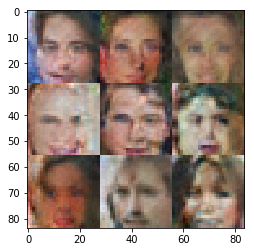

7101.7102.7103.7104.7105.7106.7107.7108.7109.7110.Epoch 2/5... Discriminator Loss: 1.2032... Generator Loss: 0.6039
7111.7112.7113.7114.7115.7116.7117.7118.7119.7120.Epoch 2/5... Discriminator Loss: 1.0758... Generator Loss: 0.8570
7121.7122.7123.7124.7125.7126.7127.7128.7129.7130.Epoch 2/5... Discriminator Loss: 1.4807... Generator Loss: 0.3931
7131.7132.7133.7134.7135.7136.7137.7138.7139.7140.Epoch 2/5... Discriminator Loss: 1.0493... Generator Loss: 0.6421
7141.7142.7143.7144.7145.7146.7147.7148.7149.7150.Epoch 2/5... Discriminator Loss: 0.8839... Generator Loss: 1.2157
7151.7152.7153.7154.7155.7156.7157.7158.7159.7160.Epoch 2/5... Discriminator Loss: 1.5380... Generator Loss: 0.3394
7161.7162.7163.7164.7165.7166.7167.7168.7169.7170.Epoch 2/5... Discriminator Loss: 1.2307... Generator Loss: 0.5111
7171.7172.7173.7174.7175.7176.7177.7178.7179.7180.Epoch 2/5... Discriminator Loss: 1.2278... Generator Loss: 0.7006
7181.7182.7183.7184.7185.7186.7187.7188.7189.7190.Epoch 2/5... Discrimin

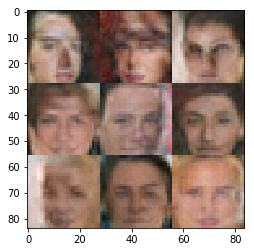

7201.7202.7203.7204.7205.7206.7207.7208.7209.7210.Epoch 2/5... Discriminator Loss: 1.1119... Generator Loss: 0.8694
7211.7212.7213.7214.7215.7216.7217.7218.7219.7220.Epoch 2/5... Discriminator Loss: 1.2388... Generator Loss: 0.9440
7221.7222.7223.7224.7225.7226.7227.7228.7229.7230.Epoch 2/5... Discriminator Loss: 1.4126... Generator Loss: 0.3908
7231.7232.7233.7234.7235.7236.7237.7238.7239.7240.Epoch 2/5... Discriminator Loss: 1.8683... Generator Loss: 0.2889
7241.7242.7243.7244.7245.7246.7247.7248.7249.7250.Epoch 2/5... Discriminator Loss: 1.2084... Generator Loss: 0.7156
7251.7252.7253.7254.7255.7256.7257.7258.7259.7260.Epoch 2/5... Discriminator Loss: 1.4823... Generator Loss: 0.3767
7261.7262.7263.7264.7265.7266.7267.7268.7269.7270.Epoch 2/5... Discriminator Loss: 1.1828... Generator Loss: 0.6299
7271.7272.7273.7274.7275.7276.7277.7278.7279.7280.Epoch 2/5... Discriminator Loss: 1.2211... Generator Loss: 0.5895
7281.7282.7283.7284.7285.7286.7287.7288.7289.7290.Epoch 2/5... Discrimin

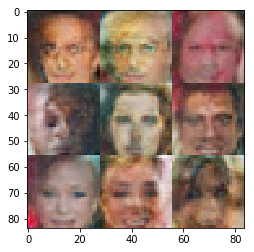

7301.7302.7303.7304.7305.7306.7307.7308.7309.7310.Epoch 2/5... Discriminator Loss: 1.2031... Generator Loss: 0.6604
7311.7312.7313.7314.7315.7316.7317.7318.7319.7320.Epoch 2/5... Discriminator Loss: 1.1859... Generator Loss: 0.7435
7321.7322.7323.7324.7325.7326.7327.7328.7329.7330.Epoch 2/5... Discriminator Loss: 1.1171... Generator Loss: 0.9439
7331.7332.7333.7334.7335.7336.7337.7338.7339.7340.Epoch 2/5... Discriminator Loss: 1.1183... Generator Loss: 0.6598
7341.7342.7343.7344.7345.7346.7347.7348.7349.7350.Epoch 2/5... Discriminator Loss: 1.0364... Generator Loss: 0.8317
7351.7352.7353.7354.7355.7356.7357.7358.7359.7360.Epoch 2/5... Discriminator Loss: 1.1709... Generator Loss: 0.9591
7361.7362.7363.7364.7365.7366.7367.7368.7369.7370.Epoch 2/5... Discriminator Loss: 1.1817... Generator Loss: 0.5613
7371.7372.7373.7374.7375.7376.7377.7378.7379.7380.Epoch 2/5... Discriminator Loss: 1.3510... Generator Loss: 0.4434
7381.7382.7383.7384.7385.7386.7387.7388.7389.7390.Epoch 2/5... Discrimin

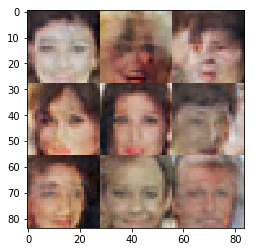

7401.7402.7403.7404.7405.7406.7407.7408.7409.7410.Epoch 2/5... Discriminator Loss: 1.1144... Generator Loss: 0.9248
7411.7412.7413.7414.7415.7416.7417.7418.7419.7420.Epoch 2/5... Discriminator Loss: 1.1345... Generator Loss: 1.0115
7421.7422.7423.7424.7425.7426.7427.7428.7429.7430.Epoch 2/5... Discriminator Loss: 0.9109... Generator Loss: 1.0872
7431.7432.7433.7434.7435.7436.7437.7438.7439.7440.Epoch 2/5... Discriminator Loss: 0.9164... Generator Loss: 0.8948
7441.7442.7443.7444.7445.7446.7447.7448.7449.7450.Epoch 2/5... Discriminator Loss: 0.9983... Generator Loss: 1.0340
7451.7452.7453.7454.7455.7456.7457.7458.7459.7460.Epoch 2/5... Discriminator Loss: 1.1395... Generator Loss: 0.6841
7461.7462.7463.7464.7465.7466.7467.7468.7469.7470.Epoch 2/5... Discriminator Loss: 1.2586... Generator Loss: 0.6162
7471.7472.7473.7474.7475.7476.7477.7478.7479.7480.Epoch 2/5... Discriminator Loss: 1.1166... Generator Loss: 0.6373
7481.7482.7483.7484.7485.7486.7487.7488.7489.7490.Epoch 2/5... Discrimin

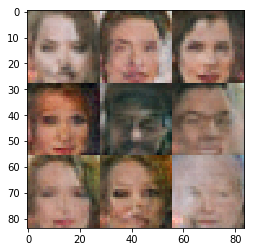

7501.7502.7503.7504.7505.7506.7507.7508.7509.7510.Epoch 2/5... Discriminator Loss: 1.2935... Generator Loss: 0.7739
7511.7512.7513.7514.7515.7516.7517.7518.7519.7520.Epoch 2/5... Discriminator Loss: 1.3563... Generator Loss: 0.5292
7521.7522.7523.7524.7525.7526.7527.7528.7529.7530.Epoch 2/5... Discriminator Loss: 0.9010... Generator Loss: 1.1753
7531.7532.7533.7534.7535.7536.7537.7538.7539.7540.Epoch 2/5... Discriminator Loss: 1.2424... Generator Loss: 0.4879
7541.7542.7543.7544.7545.7546.7547.7548.7549.7550.Epoch 2/5... Discriminator Loss: 1.1565... Generator Loss: 0.6897
7551.7552.7553.7554.7555.7556.7557.7558.7559.7560.Epoch 2/5... Discriminator Loss: 1.2449... Generator Loss: 0.7531
7561.7562.7563.7564.7565.7566.7567.7568.7569.7570.Epoch 2/5... Discriminator Loss: 0.9921... Generator Loss: 1.0962
7571.7572.7573.7574.7575.7576.7577.7578.7579.7580.Epoch 2/5... Discriminator Loss: 1.2573... Generator Loss: 1.6255
7581.7582.7583.7584.7585.7586.7587.7588.7589.7590.Epoch 2/5... Discrimin

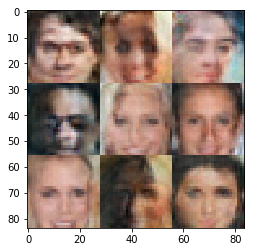

7601.7602.7603.7604.7605.7606.7607.7608.7609.7610.Epoch 2/5... Discriminator Loss: 1.1445... Generator Loss: 0.9365
7611.7612.7613.7614.7615.7616.7617.7618.7619.7620.Epoch 2/5... Discriminator Loss: 1.2876... Generator Loss: 0.7769
7621.7622.7623.7624.7625.7626.7627.7628.7629.7630.Epoch 2/5... Discriminator Loss: 1.0039... Generator Loss: 0.8187
7631.7632.7633.7634.7635.7636.7637.7638.7639.7640.Epoch 2/5... Discriminator Loss: 2.0010... Generator Loss: 0.6433
7641.7642.7643.7644.7645.7646.7647.7648.7649.7650.Epoch 2/5... Discriminator Loss: 1.1652... Generator Loss: 0.6284
7651.7652.7653.7654.7655.7656.7657.7658.7659.7660.Epoch 2/5... Discriminator Loss: 1.1846... Generator Loss: 0.6786
7661.7662.7663.7664.7665.7666.7667.7668.7669.7670.Epoch 2/5... Discriminator Loss: 1.3559... Generator Loss: 1.0175
7671.7672.7673.7674.7675.7676.7677.7678.7679.7680.Epoch 2/5... Discriminator Loss: 1.2994... Generator Loss: 0.6442
7681.7682.7683.7684.7685.7686.7687.7688.7689.7690.Epoch 2/5... Discrimin

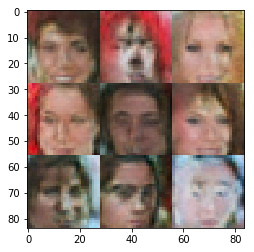

7701.7702.7703.7704.7705.7706.7707.7708.7709.7710.Epoch 2/5... Discriminator Loss: 1.0638... Generator Loss: 0.7596
7711.7712.7713.7714.7715.7716.7717.7718.7719.7720.Epoch 2/5... Discriminator Loss: 0.8736... Generator Loss: 0.9338
7721.7722.7723.7724.7725.7726.7727.7728.7729.7730.Epoch 2/5... Discriminator Loss: 1.4118... Generator Loss: 0.7184
7731.7732.7733.7734.7735.7736.7737.7738.7739.7740.Epoch 2/5... Discriminator Loss: 1.4549... Generator Loss: 0.3631
7741.7742.7743.7744.7745.7746.7747.7748.7749.7750.Epoch 2/5... Discriminator Loss: 1.1983... Generator Loss: 0.7241
7751.7752.7753.7754.7755.7756.7757.7758.7759.7760.Epoch 2/5... Discriminator Loss: 1.1139... Generator Loss: 0.6357
7761.7762.7763.7764.7765.7766.7767.7768.7769.7770.Epoch 2/5... Discriminator Loss: 0.7745... Generator Loss: 1.2438
7771.7772.7773.7774.7775.7776.7777.7778.7779.7780.Epoch 2/5... Discriminator Loss: 1.7797... Generator Loss: 0.2621
7781.7782.7783.7784.7785.7786.7787.7788.7789.7790.Epoch 2/5... Discrimin

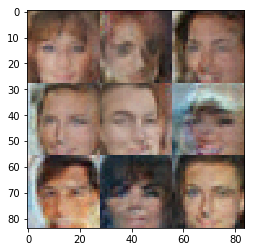

7801.7802.7803.7804.7805.7806.7807.7808.7809.7810.Epoch 2/5... Discriminator Loss: 2.1529... Generator Loss: 0.2163
7811.7812.7813.7814.7815.7816.7817.7818.7819.7820.Epoch 2/5... Discriminator Loss: 1.4619... Generator Loss: 0.3326
7821.7822.7823.7824.7825.7826.7827.7828.7829.7830.Epoch 2/5... Discriminator Loss: 0.6199... Generator Loss: 1.1173
7831.7832.7833.7834.7835.7836.7837.7838.7839.7840.Epoch 2/5... Discriminator Loss: 0.6872... Generator Loss: 1.0336
7841.7842.7843.7844.7845.7846.7847.7848.7849.7850.Epoch 2/5... Discriminator Loss: 0.0524... Generator Loss: 3.9538
7851.7852.7853.7854.7855.7856.7857.7858.7859.7860.Epoch 2/5... Discriminator Loss: 0.3451... Generator Loss: 1.7760
7861.7862.7863.7864.7865.7866.7867.7868.7869.7870.Epoch 2/5... Discriminator Loss: 0.2790... Generator Loss: 3.7050
7871.7872.7873.7874.7875.7876.7877.7878.7879.7880.Epoch 2/5... Discriminator Loss: 0.6841... Generator Loss: 1.1000
7881.7882.7883.7884.7885.7886.7887.7888.7889.7890.Epoch 2/5... Discrimin

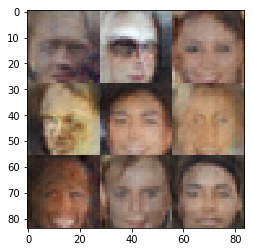

7901.7902.7903.7904.7905.7906.7907.7908.7909.7910.Epoch 2/5... Discriminator Loss: 0.9486... Generator Loss: 0.9650
7911.7912.7913.7914.7915.7916.7917.7918.7919.7920.Epoch 2/5... Discriminator Loss: 1.4061... Generator Loss: 0.4898
7921.7922.7923.7924.7925.7926.7927.7928.7929.7930.Epoch 2/5... Discriminator Loss: 1.1119... Generator Loss: 0.6700
7931.7932.7933.7934.7935.7936.7937.7938.7939.7940.Epoch 2/5... Discriminator Loss: 1.4313... Generator Loss: 0.4173
7941.7942.7943.7944.7945.7946.7947.7948.7949.7950.Epoch 2/5... Discriminator Loss: 0.7154... Generator Loss: 1.4422
7951.7952.7953.7954.7955.7956.7957.7958.7959.7960.Epoch 2/5... Discriminator Loss: 1.1452... Generator Loss: 0.8392
7961.7962.7963.7964.7965.7966.7967.7968.7969.7970.Epoch 2/5... Discriminator Loss: 0.5738... Generator Loss: 1.6995
7971.7972.7973.7974.7975.7976.7977.7978.7979.7980.Epoch 2/5... Discriminator Loss: 1.2650... Generator Loss: 0.5263
7981.7982.7983.7984.7985.7986.7987.7988.7989.7990.Epoch 2/5... Discrimin

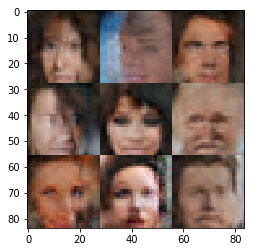

8001.8002.8003.8004.8005.8006.8007.8008.8009.8010.Epoch 2/5... Discriminator Loss: 1.7217... Generator Loss: 0.5699
8011.8012.8013.8014.8015.8016.8017.8018.8019.8020.Epoch 2/5... Discriminator Loss: 0.9485... Generator Loss: 2.0517
8021.8022.8023.8024.8025.8026.8027.8028.8029.8030.Epoch 2/5... Discriminator Loss: 0.2552... Generator Loss: 3.2735
8031.8032.8033.8034.8035.8036.8037.8038.8039.8040.Epoch 2/5... Discriminator Loss: 0.2479... Generator Loss: 4.2756
8041.8042.8043.8044.8045.8046.8047.8048.8049.8050.Epoch 2/5... Discriminator Loss: 0.6464... Generator Loss: 1.1302
8051.8052.8053.8054.8055.8056.8057.8058.8059.8060.Epoch 2/5... Discriminator Loss: 0.3587... Generator Loss: 7.0333
8061.8062.8063.8064.8065.8066.8067.8068.8069.8070.Epoch 2/5... Discriminator Loss: 0.1621... Generator Loss: 4.4173
8071.8072.8073.8074.8075.8076.8077.8078.8079.8080.Epoch 2/5... Discriminator Loss: 0.1310... Generator Loss: 8.4828
8081.8082.8083.8084.8085.8086.8087.8088.8089.8090.Epoch 2/5... Discrimin

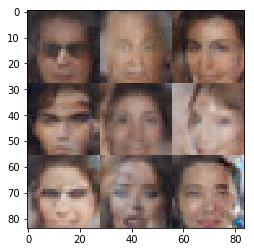

8101.8102.8103.8104.8105.8106.8107.8108.8109.8110.Epoch 2/5... Discriminator Loss: 0.9902... Generator Loss: 0.7684
8111.8112.8113.8114.8115.8116.8117.8118.8119.8120.Epoch 2/5... Discriminator Loss: 0.8121... Generator Loss: 0.7404
8121.8122.8123.8124.8125.8126.8127.8128.8129.8130.Epoch 2/5... Discriminator Loss: 0.4363... Generator Loss: 1.6726
8131.8132.8133.8134.8135.8136.8137.8138.8139.8140.Epoch 2/5... Discriminator Loss: 1.2698... Generator Loss: 0.5337
8141.8142.8143.8144.8145.8146.8147.8148.8149.8150.Epoch 2/5... Discriminator Loss: 0.0107... Generator Loss: 5.7304
8151.8152.8153.8154.8155.8156.8157.8158.8159.8160.Epoch 2/5... Discriminator Loss: 1.3385... Generator Loss: 0.6350
8161.8162.8163.8164.8165.8166.8167.8168.8169.8170.Epoch 2/5... Discriminator Loss: 0.3802... Generator Loss: 1.5677
8171.8172.8173.8174.8175.8176.8177.8178.8179.8180.Epoch 2/5... Discriminator Loss: 0.5427... Generator Loss: 1.2669
8181.8182.8183.8184.8185.8186.8187.8188.8189.8190.Epoch 2/5... Discrimin

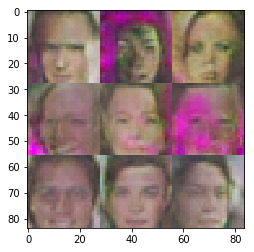

8201.8202.8203.8204.8205.8206.8207.8208.8209.8210.Epoch 2/5... Discriminator Loss: 1.1820... Generator Loss: 0.5795
8211.8212.8213.8214.8215.8216.8217.8218.8219.8220.Epoch 2/5... Discriminator Loss: 0.4559... Generator Loss: 3.8077
8221.8222.8223.8224.8225.8226.8227.8228.8229.8230.Epoch 2/5... Discriminator Loss: 0.0196... Generator Loss: 5.5746
8231.8232.8233.8234.8235.8236.8237.8238.8239.8240.Epoch 2/5... Discriminator Loss: 1.8089... Generator Loss: 0.2636
8241.8242.8243.8244.8245.8246.8247.8248.8249.8250.Epoch 2/5... Discriminator Loss: 0.2294... Generator Loss: 2.7688
8251.8252.8253.8254.8255.8256.8257.8258.8259.8260.Epoch 2/5... Discriminator Loss: 0.5832... Generator Loss: 1.3250
8261.8262.8263.8264.8265.8266.8267.8268.8269.8270.Epoch 2/5... Discriminator Loss: 0.1911... Generator Loss: 2.6696
8271.8272.8273.8274.8275.8276.8277.8278.8279.8280.Epoch 2/5... Discriminator Loss: 0.2080... Generator Loss: 5.6808
8281.8282.8283.8284.8285.8286.8287.8288.8289.8290.Epoch 2/5... Discrimin

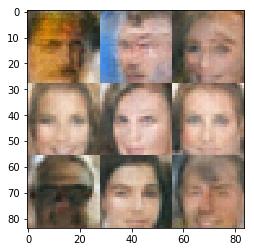

8301.8302.8303.8304.8305.8306.8307.8308.8309.8310.Epoch 2/5... Discriminator Loss: 0.8774... Generator Loss: 0.8088
8311.8312.8313.8314.8315.8316.8317.8318.8319.8320.Epoch 2/5... Discriminator Loss: 0.5823... Generator Loss: 7.0633
8321.8322.8323.8324.8325.8326.8327.8328.8329.8330.Epoch 2/5... Discriminator Loss: 0.0148... Generator Loss: 6.9030
8331.8332.8333.8334.8335.8336.8337.8338.8339.8340.Epoch 2/5... Discriminator Loss: 0.3041... Generator Loss: 3.8012
8341.8342.8343.8344.8345.8346.8347.8348.8349.8350.Epoch 2/5... Discriminator Loss: 0.1209... Generator Loss: 2.6978
8351.8352.8353.8354.8355.8356.8357.8358.8359.8360.Epoch 2/5... Discriminator Loss: 0.7712... Generator Loss: 6.3755
8361.8362.8363.8364.8365.8366.8367.8368.8369.8370.Epoch 2/5... Discriminator Loss: 1.7438... Generator Loss: 5.8856
8371.8372.8373.8374.8375.8376.8377.8378.8379.8380.Epoch 2/5... Discriminator Loss: 0.1779... Generator Loss: 7.5181
8381.8382.8383.8384.8385.8386.8387.8388.8389.8390.Epoch 2/5... Discrimin

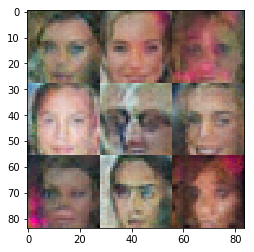

8401.8402.8403.8404.8405.8406.8407.8408.8409.8410.Epoch 2/5... Discriminator Loss: 0.1064... Generator Loss: 4.1908
8411.8412.8413.8414.8415.8416.8417.8418.8419.8420.Epoch 2/5... Discriminator Loss: 1.1980... Generator Loss: 0.7473
8421.8422.8423.8424.8425.8426.8427.8428.8429.8430.Epoch 2/5... Discriminator Loss: 0.6487... Generator Loss: 1.7682
8431.8432.8433.8434.8435.8436.8437.8438.8439.8440.Epoch 2/5... Discriminator Loss: 0.6787... Generator Loss: 7.7504
8441.8442.8443.8444.8445.8446.8447.8448.8449.8450.Epoch 2/5... Discriminator Loss: 1.0391... Generator Loss: 0.7962
8451.8452.8453.8454.8455.8456.8457.8458.8459.8460.Epoch 2/5... Discriminator Loss: 1.0226... Generator Loss: 1.0157
8461.8462.8463.8464.8465.8466.8467.8468.8469.8470.Epoch 2/5... Discriminator Loss: 0.2807... Generator Loss: 2.5408
8471.8472.8473.8474.8475.8476.8477.8478.8479.8480.Epoch 2/5... Discriminator Loss: 1.1810... Generator Loss: 0.8015
8481.8482.8483.8484.8485.8486.8487.8488.8489.8490.Epoch 2/5... Discrimin

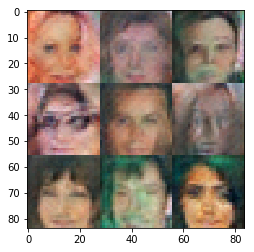

8501.8502.8503.8504.8505.8506.8507.8508.8509.8510.Epoch 2/5... Discriminator Loss: 0.9124... Generator Loss: 3.8829
8511.8512.8513.8514.8515.8516.8517.8518.8519.8520.Epoch 2/5... Discriminator Loss: 1.1588... Generator Loss: 3.0450
8521.8522.8523.8524.8525.8526.8527.8528.8529.8530.Epoch 2/5... Discriminator Loss: 0.4189... Generator Loss: 1.9181
8531.8532.8533.8534.8535.8536.8537.8538.8539.8540.Epoch 2/5... Discriminator Loss: 0.9982... Generator Loss: 1.3829
8541.8542.8543.8544.8545.8546.8547.8548.8549.8550.Epoch 2/5... Discriminator Loss: 1.3649... Generator Loss: 0.6015
8551.8552.8553.8554.8555.8556.8557.8558.8559.8560.Epoch 2/5... Discriminator Loss: 0.7122... Generator Loss: 1.5346
8561.8562.8563.8564.8565.8566.8567.8568.8569.8570.Epoch 2/5... Discriminator Loss: 1.2618... Generator Loss: 1.2959
8571.8572.8573.8574.8575.8576.8577.8578.8579.8580.Epoch 2/5... Discriminator Loss: 1.4155... Generator Loss: 0.5518
8581.8582.8583.8584.8585.8586.8587.8588.8589.8590.Epoch 2/5... Discrimin

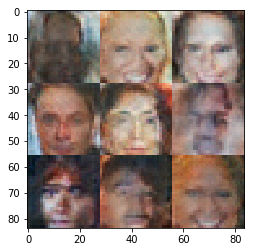

8601.8602.8603.8604.8605.8606.8607.8608.8609.8610.Epoch 2/5... Discriminator Loss: 1.7635... Generator Loss: 0.5265
8611.8612.8613.8614.8615.8616.8617.8618.8619.8620.Epoch 2/5... Discriminator Loss: 1.2463... Generator Loss: 0.5982
8621.8622.8623.8624.8625.8626.8627.8628.8629.8630.Epoch 2/5... Discriminator Loss: 1.3812... Generator Loss: 0.4797
8631.8632.8633.8634.8635.8636.8637.8638.8639.8640.Epoch 2/5... Discriminator Loss: 0.4605... Generator Loss: 5.2076
8641.8642.8643.8644.8645.8646.8647.8648.8649.8650.Epoch 2/5... Discriminator Loss: 1.1159... Generator Loss: 0.6406
8651.8652.8653.8654.8655.8656.8657.8658.8659.8660.Epoch 2/5... Discriminator Loss: 2.4204... Generator Loss: 0.1624
8661.8662.8663.8664.8665.8666.8667.8668.8669.8670.Epoch 2/5... Discriminator Loss: 0.7400... Generator Loss: 3.3148
8671.8672.8673.8674.8675.8676.8677.8678.8679.8680.Epoch 2/5... Discriminator Loss: 0.3421... Generator Loss: 5.1106
8681.8682.8683.8684.8685.8686.8687.8688.8689.8690.Epoch 2/5... Discrimin

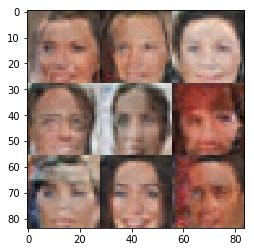

8701.8702.8703.8704.8705.8706.8707.8708.8709.8710.Epoch 2/5... Discriminator Loss: 0.3364... Generator Loss: 1.6402
8711.8712.8713.8714.8715.8716.8717.8718.8719.8720.Epoch 2/5... Discriminator Loss: 1.5481... Generator Loss: 0.7036
8721.8722.8723.8724.8725.8726.8727.8728.8729.8730.Epoch 2/5... Discriminator Loss: 1.2168... Generator Loss: 0.5193
8731.8732.8733.8734.8735.8736.8737.8738.8739.8740.Epoch 2/5... Discriminator Loss: 1.2471... Generator Loss: 0.5481
8741.8742.8743.8744.8745.8746.8747.8748.8749.8750.Epoch 2/5... Discriminator Loss: 1.4831... Generator Loss: 0.4471
8751.8752.8753.8754.8755.8756.8757.8758.8759.8760.Epoch 2/5... Discriminator Loss: 1.4324... Generator Loss: 0.5912
8761.8762.8763.8764.8765.8766.8767.8768.8769.8770.Epoch 2/5... Discriminator Loss: 1.3727... Generator Loss: 0.4477
8771.8772.8773.8774.8775.8776.8777.8778.8779.8780.Epoch 2/5... Discriminator Loss: 1.7056... Generator Loss: 0.3597
8781.8782.8783.8784.8785.8786.8787.8788.8789.8790.Epoch 2/5... Discrimin

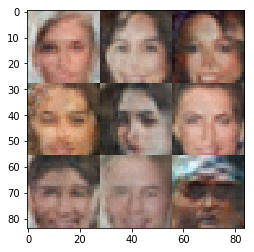

8801.8802.8803.8804.8805.8806.8807.8808.8809.8810.Epoch 2/5... Discriminator Loss: 1.1883... Generator Loss: 1.4541
8811.8812.8813.8814.8815.8816.8817.8818.8819.8820.Epoch 2/5... Discriminator Loss: 1.4430... Generator Loss: 0.4458
8821.8822.8823.8824.8825.8826.8827.8828.8829.8830.Epoch 2/5... Discriminator Loss: 1.5825... Generator Loss: 0.5507
8831.8832.8833.8834.8835.8836.8837.8838.8839.8840.Epoch 2/5... Discriminator Loss: 1.1342... Generator Loss: 0.6197
8841.8842.8843.8844.8845.8846.8847.8848.8849.8850.Epoch 2/5... Discriminator Loss: 0.8974... Generator Loss: 1.0659
8851.8852.8853.8854.8855.8856.8857.8858.8859.8860.Epoch 2/5... Discriminator Loss: 1.1150... Generator Loss: 0.6959
8861.8862.8863.8864.8865.8866.8867.8868.8869.8870.Epoch 2/5... Discriminator Loss: 1.1537... Generator Loss: 0.6366
8871.8872.8873.8874.8875.8876.8877.8878.8879.8880.Epoch 2/5... Discriminator Loss: 1.2902... Generator Loss: 0.5942
8881.8882.8883.8884.8885.8886.8887.8888.8889.8890.Epoch 2/5... Discrimin

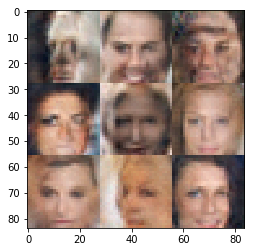

8901.8902.8903.8904.8905.8906.8907.8908.8909.8910.Epoch 2/5... Discriminator Loss: 1.0574... Generator Loss: 0.8076
8911.8912.8913.8914.8915.8916.8917.8918.8919.8920.Epoch 2/5... Discriminator Loss: 1.2764... Generator Loss: 0.8299
8921.8922.8923.8924.8925.8926.8927.8928.8929.8930.Epoch 2/5... Discriminator Loss: 1.0410... Generator Loss: 0.7519
8931.8932.8933.8934.8935.8936.8937.8938.8939.8940.Epoch 2/5... Discriminator Loss: 1.0660... Generator Loss: 0.9696
8941.8942.8943.8944.8945.8946.8947.8948.8949.8950.Epoch 2/5... Discriminator Loss: 1.1708... Generator Loss: 0.7077
8951.8952.8953.8954.8955.8956.8957.8958.8959.8960.Epoch 2/5... Discriminator Loss: 0.7504... Generator Loss: 1.2480
8961.8962.8963.8964.8965.8966.8967.8968.8969.8970.Epoch 2/5... Discriminator Loss: 1.4618... Generator Loss: 0.3890
8971.8972.8973.8974.8975.8976.8977.8978.8979.8980.Epoch 2/5... Discriminator Loss: 0.9923... Generator Loss: 0.7294
8981.8982.8983.8984.8985.8986.8987.8988.8989.8990.Epoch 2/5... Discrimin

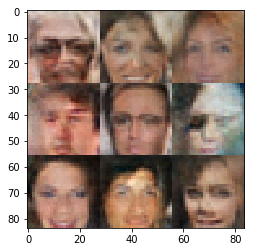

9001.9002.9003.9004.9005.9006.9007.9008.9009.9010.Epoch 2/5... Discriminator Loss: 1.1704... Generator Loss: 0.5741
9011.9012.9013.9014.9015.9016.9017.9018.9019.9020.Epoch 2/5... Discriminator Loss: 1.0469... Generator Loss: 0.9100
9021.9022.9023.9024.9025.9026.9027.9028.9029.9030.Epoch 2/5... Discriminator Loss: 1.4799... Generator Loss: 0.4184
9031.9032.9033.9034.9035.9036.9037.9038.9039.9040.Epoch 2/5... Discriminator Loss: 1.4929... Generator Loss: 0.3521
9041.9042.9043.9044.9045.9046.9047.9048.9049.9050.Epoch 2/5... Discriminator Loss: 1.5175... Generator Loss: 0.4228
9051.9052.9053.9054.9055.9056.9057.9058.9059.9060.Epoch 2/5... Discriminator Loss: 1.4873... Generator Loss: 0.5600
9061.9062.9063.9064.9065.9066.9067.9068.9069.9070.Epoch 2/5... Discriminator Loss: 1.3485... Generator Loss: 0.5015
9071.9072.9073.9074.9075.9076.9077.9078.9079.9080.Epoch 2/5... Discriminator Loss: 1.0175... Generator Loss: 0.7180
9081.9082.9083.9084.9085.9086.9087.9088.9089.9090.Epoch 2/5... Discrimin

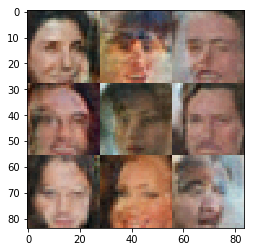

9101.9102.9103.9104.9105.9106.9107.9108.9109.9110.Epoch 2/5... Discriminator Loss: 0.7996... Generator Loss: 0.9071
9111.9112.9113.9114.9115.9116.9117.9118.9119.9120.Epoch 2/5... Discriminator Loss: 1.4099... Generator Loss: 0.4836
9121.9122.9123.9124.9125.9126.9127.9128.9129.9130.Epoch 2/5... Discriminator Loss: 1.2183... Generator Loss: 0.6419
9131.9132.9133.9134.9135.9136.9137.9138.9139.9140.Epoch 2/5... Discriminator Loss: 1.0101... Generator Loss: 1.0920
9141.9142.9143.9144.9145.9146.9147.9148.9149.9150.Epoch 2/5... Discriminator Loss: 1.3908... Generator Loss: 0.4649
9151.9152.9153.9154.9155.9156.9157.9158.9159.9160.Epoch 2/5... Discriminator Loss: 1.6402... Generator Loss: 0.4529
9161.9162.9163.9164.9165.9166.9167.9168.9169.9170.Epoch 2/5... Discriminator Loss: 1.4066... Generator Loss: 0.3976
9171.9172.9173.9174.9175.9176.9177.9178.9179.9180.Epoch 2/5... Discriminator Loss: 1.0068... Generator Loss: 0.7888
9181.9182.9183.9184.9185.9186.9187.9188.9189.9190.Epoch 2/5... Discrimin

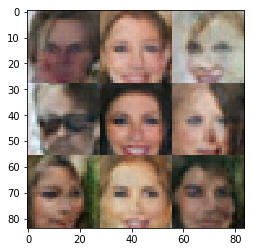

9201.9202.9203.9204.9205.9206.9207.9208.9209.9210.Epoch 2/5... Discriminator Loss: 1.2452... Generator Loss: 0.6011
9211.9212.9213.9214.9215.9216.9217.9218.9219.9220.Epoch 2/5... Discriminator Loss: 1.3480... Generator Loss: 0.6023
9221.9222.9223.9224.9225.9226.9227.9228.9229.9230.Epoch 2/5... Discriminator Loss: 1.4796... Generator Loss: 0.5325
9231.9232.9233.9234.9235.9236.9237.9238.9239.9240.Epoch 2/5... Discriminator Loss: 1.6461... Generator Loss: 0.3665
9241.9242.9243.9244.9245.9246.9247.9248.9249.9250.Epoch 2/5... Discriminator Loss: 1.0516... Generator Loss: 0.7445
9251.9252.9253.9254.9255.9256.9257.9258.9259.9260.Epoch 2/5... Discriminator Loss: 1.1060... Generator Loss: 0.9756
9261.9262.9263.9264.9265.9266.9267.9268.9269.9270.Epoch 2/5... Discriminator Loss: 1.1296... Generator Loss: 0.8485
9271.9272.9273.9274.9275.9276.9277.9278.9279.9280.Epoch 2/5... Discriminator Loss: 0.8888... Generator Loss: 0.8742
9281.9282.9283.9284.9285.9286.9287.9288.9289.9290.Epoch 2/5... Discrimin

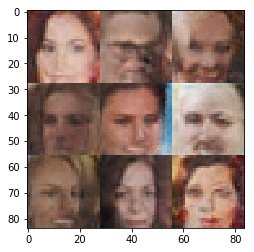

9301.9302.9303.9304.9305.9306.9307.9308.9309.9310.Epoch 2/5... Discriminator Loss: 1.0330... Generator Loss: 1.1060
9311.9312.9313.9314.9315.9316.9317.9318.9319.9320.Epoch 2/5... Discriminator Loss: 1.6705... Generator Loss: 0.3843
9321.9322.9323.9324.9325.9326.9327.9328.9329.9330.Epoch 2/5... Discriminator Loss: 1.2504... Generator Loss: 0.9376
9331.9332.9333.9334.9335.9336.9337.9338.9339.9340.Epoch 2/5... Discriminator Loss: 1.3855... Generator Loss: 0.5527
9341.9342.9343.9344.9345.9346.9347.9348.9349.9350.Epoch 2/5... Discriminator Loss: 1.3297... Generator Loss: 0.6621
9351.9352.9353.9354.9355.9356.9357.9358.9359.9360.Epoch 2/5... Discriminator Loss: 1.0492... Generator Loss: 0.6598
9361.9362.9363.9364.9365.9366.9367.9368.9369.9370.Epoch 2/5... Discriminator Loss: 0.8967... Generator Loss: 0.9999
9371.9372.9373.9374.9375.9376.9377.9378.9379.9380.Epoch 2/5... Discriminator Loss: 1.0461... Generator Loss: 0.9070
9381.9382.9383.9384.9385.9386.9387.9388.9389.9390.Epoch 2/5... Discrimin

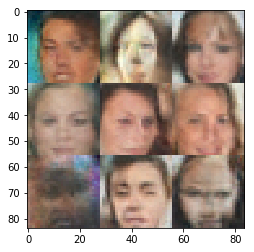

9401.9402.9403.9404.9405.9406.9407.9408.9409.9410.Epoch 2/5... Discriminator Loss: 1.2847... Generator Loss: 0.4837
9411.9412.9413.9414.9415.9416.9417.9418.9419.9420.Epoch 2/5... Discriminator Loss: 1.0467... Generator Loss: 1.0165
9421.9422.9423.9424.9425.9426.9427.9428.9429.9430.Epoch 2/5... Discriminator Loss: 1.2055... Generator Loss: 0.5662
9431.9432.9433.9434.9435.9436.9437.9438.9439.9440.Epoch 2/5... Discriminator Loss: 1.3428... Generator Loss: 0.4679
9441.9442.9443.9444.9445.9446.9447.9448.9449.9450.Epoch 2/5... Discriminator Loss: 1.2274... Generator Loss: 0.5354
9451.9452.9453.9454.9455.9456.9457.9458.9459.9460.Epoch 2/5... Discriminator Loss: 1.5307... Generator Loss: 0.4259
9461.9462.9463.9464.9465.9466.9467.9468.9469.9470.Epoch 2/5... Discriminator Loss: 1.1101... Generator Loss: 0.8252
9471.9472.9473.9474.9475.9476.9477.9478.9479.9480.Epoch 2/5... Discriminator Loss: 1.0727... Generator Loss: 0.9212
9481.9482.9483.9484.9485.9486.9487.9488.9489.9490.Epoch 2/5... Discrimin

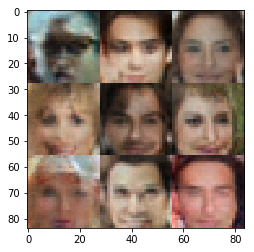

9501.9502.9503.9504.9505.9506.9507.9508.9509.9510.Epoch 2/5... Discriminator Loss: 1.4239... Generator Loss: 0.4010
9511.9512.9513.9514.9515.9516.9517.9518.9519.9520.Epoch 2/5... Discriminator Loss: 1.0760... Generator Loss: 0.7428
9521.9522.9523.9524.9525.9526.9527.9528.9529.9530.Epoch 2/5... Discriminator Loss: 1.4700... Generator Loss: 0.5431
9531.9532.9533.9534.9535.9536.9537.9538.9539.9540.Epoch 2/5... Discriminator Loss: 1.1283... Generator Loss: 0.8654
9541.9542.9543.9544.9545.9546.9547.9548.9549.9550.Epoch 2/5... Discriminator Loss: 1.2483... Generator Loss: 0.8867
9551.9552.9553.9554.9555.9556.9557.9558.9559.9560.Epoch 2/5... Discriminator Loss: 1.4348... Generator Loss: 0.4159
9561.9562.9563.9564.9565.9566.9567.9568.9569.9570.Epoch 2/5... Discriminator Loss: 1.0179... Generator Loss: 0.8061
9571.9572.9573.9574.9575.9576.9577.9578.9579.9580.Epoch 2/5... Discriminator Loss: 1.4431... Generator Loss: 0.5936
9581.9582.9583.9584.9585.9586.9587.9588.9589.9590.Epoch 2/5... Discrimin

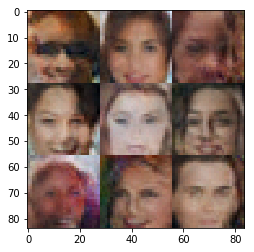

9601.9602.9603.9604.9605.9606.9607.9608.9609.9610.Epoch 2/5... Discriminator Loss: 1.3481... Generator Loss: 0.5891
9611.9612.9613.9614.9615.9616.9617.9618.9619.9620.Epoch 2/5... Discriminator Loss: 1.3844... Generator Loss: 0.5026
9621.9622.9623.9624.9625.9626.9627.9628.9629.9630.Epoch 2/5... Discriminator Loss: 1.3400... Generator Loss: 0.5239
9631.9632.9633.9634.9635.9636.9637.9638.9639.9640.Epoch 2/5... Discriminator Loss: 1.4488... Generator Loss: 0.4114
9641.9642.9643.9644.9645.9646.9647.9648.9649.9650.Epoch 2/5... Discriminator Loss: 1.3251... Generator Loss: 0.5564
9651.9652.9653.9654.9655.9656.9657.9658.9659.9660.Epoch 2/5... Discriminator Loss: 1.3435... Generator Loss: 0.5131
9661.9662.9663.9664.9665.9666.9667.9668.9669.9670.Epoch 2/5... Discriminator Loss: 1.3032... Generator Loss: 0.5236
9671.9672.9673.9674.9675.9676.9677.9678.9679.9680.Epoch 2/5... Discriminator Loss: 1.4521... Generator Loss: 1.0330
9681.9682.9683.9684.9685.9686.9687.9688.9689.9690.Epoch 2/5... Discrimin

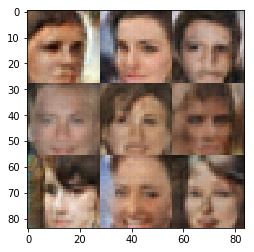

9701.9702.9703.9704.9705.9706.9707.9708.9709.9710.Epoch 2/5... Discriminator Loss: 1.4240... Generator Loss: 0.5017
9711.9712.9713.9714.9715.9716.9717.9718.9719.9720.Epoch 2/5... Discriminator Loss: 1.2619... Generator Loss: 0.6053
9721.9722.9723.9724.9725.9726.9727.9728.9729.9730.Epoch 2/5... Discriminator Loss: 1.8879... Generator Loss: 0.2818
9731.9732.9733.9734.9735.9736.9737.9738.9739.9740.Epoch 2/5... Discriminator Loss: 0.9762... Generator Loss: 1.1420
9741.9742.9743.9744.9745.9746.9747.9748.9749.9750.Epoch 2/5... Discriminator Loss: 1.5526... Generator Loss: 0.4272
9751.9752.9753.9754.9755.9756.9757.9758.9759.9760.Epoch 2/5... Discriminator Loss: 1.3993... Generator Loss: 0.4203
9761.9762.9763.9764.9765.9766.9767.9768.9769.9770.Epoch 2/5... Discriminator Loss: 1.5466... Generator Loss: 0.3226
9771.9772.9773.9774.9775.9776.9777.9778.9779.9780.Epoch 2/5... Discriminator Loss: 1.5823... Generator Loss: 0.5010
9781.9782.9783.9784.9785.9786.9787.9788.9789.9790.Epoch 2/5... Discrimin

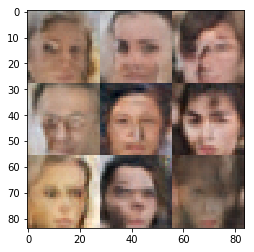

9801.9802.9803.9804.9805.9806.9807.9808.9809.9810.Epoch 2/5... Discriminator Loss: 1.0095... Generator Loss: 0.8568
9811.9812.9813.9814.9815.9816.9817.9818.9819.9820.Epoch 2/5... Discriminator Loss: 1.4002... Generator Loss: 0.4726
9821.9822.9823.9824.9825.9826.9827.9828.9829.9830.Epoch 2/5... Discriminator Loss: 1.1788... Generator Loss: 0.6802
9831.9832.9833.9834.9835.9836.9837.9838.9839.9840.Epoch 2/5... Discriminator Loss: 1.4545... Generator Loss: 0.4821
9841.9842.9843.9844.9845.9846.9847.9848.9849.9850.Epoch 2/5... Discriminator Loss: 1.5269... Generator Loss: 0.3413
9851.9852.9853.9854.9855.9856.9857.9858.9859.9860.Epoch 2/5... Discriminator Loss: 1.0407... Generator Loss: 0.7828
9861.9862.9863.9864.9865.9866.9867.9868.9869.9870.Epoch 2/5... Discriminator Loss: 1.3186... Generator Loss: 0.5206
9871.9872.9873.9874.9875.9876.9877.9878.9879.9880.Epoch 2/5... Discriminator Loss: 1.3028... Generator Loss: 0.7683
9881.9882.9883.9884.9885.9886.9887.9888.9889.9890.Epoch 2/5... Discrimin

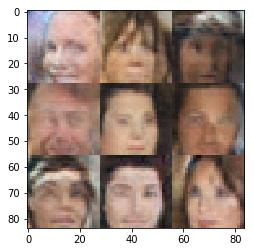

9901.9902.9903.9904.9905.9906.9907.9908.9909.9910.Epoch 2/5... Discriminator Loss: 0.9194... Generator Loss: 0.7311
9911.9912.9913.9914.9915.9916.9917.9918.9919.9920.Epoch 2/5... Discriminator Loss: 1.3109... Generator Loss: 0.6941
9921.9922.9923.9924.9925.9926.9927.9928.9929.9930.Epoch 2/5... Discriminator Loss: 0.9833... Generator Loss: 1.0913
9931.9932.9933.9934.9935.9936.9937.9938.9939.9940.Epoch 2/5... Discriminator Loss: 1.4106... Generator Loss: 0.9688
9941.9942.9943.9944.9945.9946.9947.9948.9949.9950.Epoch 2/5... Discriminator Loss: 1.3932... Generator Loss: 0.7649
9951.9952.9953.9954.9955.9956.9957.9958.9959.9960.Epoch 2/5... Discriminator Loss: 1.0964... Generator Loss: 0.7086
9961.9962.9963.9964.9965.9966.9967.9968.9969.9970.Epoch 2/5... Discriminator Loss: 1.2274... Generator Loss: 1.0428
9971.9972.9973.9974.9975.9976.9977.9978.9979.9980.Epoch 2/5... Discriminator Loss: 1.4009... Generator Loss: 0.6039
9981.9982.9983.9984.9985.9986.9987.9988.9989.9990.Epoch 2/5... Discrimin

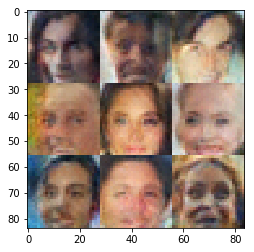

10001.10002.10003.10004.10005.10006.10007.10008.10009.10010.Epoch 2/5... Discriminator Loss: 1.3673... Generator Loss: 0.8407
10011.10012.10013.10014.10015.10016.10017.10018.10019.10020.Epoch 2/5... Discriminator Loss: 1.2297... Generator Loss: 0.7757
10021.10022.10023.10024.10025.10026.10027.10028.10029.10030.Epoch 2/5... Discriminator Loss: 1.5312... Generator Loss: 0.3956
10031.10032.10033.10034.10035.10036.10037.10038.10039.10040.Epoch 2/5... Discriminator Loss: 1.5195... Generator Loss: 0.4066
10041.10042.10043.10044.10045.10046.10047.10048.10049.10050.Epoch 2/5... Discriminator Loss: 1.3920... Generator Loss: 0.6161
10051.10052.10053.10054.10055.10056.10057.10058.10059.10060.Epoch 2/5... Discriminator Loss: 1.4505... Generator Loss: 0.4459
10061.10062.10063.10064.10065.10066.10067.10068.10069.10070.Epoch 2/5... Discriminator Loss: 1.1973... Generator Loss: 0.6107
10071.10072.10073.10074.10075.10076.10077.10078.10079.10080.Epoch 2/5... Discriminator Loss: 1.2353... Generator Loss:

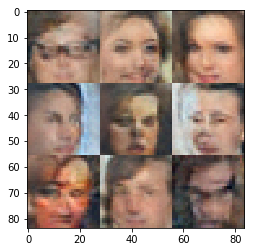

10101.10102.10103.10104.10105.10106.10107.10108.10109.10110.Epoch 2/5... Discriminator Loss: 1.3322... Generator Loss: 0.4636
10111.10112.10113.10114.10115.10116.10117.10118.10119.10120.Epoch 2/5... Discriminator Loss: 1.4029... Generator Loss: 0.7532
10121.10122.10123.10124.10125.10126.10127.10128.10129.10130.Epoch 2/5... Discriminator Loss: 1.1407... Generator Loss: 0.7635
10131.10132.10133.10134.10135.10136.10137.10138.10139.10140.Epoch 2/5... Discriminator Loss: 1.4183... Generator Loss: 0.3877
10141.10142.10143.10144.10145.10146.10147.10148.10149.10150.Epoch 2/5... Discriminator Loss: 1.5430... Generator Loss: 0.3512
10151.10152.10153.10154.10155.10156.10157.10158.10159.10160.Epoch 2/5... Discriminator Loss: 1.2425... Generator Loss: 0.6555
10161.10162.10163.10164.10165.10166.10167.10168.10169.10170.Epoch 2/5... Discriminator Loss: 1.2213... Generator Loss: 0.5430
10171.10172.10173.10174.10175.10176.10177.10178.10179.10180.Epoch 2/5... Discriminator Loss: 1.1607... Generator Loss:

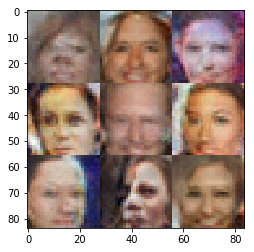

10201.10202.10203.10204.10205.10206.10207.10208.10209.10210.Epoch 2/5... Discriminator Loss: 1.5674... Generator Loss: 0.7877
10211.10212.10213.10214.10215.10216.10217.10218.10219.10220.Epoch 2/5... Discriminator Loss: 1.3490... Generator Loss: 0.4878
10221.10222.10223.10224.10225.10226.10227.10228.10229.10230.Epoch 2/5... Discriminator Loss: 1.3039... Generator Loss: 0.4872
10231.10232.10233.10234.10235.10236.10237.10238.10239.10240.Epoch 2/5... Discriminator Loss: 1.1779... Generator Loss: 0.5592
10241.10242.10243.10244.10245.10246.10247.10248.10249.10250.Epoch 2/5... Discriminator Loss: 1.3716... Generator Loss: 0.6101
10251.10252.10253.10254.10255.10256.10257.10258.10259.10260.Epoch 2/5... Discriminator Loss: 1.1310... Generator Loss: 0.9784
10261.10262.10263.10264.10265.10266.10267.10268.10269.10270.Epoch 2/5... Discriminator Loss: 0.9397... Generator Loss: 1.0606
10271.10272.10273.10274.10275.10276.10277.10278.10279.10280.Epoch 2/5... Discriminator Loss: 1.4137... Generator Loss:

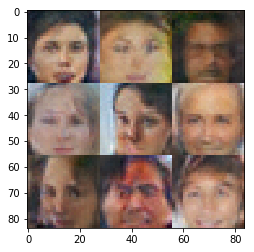

10301.10302.10303.10304.10305.10306.10307.10308.10309.10310.Epoch 2/5... Discriminator Loss: 1.1039... Generator Loss: 0.7036
10311.10312.10313.10314.10315.10316.10317.10318.10319.10320.Epoch 2/5... Discriminator Loss: 1.6708... Generator Loss: 0.4504
10321.10322.10323.10324.10325.10326.10327.10328.10329.10330.Epoch 2/5... Discriminator Loss: 1.5992... Generator Loss: 0.3636
10331.10332.10333.10334.10335.10336.10337.10338.10339.10340.Epoch 2/5... Discriminator Loss: 0.9906... Generator Loss: 0.9249
10341.10342.10343.10344.10345.10346.10347.10348.10349.10350.Epoch 2/5... Discriminator Loss: 1.4272... Generator Loss: 0.4832
10351.10352.10353.10354.10355.10356.10357.10358.10359.10360.Epoch 2/5... Discriminator Loss: 1.0928... Generator Loss: 0.7323
10361.10362.10363.10364.10365.10366.10367.10368.10369.10370.Epoch 2/5... Discriminator Loss: 1.2876... Generator Loss: 0.7830
10371.10372.10373.10374.10375.10376.10377.10378.10379.10380.Epoch 2/5... Discriminator Loss: 1.6250... Generator Loss:

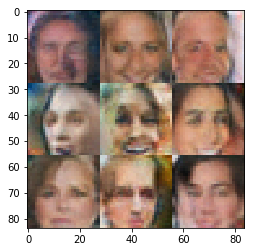

10401.10402.10403.10404.10405.10406.10407.10408.10409.10410.Epoch 2/5... Discriminator Loss: 1.3731... Generator Loss: 0.8955
10411.10412.10413.10414.10415.10416.10417.10418.10419.10420.Epoch 2/5... Discriminator Loss: 1.2388... Generator Loss: 0.6040
10421.10422.10423.10424.10425.10426.10427.10428.10429.10430.Epoch 2/5... Discriminator Loss: 1.3445... Generator Loss: 0.6629
10431.10432.10433.10434.10435.10436.10437.10438.10439.10440.Epoch 2/5... Discriminator Loss: 1.2630... Generator Loss: 0.7310
10441.10442.10443.10444.10445.10446.10447.10448.10449.10450.Epoch 2/5... Discriminator Loss: 1.2616... Generator Loss: 0.5354
10451.10452.10453.10454.10455.10456.10457.10458.10459.10460.Epoch 2/5... Discriminator Loss: 1.2628... Generator Loss: 0.6082
10461.10462.10463.10464.10465.10466.10467.10468.10469.10470.Epoch 2/5... Discriminator Loss: 1.3412... Generator Loss: 0.4829
10471.10472.10473.10474.10475.10476.10477.10478.10479.10480.Epoch 2/5... Discriminator Loss: 1.5627... Generator Loss:

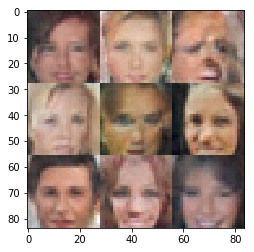

10501.10502.10503.10504.10505.10506.10507.10508.10509.10510.Epoch 2/5... Discriminator Loss: 1.1268... Generator Loss: 0.8627
10511.10512.10513.10514.10515.10516.10517.10518.10519.10520.Epoch 2/5... Discriminator Loss: 1.3635... Generator Loss: 0.6757
10521.10522.10523.10524.10525.10526.10527.10528.10529.10530.Epoch 2/5... Discriminator Loss: 1.3897... Generator Loss: 0.4382
10531.10532.10533.10534.10535.10536.10537.10538.10539.10540.Epoch 2/5... Discriminator Loss: 1.8749... Generator Loss: 0.3999
10541.10542.10543.10544.10545.10546.10547.10548.10549.10550.Epoch 2/5... Discriminator Loss: 1.3205... Generator Loss: 0.5445
10551.10552.10553.10554.10555.10556.10557.10558.10559.10560.Epoch 2/5... Discriminator Loss: 1.9164... Generator Loss: 0.2171
10561.10562.10563.10564.10565.10566.10567.10568.10569.10570.Epoch 2/5... Discriminator Loss: 1.0808... Generator Loss: 0.7461
10571.10572.10573.10574.10575.10576.10577.10578.10579.10580.Epoch 2/5... Discriminator Loss: 1.3152... Generator Loss:

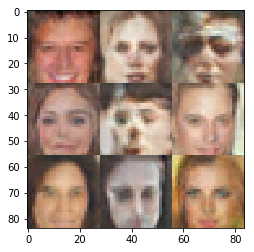

10601.10602.10603.10604.10605.10606.10607.10608.10609.10610.Epoch 2/5... Discriminator Loss: 1.3725... Generator Loss: 0.5140
10611.10612.10613.10614.10615.10616.10617.10618.10619.10620.Epoch 2/5... Discriminator Loss: 0.9525... Generator Loss: 1.3418
10621.10622.10623.10624.10625.10626.10627.10628.10629.10630.Epoch 2/5... Discriminator Loss: 1.1782... Generator Loss: 0.7141
10631.10632.10633.10634.10635.10636.10637.10638.10639.10640.Epoch 2/5... Discriminator Loss: 1.6175... Generator Loss: 0.4130
10641.10642.10643.10644.10645.10646.10647.10648.10649.10650.Epoch 2/5... Discriminator Loss: 1.2705... Generator Loss: 0.6231
10651.10652.10653.10654.10655.10656.10657.10658.10659.10660.Epoch 2/5... Discriminator Loss: 1.2380... Generator Loss: 0.7746
10661.10662.10663.10664.10665.10666.10667.10668.10669.10670.Epoch 2/5... Discriminator Loss: 1.5181... Generator Loss: 1.0277
10671.10672.10673.10674.10675.10676.10677.10678.10679.10680.Epoch 2/5... Discriminator Loss: 1.1006... Generator Loss:

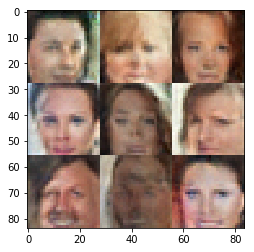

10701.10702.10703.10704.10705.10706.10707.10708.10709.10710.Epoch 2/5... Discriminator Loss: 0.9804... Generator Loss: 0.8941
10711.10712.10713.10714.10715.10716.10717.10718.10719.10720.Epoch 2/5... Discriminator Loss: 1.2347... Generator Loss: 0.6533
10721.10722.10723.10724.10725.10726.10727.10728.10729.10730.Epoch 2/5... Discriminator Loss: 1.2003... Generator Loss: 1.0934
10731.10732.10733.10734.10735.10736.10737.10738.10739.10740.Epoch 2/5... Discriminator Loss: 1.1721... Generator Loss: 0.7148
10741.10742.10743.10744.10745.10746.10747.10748.10749.10750.Epoch 2/5... Discriminator Loss: 1.2231... Generator Loss: 0.8752
10751.10752.10753.10754.10755.10756.10757.10758.10759.10760.Epoch 2/5... Discriminator Loss: 0.9512... Generator Loss: 0.9831
10761.10762.10763.10764.10765.10766.10767.10768.10769.10770.Epoch 2/5... Discriminator Loss: 1.3108... Generator Loss: 0.7077
10771.10772.10773.10774.10775.10776.10777.10778.10779.10780.Epoch 2/5... Discriminator Loss: 1.4433... Generator Loss:

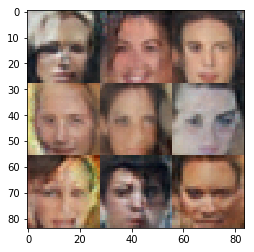

10801.10802.10803.10804.10805.10806.10807.10808.10809.10810.Epoch 2/5... Discriminator Loss: 1.5134... Generator Loss: 0.4286
10811.10812.10813.10814.10815.10816.10817.10818.10819.10820.Epoch 2/5... Discriminator Loss: 1.4962... Generator Loss: 0.9124
10821.10822.10823.10824.10825.10826.10827.10828.10829.10830.Epoch 2/5... Discriminator Loss: 1.0613... Generator Loss: 0.8768
10831.10832.10833.10834.10835.10836.10837.10838.10839.10840.Epoch 2/5... Discriminator Loss: 1.4090... Generator Loss: 0.4077
10841.10842.10843.10844.10845.10846.10847.10848.10849.10850.Epoch 2/5... Discriminator Loss: 1.0638... Generator Loss: 1.2093
10851.10852.10853.10854.10855.10856.10857.10858.10859.10860.Epoch 2/5... Discriminator Loss: 1.3604... Generator Loss: 0.5499
10861.10862.10863.10864.10865.10866.10867.10868.10869.10870.Epoch 2/5... Discriminator Loss: 1.4343... Generator Loss: 0.5447
10871.10872.10873.10874.10875.10876.10877.10878.10879.10880.Epoch 2/5... Discriminator Loss: 1.3447... Generator Loss:

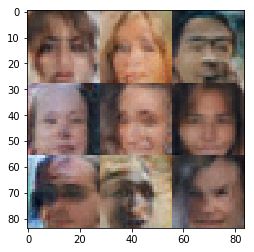

10901.10902.10903.10904.10905.10906.10907.10908.10909.10910.Epoch 2/5... Discriminator Loss: 1.0601... Generator Loss: 0.9687
10911.10912.10913.10914.10915.10916.10917.10918.10919.10920.Epoch 2/5... Discriminator Loss: 1.4222... Generator Loss: 0.6317
10921.10922.10923.10924.10925.10926.10927.10928.10929.10930.Epoch 2/5... Discriminator Loss: 1.0321... Generator Loss: 0.8854
10931.10932.10933.10934.10935.10936.10937.10938.10939.10940.Epoch 2/5... Discriminator Loss: 1.3757... Generator Loss: 0.6879
10941.10942.10943.10944.10945.10946.10947.10948.10949.10950.Epoch 2/5... Discriminator Loss: 1.2677... Generator Loss: 0.6507
10951.10952.10953.10954.10955.10956.10957.10958.10959.10960.Epoch 2/5... Discriminator Loss: 1.3738... Generator Loss: 0.8323
10961.10962.10963.10964.10965.10966.10967.10968.10969.10970.Epoch 2/5... Discriminator Loss: 1.1487... Generator Loss: 0.8671
10971.10972.10973.10974.10975.10976.10977.10978.10979.10980.Epoch 2/5... Discriminator Loss: 1.1345... Generator Loss:

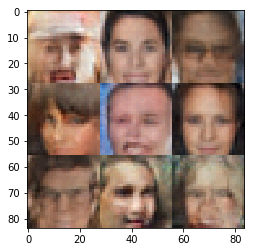

11001.11002.11003.11004.11005.11006.11007.11008.11009.11010.Epoch 2/5... Discriminator Loss: 1.0868... Generator Loss: 0.7323
11011.11012.11013.11014.11015.11016.11017.11018.11019.11020.Epoch 2/5... Discriminator Loss: 1.2384... Generator Loss: 0.8128
11021.11022.11023.11024.11025.11026.11027.11028.11029.11030.Epoch 2/5... Discriminator Loss: 1.1267... Generator Loss: 0.7481
11031.11032.11033.11034.11035.11036.11037.11038.11039.11040.Epoch 2/5... Discriminator Loss: 1.3477... Generator Loss: 1.2125
11041.11042.11043.11044.11045.11046.11047.11048.11049.11050.Epoch 2/5... Discriminator Loss: 1.3300... Generator Loss: 0.4683
11051.11052.11053.11054.11055.11056.11057.11058.11059.11060.Epoch 2/5... Discriminator Loss: 1.2272... Generator Loss: 0.6370
11061.11062.11063.11064.11065.11066.11067.11068.11069.11070.Epoch 2/5... Discriminator Loss: 1.5732... Generator Loss: 0.3758
11071.11072.11073.11074.11075.11076.11077.11078.11079.11080.Epoch 2/5... Discriminator Loss: 1.0602... Generator Loss:

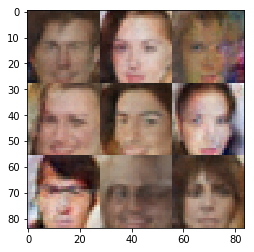

11101.11102.11103.11104.11105.11106.11107.11108.11109.11110.Epoch 2/5... Discriminator Loss: 1.2691... Generator Loss: 0.8224
11111.11112.11113.11114.11115.11116.11117.11118.11119.11120.Epoch 2/5... Discriminator Loss: 1.2122... Generator Loss: 0.7562
11121.11122.11123.11124.11125.11126.11127.11128.11129.11130.Epoch 2/5... Discriminator Loss: 1.4638... Generator Loss: 0.4555
11131.11132.11133.11134.11135.11136.11137.11138.11139.11140.Epoch 2/5... Discriminator Loss: 1.0806... Generator Loss: 0.8453
11141.11142.11143.11144.11145.11146.11147.11148.11149.11150.Epoch 2/5... Discriminator Loss: 1.3694... Generator Loss: 0.5027
11151.11152.11153.11154.11155.11156.11157.11158.11159.11160.Epoch 2/5... Discriminator Loss: 1.2019... Generator Loss: 0.6072
11161.11162.11163.11164.11165.11166.11167.11168.11169.11170.Epoch 2/5... Discriminator Loss: 1.6139... Generator Loss: 0.5169
11171.11172.11173.11174.11175.11176.11177.11178.11179.11180.Epoch 2/5... Discriminator Loss: 1.1788... Generator Loss:

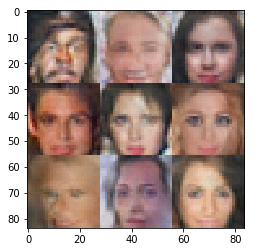

11201.11202.11203.11204.11205.11206.11207.11208.11209.11210.Epoch 2/5... Discriminator Loss: 1.2381... Generator Loss: 0.6533
11211.11212.11213.11214.11215.11216.11217.11218.11219.11220.Epoch 2/5... Discriminator Loss: 1.5360... Generator Loss: 0.7743
11221.11222.11223.11224.11225.11226.11227.11228.11229.11230.Epoch 2/5... Discriminator Loss: 1.2393... Generator Loss: 0.6966
11231.11232.11233.11234.11235.11236.11237.11238.11239.11240.Epoch 2/5... Discriminator Loss: 0.7760... Generator Loss: 1.3192
11241.11242.11243.11244.11245.11246.11247.11248.11249.11250.Epoch 2/5... Discriminator Loss: 1.8373... Generator Loss: 0.2771
11251.11252.11253.11254.11255.11256.11257.11258.11259.11260.Epoch 2/5... Discriminator Loss: 1.1171... Generator Loss: 0.7790
11261.11262.11263.11264.11265.11266.11267.11268.11269.11270.Epoch 2/5... Discriminator Loss: 1.2579... Generator Loss: 0.9553
11271.11272.11273.11274.11275.11276.11277.11278.11279.11280.Epoch 2/5... Discriminator Loss: 0.9361... Generator Loss:

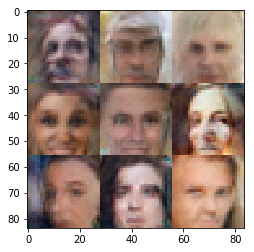

11301.11302.11303.11304.11305.11306.11307.11308.11309.11310.Epoch 2/5... Discriminator Loss: 1.3198... Generator Loss: 0.7533
11311.11312.11313.11314.11315.11316.11317.11318.11319.11320.Epoch 2/5... Discriminator Loss: 1.1454... Generator Loss: 0.5909
11321.11322.11323.11324.11325.11326.11327.11328.11329.11330.Epoch 2/5... Discriminator Loss: 0.6079... Generator Loss: 2.1801
11331.11332.11333.11334.11335.11336.11337.11338.11339.11340.Epoch 2/5... Discriminator Loss: 0.6879... Generator Loss: 1.0562
11341.11342.11343.11344.11345.11346.11347.11348.11349.11350.Epoch 2/5... Discriminator Loss: 0.6443... Generator Loss: 2.2695
11351.11352.11353.11354.11355.11356.11357.11358.11359.11360.Epoch 2/5... Discriminator Loss: 1.5327... Generator Loss: 0.3695
11361.11362.11363.11364.11365.11366.11367.11368.11369.11370.Epoch 2/5... Discriminator Loss: 0.9787... Generator Loss: 0.9019
11371.11372.11373.11374.11375.11376.11377.11378.11379.11380.Epoch 2/5... Discriminator Loss: 0.3640... Generator Loss:

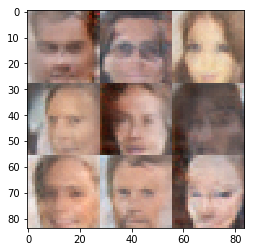

11401.11402.11403.11404.11405.11406.11407.11408.11409.11410.Epoch 2/5... Discriminator Loss: 0.1498... Generator Loss: 3.7679
11411.11412.11413.11414.11415.11416.11417.11418.11419.11420.Epoch 2/5... Discriminator Loss: 0.8395... Generator Loss: 1.1072
11421.11422.11423.11424.11425.11426.11427.11428.11429.11430.Epoch 2/5... Discriminator Loss: 0.1051... Generator Loss: 5.8507
11431.11432.11433.11434.11435.11436.11437.11438.11439.11440.Epoch 2/5... Discriminator Loss: 0.5639... Generator Loss: 8.5715
11441.11442.11443.11444.11445.11446.11447.11448.11449.11450.Epoch 2/5... Discriminator Loss: 1.9097... Generator Loss: 0.2026
11451.11452.11453.11454.11455.11456.11457.11458.11459.11460.Epoch 2/5... Discriminator Loss: 0.2206... Generator Loss: 3.3498
11461.11462.11463.11464.11465.11466.11467.11468.11469.11470.Epoch 2/5... Discriminator Loss: 1.1908... Generator Loss: 5.5507
11471.11472.11473.11474.11475.11476.11477.11478.11479.11480.Epoch 2/5... Discriminator Loss: 0.1567... Generator Loss:

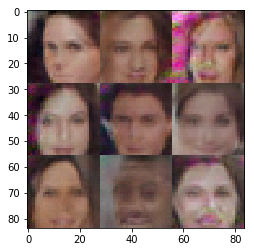

11501.11502.11503.11504.11505.11506.11507.11508.11509.11510.Epoch 2/5... Discriminator Loss: 0.1175... Generator Loss: 4.0334
11511.11512.11513.11514.11515.11516.11517.11518.11519.11520.Epoch 2/5... Discriminator Loss: 1.0662... Generator Loss: 4.7191
11521.11522.11523.11524.11525.11526.11527.11528.11529.11530.Epoch 2/5... Discriminator Loss: 0.0665... Generator Loss: 5.6062
11531.11532.11533.11534.11535.11536.11537.11538.11539.11540.Epoch 2/5... Discriminator Loss: 0.0280... Generator Loss: 4.6394
11541.11542.11543.11544.11545.11546.11547.11548.11549.11550.Epoch 2/5... Discriminator Loss: 0.0503... Generator Loss: 3.5292
11551.11552.11553.11554.11555.11556.11557.11558.11559.11560.Epoch 2/5... Discriminator Loss: 0.6530... Generator Loss: 0.9543
11561.11562.11563.11564.11565.11566.11567.11568.11569.11570.Epoch 2/5... Discriminator Loss: 0.0756... Generator Loss: 5.9299
11571.11572.11573.11574.11575.11576.11577.11578.11579.11580.Epoch 2/5... Discriminator Loss: 0.5685... Generator Loss:

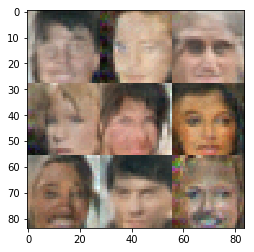

11601.11602.11603.11604.11605.11606.11607.11608.11609.11610.Epoch 2/5... Discriminator Loss: 0.8902... Generator Loss: 2.6564
11611.11612.11613.11614.11615.11616.11617.11618.11619.11620.Epoch 2/5... Discriminator Loss: 0.7305... Generator Loss: 2.7258
11621.11622.11623.11624.11625.11626.11627.11628.11629.11630.Epoch 2/5... Discriminator Loss: 0.2340... Generator Loss: 2.1332
11631.11632.11633.11634.11635.11636.11637.11638.11639.11640.Epoch 2/5... Discriminator Loss: 0.4327... Generator Loss: 3.8447
11641.11642.11643.11644.11645.11646.11647.11648.11649.11650.Epoch 2/5... Discriminator Loss: 0.4477... Generator Loss: 1.8124
11651.11652.11653.11654.11655.11656.11657.11658.11659.11660.Epoch 2/5... Discriminator Loss: 0.6400... Generator Loss: 1.2044
11661.11662.11663.11664.11665.11666.11667.11668.11669.11670.Epoch 2/5... Discriminator Loss: 0.4548... Generator Loss: 7.2907
11671.11672.11673.11674.11675.11676.11677.11678.11679.11680.Epoch 2/5... Discriminator Loss: 1.2747... Generator Loss:

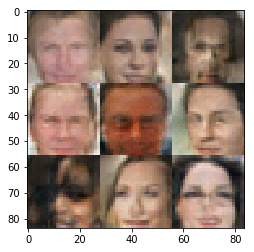

11701.11702.11703.11704.11705.11706.11707.11708.11709.11710.Epoch 2/5... Discriminator Loss: 0.0622... Generator Loss: 4.8878
11711.11712.11713.11714.11715.11716.11717.11718.11719.11720.Epoch 2/5... Discriminator Loss: 3.1959... Generator Loss: 0.0569
11721.11722.11723.11724.11725.11726.11727.11728.11729.11730.Epoch 2/5... Discriminator Loss: 1.2599... Generator Loss: 0.4760
11731.11732.11733.11734.11735.11736.11737.11738.11739.11740.Epoch 2/5... Discriminator Loss: 1.2771... Generator Loss: 0.4751
11741.11742.11743.11744.11745.11746.11747.11748.11749.11750.Epoch 2/5... Discriminator Loss: 1.4204... Generator Loss: 0.4725
11751.11752.11753.11754.11755.11756.11757.11758.11759.11760.Epoch 2/5... Discriminator Loss: 1.4229... Generator Loss: 0.7181
11761.11762.11763.11764.11765.11766.11767.11768.11769.11770.Epoch 2/5... Discriminator Loss: 1.0253... Generator Loss: 0.8852
11771.11772.11773.11774.11775.11776.11777.11778.11779.11780.Epoch 2/5... Discriminator Loss: 1.4871... Generator Loss:

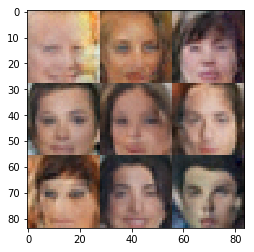

11801.11802.11803.11804.11805.11806.11807.11808.11809.11810.Epoch 2/5... Discriminator Loss: 1.1509... Generator Loss: 0.6187
11811.11812.11813.11814.11815.11816.11817.11818.11819.11820.Epoch 2/5... Discriminator Loss: 1.0698... Generator Loss: 0.6252
11821.11822.11823.11824.11825.11826.11827.11828.11829.11830.Epoch 2/5... Discriminator Loss: 1.1734... Generator Loss: 0.5163
11831.11832.11833.11834.11835.11836.11837.11838.11839.11840.Epoch 2/5... Discriminator Loss: 1.5155... Generator Loss: 0.4846
11841.11842.11843.11844.11845.11846.11847.11848.11849.11850.Epoch 2/5... Discriminator Loss: 1.0192... Generator Loss: 0.7707
11851.11852.11853.11854.11855.11856.11857.11858.11859.11860.Epoch 2/5... Discriminator Loss: 1.1524... Generator Loss: 0.7898
11861.11862.11863.11864.11865.11866.11867.11868.11869.11870.Epoch 2/5... Discriminator Loss: 1.4666... Generator Loss: 0.6586
11871.11872.11873.11874.11875.11876.11877.11878.11879.11880.Epoch 2/5... Discriminator Loss: 1.0984... Generator Loss:

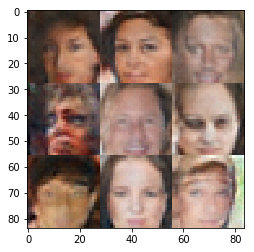

11901.11902.11903.11904.11905.11906.11907.11908.11909.11910.Epoch 2/5... Discriminator Loss: 1.3370... Generator Loss: 0.4831
11911.11912.11913.11914.11915.11916.11917.11918.11919.11920.Epoch 2/5... Discriminator Loss: 1.0855... Generator Loss: 0.7115
11921.11922.11923.11924.11925.11926.11927.11928.11929.11930.Epoch 2/5... Discriminator Loss: 0.9322... Generator Loss: 1.0218
11931.11932.11933.11934.11935.11936.11937.11938.11939.11940.Epoch 2/5... Discriminator Loss: 1.2359... Generator Loss: 0.5009
11941.11942.11943.11944.11945.11946.11947.11948.11949.11950.Epoch 2/5... Discriminator Loss: 1.3120... Generator Loss: 0.5777
11951.11952.11953.11954.11955.11956.11957.11958.11959.11960.Epoch 2/5... Discriminator Loss: 0.7823... Generator Loss: 0.9900
11961.11962.11963.11964.11965.11966.11967.11968.11969.11970.Epoch 2/5... Discriminator Loss: 1.3582... Generator Loss: 0.5811
11971.11972.11973.11974.11975.11976.11977.11978.11979.11980.Epoch 2/5... Discriminator Loss: 1.5833... Generator Loss:

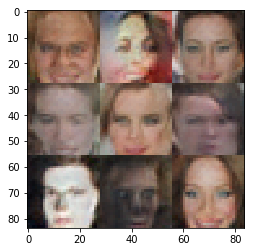

12001.12002.12003.12004.12005.12006.12007.12008.12009.12010.Epoch 2/5... Discriminator Loss: 1.1842... Generator Loss: 1.1409
12011.12012.12013.12014.12015.12016.12017.12018.12019.12020.Epoch 2/5... Discriminator Loss: 1.2083... Generator Loss: 0.7653
12021.12022.12023.12024.12025.12026.12027.12028.12029.12030.Epoch 2/5... Discriminator Loss: 1.3248... Generator Loss: 0.6603
12031.12032.12033.12034.12035.12036.12037.12038.12039.12040.Epoch 2/5... Discriminator Loss: 1.4714... Generator Loss: 0.6543
12041.12042.12043.12044.12045.12046.12047.12048.12049.12050.Epoch 2/5... Discriminator Loss: 1.3435... Generator Loss: 0.7171
12051.12052.12053.12054.12055.12056.12057.12058.12059.12060.Epoch 2/5... Discriminator Loss: 1.4048... Generator Loss: 0.6616
12061.12062.12063.12064.12065.12066.12067.12068.12069.12070.Epoch 2/5... Discriminator Loss: 0.9960... Generator Loss: 0.7846
12071.12072.12073.12074.12075.12076.12077.12078.12079.12080.Epoch 2/5... Discriminator Loss: 1.2939... Generator Loss:

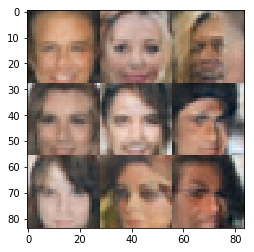

12101.12102.12103.12104.12105.12106.12107.12108.12109.12110.Epoch 2/5... Discriminator Loss: 1.2172... Generator Loss: 0.6392
12111.12112.12113.12114.12115.12116.12117.12118.12119.12120.Epoch 2/5... Discriminator Loss: 1.3388... Generator Loss: 0.5439
12121.12122.12123.12124.12125.12126.12127.12128.12129.12130.Epoch 2/5... Discriminator Loss: 1.1339... Generator Loss: 0.7767
12131.12132.12133.12134.12135.12136.12137.12138.12139.12140.Epoch 2/5... Discriminator Loss: 1.6234... Generator Loss: 0.3866
12141.12142.12143.12144.12145.12146.12147.12148.12149.12150.Epoch 2/5... Discriminator Loss: 1.2054... Generator Loss: 0.7102
12151.12152.12153.12154.12155.12156.12157.12158.12159.12160.Epoch 2/5... Discriminator Loss: 1.2059... Generator Loss: 0.8180
12161.12162.12163.12164.12165.12166.12167.12168.12169.12170.Epoch 2/5... Discriminator Loss: 1.2212... Generator Loss: 0.6484
12171.12172.12173.12174.12175.12176.12177.12178.12179.12180.Epoch 2/5... Discriminator Loss: 1.2009... Generator Loss:

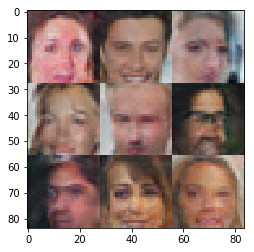

12201.12202.12203.12204.12205.12206.12207.12208.12209.12210.Epoch 2/5... Discriminator Loss: 1.3254... Generator Loss: 0.6171
12211.12212.12213.12214.12215.12216.12217.12218.12219.12220.Epoch 2/5... Discriminator Loss: 1.1619... Generator Loss: 0.6051
12221.12222.12223.12224.12225.12226.12227.12228.12229.12230.Epoch 2/5... Discriminator Loss: 1.5287... Generator Loss: 0.4819
12231.12232.12233.12234.12235.12236.12237.12238.12239.12240.Epoch 2/5... Discriminator Loss: 1.1974... Generator Loss: 0.8500
12241.12242.12243.12244.12245.12246.12247.12248.12249.12250.Epoch 2/5... Discriminator Loss: 1.2198... Generator Loss: 1.0266
12251.12252.12253.12254.12255.12256.12257.12258.12259.12260.Epoch 2/5... Discriminator Loss: 1.5209... Generator Loss: 0.3435
12261.12262.12263.12264.12265.12266.12267.12268.12269.12270.Epoch 2/5... Discriminator Loss: 1.3983... Generator Loss: 0.4170
12271.12272.12273.12274.12275.12276.12277.12278.12279.12280.Epoch 2/5... Discriminator Loss: 1.5828... Generator Loss:

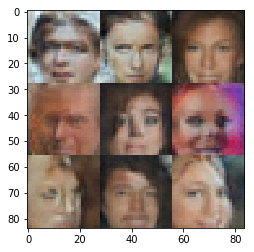

12301.12302.12303.12304.12305.12306.12307.12308.12309.12310.Epoch 2/5... Discriminator Loss: 1.0695... Generator Loss: 0.9670
12311.12312.12313.12314.12315.12316.12317.12318.12319.12320.Epoch 2/5... Discriminator Loss: 1.2142... Generator Loss: 0.5827
12321.12322.12323.12324.12325.12326.12327.12328.12329.12330.Epoch 2/5... Discriminator Loss: 1.1832... Generator Loss: 0.7898
12331.12332.12333.12334.12335.12336.12337.12338.12339.12340.Epoch 2/5... Discriminator Loss: 1.2544... Generator Loss: 0.7123
12341.12342.12343.12344.12345.12346.12347.12348.12349.12350.Epoch 2/5... Discriminator Loss: 1.5301... Generator Loss: 0.4722
12351.12352.12353.12354.12355.12356.12357.12358.12359.12360.Epoch 2/5... Discriminator Loss: 1.2200... Generator Loss: 0.7214
12361.12362.12363.12364.12365.12366.12367.12368.12369.12370.Epoch 2/5... Discriminator Loss: 1.2900... Generator Loss: 0.6844
12371.12372.12373.12374.12375.12376.12377.12378.12379.12380.Epoch 2/5... Discriminator Loss: 1.2848... Generator Loss:

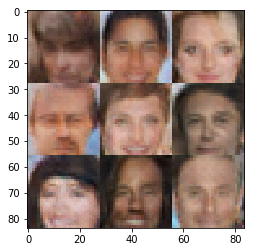

12401.12402.12403.12404.12405.12406.12407.12408.12409.12410.Epoch 2/5... Discriminator Loss: 1.0770... Generator Loss: 0.7929
12411.12412.12413.12414.12415.12416.12417.12418.12419.12420.Epoch 2/5... Discriminator Loss: 1.1904... Generator Loss: 0.8374
12421.12422.12423.12424.12425.12426.12427.12428.12429.12430.Epoch 2/5... Discriminator Loss: 1.0205... Generator Loss: 0.9290
12431.12432.12433.12434.12435.12436.12437.12438.12439.12440.Epoch 2/5... Discriminator Loss: 1.3210... Generator Loss: 0.8690
12441.12442.12443.12444.12445.12446.12447.12448.12449.12450.Epoch 2/5... Discriminator Loss: 1.3064... Generator Loss: 0.7514
12451.12452.12453.12454.12455.12456.12457.12458.12459.12460.Epoch 2/5... Discriminator Loss: 1.3634... Generator Loss: 0.7836
12461.12462.12463.12464.12465.12466.12467.12468.12469.12470.Epoch 2/5... Discriminator Loss: 1.0856... Generator Loss: 0.9111
12471.12472.12473.12474.12475.12476.12477.12478.12479.12480.Epoch 2/5... Discriminator Loss: 1.2494... Generator Loss:

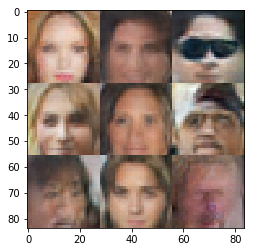

12501.12502.12503.12504.12505.12506.12507.12508.12509.12510.Epoch 2/5... Discriminator Loss: 1.4087... Generator Loss: 0.5445
12511.12512.12513.12514.12515.12516.12517.12518.12519.12520.Epoch 2/5... Discriminator Loss: 1.5860... Generator Loss: 0.3877
12521.12522.12523.12524.12525.12526.12527.12528.12529.12530.Epoch 2/5... Discriminator Loss: 1.2559... Generator Loss: 0.6477
12531.12532.12533.12534.12535.12536.12537.12538.12539.12540.Epoch 2/5... Discriminator Loss: 1.1551... Generator Loss: 0.7904
12541.12542.12543.12544.12545.12546.12547.12548.12549.12550.Epoch 2/5... Discriminator Loss: 1.2719... Generator Loss: 1.0476
12551.12552.12553.12554.12555.12556.12557.12558.12559.12560.Epoch 2/5... Discriminator Loss: 1.2244... Generator Loss: 0.7254
12561.12562.12563.12564.12565.12566.12567.12568.12569.12570.Epoch 2/5... Discriminator Loss: 1.3633... Generator Loss: 0.4849
12571.12572.12573.12574.12575.12576.12577.12578.12579.12580.Epoch 2/5... Discriminator Loss: 1.6219... Generator Loss:

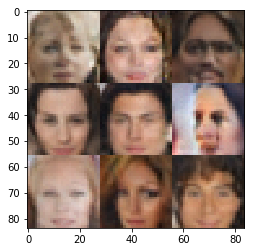

12601.12602.12603.12604.12605.12606.12607.12608.12609.12610.Epoch 2/5... Discriminator Loss: 1.1733... Generator Loss: 0.7737
12611.12612.12613.12614.12615.12616.12617.12618.12619.12620.Epoch 2/5... Discriminator Loss: 1.2298... Generator Loss: 0.7393
12621.12622.12623.12624.12625.12626.12627.12628.12629.12630.Epoch 2/5... Discriminator Loss: 1.4577... Generator Loss: 0.3718
12631.12632.12633.12634.12635.12636.12637.12638.12639.12640.Epoch 2/5... Discriminator Loss: 1.1322... Generator Loss: 0.7294
12641.12642.12643.12644.12645.12646.12647.12648.12649.12650.Epoch 2/5... Discriminator Loss: 1.5439... Generator Loss: 0.4910
12651.12652.12653.12654.12655.12656.12657.12658.12659.12660.Epoch 2/5... Discriminator Loss: 1.4752... Generator Loss: 0.5334
12661.12662.12663.12664.12665.12666.12667.12668.12669.12670.Epoch 3/5... Discriminator Loss: 1.4060... Generator Loss: 0.4312
12671.12672.12673.12674.12675.12676.12677.12678.12679.12680.Epoch 3/5... Discriminator Loss: 1.4086... Generator Loss:

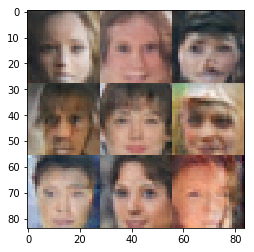

12701.12702.12703.12704.12705.12706.12707.12708.12709.12710.Epoch 3/5... Discriminator Loss: 1.3013... Generator Loss: 0.6949
12711.12712.12713.12714.12715.12716.12717.12718.12719.12720.Epoch 3/5... Discriminator Loss: 1.2612... Generator Loss: 0.6455
12721.12722.12723.12724.12725.12726.12727.12728.12729.12730.Epoch 3/5... Discriminator Loss: 1.3671... Generator Loss: 0.8990
12731.12732.12733.12734.12735.12736.12737.12738.12739.12740.Epoch 3/5... Discriminator Loss: 1.3112... Generator Loss: 0.5895
12741.12742.12743.12744.12745.12746.12747.12748.12749.12750.Epoch 3/5... Discriminator Loss: 1.3516... Generator Loss: 0.6420
12751.12752.12753.12754.12755.12756.12757.12758.12759.12760.Epoch 3/5... Discriminator Loss: 1.3206... Generator Loss: 0.6201
12761.12762.12763.12764.12765.12766.12767.12768.12769.12770.Epoch 3/5... Discriminator Loss: 1.2526... Generator Loss: 0.6222
12771.12772.12773.12774.12775.12776.12777.12778.12779.12780.Epoch 3/5... Discriminator Loss: 1.0765... Generator Loss:

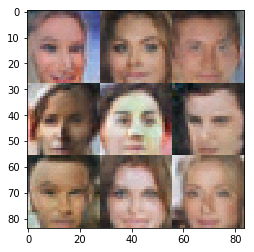

12801.12802.12803.12804.12805.12806.12807.12808.12809.12810.Epoch 3/5... Discriminator Loss: 1.5592... Generator Loss: 0.4339
12811.12812.12813.12814.12815.12816.12817.12818.12819.12820.Epoch 3/5... Discriminator Loss: 1.3164... Generator Loss: 1.0422
12821.12822.12823.12824.12825.12826.12827.12828.12829.12830.Epoch 3/5... Discriminator Loss: 1.2651... Generator Loss: 0.7739
12831.12832.12833.12834.12835.12836.12837.12838.12839.12840.Epoch 3/5... Discriminator Loss: 1.2663... Generator Loss: 0.5872
12841.12842.12843.12844.12845.12846.12847.12848.12849.12850.Epoch 3/5... Discriminator Loss: 1.7427... Generator Loss: 0.3197
12851.12852.12853.12854.12855.12856.12857.12858.12859.12860.Epoch 3/5... Discriminator Loss: 1.2844... Generator Loss: 0.6102
12861.12862.12863.12864.12865.12866.12867.12868.12869.12870.Epoch 3/5... Discriminator Loss: 1.5863... Generator Loss: 0.5198
12871.12872.12873.12874.12875.12876.12877.12878.12879.12880.Epoch 3/5... Discriminator Loss: 1.1538... Generator Loss:

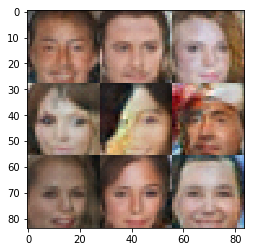

12901.12902.12903.12904.12905.12906.12907.12908.12909.12910.Epoch 3/5... Discriminator Loss: 1.3963... Generator Loss: 0.6042
12911.12912.12913.12914.12915.12916.12917.12918.12919.12920.Epoch 3/5... Discriminator Loss: 1.3799... Generator Loss: 0.5668
12921.12922.12923.12924.12925.12926.12927.12928.12929.12930.Epoch 3/5... Discriminator Loss: 1.5710... Generator Loss: 0.5125
12931.12932.12933.12934.12935.12936.12937.12938.12939.12940.Epoch 3/5... Discriminator Loss: 1.4014... Generator Loss: 0.6820
12941.12942.12943.12944.12945.12946.12947.12948.12949.12950.Epoch 3/5... Discriminator Loss: 1.7344... Generator Loss: 0.5025
12951.12952.12953.12954.12955.12956.12957.12958.12959.12960.Epoch 3/5... Discriminator Loss: 1.4388... Generator Loss: 0.7942
12961.12962.12963.12964.12965.12966.12967.12968.12969.12970.Epoch 3/5... Discriminator Loss: 1.4928... Generator Loss: 0.6201
12971.12972.12973.12974.12975.12976.12977.12978.12979.12980.Epoch 3/5... Discriminator Loss: 1.6130... Generator Loss:

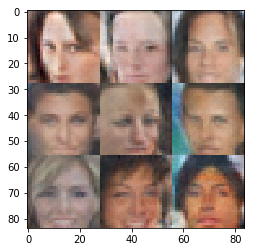

13001.13002.13003.13004.13005.13006.13007.13008.13009.13010.Epoch 3/5... Discriminator Loss: 1.4199... Generator Loss: 0.4755
13011.13012.13013.13014.13015.13016.13017.13018.13019.13020.Epoch 3/5... Discriminator Loss: 1.1726... Generator Loss: 0.8021
13021.13022.13023.13024.13025.13026.13027.13028.13029.13030.Epoch 3/5... Discriminator Loss: 1.2597... Generator Loss: 0.6095
13031.13032.13033.13034.13035.13036.13037.13038.13039.13040.Epoch 3/5... Discriminator Loss: 1.2109... Generator Loss: 0.7451
13041.13042.13043.13044.13045.13046.13047.13048.13049.13050.Epoch 3/5... Discriminator Loss: 1.4333... Generator Loss: 0.5078
13051.13052.13053.13054.13055.13056.13057.13058.13059.13060.Epoch 3/5... Discriminator Loss: 1.3820... Generator Loss: 0.7458
13061.13062.13063.13064.13065.13066.13067.13068.13069.13070.Epoch 3/5... Discriminator Loss: 1.3042... Generator Loss: 0.5395
13071.13072.13073.13074.13075.13076.13077.13078.13079.13080.Epoch 3/5... Discriminator Loss: 1.2852... Generator Loss:

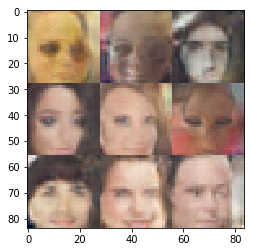

13101.13102.13103.13104.13105.13106.13107.13108.13109.13110.Epoch 3/5... Discriminator Loss: 1.2848... Generator Loss: 0.7976
13111.13112.13113.13114.13115.13116.13117.13118.13119.13120.Epoch 3/5... Discriminator Loss: 1.1061... Generator Loss: 1.0225
13121.13122.13123.13124.13125.13126.13127.13128.13129.13130.Epoch 3/5... Discriminator Loss: 1.3978... Generator Loss: 0.6258
13131.13132.13133.13134.13135.13136.13137.13138.13139.13140.Epoch 3/5... Discriminator Loss: 1.4867... Generator Loss: 0.4472
13141.13142.13143.13144.13145.13146.13147.13148.13149.13150.Epoch 3/5... Discriminator Loss: 1.3452... Generator Loss: 0.5792
13151.13152.13153.13154.13155.13156.13157.13158.13159.13160.Epoch 3/5... Discriminator Loss: 1.3660... Generator Loss: 0.4379
13161.13162.13163.13164.13165.13166.13167.13168.13169.13170.Epoch 3/5... Discriminator Loss: 1.0071... Generator Loss: 0.9705
13171.13172.13173.13174.13175.13176.13177.13178.13179.13180.Epoch 3/5... Discriminator Loss: 1.1960... Generator Loss:

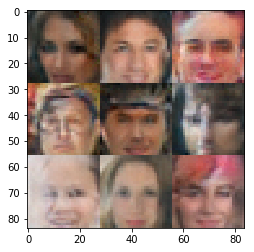

13201.13202.13203.13204.13205.13206.13207.13208.13209.13210.Epoch 3/5... Discriminator Loss: 1.1473... Generator Loss: 0.7271
13211.13212.13213.13214.13215.13216.13217.13218.13219.13220.Epoch 3/5... Discriminator Loss: 1.0928... Generator Loss: 1.1642
13221.13222.13223.13224.13225.13226.13227.13228.13229.13230.Epoch 3/5... Discriminator Loss: 1.3416... Generator Loss: 0.5712
13231.13232.13233.13234.13235.13236.13237.13238.13239.13240.Epoch 3/5... Discriminator Loss: 1.4222... Generator Loss: 0.5142
13241.13242.13243.13244.13245.13246.13247.13248.13249.13250.Epoch 3/5... Discriminator Loss: 1.0766... Generator Loss: 1.0509
13251.13252.13253.13254.13255.13256.13257.13258.13259.13260.Epoch 3/5... Discriminator Loss: 1.4169... Generator Loss: 0.5880
13261.13262.13263.13264.13265.13266.13267.13268.13269.13270.Epoch 3/5... Discriminator Loss: 1.4646... Generator Loss: 0.5015
13271.13272.13273.13274.13275.13276.13277.13278.13279.13280.Epoch 3/5... Discriminator Loss: 1.3609... Generator Loss:

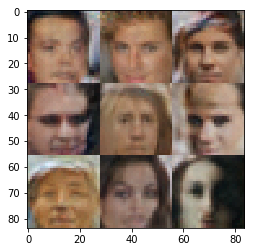

13301.13302.13303.13304.13305.13306.13307.13308.13309.13310.Epoch 3/5... Discriminator Loss: 1.3221... Generator Loss: 0.5690
13311.13312.13313.13314.13315.13316.13317.13318.13319.13320.Epoch 3/5... Discriminator Loss: 1.3443... Generator Loss: 0.5174
13321.13322.13323.13324.13325.13326.13327.13328.13329.13330.Epoch 3/5... Discriminator Loss: 1.3336... Generator Loss: 0.7439
13331.13332.13333.13334.13335.13336.13337.13338.13339.13340.Epoch 3/5... Discriminator Loss: 1.0672... Generator Loss: 0.9910
13341.13342.13343.13344.13345.13346.13347.13348.13349.13350.Epoch 3/5... Discriminator Loss: 0.9084... Generator Loss: 0.7189
13351.13352.13353.13354.13355.13356.13357.13358.13359.13360.Epoch 3/5... Discriminator Loss: 1.1934... Generator Loss: 0.7413
13361.13362.13363.13364.13365.13366.13367.13368.13369.13370.Epoch 3/5... Discriminator Loss: 1.6558... Generator Loss: 0.5076
13371.13372.13373.13374.13375.13376.13377.13378.13379.13380.Epoch 3/5... Discriminator Loss: 0.8862... Generator Loss:

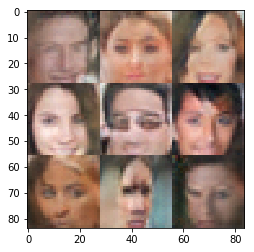

13401.13402.13403.13404.13405.13406.13407.13408.13409.13410.Epoch 3/5... Discriminator Loss: 1.1570... Generator Loss: 0.7255
13411.13412.13413.13414.13415.13416.13417.13418.13419.13420.Epoch 3/5... Discriminator Loss: 1.2726... Generator Loss: 0.6687
13421.13422.13423.13424.13425.13426.13427.13428.13429.13430.Epoch 3/5... Discriminator Loss: 1.4282... Generator Loss: 0.4523
13431.13432.13433.13434.13435.13436.13437.13438.13439.13440.Epoch 3/5... Discriminator Loss: 1.4121... Generator Loss: 0.5764
13441.13442.13443.13444.13445.13446.13447.13448.13449.13450.Epoch 3/5... Discriminator Loss: 1.2801... Generator Loss: 0.5584
13451.13452.13453.13454.13455.13456.13457.13458.13459.13460.Epoch 3/5... Discriminator Loss: 1.0941... Generator Loss: 1.0788
13461.13462.13463.13464.13465.13466.13467.13468.13469.13470.Epoch 3/5... Discriminator Loss: 1.0680... Generator Loss: 1.0650
13471.13472.13473.13474.13475.13476.13477.13478.13479.13480.Epoch 3/5... Discriminator Loss: 1.2445... Generator Loss:

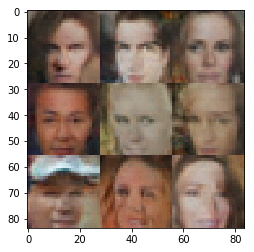

13501.13502.13503.13504.13505.13506.13507.13508.13509.13510.Epoch 3/5... Discriminator Loss: 1.1989... Generator Loss: 0.8034
13511.13512.13513.13514.13515.13516.13517.13518.13519.13520.Epoch 3/5... Discriminator Loss: 1.0671... Generator Loss: 0.9683
13521.13522.13523.13524.13525.13526.13527.13528.13529.13530.Epoch 3/5... Discriminator Loss: 1.4130... Generator Loss: 0.6599
13531.13532.13533.13534.13535.13536.13537.13538.13539.13540.Epoch 3/5... Discriminator Loss: 1.1269... Generator Loss: 0.7221
13541.13542.13543.13544.13545.13546.13547.13548.13549.13550.Epoch 3/5... Discriminator Loss: 1.0745... Generator Loss: 0.8813
13551.13552.13553.13554.13555.13556.13557.13558.13559.13560.Epoch 3/5... Discriminator Loss: 1.0225... Generator Loss: 1.1440
13561.13562.13563.13564.13565.13566.13567.13568.13569.13570.Epoch 3/5... Discriminator Loss: 1.0015... Generator Loss: 0.8131
13571.13572.13573.13574.13575.13576.13577.13578.13579.13580.Epoch 3/5... Discriminator Loss: 1.1582... Generator Loss:

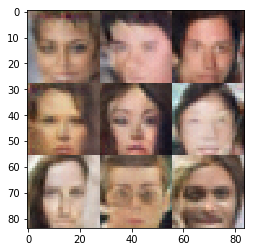

13601.13602.13603.13604.13605.13606.13607.13608.13609.13610.Epoch 3/5... Discriminator Loss: 1.1827... Generator Loss: 0.7384
13611.13612.13613.13614.13615.13616.13617.13618.13619.13620.Epoch 3/5... Discriminator Loss: 1.5331... Generator Loss: 0.4751
13621.13622.13623.13624.13625.13626.13627.13628.13629.13630.Epoch 3/5... Discriminator Loss: 1.2638... Generator Loss: 0.7998
13631.13632.13633.13634.13635.13636.13637.13638.13639.13640.Epoch 3/5... Discriminator Loss: 1.3031... Generator Loss: 0.7037
13641.13642.13643.13644.13645.13646.13647.13648.13649.13650.Epoch 3/5... Discriminator Loss: 1.4205... Generator Loss: 0.5482
13651.13652.13653.13654.13655.13656.13657.13658.13659.13660.Epoch 3/5... Discriminator Loss: 1.0635... Generator Loss: 0.8979
13661.13662.13663.13664.13665.13666.13667.13668.13669.13670.Epoch 3/5... Discriminator Loss: 1.4840... Generator Loss: 0.5673
13671.13672.13673.13674.13675.13676.13677.13678.13679.13680.Epoch 3/5... Discriminator Loss: 1.4641... Generator Loss:

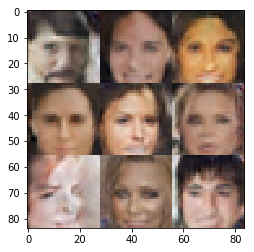

13701.13702.13703.13704.13705.13706.13707.13708.13709.13710.Epoch 3/5... Discriminator Loss: 1.1479... Generator Loss: 1.0891
13711.13712.13713.13714.13715.13716.13717.13718.13719.13720.Epoch 3/5... Discriminator Loss: 1.2748... Generator Loss: 0.8218
13721.13722.13723.13724.13725.13726.13727.13728.13729.13730.Epoch 3/5... Discriminator Loss: 1.3137... Generator Loss: 0.6451
13731.13732.13733.13734.13735.13736.13737.13738.13739.13740.Epoch 3/5... Discriminator Loss: 1.5019... Generator Loss: 0.4489
13741.13742.13743.13744.13745.13746.13747.13748.13749.13750.Epoch 3/5... Discriminator Loss: 1.3226... Generator Loss: 0.5333
13751.13752.13753.13754.13755.13756.13757.13758.13759.13760.Epoch 3/5... Discriminator Loss: 1.2884... Generator Loss: 0.4922
13761.13762.13763.13764.13765.13766.13767.13768.13769.13770.Epoch 3/5... Discriminator Loss: 1.2438... Generator Loss: 0.5756
13771.13772.13773.13774.13775.13776.13777.13778.13779.13780.Epoch 3/5... Discriminator Loss: 1.4883... Generator Loss:

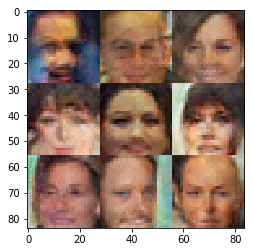

13801.13802.13803.13804.13805.13806.13807.13808.13809.13810.Epoch 3/5... Discriminator Loss: 1.1128... Generator Loss: 0.8114
13811.13812.13813.13814.13815.13816.13817.13818.13819.13820.Epoch 3/5... Discriminator Loss: 1.4553... Generator Loss: 0.3846
13821.13822.13823.13824.13825.13826.13827.13828.13829.13830.Epoch 3/5... Discriminator Loss: 1.4534... Generator Loss: 0.4270
13831.13832.13833.13834.13835.13836.13837.13838.13839.13840.Epoch 3/5... Discriminator Loss: 1.1625... Generator Loss: 0.9344
13841.13842.13843.13844.13845.13846.13847.13848.13849.13850.Epoch 3/5... Discriminator Loss: 1.3955... Generator Loss: 0.5552
13851.13852.13853.13854.13855.13856.13857.13858.13859.13860.Epoch 3/5... Discriminator Loss: 1.4694... Generator Loss: 0.4112
13861.13862.13863.13864.13865.13866.13867.13868.13869.13870.Epoch 3/5... Discriminator Loss: 1.1450... Generator Loss: 0.6423
13871.13872.13873.13874.13875.13876.13877.13878.13879.13880.Epoch 3/5... Discriminator Loss: 1.4810... Generator Loss:

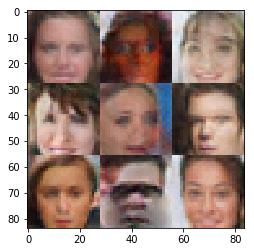

13901.13902.13903.13904.13905.13906.13907.13908.13909.13910.Epoch 3/5... Discriminator Loss: 1.3471... Generator Loss: 0.5223
13911.13912.13913.13914.13915.13916.13917.13918.13919.13920.Epoch 3/5... Discriminator Loss: 1.2486... Generator Loss: 0.7071
13921.13922.13923.13924.13925.13926.13927.13928.13929.13930.Epoch 3/5... Discriminator Loss: 1.1358... Generator Loss: 0.8902
13931.13932.13933.13934.13935.13936.13937.13938.13939.13940.Epoch 3/5... Discriminator Loss: 1.3788... Generator Loss: 0.5344
13941.13942.13943.13944.13945.13946.13947.13948.13949.13950.Epoch 3/5... Discriminator Loss: 1.0825... Generator Loss: 0.9790
13951.13952.13953.13954.13955.13956.13957.13958.13959.13960.Epoch 3/5... Discriminator Loss: 1.1646... Generator Loss: 0.9770
13961.13962.13963.13964.13965.13966.13967.13968.13969.13970.Epoch 3/5... Discriminator Loss: 0.9876... Generator Loss: 0.7707
13971.13972.13973.13974.13975.13976.13977.13978.13979.13980.Epoch 3/5... Discriminator Loss: 1.3239... Generator Loss:

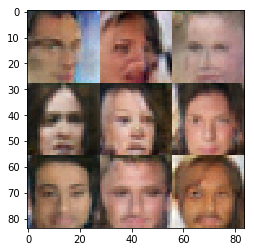

14001.14002.14003.14004.14005.14006.14007.14008.14009.14010.Epoch 3/5... Discriminator Loss: 1.3530... Generator Loss: 0.6166
14011.14012.14013.14014.14015.14016.14017.14018.14019.14020.Epoch 3/5... Discriminator Loss: 1.0777... Generator Loss: 0.7070
14021.14022.14023.14024.14025.14026.14027.14028.14029.14030.Epoch 3/5... Discriminator Loss: 1.1572... Generator Loss: 0.8615
14031.14032.14033.14034.14035.14036.14037.14038.14039.14040.Epoch 3/5... Discriminator Loss: 1.3675... Generator Loss: 0.5016
14041.14042.14043.14044.14045.14046.14047.14048.14049.14050.Epoch 3/5... Discriminator Loss: 1.3376... Generator Loss: 0.6154
14051.14052.14053.14054.14055.14056.14057.14058.14059.14060.Epoch 3/5... Discriminator Loss: 1.2995... Generator Loss: 0.5377
14061.14062.14063.14064.14065.14066.14067.14068.14069.14070.Epoch 3/5... Discriminator Loss: 1.1562... Generator Loss: 0.7078
14071.14072.14073.14074.14075.14076.14077.14078.14079.14080.Epoch 3/5... Discriminator Loss: 1.2694... Generator Loss:

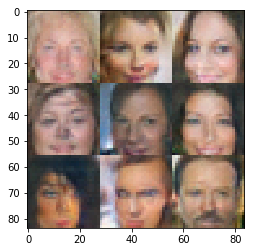

14101.14102.14103.14104.14105.14106.14107.14108.14109.14110.Epoch 3/5... Discriminator Loss: 1.0752... Generator Loss: 1.0291
14111.14112.14113.14114.14115.14116.14117.14118.14119.14120.Epoch 3/5... Discriminator Loss: 1.1126... Generator Loss: 0.9622
14121.14122.14123.14124.14125.14126.14127.14128.14129.14130.Epoch 3/5... Discriminator Loss: 1.3961... Generator Loss: 0.4850
14131.14132.14133.14134.14135.14136.14137.14138.14139.14140.Epoch 3/5... Discriminator Loss: 1.6310... Generator Loss: 0.3561
14141.14142.14143.14144.14145.14146.14147.14148.14149.14150.Epoch 3/5... Discriminator Loss: 1.2772... Generator Loss: 0.7081
14151.14152.14153.14154.14155.14156.14157.14158.14159.14160.Epoch 3/5... Discriminator Loss: 1.3985... Generator Loss: 0.6417
14161.14162.14163.14164.14165.14166.14167.14168.14169.14170.Epoch 3/5... Discriminator Loss: 1.2132... Generator Loss: 0.7660
14171.14172.14173.14174.14175.14176.14177.14178.14179.14180.Epoch 3/5... Discriminator Loss: 1.3177... Generator Loss:

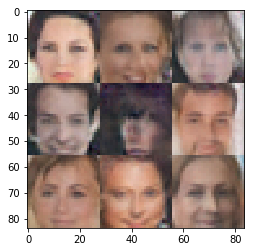

14201.14202.14203.14204.14205.14206.14207.14208.14209.14210.Epoch 3/5... Discriminator Loss: 1.4387... Generator Loss: 0.5554
14211.14212.14213.14214.14215.14216.14217.14218.14219.14220.Epoch 3/5... Discriminator Loss: 1.2774... Generator Loss: 0.4952
14221.14222.14223.14224.14225.14226.14227.14228.14229.14230.Epoch 3/5... Discriminator Loss: 1.5057... Generator Loss: 0.8528
14231.14232.14233.14234.14235.14236.14237.14238.14239.14240.Epoch 3/5... Discriminator Loss: 1.4909... Generator Loss: 0.5163
14241.14242.14243.14244.14245.14246.14247.14248.14249.14250.Epoch 3/5... Discriminator Loss: 1.4202... Generator Loss: 0.7903
14251.14252.14253.14254.14255.14256.14257.14258.14259.14260.Epoch 3/5... Discriminator Loss: 1.2238... Generator Loss: 0.7159
14261.14262.14263.14264.14265.14266.14267.14268.14269.14270.Epoch 3/5... Discriminator Loss: 1.1483... Generator Loss: 0.7471
14271.14272.14273.14274.14275.14276.14277.14278.14279.14280.Epoch 3/5... Discriminator Loss: 1.3675... Generator Loss:

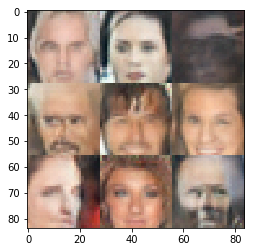

14301.14302.14303.14304.14305.14306.14307.14308.14309.14310.Epoch 3/5... Discriminator Loss: 0.8055... Generator Loss: 1.0814
14311.14312.14313.14314.14315.14316.14317.14318.14319.14320.Epoch 3/5... Discriminator Loss: 1.5084... Generator Loss: 0.4737
14321.14322.14323.14324.14325.14326.14327.14328.14329.14330.Epoch 3/5... Discriminator Loss: 1.1723... Generator Loss: 0.7043
14331.14332.14333.14334.14335.14336.14337.14338.14339.14340.Epoch 3/5... Discriminator Loss: 1.3458... Generator Loss: 0.5393
14341.14342.14343.14344.14345.14346.14347.14348.14349.14350.Epoch 3/5... Discriminator Loss: 1.5419... Generator Loss: 0.4563
14351.14352.14353.14354.14355.14356.14357.14358.14359.14360.Epoch 3/5... Discriminator Loss: 1.5838... Generator Loss: 0.3496
14361.14362.14363.14364.14365.14366.14367.14368.14369.14370.Epoch 3/5... Discriminator Loss: 1.3838... Generator Loss: 0.5689
14371.14372.14373.14374.14375.14376.14377.14378.14379.14380.Epoch 3/5... Discriminator Loss: 0.9909... Generator Loss:

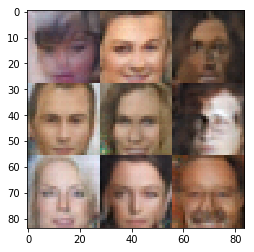

14401.14402.14403.14404.14405.14406.14407.14408.14409.14410.Epoch 3/5... Discriminator Loss: 1.5355... Generator Loss: 0.3899
14411.14412.14413.14414.14415.14416.14417.14418.14419.14420.Epoch 3/5... Discriminator Loss: 1.0153... Generator Loss: 0.8681
14421.14422.14423.14424.14425.14426.14427.14428.14429.14430.Epoch 3/5... Discriminator Loss: 1.1841... Generator Loss: 0.8394
14431.14432.14433.14434.14435.14436.14437.14438.14439.14440.Epoch 3/5... Discriminator Loss: 1.2434... Generator Loss: 0.7816
14441.14442.14443.14444.14445.14446.14447.14448.14449.14450.Epoch 3/5... Discriminator Loss: 1.2236... Generator Loss: 0.7440
14451.14452.14453.14454.14455.14456.14457.14458.14459.14460.Epoch 3/5... Discriminator Loss: 1.6800... Generator Loss: 0.3065
14461.14462.14463.14464.14465.14466.14467.14468.14469.14470.Epoch 3/5... Discriminator Loss: 1.1376... Generator Loss: 0.6538
14471.14472.14473.14474.14475.14476.14477.14478.14479.14480.Epoch 3/5... Discriminator Loss: 1.2577... Generator Loss:

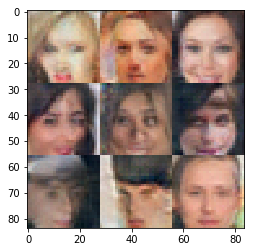

14501.14502.14503.14504.14505.14506.14507.14508.14509.14510.Epoch 3/5... Discriminator Loss: 1.1587... Generator Loss: 0.7263
14511.14512.14513.14514.14515.14516.14517.14518.14519.14520.Epoch 3/5... Discriminator Loss: 1.5791... Generator Loss: 0.3709
14521.14522.14523.14524.14525.14526.14527.14528.14529.14530.Epoch 3/5... Discriminator Loss: 1.3373... Generator Loss: 0.6785
14531.14532.14533.14534.14535.14536.14537.14538.14539.14540.Epoch 3/5... Discriminator Loss: 1.1589... Generator Loss: 0.8017
14541.14542.14543.14544.14545.14546.14547.14548.14549.14550.Epoch 3/5... Discriminator Loss: 1.4791... Generator Loss: 0.3900
14551.14552.14553.14554.14555.14556.14557.14558.14559.14560.Epoch 3/5... Discriminator Loss: 1.2819... Generator Loss: 0.6947
14561.14562.14563.14564.14565.14566.14567.14568.14569.14570.Epoch 3/5... Discriminator Loss: 1.2477... Generator Loss: 0.7011
14571.14572.14573.14574.14575.14576.14577.14578.14579.14580.Epoch 3/5... Discriminator Loss: 1.1014... Generator Loss:

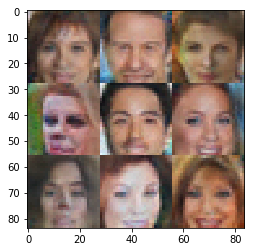

14601.14602.14603.14604.14605.14606.14607.14608.14609.14610.Epoch 3/5... Discriminator Loss: 1.5663... Generator Loss: 0.5503
14611.14612.14613.14614.14615.14616.14617.14618.14619.14620.Epoch 3/5... Discriminator Loss: 1.3437... Generator Loss: 0.4672
14621.14622.14623.14624.14625.14626.14627.14628.14629.14630.Epoch 3/5... Discriminator Loss: 1.3178... Generator Loss: 0.5512
14631.14632.14633.14634.14635.14636.14637.14638.14639.14640.Epoch 3/5... Discriminator Loss: 1.4961... Generator Loss: 0.4966
14641.14642.14643.14644.14645.14646.14647.14648.14649.14650.Epoch 3/5... Discriminator Loss: 1.3948... Generator Loss: 0.7370
14651.14652.14653.14654.14655.14656.14657.14658.14659.14660.Epoch 3/5... Discriminator Loss: 1.2666... Generator Loss: 0.6043
14661.14662.14663.14664.14665.14666.14667.14668.14669.14670.Epoch 3/5... Discriminator Loss: 1.2720... Generator Loss: 0.6639
14671.14672.14673.14674.14675.14676.14677.14678.14679.14680.Epoch 3/5... Discriminator Loss: 1.3676... Generator Loss:

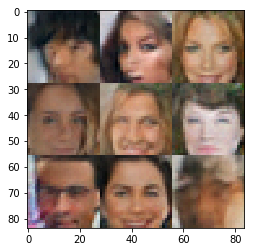

14701.14702.14703.14704.14705.14706.14707.14708.14709.14710.Epoch 3/5... Discriminator Loss: 1.1868... Generator Loss: 0.7527
14711.14712.14713.14714.14715.14716.14717.14718.14719.14720.Epoch 3/5... Discriminator Loss: 1.3318... Generator Loss: 0.5175
14721.14722.14723.14724.14725.14726.14727.14728.14729.14730.Epoch 3/5... Discriminator Loss: 1.1636... Generator Loss: 0.8673
14731.14732.14733.14734.14735.14736.14737.14738.14739.14740.Epoch 3/5... Discriminator Loss: 1.3471... Generator Loss: 0.7214
14741.14742.14743.14744.14745.14746.14747.14748.14749.14750.Epoch 3/5... Discriminator Loss: 1.4905... Generator Loss: 0.4647
14751.14752.14753.14754.14755.14756.14757.14758.14759.14760.Epoch 3/5... Discriminator Loss: 1.1664... Generator Loss: 0.5725
14761.14762.14763.14764.14765.14766.14767.14768.14769.14770.Epoch 3/5... Discriminator Loss: 1.1886... Generator Loss: 0.8013
14771.14772.14773.14774.14775.14776.14777.14778.14779.14780.Epoch 3/5... Discriminator Loss: 1.4601... Generator Loss:

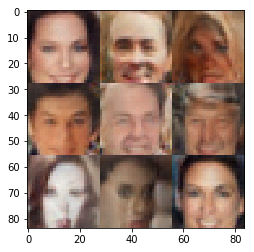

14801.14802.14803.14804.14805.14806.14807.14808.14809.14810.Epoch 3/5... Discriminator Loss: 0.9228... Generator Loss: 1.1279
14811.14812.14813.14814.14815.14816.14817.14818.14819.14820.Epoch 3/5... Discriminator Loss: 1.4196... Generator Loss: 0.5613
14821.14822.14823.14824.14825.14826.14827.14828.14829.14830.Epoch 3/5... Discriminator Loss: 1.0737... Generator Loss: 0.7138
14831.14832.14833.14834.14835.14836.14837.14838.14839.14840.Epoch 3/5... Discriminator Loss: 1.2403... Generator Loss: 0.6215
14841.14842.14843.14844.14845.14846.14847.14848.14849.14850.Epoch 3/5... Discriminator Loss: 1.4997... Generator Loss: 0.3952
14851.14852.14853.14854.14855.14856.14857.14858.14859.14860.Epoch 3/5... Discriminator Loss: 0.9768... Generator Loss: 0.9303
14861.14862.14863.14864.14865.14866.14867.14868.14869.14870.Epoch 3/5... Discriminator Loss: 0.8131... Generator Loss: 1.3109
14871.14872.14873.14874.14875.14876.14877.14878.14879.14880.Epoch 3/5... Discriminator Loss: 1.5709... Generator Loss:

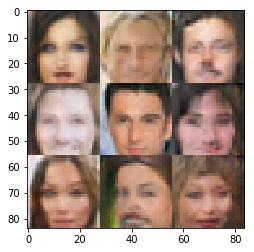

14901.14902.14903.14904.14905.14906.14907.14908.14909.14910.Epoch 3/5... Discriminator Loss: 1.2006... Generator Loss: 0.8134
14911.14912.14913.14914.14915.14916.14917.14918.14919.14920.Epoch 3/5... Discriminator Loss: 1.4995... Generator Loss: 0.4203
14921.14922.14923.14924.14925.14926.14927.14928.14929.14930.Epoch 3/5... Discriminator Loss: 1.1607... Generator Loss: 0.6936
14931.14932.14933.14934.14935.14936.14937.14938.14939.14940.Epoch 3/5... Discriminator Loss: 1.3916... Generator Loss: 0.5551
14941.14942.14943.14944.14945.14946.14947.14948.14949.14950.Epoch 3/5... Discriminator Loss: 1.1203... Generator Loss: 0.5948
14951.14952.14953.14954.14955.14956.14957.14958.14959.14960.Epoch 3/5... Discriminator Loss: 1.1058... Generator Loss: 0.7243
14961.14962.14963.14964.14965.14966.14967.14968.14969.14970.Epoch 3/5... Discriminator Loss: 1.3525... Generator Loss: 0.6888
14971.14972.14973.14974.14975.14976.14977.14978.14979.14980.Epoch 3/5... Discriminator Loss: 1.3974... Generator Loss:

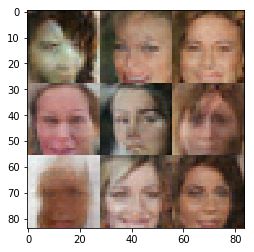

15001.15002.15003.15004.15005.15006.15007.15008.15009.15010.Epoch 3/5... Discriminator Loss: 1.5552... Generator Loss: 0.3873
15011.15012.15013.15014.15015.15016.15017.15018.15019.15020.Epoch 3/5... Discriminator Loss: 1.1508... Generator Loss: 0.7937
15021.15022.15023.15024.15025.15026.15027.15028.15029.15030.Epoch 3/5... Discriminator Loss: 1.4047... Generator Loss: 0.4753
15031.15032.15033.15034.15035.15036.15037.15038.15039.15040.Epoch 3/5... Discriminator Loss: 1.3721... Generator Loss: 0.6727
15041.15042.15043.15044.15045.15046.15047.15048.15049.15050.Epoch 3/5... Discriminator Loss: 1.3111... Generator Loss: 0.5922
15051.15052.15053.15054.15055.15056.15057.15058.15059.15060.Epoch 3/5... Discriminator Loss: 1.3233... Generator Loss: 0.5583
15061.15062.15063.15064.15065.15066.15067.15068.15069.15070.Epoch 3/5... Discriminator Loss: 1.4332... Generator Loss: 0.6686
15071.15072.15073.15074.15075.15076.15077.15078.15079.15080.Epoch 3/5... Discriminator Loss: 1.3951... Generator Loss:

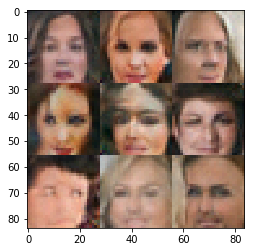

15101.15102.15103.15104.15105.15106.15107.15108.15109.15110.Epoch 3/5... Discriminator Loss: 1.0155... Generator Loss: 1.0043
15111.15112.15113.15114.15115.15116.15117.15118.15119.15120.Epoch 3/5... Discriminator Loss: 1.3877... Generator Loss: 0.4928
15121.15122.15123.15124.15125.15126.15127.15128.15129.15130.Epoch 3/5... Discriminator Loss: 1.3188... Generator Loss: 0.6260
15131.15132.15133.15134.15135.15136.15137.15138.15139.15140.Epoch 3/5... Discriminator Loss: 1.6956... Generator Loss: 0.5456
15141.15142.15143.15144.15145.15146.15147.15148.15149.15150.Epoch 3/5... Discriminator Loss: 1.4861... Generator Loss: 0.4729
15151.15152.15153.15154.15155.15156.15157.15158.15159.15160.Epoch 3/5... Discriminator Loss: 1.7556... Generator Loss: 0.5112
15161.15162.15163.15164.15165.15166.15167.15168.15169.15170.Epoch 3/5... Discriminator Loss: 0.5459... Generator Loss: 2.1353
15171.15172.15173.15174.15175.15176.15177.15178.15179.15180.Epoch 3/5... Discriminator Loss: 0.6742... Generator Loss:

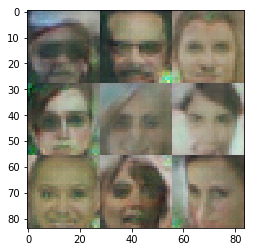

15201.15202.15203.15204.15205.15206.15207.15208.15209.15210.Epoch 3/5... Discriminator Loss: 0.4314... Generator Loss: 5.7865
15211.15212.15213.15214.15215.15216.15217.15218.15219.15220.Epoch 3/5... Discriminator Loss: 1.2176... Generator Loss: 0.7395
15221.15222.15223.15224.15225.15226.15227.15228.15229.15230.Epoch 3/5... Discriminator Loss: 1.6048... Generator Loss: 0.3629
15231.15232.15233.15234.15235.15236.15237.15238.15239.15240.Epoch 3/5... Discriminator Loss: 0.0716... Generator Loss: 5.3394
15241.15242.15243.15244.15245.15246.15247.15248.15249.15250.Epoch 3/5... Discriminator Loss: 1.6048... Generator Loss: 0.2903
15251.15252.15253.15254.15255.15256.15257.15258.15259.15260.Epoch 3/5... Discriminator Loss: 0.4956... Generator Loss: 3.4318
15261.15262.15263.15264.15265.15266.15267.15268.15269.15270.Epoch 3/5... Discriminator Loss: 1.3661... Generator Loss: 0.4435
15271.15272.15273.15274.15275.15276.15277.15278.15279.15280.Epoch 3/5... Discriminator Loss: 1.7296... Generator Loss:

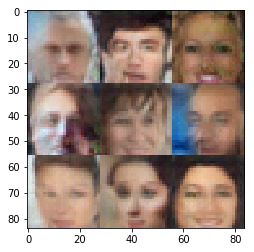

15301.15302.15303.15304.15305.15306.15307.15308.15309.15310.Epoch 3/5... Discriminator Loss: 0.3020... Generator Loss: 2.7817
15311.15312.15313.15314.15315.15316.15317.15318.15319.15320.Epoch 3/5... Discriminator Loss: 1.3214... Generator Loss: 3.6926
15321.15322.15323.15324.15325.15326.15327.15328.15329.15330.Epoch 3/5... Discriminator Loss: 0.0945... Generator Loss: 3.4193
15331.15332.15333.15334.15335.15336.15337.15338.15339.15340.Epoch 3/5... Discriminator Loss: 1.2726... Generator Loss: 1.2220
15341.15342.15343.15344.15345.15346.15347.15348.15349.15350.Epoch 3/5... Discriminator Loss: 1.2318... Generator Loss: 0.7565
15351.15352.15353.15354.15355.15356.15357.15358.15359.15360.Epoch 3/5... Discriminator Loss: 0.9574... Generator Loss: 1.0104
15361.15362.15363.15364.15365.15366.15367.15368.15369.15370.Epoch 3/5... Discriminator Loss: 0.8197... Generator Loss: 1.2673
15371.15372.15373.15374.15375.15376.15377.15378.15379.15380.Epoch 3/5... Discriminator Loss: 1.3222... Generator Loss:

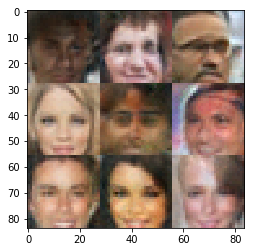

15401.15402.15403.15404.15405.15406.15407.15408.15409.15410.Epoch 3/5... Discriminator Loss: 1.4546... Generator Loss: 0.4205
15411.15412.15413.15414.15415.15416.15417.15418.15419.15420.Epoch 3/5... Discriminator Loss: 1.0529... Generator Loss: 0.7247
15421.15422.15423.15424.15425.15426.15427.15428.15429.15430.Epoch 3/5... Discriminator Loss: 1.1336... Generator Loss: 0.5818
15431.15432.15433.15434.15435.15436.15437.15438.15439.15440.Epoch 3/5... Discriminator Loss: 1.6180... Generator Loss: 0.4564
15441.15442.15443.15444.15445.15446.15447.15448.15449.15450.Epoch 3/5... Discriminator Loss: 1.3669... Generator Loss: 0.7206
15451.15452.15453.15454.15455.15456.15457.15458.15459.15460.Epoch 3/5... Discriminator Loss: 1.3697... Generator Loss: 0.5845
15461.15462.15463.15464.15465.15466.15467.15468.15469.15470.Epoch 3/5... Discriminator Loss: 1.3276... Generator Loss: 0.6198
15471.15472.15473.15474.15475.15476.15477.15478.15479.15480.Epoch 3/5... Discriminator Loss: 1.1372... Generator Loss:

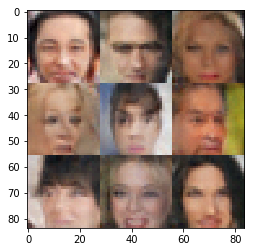

15501.15502.15503.15504.15505.15506.15507.15508.15509.15510.Epoch 3/5... Discriminator Loss: 1.2907... Generator Loss: 0.6135
15511.15512.15513.15514.15515.15516.15517.15518.15519.15520.Epoch 3/5... Discriminator Loss: 1.3373... Generator Loss: 0.4406
15521.15522.15523.15524.15525.15526.15527.15528.15529.15530.Epoch 3/5... Discriminator Loss: 1.1622... Generator Loss: 0.6627
15531.15532.15533.15534.15535.15536.15537.15538.15539.15540.Epoch 3/5... Discriminator Loss: 1.4295... Generator Loss: 0.6307
15541.15542.15543.15544.15545.15546.15547.15548.15549.15550.Epoch 3/5... Discriminator Loss: 1.4810... Generator Loss: 0.5742
15551.15552.15553.15554.15555.15556.15557.15558.15559.15560.Epoch 3/5... Discriminator Loss: 1.0918... Generator Loss: 0.7633
15561.15562.15563.15564.15565.15566.15567.15568.15569.15570.Epoch 3/5... Discriminator Loss: 1.4927... Generator Loss: 0.5411
15571.15572.15573.15574.15575.15576.15577.15578.15579.15580.Epoch 3/5... Discriminator Loss: 1.2002... Generator Loss:

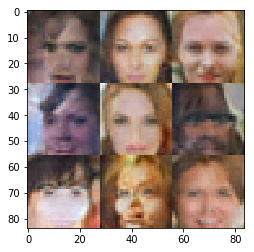

15601.15602.15603.15604.15605.15606.15607.15608.15609.15610.Epoch 3/5... Discriminator Loss: 1.2526... Generator Loss: 0.7276
15611.15612.15613.15614.15615.15616.15617.15618.15619.15620.Epoch 3/5... Discriminator Loss: 1.4188... Generator Loss: 0.6842
15621.15622.15623.15624.15625.15626.15627.15628.15629.15630.Epoch 3/5... Discriminator Loss: 1.4228... Generator Loss: 0.5435
15631.15632.15633.15634.15635.15636.15637.15638.15639.15640.Epoch 3/5... Discriminator Loss: 1.4068... Generator Loss: 0.5635
15641.15642.15643.15644.15645.15646.15647.15648.15649.15650.Epoch 3/5... Discriminator Loss: 1.0845... Generator Loss: 0.8366
15651.15652.15653.15654.15655.15656.15657.15658.15659.15660.Epoch 3/5... Discriminator Loss: 1.3545... Generator Loss: 0.6731
15661.15662.15663.15664.15665.15666.15667.15668.15669.15670.Epoch 3/5... Discriminator Loss: 1.0957... Generator Loss: 0.8923
15671.15672.15673.15674.15675.15676.15677.15678.15679.15680.Epoch 3/5... Discriminator Loss: 1.1942... Generator Loss:

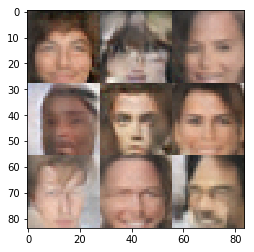

15701.15702.15703.15704.15705.15706.15707.15708.15709.15710.Epoch 3/5... Discriminator Loss: 1.3236... Generator Loss: 0.6643
15711.15712.15713.15714.15715.15716.15717.15718.15719.15720.Epoch 3/5... Discriminator Loss: 1.4977... Generator Loss: 0.5725
15721.15722.15723.15724.15725.15726.15727.15728.15729.15730.Epoch 3/5... Discriminator Loss: 1.7320... Generator Loss: 0.3095
15731.15732.15733.15734.15735.15736.15737.15738.15739.15740.Epoch 3/5... Discriminator Loss: 1.2602... Generator Loss: 0.7264
15741.15742.15743.15744.15745.15746.15747.15748.15749.15750.Epoch 3/5... Discriminator Loss: 1.1994... Generator Loss: 0.6599
15751.15752.15753.15754.15755.15756.15757.15758.15759.15760.Epoch 3/5... Discriminator Loss: 1.4742... Generator Loss: 0.6451
15761.15762.15763.15764.15765.15766.15767.15768.15769.15770.Epoch 3/5... Discriminator Loss: 1.4030... Generator Loss: 0.5815
15771.15772.15773.15774.15775.15776.15777.15778.15779.15780.Epoch 3/5... Discriminator Loss: 1.2075... Generator Loss:

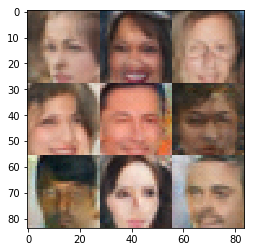

15801.15802.15803.15804.15805.15806.15807.15808.15809.15810.Epoch 3/5... Discriminator Loss: 1.3328... Generator Loss: 0.6371
15811.15812.15813.15814.15815.15816.15817.15818.15819.15820.Epoch 3/5... Discriminator Loss: 1.3063... Generator Loss: 0.6454
15821.15822.15823.15824.15825.15826.15827.15828.15829.15830.Epoch 3/5... Discriminator Loss: 1.3825... Generator Loss: 0.7221
15831.15832.15833.15834.15835.15836.15837.15838.15839.15840.Epoch 3/5... Discriminator Loss: 1.0798... Generator Loss: 0.7695
15841.15842.15843.15844.15845.15846.15847.15848.15849.15850.Epoch 3/5... Discriminator Loss: 1.3536... Generator Loss: 0.5388
15851.15852.15853.15854.15855.15856.15857.15858.15859.15860.Epoch 3/5... Discriminator Loss: 1.0673... Generator Loss: 0.6769
15861.15862.15863.15864.15865.15866.15867.15868.15869.15870.Epoch 3/5... Discriminator Loss: 1.2760... Generator Loss: 0.6714
15871.15872.15873.15874.15875.15876.15877.15878.15879.15880.Epoch 3/5... Discriminator Loss: 1.4221... Generator Loss:

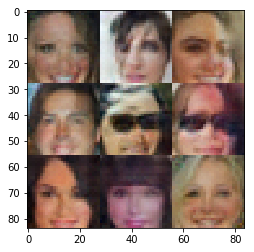

15901.15902.15903.15904.15905.15906.15907.15908.15909.15910.Epoch 3/5... Discriminator Loss: 1.2441... Generator Loss: 0.7680
15911.15912.15913.15914.15915.15916.15917.15918.15919.15920.Epoch 3/5... Discriminator Loss: 1.2566... Generator Loss: 0.5907
15921.15922.15923.15924.15925.15926.15927.15928.15929.15930.Epoch 3/5... Discriminator Loss: 1.3962... Generator Loss: 0.5621
15931.15932.15933.15934.15935.15936.15937.15938.15939.15940.Epoch 3/5... Discriminator Loss: 1.5458... Generator Loss: 0.4788
15941.15942.15943.15944.15945.15946.15947.15948.15949.15950.Epoch 3/5... Discriminator Loss: 1.4150... Generator Loss: 0.5483
15951.15952.15953.15954.15955.15956.15957.15958.15959.15960.Epoch 3/5... Discriminator Loss: 1.3198... Generator Loss: 0.4842
15961.15962.15963.15964.15965.15966.15967.15968.15969.15970.Epoch 3/5... Discriminator Loss: 1.1693... Generator Loss: 0.8780
15971.15972.15973.15974.15975.15976.15977.15978.15979.15980.Epoch 3/5... Discriminator Loss: 1.4880... Generator Loss:

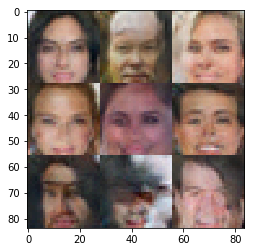

16001.16002.16003.16004.16005.16006.16007.16008.16009.16010.Epoch 3/5... Discriminator Loss: 1.5739... Generator Loss: 0.4728
16011.16012.16013.16014.16015.16016.16017.16018.16019.16020.Epoch 3/5... Discriminator Loss: 1.5174... Generator Loss: 0.4514
16021.16022.16023.16024.16025.16026.16027.16028.16029.16030.Epoch 3/5... Discriminator Loss: 1.4176... Generator Loss: 0.5248
16031.16032.16033.16034.16035.16036.16037.16038.16039.16040.Epoch 3/5... Discriminator Loss: 1.1809... Generator Loss: 0.7885
16041.16042.16043.16044.16045.16046.16047.16048.16049.16050.Epoch 3/5... Discriminator Loss: 1.3458... Generator Loss: 0.5838
16051.16052.16053.16054.16055.16056.16057.16058.16059.16060.Epoch 3/5... Discriminator Loss: 1.0262... Generator Loss: 0.8997
16061.16062.16063.16064.16065.16066.16067.16068.16069.16070.Epoch 3/5... Discriminator Loss: 1.5485... Generator Loss: 0.5381
16071.16072.16073.16074.16075.16076.16077.16078.16079.16080.Epoch 3/5... Discriminator Loss: 1.1558... Generator Loss:

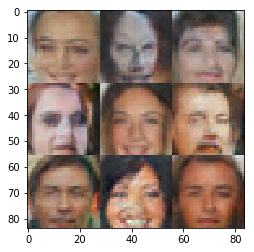

16101.16102.16103.16104.16105.16106.16107.16108.16109.16110.Epoch 3/5... Discriminator Loss: 1.3437... Generator Loss: 0.4999
16111.16112.16113.16114.16115.16116.16117.16118.16119.16120.Epoch 3/5... Discriminator Loss: 1.3083... Generator Loss: 0.7130
16121.16122.16123.16124.16125.16126.16127.16128.16129.16130.Epoch 3/5... Discriminator Loss: 1.3258... Generator Loss: 0.5656
16131.16132.16133.16134.16135.16136.16137.16138.16139.16140.Epoch 3/5... Discriminator Loss: 1.4337... Generator Loss: 0.6670
16141.16142.16143.16144.16145.16146.16147.16148.16149.16150.Epoch 3/5... Discriminator Loss: 1.3843... Generator Loss: 0.4179
16151.16152.16153.16154.16155.16156.16157.16158.16159.16160.Epoch 3/5... Discriminator Loss: 1.1358... Generator Loss: 0.8665
16161.16162.16163.16164.16165.16166.16167.16168.16169.16170.Epoch 3/5... Discriminator Loss: 1.3275... Generator Loss: 0.5954
16171.16172.16173.16174.16175.16176.16177.16178.16179.16180.Epoch 3/5... Discriminator Loss: 1.1298... Generator Loss:

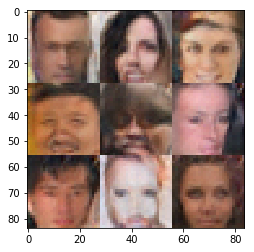

16201.16202.16203.16204.16205.16206.16207.16208.16209.16210.Epoch 3/5... Discriminator Loss: 1.4036... Generator Loss: 0.4438
16211.16212.16213.16214.16215.16216.16217.16218.16219.16220.Epoch 3/5... Discriminator Loss: 1.2002... Generator Loss: 0.6560
16221.16222.16223.16224.16225.16226.16227.16228.16229.16230.Epoch 3/5... Discriminator Loss: 1.2859... Generator Loss: 0.5788
16231.16232.16233.16234.16235.16236.16237.16238.16239.16240.Epoch 3/5... Discriminator Loss: 1.2122... Generator Loss: 0.7743
16241.16242.16243.16244.16245.16246.16247.16248.16249.16250.Epoch 3/5... Discriminator Loss: 1.5174... Generator Loss: 0.5072
16251.16252.16253.16254.16255.16256.16257.16258.16259.16260.Epoch 3/5... Discriminator Loss: 1.4696... Generator Loss: 0.4652
16261.16262.16263.16264.16265.16266.16267.16268.16269.16270.Epoch 3/5... Discriminator Loss: 1.5555... Generator Loss: 0.5020
16271.16272.16273.16274.16275.16276.16277.16278.16279.16280.Epoch 3/5... Discriminator Loss: 1.4544... Generator Loss:

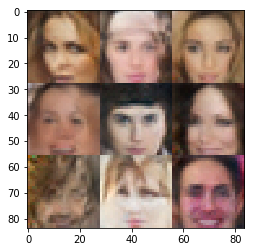

16301.16302.16303.16304.16305.16306.16307.16308.16309.16310.Epoch 3/5... Discriminator Loss: 1.3110... Generator Loss: 0.6224
16311.16312.16313.16314.16315.16316.16317.16318.16319.16320.Epoch 3/5... Discriminator Loss: 1.2920... Generator Loss: 0.5275
16321.16322.16323.16324.16325.16326.16327.16328.16329.16330.Epoch 3/5... Discriminator Loss: 1.5083... Generator Loss: 0.4708
16331.16332.16333.16334.16335.16336.16337.16338.16339.16340.Epoch 3/5... Discriminator Loss: 1.3238... Generator Loss: 0.5135
16341.16342.16343.16344.16345.16346.16347.16348.16349.16350.Epoch 3/5... Discriminator Loss: 1.3823... Generator Loss: 0.5906
16351.16352.16353.16354.16355.16356.16357.16358.16359.16360.Epoch 3/5... Discriminator Loss: 1.2941... Generator Loss: 0.6210
16361.16362.16363.16364.16365.16366.16367.16368.16369.16370.Epoch 3/5... Discriminator Loss: 1.4175... Generator Loss: 0.5269
16371.16372.16373.16374.16375.16376.16377.16378.16379.16380.Epoch 3/5... Discriminator Loss: 1.4458... Generator Loss:

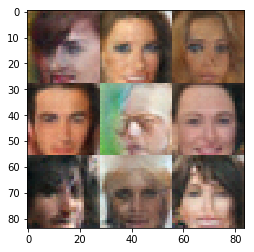

16401.16402.16403.16404.16405.16406.16407.16408.16409.16410.Epoch 3/5... Discriminator Loss: 1.5042... Generator Loss: 0.5580
16411.16412.16413.16414.16415.16416.16417.16418.16419.16420.Epoch 3/5... Discriminator Loss: 1.0785... Generator Loss: 0.6140
16421.16422.16423.16424.16425.16426.16427.16428.16429.16430.Epoch 3/5... Discriminator Loss: 1.4213... Generator Loss: 0.5241
16431.16432.16433.16434.16435.16436.16437.16438.16439.16440.Epoch 3/5... Discriminator Loss: 1.2203... Generator Loss: 0.8581
16441.16442.16443.16444.16445.16446.16447.16448.16449.16450.Epoch 3/5... Discriminator Loss: 1.4811... Generator Loss: 0.4308
16451.16452.16453.16454.16455.16456.16457.16458.16459.16460.Epoch 3/5... Discriminator Loss: 1.2571... Generator Loss: 0.7259
16461.16462.16463.16464.16465.16466.16467.16468.16469.16470.Epoch 3/5... Discriminator Loss: 1.1481... Generator Loss: 0.8568
16471.16472.16473.16474.16475.16476.16477.16478.16479.16480.Epoch 3/5... Discriminator Loss: 1.1468... Generator Loss:

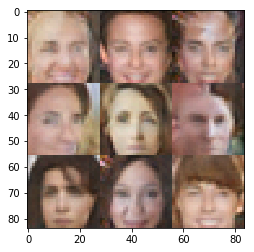

16501.16502.16503.16504.16505.16506.16507.16508.16509.16510.Epoch 3/5... Discriminator Loss: 1.1275... Generator Loss: 0.7460
16511.16512.16513.16514.16515.16516.16517.16518.16519.16520.Epoch 3/5... Discriminator Loss: 1.4198... Generator Loss: 0.5923
16521.16522.16523.16524.16525.16526.16527.16528.16529.16530.Epoch 3/5... Discriminator Loss: 1.4110... Generator Loss: 0.5193
16531.16532.16533.16534.16535.16536.16537.16538.16539.16540.Epoch 3/5... Discriminator Loss: 1.2930... Generator Loss: 0.5453
16541.16542.16543.16544.16545.16546.16547.16548.16549.16550.Epoch 3/5... Discriminator Loss: 1.5276... Generator Loss: 0.4339
16551.16552.16553.16554.16555.16556.16557.16558.16559.16560.Epoch 3/5... Discriminator Loss: 1.2644... Generator Loss: 0.6732
16561.16562.16563.16564.16565.16566.16567.16568.16569.16570.Epoch 3/5... Discriminator Loss: 1.2621... Generator Loss: 0.5835
16571.16572.16573.16574.16575.16576.16577.16578.16579.16580.Epoch 3/5... Discriminator Loss: 1.4276... Generator Loss:

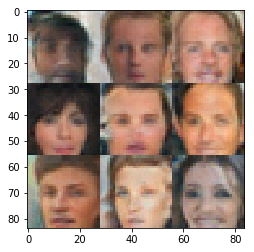

16601.16602.16603.16604.16605.16606.16607.16608.16609.16610.Epoch 3/5... Discriminator Loss: 1.0991... Generator Loss: 0.8157
16611.16612.16613.16614.16615.16616.16617.16618.16619.16620.Epoch 3/5... Discriminator Loss: 1.4342... Generator Loss: 0.4148
16621.16622.16623.16624.16625.16626.16627.16628.16629.16630.Epoch 3/5... Discriminator Loss: 0.9827... Generator Loss: 0.8593
16631.16632.16633.16634.16635.16636.16637.16638.16639.16640.Epoch 3/5... Discriminator Loss: 0.8780... Generator Loss: 0.8908
16641.16642.16643.16644.16645.16646.16647.16648.16649.16650.Epoch 3/5... Discriminator Loss: 1.2960... Generator Loss: 0.5696
16651.16652.16653.16654.16655.16656.16657.16658.16659.16660.Epoch 3/5... Discriminator Loss: 1.1273... Generator Loss: 0.7429
16661.16662.16663.16664.16665.16666.16667.16668.16669.16670.Epoch 3/5... Discriminator Loss: 1.5283... Generator Loss: 0.6249
16671.16672.16673.16674.16675.16676.16677.16678.16679.16680.Epoch 3/5... Discriminator Loss: 1.4077... Generator Loss:

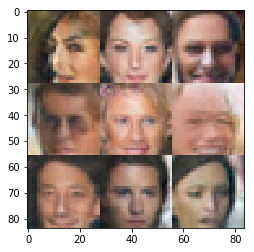

16701.16702.16703.16704.16705.16706.16707.16708.16709.16710.Epoch 3/5... Discriminator Loss: 1.3662... Generator Loss: 0.5001
16711.16712.16713.16714.16715.16716.16717.16718.16719.16720.Epoch 3/5... Discriminator Loss: 1.2101... Generator Loss: 0.7219
16721.16722.16723.16724.16725.16726.16727.16728.16729.16730.Epoch 3/5... Discriminator Loss: 1.4359... Generator Loss: 0.6958
16731.16732.16733.16734.16735.16736.16737.16738.16739.16740.Epoch 3/5... Discriminator Loss: 1.5092... Generator Loss: 0.5102
16741.16742.16743.16744.16745.16746.16747.16748.16749.16750.Epoch 3/5... Discriminator Loss: 1.2243... Generator Loss: 0.6735
16751.16752.16753.16754.16755.16756.16757.16758.16759.16760.Epoch 3/5... Discriminator Loss: 1.3604... Generator Loss: 0.5137
16761.16762.16763.16764.16765.16766.16767.16768.16769.16770.Epoch 3/5... Discriminator Loss: 1.1631... Generator Loss: 0.9089
16771.16772.16773.16774.16775.16776.16777.16778.16779.16780.Epoch 3/5... Discriminator Loss: 1.2736... Generator Loss:

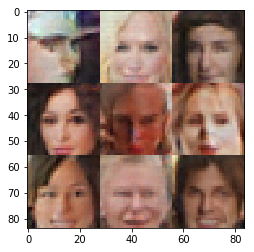

16801.16802.16803.16804.16805.16806.16807.16808.16809.16810.Epoch 3/5... Discriminator Loss: 1.1765... Generator Loss: 0.6393
16811.16812.16813.16814.16815.16816.16817.16818.16819.16820.Epoch 3/5... Discriminator Loss: 0.9917... Generator Loss: 0.7173
16821.16822.16823.16824.16825.16826.16827.16828.16829.16830.Epoch 3/5... Discriminator Loss: 1.2071... Generator Loss: 0.5994
16831.16832.16833.16834.16835.16836.16837.16838.16839.16840.Epoch 3/5... Discriminator Loss: 1.1635... Generator Loss: 0.8070
16841.16842.16843.16844.16845.16846.16847.16848.16849.16850.Epoch 3/5... Discriminator Loss: 1.3805... Generator Loss: 0.5836
16851.16852.16853.16854.16855.16856.16857.16858.16859.16860.Epoch 3/5... Discriminator Loss: 0.9872... Generator Loss: 0.8748
16861.16862.16863.16864.16865.16866.16867.16868.16869.16870.Epoch 3/5... Discriminator Loss: 1.6920... Generator Loss: 0.5416
16871.16872.16873.16874.16875.16876.16877.16878.16879.16880.Epoch 3/5... Discriminator Loss: 1.4465... Generator Loss:

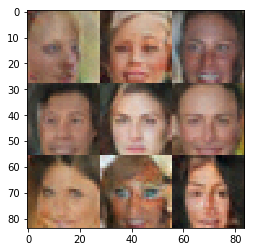

16901.16902.16903.16904.16905.16906.16907.16908.16909.16910.Epoch 3/5... Discriminator Loss: 1.2678... Generator Loss: 0.7066
16911.16912.16913.16914.16915.16916.16917.16918.16919.16920.Epoch 3/5... Discriminator Loss: 1.6309... Generator Loss: 0.3436
16921.16922.16923.16924.16925.16926.16927.16928.16929.16930.Epoch 3/5... Discriminator Loss: 1.3362... Generator Loss: 0.6245
16931.16932.16933.16934.16935.16936.16937.16938.16939.16940.Epoch 3/5... Discriminator Loss: 1.3315... Generator Loss: 0.5938
16941.16942.16943.16944.16945.16946.16947.16948.16949.16950.Epoch 3/5... Discriminator Loss: 1.2803... Generator Loss: 0.4982
16951.16952.16953.16954.16955.16956.16957.16958.16959.16960.Epoch 3/5... Discriminator Loss: 1.2444... Generator Loss: 0.6277
16961.16962.16963.16964.16965.16966.16967.16968.16969.16970.Epoch 3/5... Discriminator Loss: 1.8205... Generator Loss: 0.3754
16971.16972.16973.16974.16975.16976.16977.16978.16979.16980.Epoch 3/5... Discriminator Loss: 1.3389... Generator Loss:

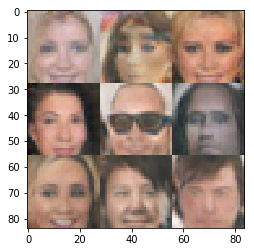

17001.17002.17003.17004.17005.17006.17007.17008.17009.17010.Epoch 3/5... Discriminator Loss: 1.3344... Generator Loss: 0.6358
17011.17012.17013.17014.17015.17016.17017.17018.17019.17020.Epoch 3/5... Discriminator Loss: 1.2347... Generator Loss: 0.7509
17021.17022.17023.17024.17025.17026.17027.17028.17029.17030.Epoch 3/5... Discriminator Loss: 1.5388... Generator Loss: 0.4633
17031.17032.17033.17034.17035.17036.17037.17038.17039.17040.Epoch 3/5... Discriminator Loss: 1.2620... Generator Loss: 0.6027
17041.17042.17043.17044.17045.17046.17047.17048.17049.17050.Epoch 3/5... Discriminator Loss: 1.2488... Generator Loss: 0.8175
17051.17052.17053.17054.17055.17056.17057.17058.17059.17060.Epoch 3/5... Discriminator Loss: 1.2556... Generator Loss: 0.5600
17061.17062.17063.17064.17065.17066.17067.17068.17069.17070.Epoch 3/5... Discriminator Loss: 1.3787... Generator Loss: 0.3947
17071.17072.17073.17074.17075.17076.17077.17078.17079.17080.Epoch 3/5... Discriminator Loss: 1.5347... Generator Loss:

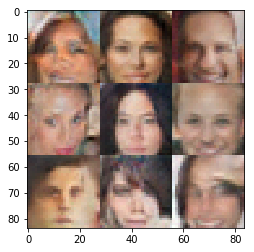

17101.17102.17103.17104.17105.17106.17107.17108.17109.17110.Epoch 3/5... Discriminator Loss: 1.2791... Generator Loss: 0.6122
17111.17112.17113.17114.17115.17116.17117.17118.17119.17120.Epoch 3/5... Discriminator Loss: 1.2171... Generator Loss: 0.8382
17121.17122.17123.17124.17125.17126.17127.17128.17129.17130.Epoch 3/5... Discriminator Loss: 1.4212... Generator Loss: 0.4676
17131.17132.17133.17134.17135.17136.17137.17138.17139.17140.Epoch 3/5... Discriminator Loss: 1.1371... Generator Loss: 0.7801
17141.17142.17143.17144.17145.17146.17147.17148.17149.17150.Epoch 3/5... Discriminator Loss: 1.3039... Generator Loss: 0.6987
17151.17152.17153.17154.17155.17156.17157.17158.17159.17160.Epoch 3/5... Discriminator Loss: 1.6041... Generator Loss: 0.4515
17161.17162.17163.17164.17165.17166.17167.17168.17169.17170.Epoch 3/5... Discriminator Loss: 1.1381... Generator Loss: 0.8264
17171.17172.17173.17174.17175.17176.17177.17178.17179.17180.Epoch 3/5... Discriminator Loss: 1.0333... Generator Loss:

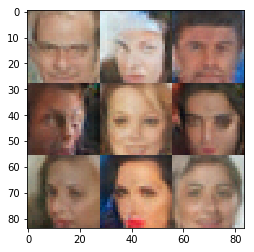

17201.17202.17203.17204.17205.17206.17207.17208.17209.17210.Epoch 3/5... Discriminator Loss: 1.2287... Generator Loss: 0.6201
17211.17212.17213.17214.17215.17216.17217.17218.17219.17220.Epoch 3/5... Discriminator Loss: 1.2786... Generator Loss: 0.5944
17221.17222.17223.17224.17225.17226.17227.17228.17229.17230.Epoch 3/5... Discriminator Loss: 1.4656... Generator Loss: 0.5964
17231.17232.17233.17234.17235.17236.17237.17238.17239.17240.Epoch 3/5... Discriminator Loss: 1.3138... Generator Loss: 0.6349
17241.17242.17243.17244.17245.17246.17247.17248.17249.17250.Epoch 3/5... Discriminator Loss: 1.4080... Generator Loss: 0.5559
17251.17252.17253.17254.17255.17256.17257.17258.17259.17260.Epoch 3/5... Discriminator Loss: 1.1793... Generator Loss: 0.6054
17261.17262.17263.17264.17265.17266.17267.17268.17269.17270.Epoch 3/5... Discriminator Loss: 1.5737... Generator Loss: 0.4073
17271.17272.17273.17274.17275.17276.17277.17278.17279.17280.Epoch 3/5... Discriminator Loss: 1.5396... Generator Loss:

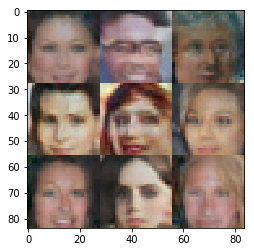

17301.17302.17303.17304.17305.17306.17307.17308.17309.17310.Epoch 3/5... Discriminator Loss: 1.2958... Generator Loss: 0.5245
17311.17312.17313.17314.17315.17316.17317.17318.17319.17320.Epoch 3/5... Discriminator Loss: 1.2393... Generator Loss: 0.6289
17321.17322.17323.17324.17325.17326.17327.17328.17329.17330.Epoch 3/5... Discriminator Loss: 1.4144... Generator Loss: 0.6902
17331.17332.17333.17334.17335.17336.17337.17338.17339.17340.Epoch 3/5... Discriminator Loss: 1.2737... Generator Loss: 0.6930
17341.17342.17343.17344.17345.17346.17347.17348.17349.17350.Epoch 3/5... Discriminator Loss: 1.3221... Generator Loss: 0.6176
17351.17352.17353.17354.17355.17356.17357.17358.17359.17360.Epoch 3/5... Discriminator Loss: 1.3213... Generator Loss: 0.7648
17361.17362.17363.17364.17365.17366.17367.17368.17369.17370.Epoch 3/5... Discriminator Loss: 1.3838... Generator Loss: 0.5471
17371.17372.17373.17374.17375.17376.17377.17378.17379.17380.Epoch 3/5... Discriminator Loss: 1.0255... Generator Loss:

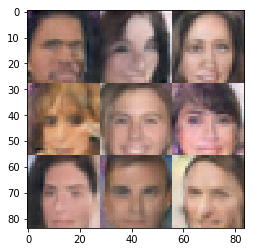

17401.17402.17403.17404.17405.17406.17407.17408.17409.17410.Epoch 3/5... Discriminator Loss: 1.4832... Generator Loss: 0.5772
17411.17412.17413.17414.17415.17416.17417.17418.17419.17420.Epoch 3/5... Discriminator Loss: 1.3685... Generator Loss: 0.5963
17421.17422.17423.17424.17425.17426.17427.17428.17429.17430.Epoch 3/5... Discriminator Loss: 1.5241... Generator Loss: 0.3990
17431.17432.17433.17434.17435.17436.17437.17438.17439.17440.Epoch 3/5... Discriminator Loss: 1.3019... Generator Loss: 0.5128
17441.17442.17443.17444.17445.17446.17447.17448.17449.17450.Epoch 3/5... Discriminator Loss: 1.4701... Generator Loss: 0.3920
17451.17452.17453.17454.17455.17456.17457.17458.17459.17460.Epoch 3/5... Discriminator Loss: 1.3677... Generator Loss: 0.5269
17461.17462.17463.17464.17465.17466.17467.17468.17469.17470.Epoch 3/5... Discriminator Loss: 1.9274... Generator Loss: 0.2574
17471.17472.17473.17474.17475.17476.17477.17478.17479.17480.Epoch 3/5... Discriminator Loss: 1.2505... Generator Loss:

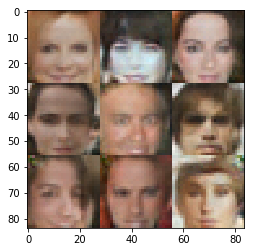

17501.17502.17503.17504.17505.17506.17507.17508.17509.17510.Epoch 3/5... Discriminator Loss: 1.3632... Generator Loss: 0.7458
17511.17512.17513.17514.17515.17516.17517.17518.17519.17520.Epoch 3/5... Discriminator Loss: 1.6934... Generator Loss: 0.3314
17521.17522.17523.17524.17525.17526.17527.17528.17529.17530.Epoch 3/5... Discriminator Loss: 1.1379... Generator Loss: 0.9723
17531.17532.17533.17534.17535.17536.17537.17538.17539.17540.Epoch 3/5... Discriminator Loss: 1.5199... Generator Loss: 0.3771
17541.17542.17543.17544.17545.17546.17547.17548.17549.17550.Epoch 3/5... Discriminator Loss: 1.4790... Generator Loss: 0.4921
17551.17552.17553.17554.17555.17556.17557.17558.17559.17560.Epoch 3/5... Discriminator Loss: 1.2545... Generator Loss: 0.4952
17561.17562.17563.17564.17565.17566.17567.17568.17569.17570.Epoch 3/5... Discriminator Loss: 1.6100... Generator Loss: 0.4426
17571.17572.17573.17574.17575.17576.17577.17578.17579.17580.Epoch 3/5... Discriminator Loss: 1.2195... Generator Loss:

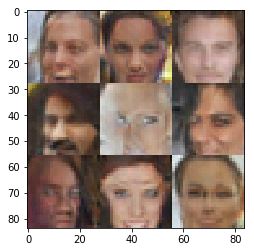

17601.17602.17603.17604.17605.17606.17607.17608.17609.17610.Epoch 3/5... Discriminator Loss: 1.2561... Generator Loss: 0.7680
17611.17612.17613.17614.17615.17616.17617.17618.17619.17620.Epoch 3/5... Discriminator Loss: 1.5899... Generator Loss: 0.7056
17621.17622.17623.17624.17625.17626.17627.17628.17629.17630.Epoch 3/5... Discriminator Loss: 1.4733... Generator Loss: 0.5347
17631.17632.17633.17634.17635.17636.17637.17638.17639.17640.Epoch 3/5... Discriminator Loss: 1.3157... Generator Loss: 0.5181
17641.17642.17643.17644.17645.17646.17647.17648.17649.17650.Epoch 3/5... Discriminator Loss: 1.3437... Generator Loss: 0.5416
17651.17652.17653.17654.17655.17656.17657.17658.17659.17660.Epoch 3/5... Discriminator Loss: 1.0811... Generator Loss: 0.7222
17661.17662.17663.17664.17665.17666.17667.17668.17669.17670.Epoch 3/5... Discriminator Loss: 1.1657... Generator Loss: 0.6678
17671.17672.17673.17674.17675.17676.17677.17678.17679.17680.Epoch 3/5... Discriminator Loss: 1.0137... Generator Loss:

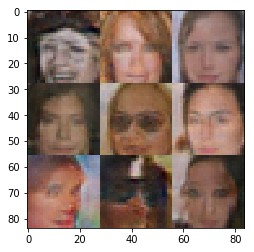

17701.17702.17703.17704.17705.17706.17707.17708.17709.17710.Epoch 3/5... Discriminator Loss: 1.3792... Generator Loss: 0.4546
17711.17712.17713.17714.17715.17716.17717.17718.17719.17720.Epoch 3/5... Discriminator Loss: 1.2809... Generator Loss: 0.6424
17721.17722.17723.17724.17725.17726.17727.17728.17729.17730.Epoch 3/5... Discriminator Loss: 1.2278... Generator Loss: 0.7475
17731.17732.17733.17734.17735.17736.17737.17738.17739.17740.Epoch 3/5... Discriminator Loss: 1.3165... Generator Loss: 0.7017
17741.17742.17743.17744.17745.17746.17747.17748.17749.17750.Epoch 3/5... Discriminator Loss: 1.3254... Generator Loss: 0.6324
17751.17752.17753.17754.17755.17756.17757.17758.17759.17760.Epoch 3/5... Discriminator Loss: 1.4238... Generator Loss: 0.5083
17761.17762.17763.17764.17765.17766.17767.17768.17769.17770.Epoch 3/5... Discriminator Loss: 1.2418... Generator Loss: 0.7254
17771.17772.17773.17774.17775.17776.17777.17778.17779.17780.Epoch 3/5... Discriminator Loss: 1.3102... Generator Loss:

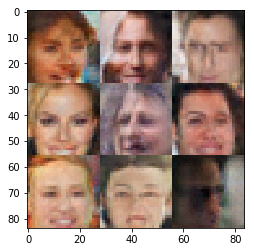

17801.17802.17803.17804.17805.17806.17807.17808.17809.17810.Epoch 3/5... Discriminator Loss: 1.3474... Generator Loss: 0.6131
17811.17812.17813.17814.17815.17816.17817.17818.17819.17820.Epoch 3/5... Discriminator Loss: 1.2591... Generator Loss: 0.7080
17821.17822.17823.17824.17825.17826.17827.17828.17829.17830.Epoch 3/5... Discriminator Loss: 1.2095... Generator Loss: 0.8128
17831.17832.17833.17834.17835.17836.17837.17838.17839.17840.Epoch 3/5... Discriminator Loss: 1.5370... Generator Loss: 0.5721
17841.17842.17843.17844.17845.17846.17847.17848.17849.17850.Epoch 3/5... Discriminator Loss: 1.3975... Generator Loss: 0.6085
17851.17852.17853.17854.17855.17856.17857.17858.17859.17860.Epoch 3/5... Discriminator Loss: 1.2326... Generator Loss: 0.6310
17861.17862.17863.17864.17865.17866.17867.17868.17869.17870.Epoch 3/5... Discriminator Loss: 1.0973... Generator Loss: 0.8037
17871.17872.17873.17874.17875.17876.17877.17878.17879.17880.Epoch 3/5... Discriminator Loss: 1.3772... Generator Loss:

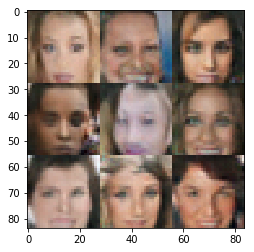

17901.17902.17903.17904.17905.17906.17907.17908.17909.17910.Epoch 3/5... Discriminator Loss: 0.9728... Generator Loss: 1.0876
17911.17912.17913.17914.17915.17916.17917.17918.17919.17920.Epoch 3/5... Discriminator Loss: 1.3524... Generator Loss: 0.6936
17921.17922.17923.17924.17925.17926.17927.17928.17929.17930.Epoch 3/5... Discriminator Loss: 1.4025... Generator Loss: 0.6056
17931.17932.17933.17934.17935.17936.17937.17938.17939.17940.Epoch 3/5... Discriminator Loss: 0.9391... Generator Loss: 0.8384
17941.17942.17943.17944.17945.17946.17947.17948.17949.17950.Epoch 3/5... Discriminator Loss: 1.3760... Generator Loss: 0.5046
17951.17952.17953.17954.17955.17956.17957.17958.17959.17960.Epoch 3/5... Discriminator Loss: 1.3620... Generator Loss: 0.5644
17961.17962.17963.17964.17965.17966.17967.17968.17969.17970.Epoch 3/5... Discriminator Loss: 1.2798... Generator Loss: 0.6055
17971.17972.17973.17974.17975.17976.17977.17978.17979.17980.Epoch 3/5... Discriminator Loss: 1.4894... Generator Loss:

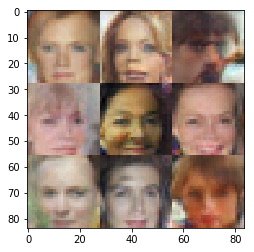

18001.18002.18003.18004.18005.18006.18007.18008.18009.18010.Epoch 3/5... Discriminator Loss: 1.1057... Generator Loss: 0.9311
18011.18012.18013.18014.18015.18016.18017.18018.18019.18020.Epoch 3/5... Discriminator Loss: 1.6422... Generator Loss: 0.5244
18021.18022.18023.18024.18025.18026.18027.18028.18029.18030.Epoch 3/5... Discriminator Loss: 1.4776... Generator Loss: 0.4944
18031.18032.18033.18034.18035.18036.18037.18038.18039.18040.Epoch 3/5... Discriminator Loss: 1.2039... Generator Loss: 0.8143
18041.18042.18043.18044.18045.18046.18047.18048.18049.18050.Epoch 3/5... Discriminator Loss: 0.9174... Generator Loss: 1.0575
18051.18052.18053.18054.18055.18056.18057.18058.18059.18060.Epoch 3/5... Discriminator Loss: 1.1132... Generator Loss: 0.9018
18061.18062.18063.18064.18065.18066.18067.18068.18069.18070.Epoch 3/5... Discriminator Loss: 1.3660... Generator Loss: 0.7328
18071.18072.18073.18074.18075.18076.18077.18078.18079.18080.Epoch 3/5... Discriminator Loss: 1.3046... Generator Loss:

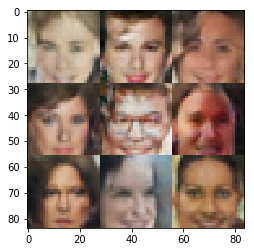

18101.18102.18103.18104.18105.18106.18107.18108.18109.18110.Epoch 3/5... Discriminator Loss: 1.1046... Generator Loss: 0.6888
18111.18112.18113.18114.18115.18116.18117.18118.18119.18120.Epoch 3/5... Discriminator Loss: 1.2873... Generator Loss: 0.6463
18121.18122.18123.18124.18125.18126.18127.18128.18129.18130.Epoch 3/5... Discriminator Loss: 1.1296... Generator Loss: 1.1131
18131.18132.18133.18134.18135.18136.18137.18138.18139.18140.Epoch 3/5... Discriminator Loss: 1.1041... Generator Loss: 0.6878
18141.18142.18143.18144.18145.18146.18147.18148.18149.18150.Epoch 3/5... Discriminator Loss: 1.2997... Generator Loss: 0.7682
18151.18152.18153.18154.18155.18156.18157.18158.18159.18160.Epoch 3/5... Discriminator Loss: 1.4745... Generator Loss: 0.4138
18161.18162.18163.18164.18165.18166.18167.18168.18169.18170.Epoch 3/5... Discriminator Loss: 1.5544... Generator Loss: 0.4396
18171.18172.18173.18174.18175.18176.18177.18178.18179.18180.Epoch 3/5... Discriminator Loss: 0.9631... Generator Loss:

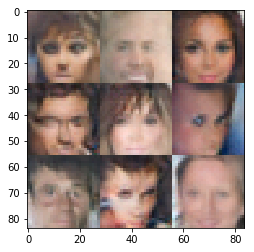

18201.18202.18203.18204.18205.18206.18207.18208.18209.18210.Epoch 3/5... Discriminator Loss: 1.4185... Generator Loss: 0.4960
18211.18212.18213.18214.18215.18216.18217.18218.18219.18220.Epoch 3/5... Discriminator Loss: 1.1721... Generator Loss: 0.6587
18221.18222.18223.18224.18225.18226.18227.18228.18229.18230.Epoch 3/5... Discriminator Loss: 1.1639... Generator Loss: 1.0093
18231.18232.18233.18234.18235.18236.18237.18238.18239.18240.Epoch 3/5... Discriminator Loss: 0.9566... Generator Loss: 0.8689
18241.18242.18243.18244.18245.18246.18247.18248.18249.18250.Epoch 3/5... Discriminator Loss: 1.5062... Generator Loss: 0.6047
18251.18252.18253.18254.18255.18256.18257.18258.18259.18260.Epoch 3/5... Discriminator Loss: 1.3483... Generator Loss: 0.8707
18261.18262.18263.18264.18265.18266.18267.18268.18269.18270.Epoch 3/5... Discriminator Loss: 1.1296... Generator Loss: 0.7056
18271.18272.18273.18274.18275.18276.18277.18278.18279.18280.Epoch 3/5... Discriminator Loss: 1.0303... Generator Loss:

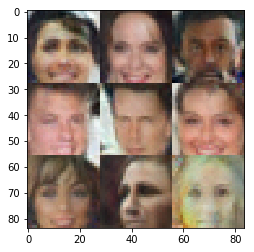

18301.18302.18303.18304.18305.18306.18307.18308.18309.18310.Epoch 3/5... Discriminator Loss: 1.2224... Generator Loss: 0.7300
18311.18312.18313.18314.18315.18316.18317.18318.18319.18320.Epoch 3/5... Discriminator Loss: 1.2205... Generator Loss: 0.6315
18321.18322.18323.18324.18325.18326.18327.18328.18329.18330.Epoch 3/5... Discriminator Loss: 1.4394... Generator Loss: 0.6131
18331.18332.18333.18334.18335.18336.18337.18338.18339.18340.Epoch 3/5... Discriminator Loss: 1.5646... Generator Loss: 0.3966
18341.18342.18343.18344.18345.18346.18347.18348.18349.18350.Epoch 3/5... Discriminator Loss: 1.1972... Generator Loss: 0.6558
18351.18352.18353.18354.18355.18356.18357.18358.18359.18360.Epoch 3/5... Discriminator Loss: 1.4778... Generator Loss: 0.3767
18361.18362.18363.18364.18365.18366.18367.18368.18369.18370.Epoch 3/5... Discriminator Loss: 1.6411... Generator Loss: 0.3558
18371.18372.18373.18374.18375.18376.18377.18378.18379.18380.Epoch 3/5... Discriminator Loss: 1.3231... Generator Loss:

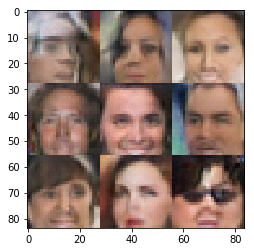

18401.18402.18403.18404.18405.18406.18407.18408.18409.18410.Epoch 3/5... Discriminator Loss: 1.1007... Generator Loss: 0.9892
18411.18412.18413.18414.18415.18416.18417.18418.18419.18420.Epoch 3/5... Discriminator Loss: 1.4132... Generator Loss: 0.6015
18421.18422.18423.18424.18425.18426.18427.18428.18429.18430.Epoch 3/5... Discriminator Loss: 1.1698... Generator Loss: 1.0950
18431.18432.18433.18434.18435.18436.18437.18438.18439.18440.Epoch 3/5... Discriminator Loss: 1.1285... Generator Loss: 0.6502
18441.18442.18443.18444.18445.18446.18447.18448.18449.18450.Epoch 3/5... Discriminator Loss: 1.2986... Generator Loss: 0.5175
18451.18452.18453.18454.18455.18456.18457.18458.18459.18460.Epoch 3/5... Discriminator Loss: 1.0572... Generator Loss: 0.8140
18461.18462.18463.18464.18465.18466.18467.18468.18469.18470.Epoch 3/5... Discriminator Loss: 1.1796... Generator Loss: 0.7796
18471.18472.18473.18474.18475.18476.18477.18478.18479.18480.Epoch 3/5... Discriminator Loss: 1.0238... Generator Loss:

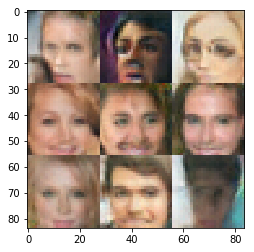

18501.18502.18503.18504.18505.18506.18507.18508.18509.18510.Epoch 3/5... Discriminator Loss: 1.8425... Generator Loss: 0.2925
18511.18512.18513.18514.18515.18516.18517.18518.18519.18520.Epoch 3/5... Discriminator Loss: 0.1759... Generator Loss: 4.0812
18521.18522.18523.18524.18525.18526.18527.18528.18529.18530.Epoch 3/5... Discriminator Loss: 0.6914... Generator Loss: 4.5400
18531.18532.18533.18534.18535.18536.18537.18538.18539.18540.Epoch 3/5... Discriminator Loss: 0.3805... Generator Loss: 3.3944
18541.18542.18543.18544.18545.18546.18547.18548.18549.18550.Epoch 3/5... Discriminator Loss: 1.1248... Generator Loss: 2.5617
18551.18552.18553.18554.18555.18556.18557.18558.18559.18560.Epoch 3/5... Discriminator Loss: 1.7917... Generator Loss: 0.2466
18561.18562.18563.18564.18565.18566.18567.18568.18569.18570.Epoch 3/5... Discriminator Loss: 0.9439... Generator Loss: 2.1343
18571.18572.18573.18574.18575.18576.18577.18578.18579.18580.Epoch 3/5... Discriminator Loss: 0.9749... Generator Loss:

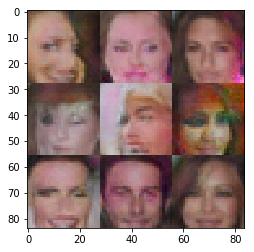

18601.18602.18603.18604.18605.18606.18607.18608.18609.18610.Epoch 3/5... Discriminator Loss: 0.7834... Generator Loss: 1.7372
18611.18612.18613.18614.18615.18616.18617.18618.18619.18620.Epoch 3/5... Discriminator Loss: 0.9856... Generator Loss: 0.8129
18621.18622.18623.18624.18625.18626.18627.18628.18629.18630.Epoch 3/5... Discriminator Loss: 1.3055... Generator Loss: 0.6003
18631.18632.18633.18634.18635.18636.18637.18638.18639.18640.Epoch 3/5... Discriminator Loss: 1.8570... Generator Loss: 0.4391
18641.18642.18643.18644.18645.18646.18647.18648.18649.18650.Epoch 3/5... Discriminator Loss: 1.3178... Generator Loss: 0.5704
18651.18652.18653.18654.18655.18656.18657.18658.18659.18660.Epoch 3/5... Discriminator Loss: 1.1753... Generator Loss: 0.5826
18661.18662.18663.18664.18665.18666.18667.18668.18669.18670.Epoch 3/5... Discriminator Loss: 1.2047... Generator Loss: 0.7078
18671.18672.18673.18674.18675.18676.18677.18678.18679.18680.Epoch 3/5... Discriminator Loss: 1.2012... Generator Loss:

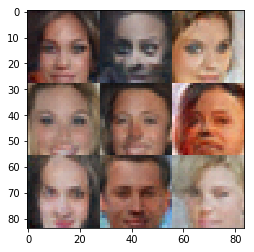

18701.18702.18703.18704.18705.18706.18707.18708.18709.18710.Epoch 3/5... Discriminator Loss: 1.0225... Generator Loss: 0.7954
18711.18712.18713.18714.18715.18716.18717.18718.18719.18720.Epoch 3/5... Discriminator Loss: 1.1640... Generator Loss: 0.6703
18721.18722.18723.18724.18725.18726.18727.18728.18729.18730.Epoch 3/5... Discriminator Loss: 1.2052... Generator Loss: 0.8810
18731.18732.18733.18734.18735.18736.18737.18738.18739.18740.Epoch 3/5... Discriminator Loss: 1.2656... Generator Loss: 0.5797
18741.18742.18743.18744.18745.18746.18747.18748.18749.18750.Epoch 3/5... Discriminator Loss: 1.4198... Generator Loss: 0.4870
18751.18752.18753.18754.18755.18756.18757.18758.18759.18760.Epoch 3/5... Discriminator Loss: 1.3781... Generator Loss: 0.5439
18761.18762.18763.18764.18765.18766.18767.18768.18769.18770.Epoch 3/5... Discriminator Loss: 1.3456... Generator Loss: 0.6274
18771.18772.18773.18774.18775.18776.18777.18778.18779.18780.Epoch 3/5... Discriminator Loss: 1.7230... Generator Loss:

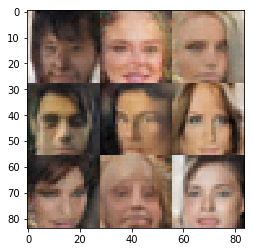

18801.18802.18803.18804.18805.18806.18807.18808.18809.18810.Epoch 3/5... Discriminator Loss: 1.3416... Generator Loss: 0.5435
18811.18812.18813.18814.18815.18816.18817.18818.18819.18820.Epoch 3/5... Discriminator Loss: 1.8924... Generator Loss: 0.2377
18821.18822.18823.18824.18825.18826.18827.18828.18829.18830.Epoch 3/5... Discriminator Loss: 1.3703... Generator Loss: 0.6310
18831.18832.18833.18834.18835.18836.18837.18838.18839.18840.Epoch 3/5... Discriminator Loss: 1.2906... Generator Loss: 0.6223
18841.18842.18843.18844.18845.18846.18847.18848.18849.18850.Epoch 3/5... Discriminator Loss: 1.2474... Generator Loss: 0.5816
18851.18852.18853.18854.18855.18856.18857.18858.18859.18860.Epoch 3/5... Discriminator Loss: 1.3442... Generator Loss: 0.7463
18861.18862.18863.18864.18865.18866.18867.18868.18869.18870.Epoch 3/5... Discriminator Loss: 1.2814... Generator Loss: 0.7221
18871.18872.18873.18874.18875.18876.18877.18878.18879.18880.Epoch 3/5... Discriminator Loss: 1.3060... Generator Loss:

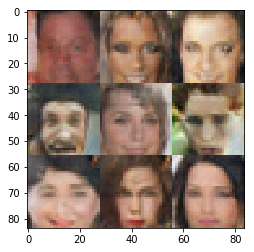

18901.18902.18903.18904.18905.18906.18907.18908.18909.18910.Epoch 3/5... Discriminator Loss: 1.0992... Generator Loss: 0.8130
18911.18912.18913.18914.18915.18916.18917.18918.18919.18920.Epoch 3/5... Discriminator Loss: 1.1431... Generator Loss: 0.8625
18921.18922.18923.18924.18925.18926.18927.18928.18929.18930.Epoch 3/5... Discriminator Loss: 1.1254... Generator Loss: 0.7827
18931.18932.18933.18934.18935.18936.18937.18938.18939.18940.Epoch 3/5... Discriminator Loss: 1.5811... Generator Loss: 0.4310
18941.18942.18943.18944.18945.18946.18947.18948.18949.18950.Epoch 3/5... Discriminator Loss: 1.3852... Generator Loss: 0.5845
18951.18952.18953.18954.18955.18956.18957.18958.18959.18960.Epoch 3/5... Discriminator Loss: 1.1469... Generator Loss: 0.7707
18961.18962.18963.18964.18965.18966.18967.18968.18969.18970.Epoch 3/5... Discriminator Loss: 1.5144... Generator Loss: 0.5662
18971.18972.18973.18974.18975.18976.18977.18978.18979.18980.Epoch 3/5... Discriminator Loss: 1.4899... Generator Loss:

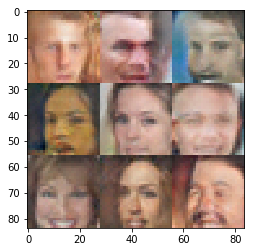

19001.19002.19003.19004.19005.19006.19007.19008.19009.19010.Epoch 4/5... Discriminator Loss: 1.2422... Generator Loss: 0.6583
19011.19012.19013.19014.19015.19016.19017.19018.19019.19020.Epoch 4/5... Discriminator Loss: 1.3097... Generator Loss: 0.6180
19021.19022.19023.19024.19025.19026.19027.19028.19029.19030.Epoch 4/5... Discriminator Loss: 1.7098... Generator Loss: 0.3775
19031.19032.19033.19034.19035.19036.19037.19038.19039.19040.Epoch 4/5... Discriminator Loss: 1.3957... Generator Loss: 0.4768
19041.19042.19043.19044.19045.19046.19047.19048.19049.19050.Epoch 4/5... Discriminator Loss: 1.4041... Generator Loss: 0.4882
19051.19052.19053.19054.19055.19056.19057.19058.19059.19060.Epoch 4/5... Discriminator Loss: 1.2950... Generator Loss: 0.5486
19061.19062.19063.19064.19065.19066.19067.19068.19069.19070.Epoch 4/5... Discriminator Loss: 1.3704... Generator Loss: 0.5130
19071.19072.19073.19074.19075.19076.19077.19078.19079.19080.Epoch 4/5... Discriminator Loss: 1.5733... Generator Loss:

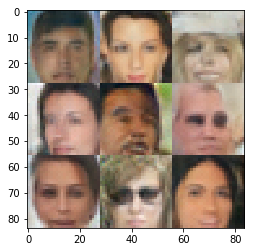

19101.19102.19103.19104.19105.19106.19107.19108.19109.19110.Epoch 4/5... Discriminator Loss: 1.3975... Generator Loss: 0.5079
19111.19112.19113.19114.19115.19116.19117.19118.19119.19120.Epoch 4/5... Discriminator Loss: 1.3906... Generator Loss: 0.4916
19121.19122.19123.19124.19125.19126.19127.19128.19129.19130.Epoch 4/5... Discriminator Loss: 1.6655... Generator Loss: 0.3740
19131.19132.19133.19134.19135.19136.19137.19138.19139.19140.Epoch 4/5... Discriminator Loss: 0.9350... Generator Loss: 0.8559
19141.19142.19143.19144.19145.19146.19147.19148.19149.19150.Epoch 4/5... Discriminator Loss: 1.4377... Generator Loss: 0.5347
19151.19152.19153.19154.19155.19156.19157.19158.19159.19160.Epoch 4/5... Discriminator Loss: 1.0577... Generator Loss: 1.0615
19161.19162.19163.19164.19165.19166.19167.19168.19169.19170.Epoch 4/5... Discriminator Loss: 0.9703... Generator Loss: 0.9023
19171.19172.19173.19174.19175.19176.19177.19178.19179.19180.Epoch 4/5... Discriminator Loss: 1.2843... Generator Loss:

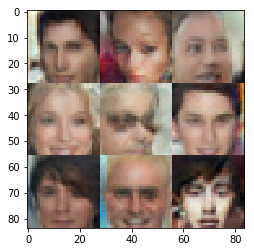

19201.19202.19203.19204.19205.19206.19207.19208.19209.19210.Epoch 4/5... Discriminator Loss: 1.6861... Generator Loss: 0.3840
19211.19212.19213.19214.19215.19216.19217.19218.19219.19220.Epoch 4/5... Discriminator Loss: 1.4122... Generator Loss: 0.5450
19221.19222.19223.19224.19225.19226.19227.19228.19229.19230.Epoch 4/5... Discriminator Loss: 1.1533... Generator Loss: 1.1672
19231.19232.19233.19234.19235.19236.19237.19238.19239.19240.Epoch 4/5... Discriminator Loss: 1.3577... Generator Loss: 0.7327
19241.19242.19243.19244.19245.19246.19247.19248.19249.19250.Epoch 4/5... Discriminator Loss: 1.2815... Generator Loss: 0.5397
19251.19252.19253.19254.19255.19256.19257.19258.19259.19260.Epoch 4/5... Discriminator Loss: 1.7131... Generator Loss: 0.5942
19261.19262.19263.19264.19265.19266.19267.19268.19269.19270.Epoch 4/5... Discriminator Loss: 1.3596... Generator Loss: 0.5226
19271.19272.19273.19274.19275.19276.19277.19278.19279.19280.Epoch 4/5... Discriminator Loss: 1.0964... Generator Loss:

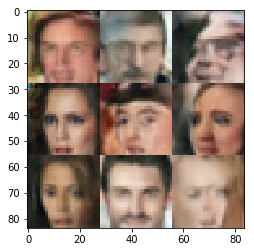

19301.19302.19303.19304.19305.19306.19307.19308.19309.19310.Epoch 4/5... Discriminator Loss: 1.2383... Generator Loss: 0.7600
19311.19312.19313.19314.19315.19316.19317.19318.19319.19320.Epoch 4/5... Discriminator Loss: 1.2777... Generator Loss: 0.5265
19321.19322.19323.19324.19325.19326.19327.19328.19329.19330.Epoch 4/5... Discriminator Loss: 1.1759... Generator Loss: 0.7548
19331.19332.19333.19334.19335.19336.19337.19338.19339.19340.Epoch 4/5... Discriminator Loss: 1.2508... Generator Loss: 0.7254
19341.19342.19343.19344.19345.19346.19347.19348.19349.19350.Epoch 4/5... Discriminator Loss: 0.9962... Generator Loss: 0.7797
19351.19352.19353.19354.19355.19356.19357.19358.19359.19360.Epoch 4/5... Discriminator Loss: 1.1850... Generator Loss: 0.6882
19361.19362.19363.19364.19365.19366.19367.19368.19369.19370.Epoch 4/5... Discriminator Loss: 1.3247... Generator Loss: 0.5484
19371.19372.19373.19374.19375.19376.19377.19378.19379.19380.Epoch 4/5... Discriminator Loss: 1.4409... Generator Loss:

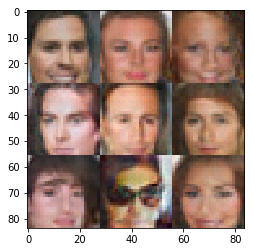

19401.19402.19403.19404.19405.19406.19407.19408.19409.19410.Epoch 4/5... Discriminator Loss: 1.3701... Generator Loss: 0.5690
19411.19412.19413.19414.19415.19416.19417.19418.19419.19420.Epoch 4/5... Discriminator Loss: 1.4361... Generator Loss: 0.6869
19421.19422.19423.19424.19425.19426.19427.19428.19429.19430.Epoch 4/5... Discriminator Loss: 1.0482... Generator Loss: 0.8526
19431.19432.19433.19434.19435.19436.19437.19438.19439.19440.Epoch 4/5... Discriminator Loss: 1.2828... Generator Loss: 0.7736
19441.19442.19443.19444.19445.19446.19447.19448.19449.19450.Epoch 4/5... Discriminator Loss: 1.0311... Generator Loss: 1.0478
19451.19452.19453.19454.19455.19456.19457.19458.19459.19460.Epoch 4/5... Discriminator Loss: 1.0458... Generator Loss: 0.9413
19461.19462.19463.19464.19465.19466.19467.19468.19469.19470.Epoch 4/5... Discriminator Loss: 1.9793... Generator Loss: 0.4478
19471.19472.19473.19474.19475.19476.19477.19478.19479.19480.Epoch 4/5... Discriminator Loss: 1.3760... Generator Loss:

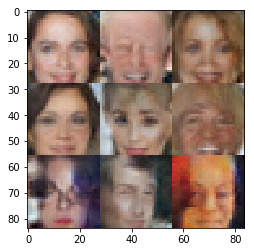

19501.19502.19503.19504.19505.19506.19507.19508.19509.19510.Epoch 4/5... Discriminator Loss: 1.4935... Generator Loss: 0.4694
19511.19512.19513.19514.19515.19516.19517.19518.19519.19520.Epoch 4/5... Discriminator Loss: 1.3351... Generator Loss: 0.5707
19521.19522.19523.19524.19525.19526.19527.19528.19529.19530.Epoch 4/5... Discriminator Loss: 1.4778... Generator Loss: 0.5188
19531.19532.19533.19534.19535.19536.19537.19538.19539.19540.Epoch 4/5... Discriminator Loss: 1.3073... Generator Loss: 0.5702
19541.19542.19543.19544.19545.19546.19547.19548.19549.19550.Epoch 4/5... Discriminator Loss: 1.2179... Generator Loss: 0.7317
19551.19552.19553.19554.19555.19556.19557.19558.19559.19560.Epoch 4/5... Discriminator Loss: 1.3503... Generator Loss: 0.7346
19561.19562.19563.19564.19565.19566.19567.19568.19569.19570.Epoch 4/5... Discriminator Loss: 1.2168... Generator Loss: 0.8343
19571.19572.19573.19574.19575.19576.19577.19578.19579.19580.Epoch 4/5... Discriminator Loss: 1.4026... Generator Loss:

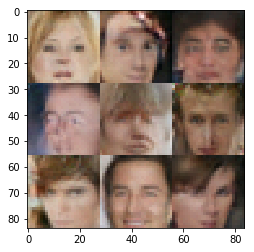

19601.19602.19603.19604.19605.19606.19607.19608.19609.19610.Epoch 4/5... Discriminator Loss: 1.1807... Generator Loss: 0.6106
19611.19612.19613.19614.19615.19616.19617.19618.19619.19620.Epoch 4/5... Discriminator Loss: 1.3307... Generator Loss: 0.5330
19621.19622.19623.19624.19625.19626.19627.19628.19629.19630.Epoch 4/5... Discriminator Loss: 1.6295... Generator Loss: 0.3659
19631.19632.19633.19634.19635.19636.19637.19638.19639.19640.Epoch 4/5... Discriminator Loss: 1.3866... Generator Loss: 0.5359
19641.19642.19643.19644.19645.19646.19647.19648.19649.19650.Epoch 4/5... Discriminator Loss: 1.4207... Generator Loss: 0.5941
19651.19652.19653.19654.19655.19656.19657.19658.19659.19660.Epoch 4/5... Discriminator Loss: 1.2998... Generator Loss: 0.6375
19661.19662.19663.19664.19665.19666.19667.19668.19669.19670.Epoch 4/5... Discriminator Loss: 1.3132... Generator Loss: 0.6297
19671.19672.19673.19674.19675.19676.19677.19678.19679.19680.Epoch 4/5... Discriminator Loss: 1.5095... Generator Loss:

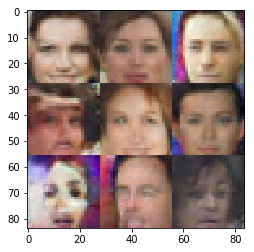

19701.19702.19703.19704.19705.19706.19707.19708.19709.19710.Epoch 4/5... Discriminator Loss: 1.4529... Generator Loss: 0.7628
19711.19712.19713.19714.19715.19716.19717.19718.19719.19720.Epoch 4/5... Discriminator Loss: 1.2155... Generator Loss: 0.7081
19721.19722.19723.19724.19725.19726.19727.19728.19729.19730.Epoch 4/5... Discriminator Loss: 1.5235... Generator Loss: 0.3878
19731.19732.19733.19734.19735.19736.19737.19738.19739.19740.Epoch 4/5... Discriminator Loss: 1.2475... Generator Loss: 0.5682
19741.19742.19743.19744.19745.19746.19747.19748.19749.19750.Epoch 4/5... Discriminator Loss: 1.1059... Generator Loss: 0.8633
19751.19752.19753.19754.19755.19756.19757.19758.19759.19760.Epoch 4/5... Discriminator Loss: 1.2939... Generator Loss: 0.8280
19761.19762.19763.19764.19765.19766.19767.19768.19769.19770.Epoch 4/5... Discriminator Loss: 1.2102... Generator Loss: 0.6344
19771.19772.19773.19774.19775.19776.19777.19778.19779.19780.Epoch 4/5... Discriminator Loss: 1.0875... Generator Loss:

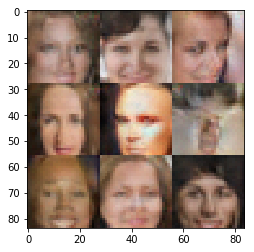

19801.19802.19803.19804.19805.19806.19807.19808.19809.19810.Epoch 4/5... Discriminator Loss: 1.4237... Generator Loss: 0.4996
19811.19812.19813.19814.19815.19816.19817.19818.19819.19820.Epoch 4/5... Discriminator Loss: 1.4768... Generator Loss: 0.5111
19821.19822.19823.19824.19825.19826.19827.19828.19829.19830.Epoch 4/5... Discriminator Loss: 1.2497... Generator Loss: 0.6482
19831.19832.19833.19834.19835.19836.19837.19838.19839.19840.Epoch 4/5... Discriminator Loss: 1.1277... Generator Loss: 0.7908
19841.19842.19843.19844.19845.19846.19847.19848.19849.19850.Epoch 4/5... Discriminator Loss: 1.3971... Generator Loss: 0.5221
19851.19852.19853.19854.19855.19856.19857.19858.19859.19860.Epoch 4/5... Discriminator Loss: 1.4321... Generator Loss: 0.4522
19861.19862.19863.19864.19865.19866.19867.19868.19869.19870.Epoch 4/5... Discriminator Loss: 1.2430... Generator Loss: 0.6448
19871.19872.19873.19874.19875.19876.19877.19878.19879.19880.Epoch 4/5... Discriminator Loss: 1.4453... Generator Loss:

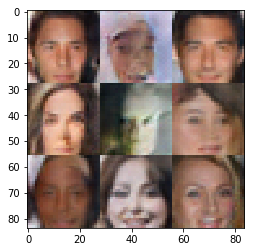

19901.19902.19903.19904.19905.19906.19907.19908.19909.19910.Epoch 4/5... Discriminator Loss: 1.1560... Generator Loss: 0.7597
19911.19912.19913.19914.19915.19916.19917.19918.19919.19920.Epoch 4/5... Discriminator Loss: 1.0312... Generator Loss: 0.6905
19921.19922.19923.19924.19925.19926.19927.19928.19929.19930.Epoch 4/5... Discriminator Loss: 1.1400... Generator Loss: 0.7061
19931.19932.19933.19934.19935.19936.19937.19938.19939.19940.Epoch 4/5... Discriminator Loss: 1.5403... Generator Loss: 0.3960
19941.19942.19943.19944.19945.19946.19947.19948.19949.19950.Epoch 4/5... Discriminator Loss: 1.3696... Generator Loss: 0.6143
19951.19952.19953.19954.19955.19956.19957.19958.19959.19960.Epoch 4/5... Discriminator Loss: 1.1451... Generator Loss: 0.8026
19961.19962.19963.19964.19965.19966.19967.19968.19969.19970.Epoch 4/5... Discriminator Loss: 1.5163... Generator Loss: 0.4725
19971.19972.19973.19974.19975.19976.19977.19978.19979.19980.Epoch 4/5... Discriminator Loss: 1.1933... Generator Loss:

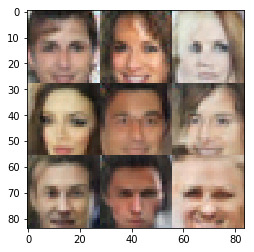

20001.20002.20003.20004.20005.20006.20007.20008.20009.20010.Epoch 4/5... Discriminator Loss: 1.3332... Generator Loss: 0.9015
20011.20012.20013.20014.20015.20016.20017.20018.20019.20020.Epoch 4/5... Discriminator Loss: 1.2381... Generator Loss: 0.6667
20021.20022.20023.20024.20025.20026.20027.20028.20029.20030.Epoch 4/5... Discriminator Loss: 1.3419... Generator Loss: 0.6334
20031.20032.20033.20034.20035.20036.20037.20038.20039.20040.Epoch 4/5... Discriminator Loss: 1.3675... Generator Loss: 0.5820
20041.20042.20043.20044.20045.20046.20047.20048.20049.20050.Epoch 4/5... Discriminator Loss: 1.3758... Generator Loss: 0.4992
20051.20052.20053.20054.20055.20056.20057.20058.20059.20060.Epoch 4/5... Discriminator Loss: 1.2100... Generator Loss: 0.6783
20061.20062.20063.20064.20065.20066.20067.20068.20069.20070.Epoch 4/5... Discriminator Loss: 1.2614... Generator Loss: 0.5216
20071.20072.20073.20074.20075.20076.20077.20078.20079.20080.Epoch 4/5... Discriminator Loss: 1.6347... Generator Loss:

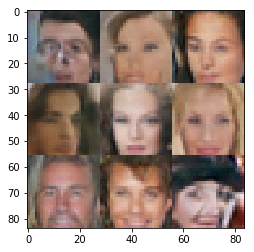

20101.20102.20103.20104.20105.20106.20107.20108.20109.20110.Epoch 4/5... Discriminator Loss: 1.2380... Generator Loss: 0.6256
20111.20112.20113.20114.20115.20116.20117.20118.20119.20120.Epoch 4/5... Discriminator Loss: 1.1373... Generator Loss: 0.6782
20121.20122.20123.20124.20125.20126.20127.20128.20129.20130.Epoch 4/5... Discriminator Loss: 1.3399... Generator Loss: 0.6792
20131.20132.20133.20134.20135.20136.20137.20138.20139.20140.Epoch 4/5... Discriminator Loss: 1.2990... Generator Loss: 0.7997
20141.20142.20143.20144.20145.20146.20147.20148.20149.20150.Epoch 4/5... Discriminator Loss: 1.1402... Generator Loss: 0.7307
20151.20152.20153.20154.20155.20156.20157.20158.20159.20160.Epoch 4/5... Discriminator Loss: 1.2869... Generator Loss: 0.7422
20161.20162.20163.20164.20165.20166.20167.20168.20169.20170.Epoch 4/5... Discriminator Loss: 1.2122... Generator Loss: 0.6342
20171.20172.20173.20174.20175.20176.20177.20178.20179.20180.Epoch 4/5... Discriminator Loss: 1.3862... Generator Loss:

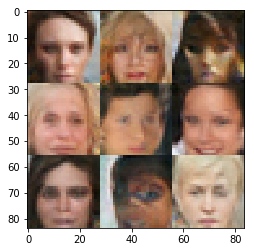

20201.20202.20203.20204.20205.20206.20207.20208.20209.20210.Epoch 4/5... Discriminator Loss: 1.1416... Generator Loss: 0.8573
20211.20212.20213.20214.20215.20216.20217.20218.20219.20220.Epoch 4/5... Discriminator Loss: 1.8302... Generator Loss: 0.4004
20221.20222.20223.20224.20225.20226.20227.20228.20229.20230.Epoch 4/5... Discriminator Loss: 1.4217... Generator Loss: 0.4993
20231.20232.20233.20234.20235.20236.20237.20238.20239.20240.Epoch 4/5... Discriminator Loss: 1.4360... Generator Loss: 0.4992
20241.20242.20243.20244.20245.20246.20247.20248.20249.20250.Epoch 4/5... Discriminator Loss: 1.3978... Generator Loss: 0.4605
20251.20252.20253.20254.20255.20256.20257.20258.20259.20260.Epoch 4/5... Discriminator Loss: 1.4617... Generator Loss: 0.3682
20261.20262.20263.20264.20265.20266.20267.20268.20269.20270.Epoch 4/5... Discriminator Loss: 1.4066... Generator Loss: 0.4860
20271.20272.20273.20274.20275.20276.20277.20278.20279.20280.Epoch 4/5... Discriminator Loss: 1.4703... Generator Loss:

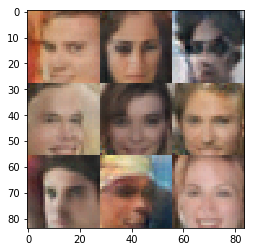

20301.20302.20303.20304.20305.20306.20307.20308.20309.20310.Epoch 4/5... Discriminator Loss: 1.3240... Generator Loss: 0.7021
20311.20312.20313.20314.20315.20316.20317.20318.20319.20320.Epoch 4/5... Discriminator Loss: 1.2814... Generator Loss: 0.7174
20321.20322.20323.20324.20325.20326.20327.20328.20329.20330.Epoch 4/5... Discriminator Loss: 1.2007... Generator Loss: 0.5695
20331.20332.20333.20334.20335.20336.20337.20338.20339.20340.Epoch 4/5... Discriminator Loss: 1.4150... Generator Loss: 0.4946
20341.20342.20343.20344.20345.20346.20347.20348.20349.20350.Epoch 4/5... Discriminator Loss: 1.2748... Generator Loss: 0.6123
20351.20352.20353.20354.20355.20356.20357.20358.20359.20360.Epoch 4/5... Discriminator Loss: 1.1234... Generator Loss: 0.8848
20361.20362.20363.20364.20365.20366.20367.20368.20369.20370.Epoch 4/5... Discriminator Loss: 1.2839... Generator Loss: 0.7429
20371.20372.20373.20374.20375.20376.20377.20378.20379.20380.Epoch 4/5... Discriminator Loss: 1.1927... Generator Loss:

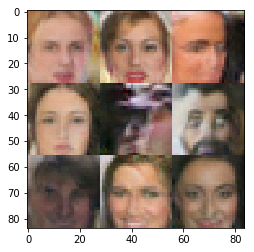

20401.20402.20403.20404.20405.20406.20407.20408.20409.20410.Epoch 4/5... Discriminator Loss: 1.3710... Generator Loss: 0.5996
20411.20412.20413.20414.20415.20416.20417.20418.20419.20420.Epoch 4/5... Discriminator Loss: 0.9755... Generator Loss: 0.8531
20421.20422.20423.20424.20425.20426.20427.20428.20429.20430.Epoch 4/5... Discriminator Loss: 1.5113... Generator Loss: 0.5738
20431.20432.20433.20434.20435.20436.20437.20438.20439.20440.Epoch 4/5... Discriminator Loss: 1.3893... Generator Loss: 0.5761
20441.20442.20443.20444.20445.20446.20447.20448.20449.20450.Epoch 4/5... Discriminator Loss: 1.4483... Generator Loss: 0.3805
20451.20452.20453.20454.20455.20456.20457.20458.20459.20460.Epoch 4/5... Discriminator Loss: 1.3876... Generator Loss: 0.5246
20461.20462.20463.20464.20465.20466.20467.20468.20469.20470.Epoch 4/5... Discriminator Loss: 1.2838... Generator Loss: 0.7891
20471.20472.20473.20474.20475.20476.20477.20478.20479.20480.Epoch 4/5... Discriminator Loss: 1.2275... Generator Loss:

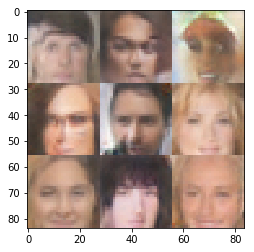

20501.20502.20503.20504.20505.20506.20507.20508.20509.20510.Epoch 4/5... Discriminator Loss: 1.2558... Generator Loss: 0.6210
20511.20512.20513.20514.20515.20516.20517.20518.20519.20520.Epoch 4/5... Discriminator Loss: 1.4426... Generator Loss: 0.4804
20521.20522.20523.20524.20525.20526.20527.20528.20529.20530.Epoch 4/5... Discriminator Loss: 1.4865... Generator Loss: 0.4623
20531.20532.20533.20534.20535.20536.20537.20538.20539.20540.Epoch 4/5... Discriminator Loss: 1.3746... Generator Loss: 0.4910
20541.20542.20543.20544.20545.20546.20547.20548.20549.20550.Epoch 4/5... Discriminator Loss: 1.3848... Generator Loss: 0.4306
20551.20552.20553.20554.20555.20556.20557.20558.20559.20560.Epoch 4/5... Discriminator Loss: 1.0767... Generator Loss: 0.7524
20561.20562.20563.20564.20565.20566.20567.20568.20569.20570.Epoch 4/5... Discriminator Loss: 1.0436... Generator Loss: 1.1082
20571.20572.20573.20574.20575.20576.20577.20578.20579.20580.Epoch 4/5... Discriminator Loss: 1.3001... Generator Loss:

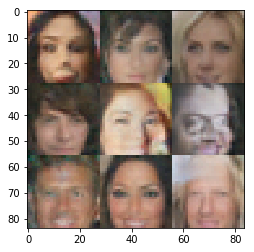

20601.20602.20603.20604.20605.20606.20607.20608.20609.20610.Epoch 4/5... Discriminator Loss: 1.4589... Generator Loss: 0.4081
20611.20612.20613.20614.20615.20616.20617.20618.20619.20620.Epoch 4/5... Discriminator Loss: 1.6109... Generator Loss: 0.5295
20621.20622.20623.20624.20625.20626.20627.20628.20629.20630.Epoch 4/5... Discriminator Loss: 1.2082... Generator Loss: 0.7364
20631.20632.20633.20634.20635.20636.20637.20638.20639.20640.Epoch 4/5... Discriminator Loss: 1.1794... Generator Loss: 0.8015
20641.20642.20643.20644.20645.20646.20647.20648.20649.20650.Epoch 4/5... Discriminator Loss: 1.3579... Generator Loss: 0.5306
20651.20652.20653.20654.20655.20656.20657.20658.20659.20660.Epoch 4/5... Discriminator Loss: 1.0418... Generator Loss: 0.8518
20661.20662.20663.20664.20665.20666.20667.20668.20669.20670.Epoch 4/5... Discriminator Loss: 1.0088... Generator Loss: 0.8641
20671.20672.20673.20674.20675.20676.20677.20678.20679.20680.Epoch 4/5... Discriminator Loss: 1.3913... Generator Loss:

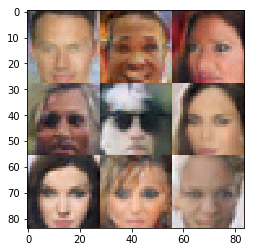

20701.20702.20703.20704.20705.20706.20707.20708.20709.20710.Epoch 4/5... Discriminator Loss: 1.3244... Generator Loss: 0.6211
20711.20712.20713.20714.20715.20716.20717.20718.20719.20720.Epoch 4/5... Discriminator Loss: 1.4198... Generator Loss: 0.5053
20721.20722.20723.20724.20725.20726.20727.20728.20729.20730.Epoch 4/5... Discriminator Loss: 1.2827... Generator Loss: 0.6441
20731.20732.20733.20734.20735.20736.20737.20738.20739.20740.Epoch 4/5... Discriminator Loss: 1.0840... Generator Loss: 0.8438
20741.20742.20743.20744.20745.20746.20747.20748.20749.20750.Epoch 4/5... Discriminator Loss: 1.1717... Generator Loss: 0.6969
20751.20752.20753.20754.20755.20756.20757.20758.20759.20760.Epoch 4/5... Discriminator Loss: 1.2158... Generator Loss: 0.6679
20761.20762.20763.20764.20765.20766.20767.20768.20769.20770.Epoch 4/5... Discriminator Loss: 1.2840... Generator Loss: 0.6157
20771.20772.20773.20774.20775.20776.20777.20778.20779.20780.Epoch 4/5... Discriminator Loss: 1.4108... Generator Loss:

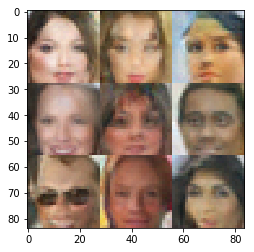

20801.20802.20803.20804.20805.20806.20807.20808.20809.20810.Epoch 4/5... Discriminator Loss: 1.0535... Generator Loss: 0.8259
20811.20812.20813.20814.20815.20816.20817.20818.20819.20820.Epoch 4/5... Discriminator Loss: 1.2295... Generator Loss: 0.6854
20821.20822.20823.20824.20825.20826.20827.20828.20829.20830.Epoch 4/5... Discriminator Loss: 1.1477... Generator Loss: 0.7304
20831.20832.20833.20834.20835.20836.20837.20838.20839.20840.Epoch 4/5... Discriminator Loss: 1.1985... Generator Loss: 0.6849
20841.20842.20843.20844.20845.20846.20847.20848.20849.20850.Epoch 4/5... Discriminator Loss: 1.4272... Generator Loss: 0.4801
20851.20852.20853.20854.20855.20856.20857.20858.20859.20860.Epoch 4/5... Discriminator Loss: 1.1321... Generator Loss: 0.8119
20861.20862.20863.20864.20865.20866.20867.20868.20869.20870.Epoch 4/5... Discriminator Loss: 1.5614... Generator Loss: 0.4394
20871.20872.20873.20874.20875.20876.20877.20878.20879.20880.Epoch 4/5... Discriminator Loss: 1.0816... Generator Loss:

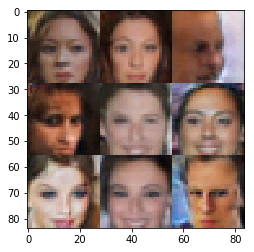

20901.20902.20903.20904.20905.20906.20907.20908.20909.20910.Epoch 4/5... Discriminator Loss: 0.8177... Generator Loss: 0.8966
20911.20912.20913.20914.20915.20916.20917.20918.20919.20920.Epoch 4/5... Discriminator Loss: 1.1437... Generator Loss: 0.7063
20921.20922.20923.20924.20925.20926.20927.20928.20929.20930.Epoch 4/5... Discriminator Loss: 1.3725... Generator Loss: 0.5844
20931.20932.20933.20934.20935.20936.20937.20938.20939.20940.Epoch 4/5... Discriminator Loss: 0.9882... Generator Loss: 1.0230
20941.20942.20943.20944.20945.20946.20947.20948.20949.20950.Epoch 4/5... Discriminator Loss: 1.2773... Generator Loss: 0.8022
20951.20952.20953.20954.20955.20956.20957.20958.20959.20960.Epoch 4/5... Discriminator Loss: 1.1834... Generator Loss: 0.8317
20961.20962.20963.20964.20965.20966.20967.20968.20969.20970.Epoch 4/5... Discriminator Loss: 1.2691... Generator Loss: 0.5667
20971.20972.20973.20974.20975.20976.20977.20978.20979.20980.Epoch 4/5... Discriminator Loss: 1.0465... Generator Loss:

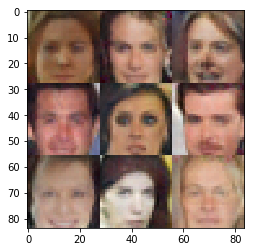

21001.21002.21003.21004.21005.21006.21007.21008.21009.21010.Epoch 4/5... Discriminator Loss: 0.8471... Generator Loss: 0.9513
21011.21012.21013.21014.21015.21016.21017.21018.21019.21020.Epoch 4/5... Discriminator Loss: 1.4506... Generator Loss: 0.3531
21021.21022.21023.21024.21025.21026.21027.21028.21029.21030.Epoch 4/5... Discriminator Loss: 0.8071... Generator Loss: 0.7820
21031.21032.21033.21034.21035.21036.21037.21038.21039.21040.Epoch 4/5... Discriminator Loss: 1.4068... Generator Loss: 0.7302
21041.21042.21043.21044.21045.21046.21047.21048.21049.21050.Epoch 4/5... Discriminator Loss: 1.4268... Generator Loss: 0.5331
21051.21052.21053.21054.21055.21056.21057.21058.21059.21060.Epoch 4/5... Discriminator Loss: 1.2650... Generator Loss: 0.5284
21061.21062.21063.21064.21065.21066.21067.21068.21069.21070.Epoch 4/5... Discriminator Loss: 1.5135... Generator Loss: 0.5643
21071.21072.21073.21074.21075.21076.21077.21078.21079.21080.Epoch 4/5... Discriminator Loss: 1.4534... Generator Loss:

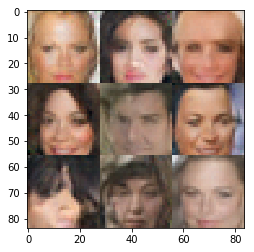

21101.21102.21103.21104.21105.21106.21107.21108.21109.21110.Epoch 4/5... Discriminator Loss: 1.1492... Generator Loss: 0.5944
21111.21112.21113.21114.21115.21116.21117.21118.21119.21120.Epoch 4/5... Discriminator Loss: 1.2250... Generator Loss: 0.7120
21121.21122.21123.21124.21125.21126.21127.21128.21129.21130.Epoch 4/5... Discriminator Loss: 1.2771... Generator Loss: 0.8088
21131.21132.21133.21134.21135.21136.21137.21138.21139.21140.Epoch 4/5... Discriminator Loss: 1.8610... Generator Loss: 0.2650
21141.21142.21143.21144.21145.21146.21147.21148.21149.21150.Epoch 4/5... Discriminator Loss: 1.1119... Generator Loss: 0.7723
21151.21152.21153.21154.21155.21156.21157.21158.21159.21160.Epoch 4/5... Discriminator Loss: 1.4617... Generator Loss: 0.3960
21161.21162.21163.21164.21165.21166.21167.21168.21169.21170.Epoch 4/5... Discriminator Loss: 1.3184... Generator Loss: 0.5886
21171.21172.21173.21174.21175.21176.21177.21178.21179.21180.Epoch 4/5... Discriminator Loss: 1.2088... Generator Loss:

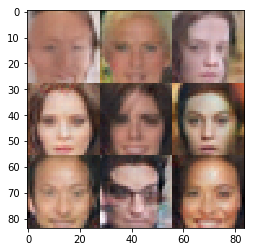

21201.21202.21203.21204.21205.21206.21207.21208.21209.21210.Epoch 4/5... Discriminator Loss: 1.2092... Generator Loss: 0.7420
21211.21212.21213.21214.21215.21216.21217.21218.21219.21220.Epoch 4/5... Discriminator Loss: 1.3996... Generator Loss: 0.5512
21221.21222.21223.21224.21225.21226.21227.21228.21229.21230.Epoch 4/5... Discriminator Loss: 1.4725... Generator Loss: 0.5467
21231.21232.21233.21234.21235.21236.21237.21238.21239.21240.Epoch 4/5... Discriminator Loss: 1.2525... Generator Loss: 0.5902
21241.21242.21243.21244.21245.21246.21247.21248.21249.21250.Epoch 4/5... Discriminator Loss: 1.3670... Generator Loss: 0.6339
21251.21252.21253.21254.21255.21256.21257.21258.21259.21260.Epoch 4/5... Discriminator Loss: 1.2263... Generator Loss: 0.7363
21261.21262.21263.21264.21265.21266.21267.21268.21269.21270.Epoch 4/5... Discriminator Loss: 1.1113... Generator Loss: 0.7309
21271.21272.21273.21274.21275.21276.21277.21278.21279.21280.Epoch 4/5... Discriminator Loss: 1.0979... Generator Loss:

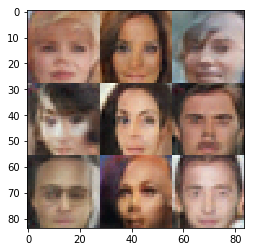

21301.21302.21303.21304.21305.21306.21307.21308.21309.21310.Epoch 4/5... Discriminator Loss: 1.0467... Generator Loss: 0.8705
21311.21312.21313.21314.21315.21316.21317.21318.21319.21320.Epoch 4/5... Discriminator Loss: 1.4478... Generator Loss: 0.5220
21321.21322.21323.21324.21325.21326.21327.21328.21329.21330.Epoch 4/5... Discriminator Loss: 1.2812... Generator Loss: 0.7272
21331.21332.21333.21334.21335.21336.21337.21338.21339.21340.Epoch 4/5... Discriminator Loss: 1.3112... Generator Loss: 0.6724
21341.21342.21343.21344.21345.21346.21347.21348.21349.21350.Epoch 4/5... Discriminator Loss: 1.2069... Generator Loss: 0.7111
21351.21352.21353.21354.21355.21356.21357.21358.21359.21360.Epoch 4/5... Discriminator Loss: 1.4251... Generator Loss: 0.4673
21361.21362.21363.21364.21365.21366.21367.21368.21369.21370.Epoch 4/5... Discriminator Loss: 1.3811... Generator Loss: 0.4592
21371.21372.21373.21374.21375.21376.21377.21378.21379.21380.Epoch 4/5... Discriminator Loss: 1.4368... Generator Loss:

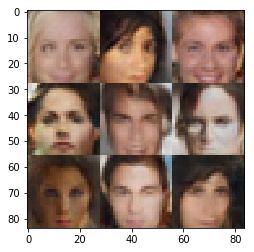

21401.21402.21403.21404.21405.21406.21407.21408.21409.21410.Epoch 4/5... Discriminator Loss: 1.5335... Generator Loss: 0.4157
21411.21412.21413.21414.21415.21416.21417.21418.21419.21420.Epoch 4/5... Discriminator Loss: 1.2867... Generator Loss: 0.8784
21421.21422.21423.21424.21425.21426.21427.21428.21429.21430.Epoch 4/5... Discriminator Loss: 1.1381... Generator Loss: 0.5967
21431.21432.21433.21434.21435.21436.21437.21438.21439.21440.Epoch 4/5... Discriminator Loss: 1.6425... Generator Loss: 0.5976
21441.21442.21443.21444.21445.21446.21447.21448.21449.21450.Epoch 4/5... Discriminator Loss: 1.2257... Generator Loss: 0.6296
21451.21452.21453.21454.21455.21456.21457.21458.21459.21460.Epoch 4/5... Discriminator Loss: 1.2300... Generator Loss: 0.6294
21461.21462.21463.21464.21465.21466.21467.21468.21469.21470.Epoch 4/5... Discriminator Loss: 1.2168... Generator Loss: 0.5928
21471.21472.21473.21474.21475.21476.21477.21478.21479.21480.Epoch 4/5... Discriminator Loss: 1.1965... Generator Loss:

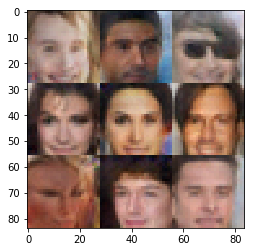

21501.21502.21503.21504.21505.21506.21507.21508.21509.21510.Epoch 4/5... Discriminator Loss: 1.4599... Generator Loss: 0.5349
21511.21512.21513.21514.21515.21516.21517.21518.21519.21520.Epoch 4/5... Discriminator Loss: 1.3813... Generator Loss: 0.6079
21521.21522.21523.21524.21525.21526.21527.21528.21529.21530.Epoch 4/5... Discriminator Loss: 0.9860... Generator Loss: 0.7306
21531.21532.21533.21534.21535.21536.21537.21538.21539.21540.Epoch 4/5... Discriminator Loss: 1.3592... Generator Loss: 0.5352
21541.21542.21543.21544.21545.21546.21547.21548.21549.21550.Epoch 4/5... Discriminator Loss: 1.5051... Generator Loss: 0.5376
21551.21552.21553.21554.21555.21556.21557.21558.21559.21560.Epoch 4/5... Discriminator Loss: 1.2216... Generator Loss: 0.7413
21561.21562.21563.21564.21565.21566.21567.21568.21569.21570.Epoch 4/5... Discriminator Loss: 1.4735... Generator Loss: 0.5664
21571.21572.21573.21574.21575.21576.21577.21578.21579.21580.Epoch 4/5... Discriminator Loss: 1.2867... Generator Loss:

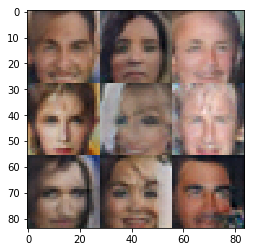

21601.21602.21603.21604.21605.21606.21607.21608.21609.21610.Epoch 4/5... Discriminator Loss: 1.1143... Generator Loss: 0.8677
21611.21612.21613.21614.21615.21616.21617.21618.21619.21620.Epoch 4/5... Discriminator Loss: 1.5046... Generator Loss: 0.4468
21621.21622.21623.21624.21625.21626.21627.21628.21629.21630.Epoch 4/5... Discriminator Loss: 1.1855... Generator Loss: 0.7787
21631.21632.21633.21634.21635.21636.21637.21638.21639.21640.Epoch 4/5... Discriminator Loss: 1.4449... Generator Loss: 0.4447
21641.21642.21643.21644.21645.21646.21647.21648.21649.21650.Epoch 4/5... Discriminator Loss: 1.1652... Generator Loss: 0.9060
21651.21652.21653.21654.21655.21656.21657.21658.21659.21660.Epoch 4/5... Discriminator Loss: 0.9747... Generator Loss: 0.9959
21661.21662.21663.21664.21665.21666.21667.21668.21669.21670.Epoch 4/5... Discriminator Loss: 1.4594... Generator Loss: 0.4531
21671.21672.21673.21674.21675.21676.21677.21678.21679.21680.Epoch 4/5... Discriminator Loss: 1.4245... Generator Loss:

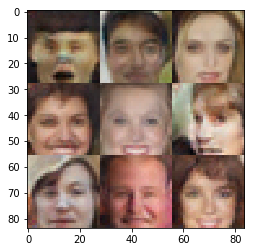

21701.21702.21703.21704.21705.21706.21707.21708.21709.21710.Epoch 4/5... Discriminator Loss: 1.3311... Generator Loss: 0.5814
21711.21712.21713.21714.21715.21716.21717.21718.21719.21720.Epoch 4/5... Discriminator Loss: 1.4193... Generator Loss: 0.7336
21721.21722.21723.21724.21725.21726.21727.21728.21729.21730.Epoch 4/5... Discriminator Loss: 1.6751... Generator Loss: 0.4443
21731.21732.21733.21734.21735.21736.21737.21738.21739.21740.Epoch 4/5... Discriminator Loss: 1.5487... Generator Loss: 0.5291
21741.21742.21743.21744.21745.21746.21747.21748.21749.21750.Epoch 4/5... Discriminator Loss: 1.3118... Generator Loss: 0.5286
21751.21752.21753.21754.21755.21756.21757.21758.21759.21760.Epoch 4/5... Discriminator Loss: 1.3397... Generator Loss: 0.5585
21761.21762.21763.21764.21765.21766.21767.21768.21769.21770.Epoch 4/5... Discriminator Loss: 1.5607... Generator Loss: 0.6240
21771.21772.21773.21774.21775.21776.21777.21778.21779.21780.Epoch 4/5... Discriminator Loss: 1.2771... Generator Loss:

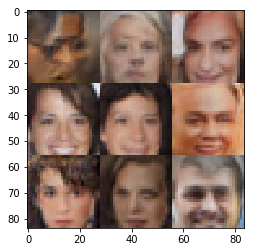

21801.21802.21803.21804.21805.21806.21807.21808.21809.21810.Epoch 4/5... Discriminator Loss: 1.1498... Generator Loss: 0.6665
21811.21812.21813.21814.21815.21816.21817.21818.21819.21820.Epoch 4/5... Discriminator Loss: 1.4270... Generator Loss: 0.5951
21821.21822.21823.21824.21825.21826.21827.21828.21829.21830.Epoch 4/5... Discriminator Loss: 1.2257... Generator Loss: 0.6916
21831.21832.21833.21834.21835.21836.21837.21838.21839.21840.Epoch 4/5... Discriminator Loss: 1.1971... Generator Loss: 0.7817
21841.21842.21843.21844.21845.21846.21847.21848.21849.21850.Epoch 4/5... Discriminator Loss: 1.2610... Generator Loss: 0.7559
21851.21852.21853.21854.21855.21856.21857.21858.21859.21860.Epoch 4/5... Discriminator Loss: 1.4722... Generator Loss: 0.4547
21861.21862.21863.21864.21865.21866.21867.21868.21869.21870.Epoch 4/5... Discriminator Loss: 1.4012... Generator Loss: 0.4804
21871.21872.21873.21874.21875.21876.21877.21878.21879.21880.Epoch 4/5... Discriminator Loss: 1.3018... Generator Loss:

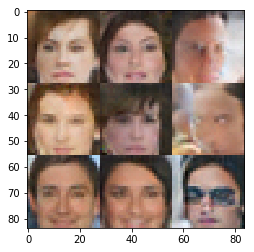

21901.21902.21903.21904.21905.21906.21907.21908.21909.21910.Epoch 4/5... Discriminator Loss: 1.3280... Generator Loss: 0.5454
21911.21912.21913.21914.21915.21916.21917.21918.21919.21920.Epoch 4/5... Discriminator Loss: 1.2200... Generator Loss: 0.6652
21921.21922.21923.21924.21925.21926.21927.21928.21929.21930.Epoch 4/5... Discriminator Loss: 1.2792... Generator Loss: 0.6554
21931.21932.21933.21934.21935.21936.21937.21938.21939.21940.Epoch 4/5... Discriminator Loss: 1.1470... Generator Loss: 0.8197
21941.21942.21943.21944.21945.21946.21947.21948.21949.21950.Epoch 4/5... Discriminator Loss: 1.5564... Generator Loss: 0.3513
21951.21952.21953.21954.21955.21956.21957.21958.21959.21960.Epoch 4/5... Discriminator Loss: 1.2244... Generator Loss: 0.7733
21961.21962.21963.21964.21965.21966.21967.21968.21969.21970.Epoch 4/5... Discriminator Loss: 1.4084... Generator Loss: 0.4783
21971.21972.21973.21974.21975.21976.21977.21978.21979.21980.Epoch 4/5... Discriminator Loss: 1.2254... Generator Loss:

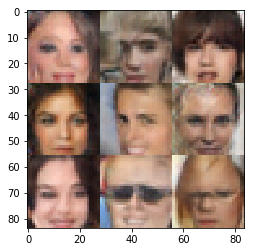

22001.22002.22003.22004.22005.22006.22007.22008.22009.22010.Epoch 4/5... Discriminator Loss: 1.0117... Generator Loss: 0.9235
22011.22012.22013.22014.22015.22016.22017.22018.22019.22020.Epoch 4/5... Discriminator Loss: 1.3811... Generator Loss: 0.6402
22021.22022.22023.22024.22025.22026.22027.22028.22029.22030.Epoch 4/5... Discriminator Loss: 1.2337... Generator Loss: 0.6703
22031.22032.22033.22034.22035.22036.22037.22038.22039.22040.Epoch 4/5... Discriminator Loss: 1.3969... Generator Loss: 0.5815
22041.22042.22043.22044.22045.22046.22047.22048.22049.22050.Epoch 4/5... Discriminator Loss: 1.1734... Generator Loss: 0.7389
22051.22052.22053.22054.22055.22056.22057.22058.22059.22060.Epoch 4/5... Discriminator Loss: 1.1523... Generator Loss: 0.6829
22061.22062.22063.22064.22065.22066.22067.22068.22069.22070.Epoch 4/5... Discriminator Loss: 1.2665... Generator Loss: 0.6314
22071.22072.22073.22074.22075.22076.22077.22078.22079.22080.Epoch 4/5... Discriminator Loss: 1.2470... Generator Loss:

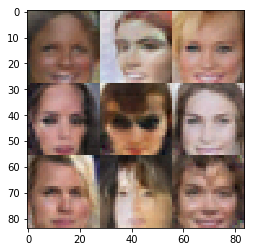

22101.22102.22103.22104.22105.22106.22107.22108.22109.22110.Epoch 4/5... Discriminator Loss: 1.3837... Generator Loss: 0.4869
22111.22112.22113.22114.22115.22116.22117.22118.22119.22120.Epoch 4/5... Discriminator Loss: 1.4779... Generator Loss: 0.4267
22121.22122.22123.22124.22125.22126.22127.22128.22129.22130.Epoch 4/5... Discriminator Loss: 1.3955... Generator Loss: 0.5824
22131.22132.22133.22134.22135.22136.22137.22138.22139.22140.Epoch 4/5... Discriminator Loss: 1.4553... Generator Loss: 0.5660
22141.22142.22143.22144.22145.22146.22147.22148.22149.22150.Epoch 4/5... Discriminator Loss: 1.1595... Generator Loss: 0.9373
22151.22152.22153.22154.22155.22156.22157.22158.22159.22160.Epoch 4/5... Discriminator Loss: 1.3731... Generator Loss: 0.5822
22161.22162.22163.22164.22165.22166.22167.22168.22169.22170.Epoch 4/5... Discriminator Loss: 1.2635... Generator Loss: 0.5989
22171.22172.22173.22174.22175.22176.22177.22178.22179.22180.Epoch 4/5... Discriminator Loss: 1.4911... Generator Loss:

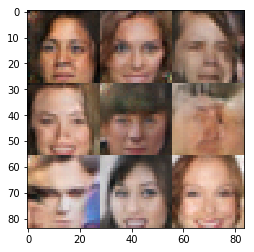

22201.22202.22203.22204.22205.22206.22207.22208.22209.22210.Epoch 4/5... Discriminator Loss: 1.2040... Generator Loss: 0.6517
22211.22212.22213.22214.22215.22216.22217.22218.22219.22220.Epoch 4/5... Discriminator Loss: 1.3342... Generator Loss: 0.5035
22221.22222.22223.22224.22225.22226.22227.22228.22229.22230.Epoch 4/5... Discriminator Loss: 1.2663... Generator Loss: 0.6630
22231.22232.22233.22234.22235.22236.22237.22238.22239.22240.Epoch 4/5... Discriminator Loss: 1.2968... Generator Loss: 0.5785
22241.22242.22243.22244.22245.22246.22247.22248.22249.22250.Epoch 4/5... Discriminator Loss: 1.4555... Generator Loss: 0.5609
22251.22252.22253.22254.22255.22256.22257.22258.22259.22260.Epoch 4/5... Discriminator Loss: 1.4089... Generator Loss: 0.5526
22261.22262.22263.22264.22265.22266.22267.22268.22269.22270.Epoch 4/5... Discriminator Loss: 1.0507... Generator Loss: 0.7940
22271.22272.22273.22274.22275.22276.22277.22278.22279.22280.Epoch 4/5... Discriminator Loss: 1.4233... Generator Loss:

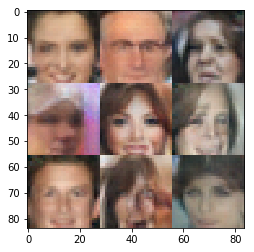

22301.22302.22303.22304.22305.22306.22307.22308.22309.22310.Epoch 4/5... Discriminator Loss: 1.0441... Generator Loss: 0.9938
22311.22312.22313.22314.22315.22316.22317.22318.22319.22320.Epoch 4/5... Discriminator Loss: 1.4390... Generator Loss: 0.5063
22321.22322.22323.22324.22325.22326.22327.22328.22329.22330.Epoch 4/5... Discriminator Loss: 1.3050... Generator Loss: 0.5329
22331.22332.22333.22334.22335.22336.22337.22338.22339.22340.Epoch 4/5... Discriminator Loss: 1.4015... Generator Loss: 0.5677
22341.22342.22343.22344.22345.22346.22347.22348.22349.22350.Epoch 4/5... Discriminator Loss: 1.5590... Generator Loss: 0.4575
22351.22352.22353.22354.22355.22356.22357.22358.22359.22360.Epoch 4/5... Discriminator Loss: 1.4537... Generator Loss: 0.5098
22361.22362.22363.22364.22365.22366.22367.22368.22369.22370.Epoch 4/5... Discriminator Loss: 1.3188... Generator Loss: 0.6007
22371.22372.22373.22374.22375.22376.22377.22378.22379.22380.Epoch 4/5... Discriminator Loss: 1.2330... Generator Loss:

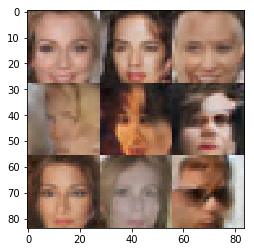

22401.22402.22403.22404.22405.22406.22407.22408.22409.22410.Epoch 4/5... Discriminator Loss: 1.1691... Generator Loss: 0.8343
22411.22412.22413.22414.22415.22416.22417.22418.22419.22420.Epoch 4/5... Discriminator Loss: 1.4638... Generator Loss: 0.4395
22421.22422.22423.22424.22425.22426.22427.22428.22429.22430.Epoch 4/5... Discriminator Loss: 1.2963... Generator Loss: 0.5086
22431.22432.22433.22434.22435.22436.22437.22438.22439.22440.Epoch 4/5... Discriminator Loss: 1.2026... Generator Loss: 0.6286
22441.22442.22443.22444.22445.22446.22447.22448.22449.22450.Epoch 4/5... Discriminator Loss: 1.2417... Generator Loss: 0.6977
22451.22452.22453.22454.22455.22456.22457.22458.22459.22460.Epoch 4/5... Discriminator Loss: 1.5040... Generator Loss: 0.6343
22461.22462.22463.22464.22465.22466.22467.22468.22469.22470.Epoch 4/5... Discriminator Loss: 1.2387... Generator Loss: 0.7071
22471.22472.22473.22474.22475.22476.22477.22478.22479.22480.Epoch 4/5... Discriminator Loss: 1.0716... Generator Loss:

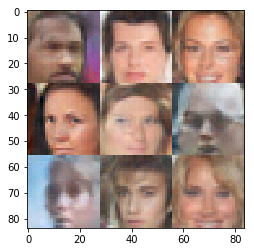

22501.22502.22503.22504.22505.22506.22507.22508.22509.22510.Epoch 4/5... Discriminator Loss: 0.9052... Generator Loss: 1.1858
22511.22512.22513.22514.22515.22516.22517.22518.22519.22520.Epoch 4/5... Discriminator Loss: 1.1146... Generator Loss: 0.8661
22521.22522.22523.22524.22525.22526.22527.22528.22529.22530.Epoch 4/5... Discriminator Loss: 1.2200... Generator Loss: 0.7663
22531.22532.22533.22534.22535.22536.22537.22538.22539.22540.Epoch 4/5... Discriminator Loss: 1.2171... Generator Loss: 0.6376
22541.22542.22543.22544.22545.22546.22547.22548.22549.22550.Epoch 4/5... Discriminator Loss: 1.2279... Generator Loss: 0.6660
22551.22552.22553.22554.22555.22556.22557.22558.22559.22560.Epoch 4/5... Discriminator Loss: 1.1464... Generator Loss: 0.6554
22561.22562.22563.22564.22565.22566.22567.22568.22569.22570.Epoch 4/5... Discriminator Loss: 1.2243... Generator Loss: 0.6516
22571.22572.22573.22574.22575.22576.22577.22578.22579.22580.Epoch 4/5... Discriminator Loss: 1.2641... Generator Loss:

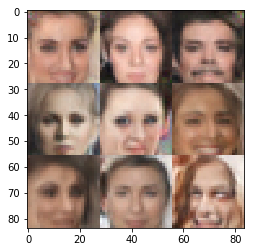

22601.22602.22603.22604.22605.22606.22607.22608.22609.22610.Epoch 4/5... Discriminator Loss: 1.3806... Generator Loss: 0.6485
22611.22612.22613.22614.22615.22616.22617.22618.22619.22620.Epoch 4/5... Discriminator Loss: 1.2638... Generator Loss: 0.7218
22621.22622.22623.22624.22625.22626.22627.22628.22629.22630.Epoch 4/5... Discriminator Loss: 2.2093... Generator Loss: 0.2952
22631.22632.22633.22634.22635.22636.22637.22638.22639.22640.Epoch 4/5... Discriminator Loss: 1.2660... Generator Loss: 0.5632
22641.22642.22643.22644.22645.22646.22647.22648.22649.22650.Epoch 4/5... Discriminator Loss: 1.3713... Generator Loss: 0.5156
22651.22652.22653.22654.22655.22656.22657.22658.22659.22660.Epoch 4/5... Discriminator Loss: 0.9947... Generator Loss: 0.9595
22661.22662.22663.22664.22665.22666.22667.22668.22669.22670.Epoch 4/5... Discriminator Loss: 1.5506... Generator Loss: 0.5075
22671.22672.22673.22674.22675.22676.22677.22678.22679.22680.Epoch 4/5... Discriminator Loss: 1.2873... Generator Loss:

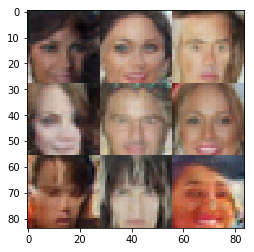

22701.22702.22703.22704.22705.22706.22707.22708.22709.22710.Epoch 4/5... Discriminator Loss: 1.2737... Generator Loss: 0.7137
22711.22712.22713.22714.22715.22716.22717.22718.22719.22720.Epoch 4/5... Discriminator Loss: 1.4472... Generator Loss: 0.5209
22721.22722.22723.22724.22725.22726.22727.22728.22729.22730.Epoch 4/5... Discriminator Loss: 1.2375... Generator Loss: 0.6305
22731.22732.22733.22734.22735.22736.22737.22738.22739.22740.Epoch 4/5... Discriminator Loss: 1.3123... Generator Loss: 0.5881
22741.22742.22743.22744.22745.22746.22747.22748.22749.22750.Epoch 4/5... Discriminator Loss: 1.0957... Generator Loss: 0.7034
22751.22752.22753.22754.22755.22756.22757.22758.22759.22760.Epoch 4/5... Discriminator Loss: 1.4994... Generator Loss: 0.6549
22761.22762.22763.22764.22765.22766.22767.22768.22769.22770.Epoch 4/5... Discriminator Loss: 1.1751... Generator Loss: 0.6622
22771.22772.22773.22774.22775.22776.22777.22778.22779.22780.Epoch 4/5... Discriminator Loss: 1.2542... Generator Loss:

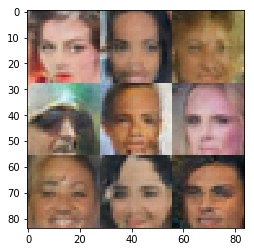

22801.22802.22803.22804.22805.22806.22807.22808.22809.22810.Epoch 4/5... Discriminator Loss: 1.4001... Generator Loss: 0.5608
22811.22812.22813.22814.22815.22816.22817.22818.22819.22820.Epoch 4/5... Discriminator Loss: 1.4197... Generator Loss: 0.4629
22821.22822.22823.22824.22825.22826.22827.22828.22829.22830.Epoch 4/5... Discriminator Loss: 1.3217... Generator Loss: 0.5967
22831.22832.22833.22834.22835.22836.22837.22838.22839.22840.Epoch 4/5... Discriminator Loss: 1.2968... Generator Loss: 0.6013
22841.22842.22843.22844.22845.22846.22847.22848.22849.22850.Epoch 4/5... Discriminator Loss: 1.4653... Generator Loss: 0.4136
22851.22852.22853.22854.22855.22856.22857.22858.22859.22860.Epoch 4/5... Discriminator Loss: 1.3992... Generator Loss: 0.4839
22861.22862.22863.22864.22865.22866.22867.22868.22869.22870.Epoch 4/5... Discriminator Loss: 1.4125... Generator Loss: 0.4934
22871.22872.22873.22874.22875.22876.22877.22878.22879.22880.Epoch 4/5... Discriminator Loss: 1.3010... Generator Loss:

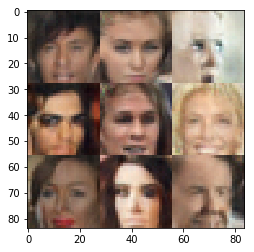

22901.22902.22903.22904.22905.22906.22907.22908.22909.22910.Epoch 4/5... Discriminator Loss: 1.1774... Generator Loss: 0.6852
22911.22912.22913.22914.22915.22916.22917.22918.22919.22920.Epoch 4/5... Discriminator Loss: 1.6783... Generator Loss: 0.3916
22921.22922.22923.22924.22925.22926.22927.22928.22929.22930.Epoch 4/5... Discriminator Loss: 1.1974... Generator Loss: 0.5227
22931.22932.22933.22934.22935.22936.22937.22938.22939.22940.Epoch 4/5... Discriminator Loss: 1.3985... Generator Loss: 0.6069
22941.22942.22943.22944.22945.22946.22947.22948.22949.22950.Epoch 4/5... Discriminator Loss: 1.0621... Generator Loss: 0.7834
22951.22952.22953.22954.22955.22956.22957.22958.22959.22960.Epoch 4/5... Discriminator Loss: 1.8554... Generator Loss: 0.3030
22961.22962.22963.22964.22965.22966.22967.22968.22969.22970.Epoch 4/5... Discriminator Loss: 1.0753... Generator Loss: 0.9265
22971.22972.22973.22974.22975.22976.22977.22978.22979.22980.Epoch 4/5... Discriminator Loss: 1.1985... Generator Loss:

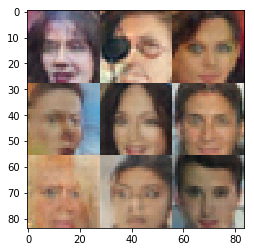

23001.23002.23003.23004.23005.23006.23007.23008.23009.23010.Epoch 4/5... Discriminator Loss: 1.6345... Generator Loss: 0.3841
23011.23012.23013.23014.23015.23016.23017.23018.23019.23020.Epoch 4/5... Discriminator Loss: 1.2658... Generator Loss: 0.7519
23021.23022.23023.23024.23025.23026.23027.23028.23029.23030.Epoch 4/5... Discriminator Loss: 1.5878... Generator Loss: 0.4299
23031.23032.23033.23034.23035.23036.23037.23038.23039.23040.Epoch 4/5... Discriminator Loss: 1.3007... Generator Loss: 0.6720
23041.23042.23043.23044.23045.23046.23047.23048.23049.23050.Epoch 4/5... Discriminator Loss: 1.4214... Generator Loss: 0.6497
23051.23052.23053.23054.23055.23056.23057.23058.23059.23060.Epoch 4/5... Discriminator Loss: 1.5611... Generator Loss: 0.4436
23061.23062.23063.23064.23065.23066.23067.23068.23069.23070.Epoch 4/5... Discriminator Loss: 1.3438... Generator Loss: 0.5271
23071.23072.23073.23074.23075.23076.23077.23078.23079.23080.Epoch 4/5... Discriminator Loss: 1.2863... Generator Loss:

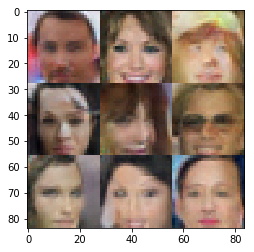

23101.23102.23103.23104.23105.23106.23107.23108.23109.23110.Epoch 4/5... Discriminator Loss: 1.1409... Generator Loss: 0.8277
23111.23112.23113.23114.23115.23116.23117.23118.23119.23120.Epoch 4/5... Discriminator Loss: 1.2785... Generator Loss: 0.6621
23121.23122.23123.23124.23125.23126.23127.23128.23129.23130.Epoch 4/5... Discriminator Loss: 1.2187... Generator Loss: 0.6803
23131.23132.23133.23134.23135.23136.23137.23138.23139.23140.Epoch 4/5... Discriminator Loss: 1.1735... Generator Loss: 0.8390
23141.23142.23143.23144.23145.23146.23147.23148.23149.23150.Epoch 4/5... Discriminator Loss: 1.3331... Generator Loss: 0.5101
23151.23152.23153.23154.23155.23156.23157.23158.23159.23160.Epoch 4/5... Discriminator Loss: 1.3689... Generator Loss: 0.6040
23161.23162.23163.23164.23165.23166.23167.23168.23169.23170.Epoch 4/5... Discriminator Loss: 1.1520... Generator Loss: 0.8602
23171.23172.23173.23174.23175.23176.23177.23178.23179.23180.Epoch 4/5... Discriminator Loss: 1.5154... Generator Loss:

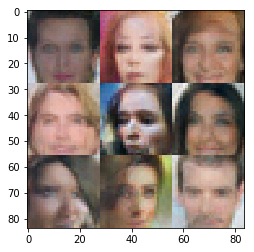

23201.23202.23203.23204.23205.23206.23207.23208.23209.23210.Epoch 4/5... Discriminator Loss: 1.3914... Generator Loss: 0.5647
23211.23212.23213.23214.23215.23216.23217.23218.23219.23220.Epoch 4/5... Discriminator Loss: 1.1869... Generator Loss: 0.7863
23221.23222.23223.23224.23225.23226.23227.23228.23229.23230.Epoch 4/5... Discriminator Loss: 1.2960... Generator Loss: 0.6544
23231.23232.23233.23234.23235.23236.23237.23238.23239.23240.Epoch 4/5... Discriminator Loss: 1.2209... Generator Loss: 0.6751
23241.23242.23243.23244.23245.23246.23247.23248.23249.23250.Epoch 4/5... Discriminator Loss: 1.1999... Generator Loss: 0.7374
23251.23252.23253.23254.23255.23256.23257.23258.23259.23260.Epoch 4/5... Discriminator Loss: 1.3775... Generator Loss: 0.5306
23261.23262.23263.23264.23265.23266.23267.23268.23269.23270.Epoch 4/5... Discriminator Loss: 1.6937... Generator Loss: 0.3568
23271.23272.23273.23274.23275.23276.23277.23278.23279.23280.Epoch 4/5... Discriminator Loss: 1.3597... Generator Loss:

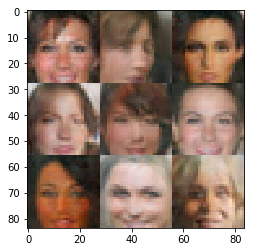

23301.23302.23303.23304.23305.23306.23307.23308.23309.23310.Epoch 4/5... Discriminator Loss: 1.1757... Generator Loss: 0.7191
23311.23312.23313.23314.23315.23316.23317.23318.23319.23320.Epoch 4/5... Discriminator Loss: 1.2550... Generator Loss: 0.8848
23321.23322.23323.23324.23325.23326.23327.23328.23329.23330.Epoch 4/5... Discriminator Loss: 1.2339... Generator Loss: 0.5357
23331.23332.23333.23334.23335.23336.23337.23338.23339.23340.Epoch 4/5... Discriminator Loss: 1.1070... Generator Loss: 1.0712
23341.23342.23343.23344.23345.23346.23347.23348.23349.23350.Epoch 4/5... Discriminator Loss: 1.5712... Generator Loss: 0.4147
23351.23352.23353.23354.23355.23356.23357.23358.23359.23360.Epoch 4/5... Discriminator Loss: 1.4978... Generator Loss: 0.6352
23361.23362.23363.23364.23365.23366.23367.23368.23369.23370.Epoch 4/5... Discriminator Loss: 1.3433... Generator Loss: 0.5618
23371.23372.23373.23374.23375.23376.23377.23378.23379.23380.Epoch 4/5... Discriminator Loss: 1.5546... Generator Loss:

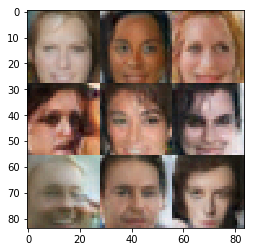

23401.23402.23403.23404.23405.23406.23407.23408.23409.23410.Epoch 4/5... Discriminator Loss: 1.3217... Generator Loss: 0.6010
23411.23412.23413.23414.23415.23416.23417.23418.23419.23420.Epoch 4/5... Discriminator Loss: 1.4747... Generator Loss: 0.4838
23421.23422.23423.23424.23425.23426.23427.23428.23429.23430.Epoch 4/5... Discriminator Loss: 1.2926... Generator Loss: 0.7517
23431.23432.23433.23434.23435.23436.23437.23438.23439.23440.Epoch 4/5... Discriminator Loss: 1.4830... Generator Loss: 0.4751
23441.23442.23443.23444.23445.23446.23447.23448.23449.23450.Epoch 4/5... Discriminator Loss: 1.9261... Generator Loss: 0.4330
23451.23452.23453.23454.23455.23456.23457.23458.23459.23460.Epoch 4/5... Discriminator Loss: 1.2693... Generator Loss: 0.6005
23461.23462.23463.23464.23465.23466.23467.23468.23469.23470.Epoch 4/5... Discriminator Loss: 1.3466... Generator Loss: 0.6329
23471.23472.23473.23474.23475.23476.23477.23478.23479.23480.Epoch 4/5... Discriminator Loss: 1.3217... Generator Loss:

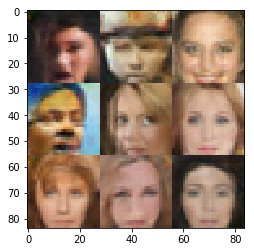

23501.23502.23503.23504.23505.23506.23507.23508.23509.23510.Epoch 4/5... Discriminator Loss: 1.3171... Generator Loss: 0.6310
23511.23512.23513.23514.23515.23516.23517.23518.23519.23520.Epoch 4/5... Discriminator Loss: 1.2478... Generator Loss: 0.6272
23521.23522.23523.23524.23525.23526.23527.23528.23529.23530.Epoch 4/5... Discriminator Loss: 1.4518... Generator Loss: 0.5402
23531.23532.23533.23534.23535.23536.23537.23538.23539.23540.Epoch 4/5... Discriminator Loss: 1.2600... Generator Loss: 0.6909
23541.23542.23543.23544.23545.23546.23547.23548.23549.23550.Epoch 4/5... Discriminator Loss: 1.2793... Generator Loss: 0.6070
23551.23552.23553.23554.23555.23556.23557.23558.23559.23560.Epoch 4/5... Discriminator Loss: 1.3865... Generator Loss: 0.6798
23561.23562.23563.23564.23565.23566.23567.23568.23569.23570.Epoch 4/5... Discriminator Loss: 1.2808... Generator Loss: 0.6084
23571.23572.23573.23574.23575.23576.23577.23578.23579.23580.Epoch 4/5... Discriminator Loss: 1.5458... Generator Loss:

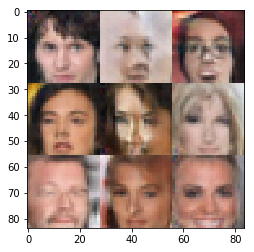

23601.23602.23603.23604.23605.23606.23607.23608.23609.23610.Epoch 4/5... Discriminator Loss: 1.8508... Generator Loss: 0.3598
23611.23612.23613.23614.23615.23616.23617.23618.23619.23620.Epoch 4/5... Discriminator Loss: 1.3219... Generator Loss: 0.7470
23621.23622.23623.23624.23625.23626.23627.23628.23629.23630.Epoch 4/5... Discriminator Loss: 1.2495... Generator Loss: 0.6844
23631.23632.23633.23634.23635.23636.23637.23638.23639.23640.Epoch 4/5... Discriminator Loss: 1.1292... Generator Loss: 0.6776
23641.23642.23643.23644.23645.23646.23647.23648.23649.23650.Epoch 4/5... Discriminator Loss: 1.2630... Generator Loss: 0.6680
23651.23652.23653.23654.23655.23656.23657.23658.23659.23660.Epoch 4/5... Discriminator Loss: 1.5099... Generator Loss: 0.4447
23661.23662.23663.23664.23665.23666.23667.23668.23669.23670.Epoch 4/5... Discriminator Loss: 1.2794... Generator Loss: 0.7468
23671.23672.23673.23674.23675.23676.23677.23678.23679.23680.Epoch 4/5... Discriminator Loss: 1.1834... Generator Loss:

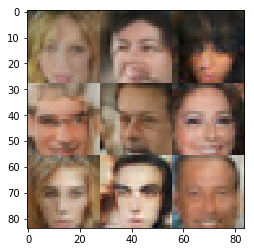

23701.23702.23703.23704.23705.23706.23707.23708.23709.23710.Epoch 4/5... Discriminator Loss: 1.3424... Generator Loss: 0.5651
23711.23712.23713.23714.23715.23716.23717.23718.23719.23720.Epoch 4/5... Discriminator Loss: 1.4977... Generator Loss: 0.5351
23721.23722.23723.23724.23725.23726.23727.23728.23729.23730.Epoch 4/5... Discriminator Loss: 0.9775... Generator Loss: 0.9609
23731.23732.23733.23734.23735.23736.23737.23738.23739.23740.Epoch 4/5... Discriminator Loss: 1.4986... Generator Loss: 0.5928
23741.23742.23743.23744.23745.23746.23747.23748.23749.23750.Epoch 4/5... Discriminator Loss: 1.2716... Generator Loss: 0.6583
23751.23752.23753.23754.23755.23756.23757.23758.23759.23760.Epoch 4/5... Discriminator Loss: 1.2944... Generator Loss: 0.7349
23761.23762.23763.23764.23765.23766.23767.23768.23769.23770.Epoch 4/5... Discriminator Loss: 1.2293... Generator Loss: 0.6824
23771.23772.23773.23774.23775.23776.23777.23778.23779.23780.Epoch 4/5... Discriminator Loss: 1.1298... Generator Loss:

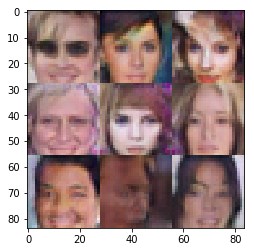

23801.23802.23803.23804.23805.23806.23807.23808.23809.23810.Epoch 4/5... Discriminator Loss: 0.7699... Generator Loss: 0.9373
23811.23812.23813.23814.23815.23816.23817.23818.23819.23820.Epoch 4/5... Discriminator Loss: 1.7768... Generator Loss: 0.5452
23821.23822.23823.23824.23825.23826.23827.23828.23829.23830.Epoch 4/5... Discriminator Loss: 1.3307... Generator Loss: 0.7527
23831.23832.23833.23834.23835.23836.23837.23838.23839.23840.Epoch 4/5... Discriminator Loss: 1.4232... Generator Loss: 0.4728
23841.23842.23843.23844.23845.23846.23847.23848.23849.23850.Epoch 4/5... Discriminator Loss: 1.0028... Generator Loss: 0.8766
23851.23852.23853.23854.23855.23856.23857.23858.23859.23860.Epoch 4/5... Discriminator Loss: 1.0142... Generator Loss: 0.8127
23861.23862.23863.23864.23865.23866.23867.23868.23869.23870.Epoch 4/5... Discriminator Loss: 1.3392... Generator Loss: 0.5612
23871.23872.23873.23874.23875.23876.23877.23878.23879.23880.Epoch 4/5... Discriminator Loss: 1.3434... Generator Loss:

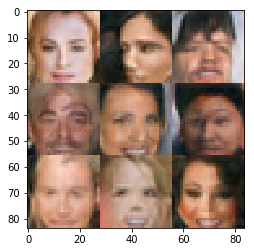

23901.23902.23903.23904.23905.23906.23907.23908.23909.23910.Epoch 4/5... Discriminator Loss: 1.0986... Generator Loss: 0.8247
23911.23912.23913.23914.23915.23916.23917.23918.23919.23920.Epoch 4/5... Discriminator Loss: 1.2141... Generator Loss: 0.7984
23921.23922.23923.23924.23925.23926.23927.23928.23929.23930.Epoch 4/5... Discriminator Loss: 1.5082... Generator Loss: 0.4227
23931.23932.23933.23934.23935.23936.23937.23938.23939.23940.Epoch 4/5... Discriminator Loss: 1.3118... Generator Loss: 0.6605
23941.23942.23943.23944.23945.23946.23947.23948.23949.23950.Epoch 4/5... Discriminator Loss: 1.2839... Generator Loss: 0.6706
23951.23952.23953.23954.23955.23956.23957.23958.23959.23960.Epoch 4/5... Discriminator Loss: 1.3207... Generator Loss: 0.5851
23961.23962.23963.23964.23965.23966.23967.23968.23969.23970.Epoch 4/5... Discriminator Loss: 1.3144... Generator Loss: 0.5359
23971.23972.23973.23974.23975.23976.23977.23978.23979.23980.Epoch 4/5... Discriminator Loss: 1.1198... Generator Loss:

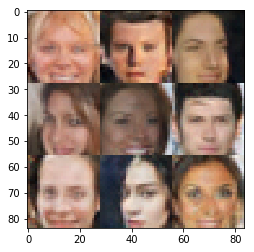

24001.24002.24003.24004.24005.24006.24007.24008.24009.24010.Epoch 4/5... Discriminator Loss: 1.1151... Generator Loss: 0.6843
24011.24012.24013.24014.24015.24016.24017.24018.24019.24020.Epoch 4/5... Discriminator Loss: 1.0009... Generator Loss: 1.0498
24021.24022.24023.24024.24025.24026.24027.24028.24029.24030.Epoch 4/5... Discriminator Loss: 1.1899... Generator Loss: 0.6561
24031.24032.24033.24034.24035.24036.24037.24038.24039.24040.Epoch 4/5... Discriminator Loss: 1.2875... Generator Loss: 0.6568
24041.24042.24043.24044.24045.24046.24047.24048.24049.24050.Epoch 4/5... Discriminator Loss: 1.2565... Generator Loss: 0.5739
24051.24052.24053.24054.24055.24056.24057.24058.24059.24060.Epoch 4/5... Discriminator Loss: 1.3353... Generator Loss: 0.4824
24061.24062.24063.24064.24065.24066.24067.24068.24069.24070.Epoch 4/5... Discriminator Loss: 1.4432... Generator Loss: 0.6932
24071.24072.24073.24074.24075.24076.24077.24078.24079.24080.Epoch 4/5... Discriminator Loss: 1.3184... Generator Loss:

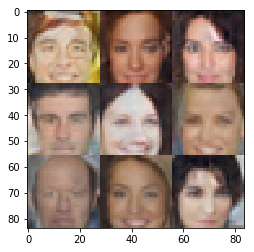

24101.24102.24103.24104.24105.24106.24107.24108.24109.24110.Epoch 4/5... Discriminator Loss: 1.2548... Generator Loss: 0.6069
24111.24112.24113.24114.24115.24116.24117.24118.24119.24120.Epoch 4/5... Discriminator Loss: 1.4326... Generator Loss: 0.5112
24121.24122.24123.24124.24125.24126.24127.24128.24129.24130.Epoch 4/5... Discriminator Loss: 1.0657... Generator Loss: 0.6716
24131.24132.24133.24134.24135.24136.24137.24138.24139.24140.Epoch 4/5... Discriminator Loss: 1.6382... Generator Loss: 0.3265
24141.24142.24143.24144.24145.24146.24147.24148.24149.24150.Epoch 4/5... Discriminator Loss: 1.2318... Generator Loss: 0.6685
24151.24152.24153.24154.24155.24156.24157.24158.24159.24160.Epoch 4/5... Discriminator Loss: 1.4736... Generator Loss: 0.5201
24161.24162.24163.24164.24165.24166.24167.24168.24169.24170.Epoch 4/5... Discriminator Loss: 1.5751... Generator Loss: 0.4538
24171.24172.24173.24174.24175.24176.24177.24178.24179.24180.Epoch 4/5... Discriminator Loss: 1.3688... Generator Loss:

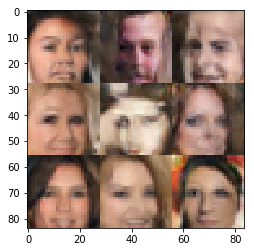

24201.24202.24203.24204.24205.24206.24207.24208.24209.24210.Epoch 4/5... Discriminator Loss: 1.3830... Generator Loss: 0.4505
24211.24212.24213.24214.24215.24216.24217.24218.24219.24220.Epoch 4/5... Discriminator Loss: 1.3538... Generator Loss: 0.8055
24221.24222.24223.24224.24225.24226.24227.24228.24229.24230.Epoch 4/5... Discriminator Loss: 1.5072... Generator Loss: 0.4391
24231.24232.24233.24234.24235.24236.24237.24238.24239.24240.Epoch 4/5... Discriminator Loss: 1.2104... Generator Loss: 0.5607
24241.24242.24243.24244.24245.24246.24247.24248.24249.24250.Epoch 4/5... Discriminator Loss: 1.5135... Generator Loss: 0.4349
24251.24252.24253.24254.24255.24256.24257.24258.24259.24260.Epoch 4/5... Discriminator Loss: 1.4475... Generator Loss: 0.5352
24261.24262.24263.24264.24265.24266.24267.24268.24269.24270.Epoch 4/5... Discriminator Loss: 1.2106... Generator Loss: 0.6296
24271.24272.24273.24274.24275.24276.24277.24278.24279.24280.Epoch 4/5... Discriminator Loss: 1.2876... Generator Loss:

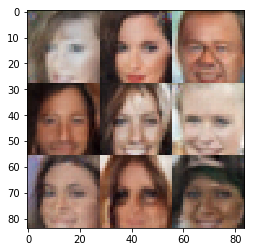

24301.24302.24303.24304.24305.24306.24307.24308.24309.24310.Epoch 4/5... Discriminator Loss: 1.5612... Generator Loss: 0.4443
24311.24312.24313.24314.24315.24316.24317.24318.24319.24320.Epoch 4/5... Discriminator Loss: 0.9887... Generator Loss: 0.7146
24321.24322.24323.24324.24325.24326.24327.24328.24329.24330.Epoch 4/5... Discriminator Loss: 1.1729... Generator Loss: 0.6403
24331.24332.24333.24334.24335.24336.24337.24338.24339.24340.Epoch 4/5... Discriminator Loss: 1.3475... Generator Loss: 0.7712
24341.24342.24343.24344.24345.24346.24347.24348.24349.24350.Epoch 4/5... Discriminator Loss: 1.4093... Generator Loss: 0.4987
24351.24352.24353.24354.24355.24356.24357.24358.24359.24360.Epoch 4/5... Discriminator Loss: 1.4032... Generator Loss: 0.5382
24361.24362.24363.24364.24365.24366.24367.24368.24369.24370.Epoch 4/5... Discriminator Loss: 1.8601... Generator Loss: 0.3372
24371.24372.24373.24374.24375.24376.24377.24378.24379.24380.Epoch 4/5... Discriminator Loss: 1.3340... Generator Loss:

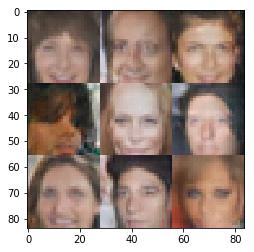

24401.24402.24403.24404.24405.24406.24407.24408.24409.24410.Epoch 4/5... Discriminator Loss: 1.2717... Generator Loss: 0.7033
24411.24412.24413.24414.24415.24416.24417.24418.24419.24420.Epoch 4/5... Discriminator Loss: 0.8811... Generator Loss: 1.1707
24421.24422.24423.24424.24425.24426.24427.24428.24429.24430.Epoch 4/5... Discriminator Loss: 1.3019... Generator Loss: 0.6796
24431.24432.24433.24434.24435.24436.24437.24438.24439.24440.Epoch 4/5... Discriminator Loss: 1.0767... Generator Loss: 0.7287
24441.24442.24443.24444.24445.24446.24447.24448.24449.24450.Epoch 4/5... Discriminator Loss: 1.4148... Generator Loss: 0.6819
24451.24452.24453.24454.24455.24456.24457.24458.24459.24460.Epoch 4/5... Discriminator Loss: 1.4247... Generator Loss: 0.4587
24461.24462.24463.24464.24465.24466.24467.24468.24469.24470.Epoch 4/5... Discriminator Loss: 0.9962... Generator Loss: 0.8168
24471.24472.24473.24474.24475.24476.24477.24478.24479.24480.Epoch 4/5... Discriminator Loss: 1.4210... Generator Loss:

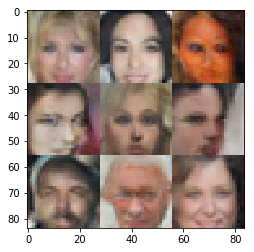

24501.24502.24503.24504.24505.24506.24507.24508.24509.24510.Epoch 4/5... Discriminator Loss: 1.1945... Generator Loss: 0.6487
24511.24512.24513.24514.24515.24516.24517.24518.24519.24520.Epoch 4/5... Discriminator Loss: 1.4519... Generator Loss: 0.4932
24521.24522.24523.24524.24525.24526.24527.24528.24529.24530.Epoch 4/5... Discriminator Loss: 1.3016... Generator Loss: 0.5740
24531.24532.24533.24534.24535.24536.24537.24538.24539.24540.Epoch 4/5... Discriminator Loss: 1.3666... Generator Loss: 0.6498
24541.24542.24543.24544.24545.24546.24547.24548.24549.24550.Epoch 4/5... Discriminator Loss: 1.0559... Generator Loss: 0.9103
24551.24552.24553.24554.24555.24556.24557.24558.24559.24560.Epoch 4/5... Discriminator Loss: 1.7243... Generator Loss: 0.3451
24561.24562.24563.24564.24565.24566.24567.24568.24569.24570.Epoch 4/5... Discriminator Loss: 1.3745... Generator Loss: 0.8701
24571.24572.24573.24574.24575.24576.24577.24578.24579.24580.Epoch 4/5... Discriminator Loss: 1.3102... Generator Loss:

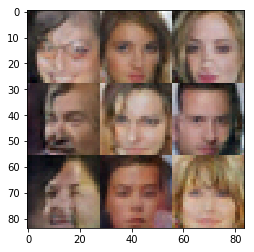

24601.24602.24603.24604.24605.24606.24607.24608.24609.24610.Epoch 4/5... Discriminator Loss: 1.3653... Generator Loss: 0.6100
24611.24612.24613.24614.24615.24616.24617.24618.24619.24620.Epoch 4/5... Discriminator Loss: 1.4480... Generator Loss: 0.7786
24621.24622.24623.24624.24625.24626.24627.24628.24629.24630.Epoch 4/5... Discriminator Loss: 1.5000... Generator Loss: 0.4644
24631.24632.24633.24634.24635.24636.24637.24638.24639.24640.Epoch 4/5... Discriminator Loss: 1.3731... Generator Loss: 0.5384
24641.24642.24643.24644.24645.24646.24647.24648.24649.24650.Epoch 4/5... Discriminator Loss: 1.4751... Generator Loss: 0.5109
24651.24652.24653.24654.24655.24656.24657.24658.24659.24660.Epoch 4/5... Discriminator Loss: 1.2213... Generator Loss: 0.8415
24661.24662.24663.24664.24665.24666.24667.24668.24669.24670.Epoch 4/5... Discriminator Loss: 1.2727... Generator Loss: 0.5926
24671.24672.24673.24674.24675.24676.24677.24678.24679.24680.Epoch 4/5... Discriminator Loss: 1.4561... Generator Loss:

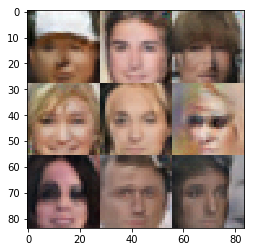

24701.24702.24703.24704.24705.24706.24707.24708.24709.24710.Epoch 4/5... Discriminator Loss: 1.3226... Generator Loss: 0.5634
24711.24712.24713.24714.24715.24716.24717.24718.24719.24720.Epoch 4/5... Discriminator Loss: 1.1352... Generator Loss: 0.9423
24721.24722.24723.24724.24725.24726.24727.24728.24729.24730.Epoch 4/5... Discriminator Loss: 1.0725... Generator Loss: 0.6613
24731.24732.24733.24734.24735.24736.24737.24738.24739.24740.Epoch 4/5... Discriminator Loss: 1.4471... Generator Loss: 0.5021
24741.24742.24743.24744.24745.24746.24747.24748.24749.24750.Epoch 4/5... Discriminator Loss: 1.2039... Generator Loss: 0.7084
24751.24752.24753.24754.24755.24756.24757.24758.24759.24760.Epoch 4/5... Discriminator Loss: 1.3316... Generator Loss: 0.6014
24761.24762.24763.24764.24765.24766.24767.24768.24769.24770.Epoch 4/5... Discriminator Loss: 1.4068... Generator Loss: 0.5185
24771.24772.24773.24774.24775.24776.24777.24778.24779.24780.Epoch 4/5... Discriminator Loss: 1.1574... Generator Loss:

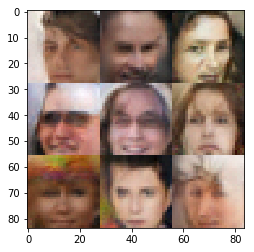

24801.24802.24803.24804.24805.24806.24807.24808.24809.24810.Epoch 4/5... Discriminator Loss: 1.1514... Generator Loss: 0.7220
24811.24812.24813.24814.24815.24816.24817.24818.24819.24820.Epoch 4/5... Discriminator Loss: 1.1620... Generator Loss: 0.6093
24821.24822.24823.24824.24825.24826.24827.24828.24829.24830.Epoch 4/5... Discriminator Loss: 1.2736... Generator Loss: 0.6473
24831.24832.24833.24834.24835.24836.24837.24838.24839.24840.Epoch 4/5... Discriminator Loss: 1.1517... Generator Loss: 0.7298
24841.24842.24843.24844.24845.24846.24847.24848.24849.24850.Epoch 4/5... Discriminator Loss: 1.3445... Generator Loss: 0.7056
24851.24852.24853.24854.24855.24856.24857.24858.24859.24860.Epoch 4/5... Discriminator Loss: 1.2315... Generator Loss: 0.6422
24861.24862.24863.24864.24865.24866.24867.24868.24869.24870.Epoch 4/5... Discriminator Loss: 1.2478... Generator Loss: 0.6370
24871.24872.24873.24874.24875.24876.24877.24878.24879.24880.Epoch 4/5... Discriminator Loss: 1.1152... Generator Loss:

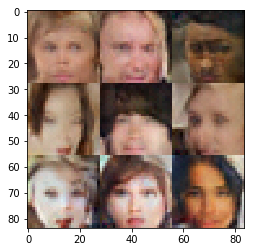

24901.24902.24903.24904.24905.24906.24907.24908.24909.24910.Epoch 4/5... Discriminator Loss: 1.1468... Generator Loss: 0.6487
24911.24912.24913.24914.24915.24916.24917.24918.24919.24920.Epoch 4/5... Discriminator Loss: 1.3737... Generator Loss: 0.5227
24921.24922.24923.24924.24925.24926.24927.24928.24929.24930.Epoch 4/5... Discriminator Loss: 1.4318... Generator Loss: 0.6801
24931.24932.24933.24934.24935.24936.24937.24938.24939.24940.Epoch 4/5... Discriminator Loss: 1.3968... Generator Loss: 0.4575
24941.24942.24943.24944.24945.24946.24947.24948.24949.24950.Epoch 4/5... Discriminator Loss: 0.8308... Generator Loss: 1.0344
24951.24952.24953.24954.24955.24956.24957.24958.24959.24960.Epoch 4/5... Discriminator Loss: 1.3720... Generator Loss: 0.5113
24961.24962.24963.24964.24965.24966.24967.24968.24969.24970.Epoch 4/5... Discriminator Loss: 1.2581... Generator Loss: 0.6233
24971.24972.24973.24974.24975.24976.24977.24978.24979.24980.Epoch 4/5... Discriminator Loss: 1.2812... Generator Loss:

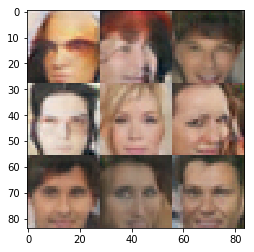

25001.25002.25003.25004.25005.25006.25007.25008.25009.25010.Epoch 4/5... Discriminator Loss: 1.2898... Generator Loss: 0.6272
25011.25012.25013.25014.25015.25016.25017.25018.25019.25020.Epoch 4/5... Discriminator Loss: 1.2053... Generator Loss: 0.7580
25021.25022.25023.25024.25025.25026.25027.25028.25029.25030.Epoch 4/5... Discriminator Loss: 1.2786... Generator Loss: 0.5974
25031.25032.25033.25034.25035.25036.25037.25038.25039.25040.Epoch 4/5... Discriminator Loss: 1.1157... Generator Loss: 0.6923
25041.25042.25043.25044.25045.25046.25047.25048.25049.25050.Epoch 4/5... Discriminator Loss: 1.4111... Generator Loss: 0.6440
25051.25052.25053.25054.25055.25056.25057.25058.25059.25060.Epoch 4/5... Discriminator Loss: 1.1365... Generator Loss: 0.8222
25061.25062.25063.25064.25065.25066.25067.25068.25069.25070.Epoch 4/5... Discriminator Loss: 1.2143... Generator Loss: 0.5824
25071.25072.25073.25074.25075.25076.25077.25078.25079.25080.Epoch 4/5... Discriminator Loss: 1.6808... Generator Loss:

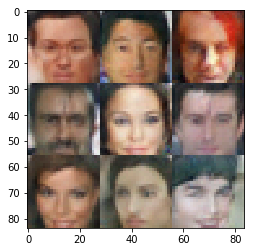

25101.25102.25103.25104.25105.25106.25107.25108.25109.25110.Epoch 4/5... Discriminator Loss: 1.5528... Generator Loss: 0.4298
25111.25112.25113.25114.25115.25116.25117.25118.25119.25120.Epoch 4/5... Discriminator Loss: 1.2739... Generator Loss: 0.8573
25121.25122.25123.25124.25125.25126.25127.25128.25129.25130.Epoch 4/5... Discriminator Loss: 1.3792... Generator Loss: 0.6068
25131.25132.25133.25134.25135.25136.25137.25138.25139.25140.Epoch 4/5... Discriminator Loss: 1.3793... Generator Loss: 0.5931
25141.25142.25143.25144.25145.25146.25147.25148.25149.25150.Epoch 4/5... Discriminator Loss: 1.0541... Generator Loss: 0.8109
25151.25152.25153.25154.25155.25156.25157.25158.25159.25160.Epoch 4/5... Discriminator Loss: 1.2577... Generator Loss: 0.5060
25161.25162.25163.25164.25165.25166.25167.25168.25169.25170.Epoch 4/5... Discriminator Loss: 1.1790... Generator Loss: 0.6945
25171.25172.25173.25174.25175.25176.25177.25178.25179.25180.Epoch 4/5... Discriminator Loss: 1.1189... Generator Loss:

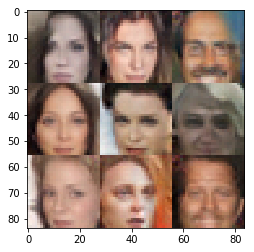

25201.25202.25203.25204.25205.25206.25207.25208.25209.25210.Epoch 4/5... Discriminator Loss: 1.4513... Generator Loss: 0.4883
25211.25212.25213.25214.25215.25216.25217.25218.25219.25220.Epoch 4/5... Discriminator Loss: 1.1359... Generator Loss: 0.8895
25221.25222.25223.25224.25225.25226.25227.25228.25229.25230.Epoch 4/5... Discriminator Loss: 1.3007... Generator Loss: 0.6083
25231.25232.25233.25234.25235.25236.25237.25238.25239.25240.Epoch 4/5... Discriminator Loss: 1.5466... Generator Loss: 0.4661
25241.25242.25243.25244.25245.25246.25247.25248.25249.25250.Epoch 4/5... Discriminator Loss: 1.1980... Generator Loss: 0.6739
25251.25252.25253.25254.25255.25256.25257.25258.25259.25260.Epoch 4/5... Discriminator Loss: 1.0343... Generator Loss: 0.7851
25261.25262.25263.25264.25265.25266.25267.25268.25269.25270.Epoch 4/5... Discriminator Loss: 1.0758... Generator Loss: 0.7024
25271.25272.25273.25274.25275.25276.25277.25278.25279.25280.Epoch 4/5... Discriminator Loss: 1.4728... Generator Loss:

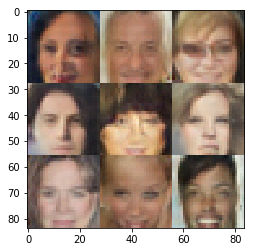

25301.25302.25303.25304.25305.25306.25307.25308.25309.25310.Epoch 4/5... Discriminator Loss: 1.1717... Generator Loss: 0.8027
25311.25312.25313.25314.25315.25316.25317.25318.25319.25320.Epoch 4/5... Discriminator Loss: 1.2398... Generator Loss: 0.7406
25321.25322.25323.25324.25325.25326.25327.25328.25329.25330.Epoch 5/5... Discriminator Loss: 1.1400... Generator Loss: 0.7306
25331.25332.25333.25334.25335.25336.25337.25338.25339.25340.Epoch 5/5... Discriminator Loss: 1.3780... Generator Loss: 0.4339
25341.25342.25343.25344.25345.25346.25347.25348.25349.25350.Epoch 5/5... Discriminator Loss: 1.2501... Generator Loss: 0.6340
25351.25352.25353.25354.25355.25356.25357.25358.25359.25360.Epoch 5/5... Discriminator Loss: 1.2657... Generator Loss: 0.6055
25361.25362.25363.25364.25365.25366.25367.25368.25369.25370.Epoch 5/5... Discriminator Loss: 1.2781... Generator Loss: 0.5082
25371.25372.25373.25374.25375.25376.25377.25378.25379.25380.Epoch 5/5... Discriminator Loss: 1.3001... Generator Loss:

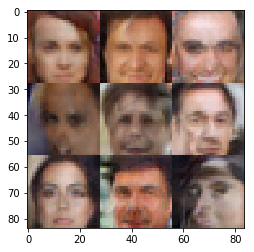

25401.25402.25403.25404.25405.25406.25407.25408.25409.25410.Epoch 5/5... Discriminator Loss: 1.3089... Generator Loss: 0.5712
25411.25412.25413.25414.25415.25416.25417.25418.25419.25420.Epoch 5/5... Discriminator Loss: 1.2874... Generator Loss: 0.5739
25421.25422.25423.25424.25425.25426.25427.25428.25429.25430.Epoch 5/5... Discriminator Loss: 1.2910... Generator Loss: 0.7449
25431.25432.25433.25434.25435.25436.25437.25438.25439.25440.Epoch 5/5... Discriminator Loss: 1.2470... Generator Loss: 0.6627
25441.25442.25443.25444.25445.25446.25447.25448.25449.25450.Epoch 5/5... Discriminator Loss: 1.0924... Generator Loss: 0.7480
25451.25452.25453.25454.25455.25456.25457.25458.25459.25460.Epoch 5/5... Discriminator Loss: 1.3959... Generator Loss: 0.5152
25461.25462.25463.25464.25465.25466.25467.25468.25469.25470.Epoch 5/5... Discriminator Loss: 1.3358... Generator Loss: 0.7191
25471.25472.25473.25474.25475.25476.25477.25478.25479.25480.Epoch 5/5... Discriminator Loss: 1.1203... Generator Loss:

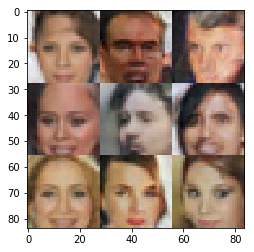

25501.25502.25503.25504.25505.25506.25507.25508.25509.25510.Epoch 5/5... Discriminator Loss: 0.8596... Generator Loss: 0.8652
25511.25512.25513.25514.25515.25516.25517.25518.25519.25520.Epoch 5/5... Discriminator Loss: 1.6333... Generator Loss: 0.3878
25521.25522.25523.25524.25525.25526.25527.25528.25529.25530.Epoch 5/5... Discriminator Loss: 1.8187... Generator Loss: 0.3589
25531.25532.25533.25534.25535.25536.25537.25538.25539.25540.Epoch 5/5... Discriminator Loss: 1.5524... Generator Loss: 0.4041
25541.25542.25543.25544.25545.25546.25547.25548.25549.25550.Epoch 5/5... Discriminator Loss: 1.5516... Generator Loss: 0.5084
25551.25552.25553.25554.25555.25556.25557.25558.25559.25560.Epoch 5/5... Discriminator Loss: 1.5097... Generator Loss: 0.5532
25561.25562.25563.25564.25565.25566.25567.25568.25569.25570.Epoch 5/5... Discriminator Loss: 1.2569... Generator Loss: 0.6077
25571.25572.25573.25574.25575.25576.25577.25578.25579.25580.Epoch 5/5... Discriminator Loss: 0.7915... Generator Loss:

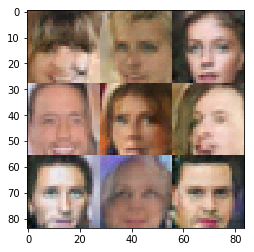

25601.25602.25603.25604.25605.25606.25607.25608.25609.25610.Epoch 5/5... Discriminator Loss: 1.4204... Generator Loss: 0.4227
25611.25612.25613.25614.25615.25616.25617.25618.25619.25620.Epoch 5/5... Discriminator Loss: 0.7763... Generator Loss: 1.0349
25621.25622.25623.25624.25625.25626.25627.25628.25629.25630.Epoch 5/5... Discriminator Loss: 1.5564... Generator Loss: 0.3697
25631.25632.25633.25634.25635.25636.25637.25638.25639.25640.Epoch 5/5... Discriminator Loss: 1.3367... Generator Loss: 0.5149
25641.25642.25643.25644.25645.25646.25647.25648.25649.25650.Epoch 5/5... Discriminator Loss: 1.1090... Generator Loss: 0.8786
25651.25652.25653.25654.25655.25656.25657.25658.25659.25660.Epoch 5/5... Discriminator Loss: 1.1330... Generator Loss: 0.6035
25661.25662.25663.25664.25665.25666.25667.25668.25669.25670.Epoch 5/5... Discriminator Loss: 1.2500... Generator Loss: 0.8556
25671.25672.25673.25674.25675.25676.25677.25678.25679.25680.Epoch 5/5... Discriminator Loss: 1.2150... Generator Loss:

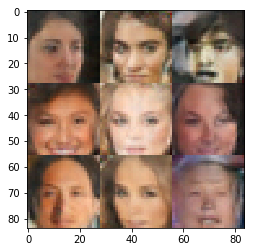

25701.25702.25703.25704.25705.25706.25707.25708.25709.25710.Epoch 5/5... Discriminator Loss: 1.3963... Generator Loss: 0.6922
25711.25712.25713.25714.25715.25716.25717.25718.25719.25720.Epoch 5/5... Discriminator Loss: 1.3931... Generator Loss: 0.5492
25721.25722.25723.25724.25725.25726.25727.25728.25729.25730.Epoch 5/5... Discriminator Loss: 0.8050... Generator Loss: 1.1411
25731.25732.25733.25734.25735.25736.25737.25738.25739.25740.Epoch 5/5... Discriminator Loss: 1.1746... Generator Loss: 0.6200
25741.25742.25743.25744.25745.25746.25747.25748.25749.25750.Epoch 5/5... Discriminator Loss: 1.2656... Generator Loss: 0.5802
25751.25752.25753.25754.25755.25756.25757.25758.25759.25760.Epoch 5/5... Discriminator Loss: 1.0252... Generator Loss: 0.8135
25761.25762.25763.25764.25765.25766.25767.25768.25769.25770.Epoch 5/5... Discriminator Loss: 1.3483... Generator Loss: 0.6373
25771.25772.25773.25774.25775.25776.25777.25778.25779.25780.Epoch 5/5... Discriminator Loss: 1.3261... Generator Loss:

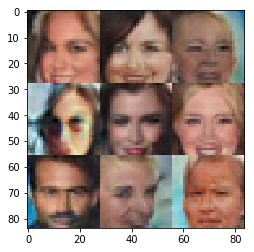

25801.25802.25803.25804.25805.25806.25807.25808.25809.25810.Epoch 5/5... Discriminator Loss: 1.2553... Generator Loss: 0.5420
25811.25812.25813.25814.25815.25816.25817.25818.25819.25820.Epoch 5/5... Discriminator Loss: 1.1698... Generator Loss: 0.6968
25821.25822.25823.25824.25825.25826.25827.25828.25829.25830.Epoch 5/5... Discriminator Loss: 1.0631... Generator Loss: 0.7515
25831.25832.25833.25834.25835.25836.25837.25838.25839.25840.Epoch 5/5... Discriminator Loss: 1.8740... Generator Loss: 0.3408
25841.25842.25843.25844.25845.25846.25847.25848.25849.25850.Epoch 5/5... Discriminator Loss: 1.3281... Generator Loss: 0.7620
25851.25852.25853.25854.25855.25856.25857.25858.25859.25860.Epoch 5/5... Discriminator Loss: 1.2171... Generator Loss: 0.6789
25861.25862.25863.25864.25865.25866.25867.25868.25869.25870.Epoch 5/5... Discriminator Loss: 1.2099... Generator Loss: 0.7265
25871.25872.25873.25874.25875.25876.25877.25878.25879.25880.Epoch 5/5... Discriminator Loss: 1.6348... Generator Loss:

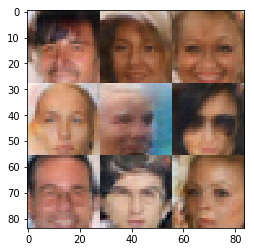

25901.25902.25903.25904.25905.25906.25907.25908.25909.25910.Epoch 5/5... Discriminator Loss: 1.5684... Generator Loss: 0.5538
25911.25912.25913.25914.25915.25916.25917.25918.25919.25920.Epoch 5/5... Discriminator Loss: 1.7550... Generator Loss: 0.4426
25921.25922.25923.25924.25925.25926.25927.25928.25929.25930.Epoch 5/5... Discriminator Loss: 1.1343... Generator Loss: 0.7073
25931.25932.25933.25934.25935.25936.25937.25938.25939.25940.Epoch 5/5... Discriminator Loss: 1.1117... Generator Loss: 0.6834
25941.25942.25943.25944.25945.25946.25947.25948.25949.25950.Epoch 5/5... Discriminator Loss: 1.2184... Generator Loss: 0.9478
25951.25952.25953.25954.25955.25956.25957.25958.25959.25960.Epoch 5/5... Discriminator Loss: 1.4442... Generator Loss: 0.5092
25961.25962.25963.25964.25965.25966.25967.25968.25969.25970.Epoch 5/5... Discriminator Loss: 1.4394... Generator Loss: 0.7819
25971.25972.25973.25974.25975.25976.25977.25978.25979.25980.Epoch 5/5... Discriminator Loss: 1.2251... Generator Loss:

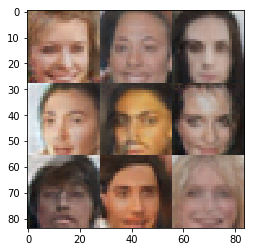

26001.26002.26003.26004.26005.26006.26007.26008.26009.26010.Epoch 5/5... Discriminator Loss: 1.0618... Generator Loss: 0.9211
26011.26012.26013.26014.26015.26016.26017.26018.26019.26020.Epoch 5/5... Discriminator Loss: 1.3235... Generator Loss: 0.5628
26021.26022.26023.26024.26025.26026.26027.26028.26029.26030.Epoch 5/5... Discriminator Loss: 1.2434... Generator Loss: 0.5602
26031.26032.26033.26034.26035.26036.26037.26038.26039.26040.Epoch 5/5... Discriminator Loss: 1.3993... Generator Loss: 0.4948
26041.26042.26043.26044.26045.26046.26047.26048.26049.26050.Epoch 5/5... Discriminator Loss: 1.2970... Generator Loss: 0.6240
26051.26052.26053.26054.26055.26056.26057.26058.26059.26060.Epoch 5/5... Discriminator Loss: 1.1770... Generator Loss: 0.8051
26061.26062.26063.26064.26065.26066.26067.26068.26069.26070.Epoch 5/5... Discriminator Loss: 1.1657... Generator Loss: 0.7328
26071.26072.26073.26074.26075.26076.26077.26078.26079.26080.Epoch 5/5... Discriminator Loss: 1.2278... Generator Loss:

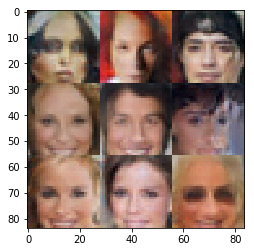

26101.26102.26103.26104.26105.26106.26107.26108.26109.26110.Epoch 5/5... Discriminator Loss: 1.2193... Generator Loss: 0.6233
26111.26112.26113.26114.26115.26116.26117.26118.26119.26120.Epoch 5/5... Discriminator Loss: 1.1743... Generator Loss: 0.7068
26121.26122.26123.26124.26125.26126.26127.26128.26129.26130.Epoch 5/5... Discriminator Loss: 1.4098... Generator Loss: 0.4421
26131.26132.26133.26134.26135.26136.26137.26138.26139.26140.Epoch 5/5... Discriminator Loss: 1.3272... Generator Loss: 0.8525
26141.26142.26143.26144.26145.26146.26147.26148.26149.26150.Epoch 5/5... Discriminator Loss: 1.2411... Generator Loss: 0.7686
26151.26152.26153.26154.26155.26156.26157.26158.26159.26160.Epoch 5/5... Discriminator Loss: 1.4259... Generator Loss: 0.5126
26161.26162.26163.26164.26165.26166.26167.26168.26169.26170.Epoch 5/5... Discriminator Loss: 1.3343... Generator Loss: 0.6959
26171.26172.26173.26174.26175.26176.26177.26178.26179.26180.Epoch 5/5... Discriminator Loss: 1.1916... Generator Loss:

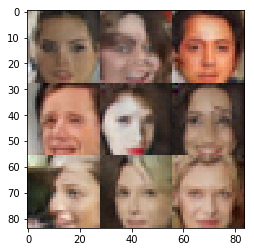

26201.26202.26203.26204.26205.26206.26207.26208.26209.26210.Epoch 5/5... Discriminator Loss: 1.1375... Generator Loss: 0.6630
26211.26212.26213.26214.26215.26216.26217.26218.26219.26220.Epoch 5/5... Discriminator Loss: 1.3468... Generator Loss: 0.5972
26221.26222.26223.26224.26225.26226.26227.26228.26229.26230.Epoch 5/5... Discriminator Loss: 1.4035... Generator Loss: 0.7566
26231.26232.26233.26234.26235.26236.26237.26238.26239.26240.Epoch 5/5... Discriminator Loss: 1.5493... Generator Loss: 0.4786
26241.26242.26243.26244.26245.26246.26247.26248.26249.26250.Epoch 5/5... Discriminator Loss: 1.0212... Generator Loss: 0.8418
26251.26252.26253.26254.26255.26256.26257.26258.26259.26260.Epoch 5/5... Discriminator Loss: 1.3370... Generator Loss: 0.6715
26261.26262.26263.26264.26265.26266.26267.26268.26269.26270.Epoch 5/5... Discriminator Loss: 1.2720... Generator Loss: 0.7629
26271.26272.26273.26274.26275.26276.26277.26278.26279.26280.Epoch 5/5... Discriminator Loss: 1.2104... Generator Loss:

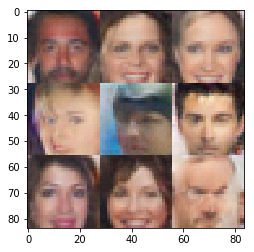

26301.26302.26303.26304.26305.26306.26307.26308.26309.26310.Epoch 5/5... Discriminator Loss: 1.4336... Generator Loss: 0.4754
26311.26312.26313.26314.26315.26316.26317.26318.26319.26320.Epoch 5/5... Discriminator Loss: 1.3697... Generator Loss: 0.6109
26321.26322.26323.26324.26325.26326.26327.26328.26329.26330.Epoch 5/5... Discriminator Loss: 1.3181... Generator Loss: 0.9812
26331.26332.26333.26334.26335.26336.26337.26338.26339.26340.Epoch 5/5... Discriminator Loss: 1.5518... Generator Loss: 0.3866
26341.26342.26343.26344.26345.26346.26347.26348.26349.26350.Epoch 5/5... Discriminator Loss: 1.1600... Generator Loss: 0.7997
26351.26352.26353.26354.26355.26356.26357.26358.26359.26360.Epoch 5/5... Discriminator Loss: 1.4258... Generator Loss: 0.4976
26361.26362.26363.26364.26365.26366.26367.26368.26369.26370.Epoch 5/5... Discriminator Loss: 1.2109... Generator Loss: 0.6967
26371.26372.26373.26374.26375.26376.26377.26378.26379.26380.Epoch 5/5... Discriminator Loss: 1.6607... Generator Loss:

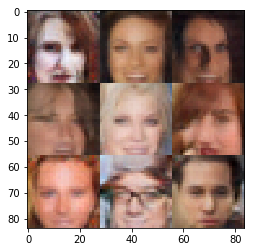

26401.26402.26403.26404.26405.26406.26407.26408.26409.26410.Epoch 5/5... Discriminator Loss: 1.2137... Generator Loss: 0.6170
26411.26412.26413.26414.26415.26416.26417.26418.26419.26420.Epoch 5/5... Discriminator Loss: 1.2625... Generator Loss: 0.7048
26421.26422.26423.26424.26425.26426.26427.26428.26429.26430.Epoch 5/5... Discriminator Loss: 1.2609... Generator Loss: 0.5374
26431.26432.26433.26434.26435.26436.26437.26438.26439.26440.Epoch 5/5... Discriminator Loss: 1.1907... Generator Loss: 0.6646
26441.26442.26443.26444.26445.26446.26447.26448.26449.26450.Epoch 5/5... Discriminator Loss: 0.9492... Generator Loss: 0.9351
26451.26452.26453.26454.26455.26456.26457.26458.26459.26460.Epoch 5/5... Discriminator Loss: 1.3364... Generator Loss: 0.5484
26461.26462.26463.26464.26465.26466.26467.26468.26469.26470.Epoch 5/5... Discriminator Loss: 1.2597... Generator Loss: 0.6609
26471.26472.26473.26474.26475.26476.26477.26478.26479.26480.Epoch 5/5... Discriminator Loss: 1.1564... Generator Loss:

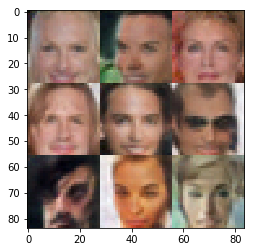

26501.26502.26503.26504.26505.26506.26507.26508.26509.26510.Epoch 5/5... Discriminator Loss: 1.2439... Generator Loss: 0.6242
26511.26512.26513.26514.26515.26516.26517.26518.26519.26520.Epoch 5/5... Discriminator Loss: 1.3366... Generator Loss: 0.5886
26521.26522.26523.26524.26525.26526.26527.26528.26529.26530.Epoch 5/5... Discriminator Loss: 1.3739... Generator Loss: 0.5607
26531.26532.26533.26534.26535.26536.26537.26538.26539.26540.Epoch 5/5... Discriminator Loss: 1.3794... Generator Loss: 0.5259
26541.26542.26543.26544.26545.26546.26547.26548.26549.26550.Epoch 5/5... Discriminator Loss: 1.2389... Generator Loss: 0.6877
26551.26552.26553.26554.26555.26556.26557.26558.26559.26560.Epoch 5/5... Discriminator Loss: 1.3221... Generator Loss: 0.5634
26561.26562.26563.26564.26565.26566.26567.26568.26569.26570.Epoch 5/5... Discriminator Loss: 1.0404... Generator Loss: 0.7996
26571.26572.26573.26574.26575.26576.26577.26578.26579.26580.Epoch 5/5... Discriminator Loss: 1.3133... Generator Loss:

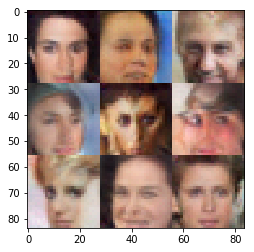

26601.26602.26603.26604.26605.26606.26607.26608.26609.26610.Epoch 5/5... Discriminator Loss: 1.3269... Generator Loss: 0.6517
26611.26612.26613.26614.26615.26616.26617.26618.26619.26620.Epoch 5/5... Discriminator Loss: 1.2028... Generator Loss: 0.5532
26621.26622.26623.26624.26625.26626.26627.26628.26629.26630.Epoch 5/5... Discriminator Loss: 1.3988... Generator Loss: 0.6403
26631.26632.26633.26634.26635.26636.26637.26638.26639.26640.Epoch 5/5... Discriminator Loss: 1.1883... Generator Loss: 0.7716
26641.26642.26643.26644.26645.26646.26647.26648.26649.26650.Epoch 5/5... Discriminator Loss: 1.1856... Generator Loss: 0.8436
26651.26652.26653.26654.26655.26656.26657.26658.26659.26660.Epoch 5/5... Discriminator Loss: 1.1736... Generator Loss: 0.8146
26661.26662.26663.26664.26665.26666.26667.26668.26669.26670.Epoch 5/5... Discriminator Loss: 0.8376... Generator Loss: 1.1037
26671.26672.26673.26674.26675.26676.26677.26678.26679.26680.Epoch 5/5... Discriminator Loss: 1.4530... Generator Loss:

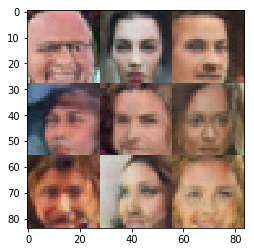

26701.26702.26703.26704.26705.26706.26707.26708.26709.26710.Epoch 5/5... Discriminator Loss: 1.3157... Generator Loss: 0.5995
26711.26712.26713.26714.26715.26716.26717.26718.26719.26720.Epoch 5/5... Discriminator Loss: 1.2116... Generator Loss: 0.7260
26721.26722.26723.26724.26725.26726.26727.26728.26729.26730.Epoch 5/5... Discriminator Loss: 1.0849... Generator Loss: 0.8014
26731.26732.26733.26734.26735.26736.26737.26738.26739.26740.Epoch 5/5... Discriminator Loss: 1.4236... Generator Loss: 0.6222
26741.26742.26743.26744.26745.26746.26747.26748.26749.26750.Epoch 5/5... Discriminator Loss: 1.2045... Generator Loss: 0.6948
26751.26752.26753.26754.26755.26756.26757.26758.26759.26760.Epoch 5/5... Discriminator Loss: 1.3405... Generator Loss: 0.5525
26761.26762.26763.26764.26765.26766.26767.26768.26769.26770.Epoch 5/5... Discriminator Loss: 1.4091... Generator Loss: 0.5627
26771.26772.26773.26774.26775.26776.26777.26778.26779.26780.Epoch 5/5... Discriminator Loss: 1.3418... Generator Loss:

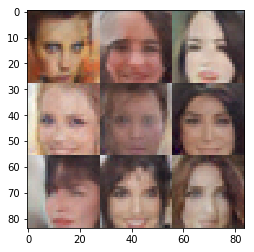

26801.26802.26803.26804.26805.26806.26807.26808.26809.26810.Epoch 5/5... Discriminator Loss: 1.1973... Generator Loss: 0.6491
26811.26812.26813.26814.26815.26816.26817.26818.26819.26820.Epoch 5/5... Discriminator Loss: 1.1225... Generator Loss: 0.8001
26821.26822.26823.26824.26825.26826.26827.26828.26829.26830.Epoch 5/5... Discriminator Loss: 1.2619... Generator Loss: 0.8882
26831.26832.26833.26834.26835.26836.26837.26838.26839.26840.Epoch 5/5... Discriminator Loss: 1.4741... Generator Loss: 0.5151
26841.26842.26843.26844.26845.26846.26847.26848.26849.26850.Epoch 5/5... Discriminator Loss: 1.2389... Generator Loss: 0.5522
26851.26852.26853.26854.26855.26856.26857.26858.26859.26860.Epoch 5/5... Discriminator Loss: 1.5226... Generator Loss: 0.5071
26861.26862.26863.26864.26865.26866.26867.26868.26869.26870.Epoch 5/5... Discriminator Loss: 1.4093... Generator Loss: 0.5013
26871.26872.26873.26874.26875.26876.26877.26878.26879.26880.Epoch 5/5... Discriminator Loss: 1.0916... Generator Loss:

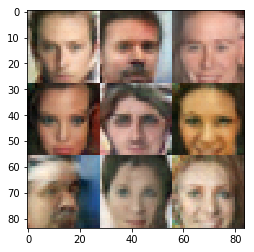

26901.26902.26903.26904.26905.26906.26907.26908.26909.26910.Epoch 5/5... Discriminator Loss: 1.4442... Generator Loss: 0.3933
26911.26912.26913.26914.26915.26916.26917.26918.26919.26920.Epoch 5/5... Discriminator Loss: 1.2846... Generator Loss: 0.6945
26921.26922.26923.26924.26925.26926.26927.26928.26929.26930.Epoch 5/5... Discriminator Loss: 1.4412... Generator Loss: 0.5445
26931.26932.26933.26934.26935.26936.26937.26938.26939.26940.Epoch 5/5... Discriminator Loss: 1.3404... Generator Loss: 0.5357
26941.26942.26943.26944.26945.26946.26947.26948.26949.26950.Epoch 5/5... Discriminator Loss: 1.2235... Generator Loss: 0.5644
26951.26952.26953.26954.26955.26956.26957.26958.26959.26960.Epoch 5/5... Discriminator Loss: 1.5819... Generator Loss: 0.4937
26961.26962.26963.26964.26965.26966.26967.26968.26969.26970.Epoch 5/5... Discriminator Loss: 1.0400... Generator Loss: 0.7789
26971.26972.26973.26974.26975.26976.26977.26978.26979.26980.Epoch 5/5... Discriminator Loss: 1.0000... Generator Loss:

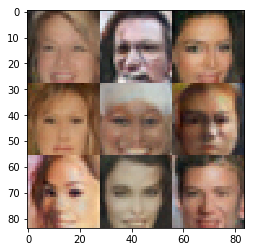

27001.27002.27003.27004.27005.27006.27007.27008.27009.27010.Epoch 5/5... Discriminator Loss: 1.0621... Generator Loss: 0.6631
27011.27012.27013.27014.27015.27016.27017.27018.27019.27020.Epoch 5/5... Discriminator Loss: 1.2202... Generator Loss: 0.6417
27021.27022.27023.27024.27025.27026.27027.27028.27029.27030.Epoch 5/5... Discriminator Loss: 1.2031... Generator Loss: 0.6020
27031.27032.27033.27034.27035.27036.27037.27038.27039.27040.Epoch 5/5... Discriminator Loss: 0.9740... Generator Loss: 0.7963
27041.27042.27043.27044.27045.27046.27047.27048.27049.27050.Epoch 5/5... Discriminator Loss: 1.5675... Generator Loss: 0.5314
27051.27052.27053.27054.27055.27056.27057.27058.27059.27060.Epoch 5/5... Discriminator Loss: 1.6058... Generator Loss: 0.6284
27061.27062.27063.27064.27065.27066.27067.27068.27069.27070.Epoch 5/5... Discriminator Loss: 1.3366... Generator Loss: 0.6874
27071.27072.27073.27074.27075.27076.27077.27078.27079.27080.Epoch 5/5... Discriminator Loss: 1.2575... Generator Loss:

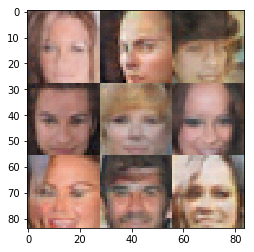

27101.27102.27103.27104.27105.27106.27107.27108.27109.27110.Epoch 5/5... Discriminator Loss: 1.2943... Generator Loss: 0.5735
27111.27112.27113.27114.27115.27116.27117.27118.27119.27120.Epoch 5/5... Discriminator Loss: 1.4925... Generator Loss: 0.6859
27121.27122.27123.27124.27125.27126.27127.27128.27129.27130.Epoch 5/5... Discriminator Loss: 1.6611... Generator Loss: 0.5228
27131.27132.27133.27134.27135.27136.27137.27138.27139.27140.Epoch 5/5... Discriminator Loss: 1.4581... Generator Loss: 0.5431
27141.27142.27143.27144.27145.27146.27147.27148.27149.27150.Epoch 5/5... Discriminator Loss: 1.3583... Generator Loss: 0.5823
27151.27152.27153.27154.27155.27156.27157.27158.27159.27160.Epoch 5/5... Discriminator Loss: 1.2532... Generator Loss: 0.6583
27161.27162.27163.27164.27165.27166.27167.27168.27169.27170.Epoch 5/5... Discriminator Loss: 0.7860... Generator Loss: 1.0493
27171.27172.27173.27174.27175.27176.27177.27178.27179.27180.Epoch 5/5... Discriminator Loss: 1.5516... Generator Loss:

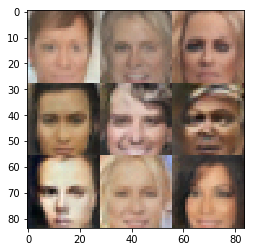

27201.27202.27203.27204.27205.27206.27207.27208.27209.27210.Epoch 5/5... Discriminator Loss: 1.3062... Generator Loss: 0.5426
27211.27212.27213.27214.27215.27216.27217.27218.27219.27220.Epoch 5/5... Discriminator Loss: 1.2473... Generator Loss: 0.7812
27221.27222.27223.27224.27225.27226.27227.27228.27229.27230.Epoch 5/5... Discriminator Loss: 1.3336... Generator Loss: 0.6585
27231.27232.27233.27234.27235.27236.27237.27238.27239.27240.Epoch 5/5... Discriminator Loss: 1.0998... Generator Loss: 0.7812
27241.27242.27243.27244.27245.27246.27247.27248.27249.27250.Epoch 5/5... Discriminator Loss: 1.4433... Generator Loss: 0.4874
27251.27252.27253.27254.27255.27256.27257.27258.27259.27260.Epoch 5/5... Discriminator Loss: 1.3249... Generator Loss: 0.4969
27261.27262.27263.27264.27265.27266.27267.27268.27269.27270.Epoch 5/5... Discriminator Loss: 1.2290... Generator Loss: 0.5588
27271.27272.27273.27274.27275.27276.27277.27278.27279.27280.Epoch 5/5... Discriminator Loss: 1.3184... Generator Loss:

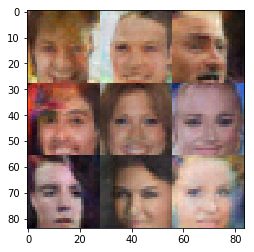

27301.27302.27303.27304.27305.27306.27307.27308.27309.27310.Epoch 5/5... Discriminator Loss: 1.4785... Generator Loss: 0.4843
27311.27312.27313.27314.27315.27316.27317.27318.27319.27320.Epoch 5/5... Discriminator Loss: 1.4644... Generator Loss: 0.4574
27321.27322.27323.27324.27325.27326.27327.27328.27329.27330.Epoch 5/5... Discriminator Loss: 1.1820... Generator Loss: 0.6900
27331.27332.27333.27334.27335.27336.27337.27338.27339.27340.Epoch 5/5... Discriminator Loss: 1.4873... Generator Loss: 0.5788
27341.27342.27343.27344.27345.27346.27347.27348.27349.27350.Epoch 5/5... Discriminator Loss: 1.2735... Generator Loss: 0.5412
27351.27352.27353.27354.27355.27356.27357.27358.27359.27360.Epoch 5/5... Discriminator Loss: 1.5711... Generator Loss: 0.3614
27361.27362.27363.27364.27365.27366.27367.27368.27369.27370.Epoch 5/5... Discriminator Loss: 1.3199... Generator Loss: 0.5170
27371.27372.27373.27374.27375.27376.27377.27378.27379.27380.Epoch 5/5... Discriminator Loss: 1.3524... Generator Loss:

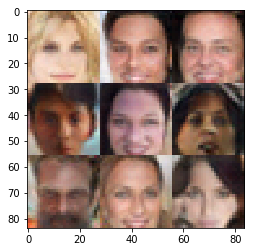

27401.27402.27403.27404.27405.27406.27407.27408.27409.27410.Epoch 5/5... Discriminator Loss: 1.2694... Generator Loss: 0.5791
27411.27412.27413.27414.27415.27416.27417.27418.27419.27420.Epoch 5/5... Discriminator Loss: 1.3416... Generator Loss: 0.6456
27421.27422.27423.27424.27425.27426.27427.27428.27429.27430.Epoch 5/5... Discriminator Loss: 0.9799... Generator Loss: 1.1465
27431.27432.27433.27434.27435.27436.27437.27438.27439.27440.Epoch 5/5... Discriminator Loss: 1.0364... Generator Loss: 0.8302
27441.27442.27443.27444.27445.27446.27447.27448.27449.27450.Epoch 5/5... Discriminator Loss: 1.2884... Generator Loss: 0.5734
27451.27452.27453.27454.27455.27456.27457.27458.27459.27460.Epoch 5/5... Discriminator Loss: 1.3285... Generator Loss: 0.4966
27461.27462.27463.27464.27465.27466.27467.27468.27469.27470.Epoch 5/5... Discriminator Loss: 1.6713... Generator Loss: 0.4620
27471.27472.27473.27474.27475.27476.27477.27478.27479.27480.Epoch 5/5... Discriminator Loss: 1.3225... Generator Loss:

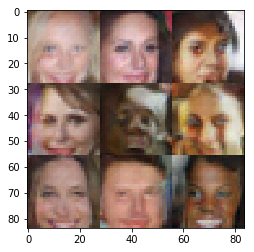

27501.27502.27503.27504.27505.27506.27507.27508.27509.27510.Epoch 5/5... Discriminator Loss: 1.3018... Generator Loss: 0.5725
27511.27512.27513.27514.27515.27516.27517.27518.27519.27520.Epoch 5/5... Discriminator Loss: 1.2537... Generator Loss: 0.4956
27521.27522.27523.27524.27525.27526.27527.27528.27529.27530.Epoch 5/5... Discriminator Loss: 1.3780... Generator Loss: 0.4982
27531.27532.27533.27534.27535.27536.27537.27538.27539.27540.Epoch 5/5... Discriminator Loss: 1.3447... Generator Loss: 0.6661
27541.27542.27543.27544.27545.27546.27547.27548.27549.27550.Epoch 5/5... Discriminator Loss: 1.4509... Generator Loss: 0.5440
27551.27552.27553.27554.27555.27556.27557.27558.27559.27560.Epoch 5/5... Discriminator Loss: 1.1523... Generator Loss: 0.7280
27561.27562.27563.27564.27565.27566.27567.27568.27569.27570.Epoch 5/5... Discriminator Loss: 0.9670... Generator Loss: 1.0180
27571.27572.27573.27574.27575.27576.27577.27578.27579.27580.Epoch 5/5... Discriminator Loss: 1.1586... Generator Loss:

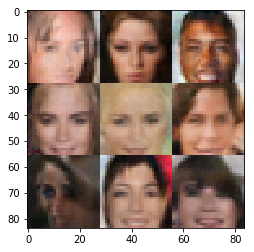

27601.27602.27603.27604.27605.27606.27607.27608.27609.27610.Epoch 5/5... Discriminator Loss: 1.1074... Generator Loss: 0.7316
27611.27612.27613.27614.27615.27616.27617.27618.27619.27620.Epoch 5/5... Discriminator Loss: 1.4379... Generator Loss: 0.5145
27621.27622.27623.27624.27625.27626.27627.27628.27629.27630.Epoch 5/5... Discriminator Loss: 1.2231... Generator Loss: 0.6556
27631.27632.27633.27634.27635.27636.27637.27638.27639.27640.Epoch 5/5... Discriminator Loss: 1.3106... Generator Loss: 0.6354
27641.27642.27643.27644.27645.27646.27647.27648.27649.27650.Epoch 5/5... Discriminator Loss: 1.2649... Generator Loss: 0.5869
27651.27652.27653.27654.27655.27656.27657.27658.27659.27660.Epoch 5/5... Discriminator Loss: 1.3045... Generator Loss: 0.4796
27661.27662.27663.27664.27665.27666.27667.27668.27669.27670.Epoch 5/5... Discriminator Loss: 1.1610... Generator Loss: 0.7406
27671.27672.27673.27674.27675.27676.27677.27678.27679.27680.Epoch 5/5... Discriminator Loss: 0.9548... Generator Loss:

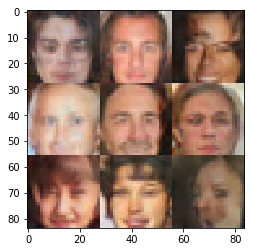

27701.27702.27703.27704.27705.27706.27707.27708.27709.27710.Epoch 5/5... Discriminator Loss: 0.8085... Generator Loss: 0.8724
27711.27712.27713.27714.27715.27716.27717.27718.27719.27720.Epoch 5/5... Discriminator Loss: 1.3359... Generator Loss: 0.4984
27721.27722.27723.27724.27725.27726.27727.27728.27729.27730.Epoch 5/5... Discriminator Loss: 1.4664... Generator Loss: 0.4565
27731.27732.27733.27734.27735.27736.27737.27738.27739.27740.Epoch 5/5... Discriminator Loss: 1.1510... Generator Loss: 0.7785
27741.27742.27743.27744.27745.27746.27747.27748.27749.27750.Epoch 5/5... Discriminator Loss: 1.3469... Generator Loss: 0.6385
27751.27752.27753.27754.27755.27756.27757.27758.27759.27760.Epoch 5/5... Discriminator Loss: 1.2993... Generator Loss: 0.7153
27761.27762.27763.27764.27765.27766.27767.27768.27769.27770.Epoch 5/5... Discriminator Loss: 1.3055... Generator Loss: 0.6824
27771.27772.27773.27774.27775.27776.27777.27778.27779.27780.Epoch 5/5... Discriminator Loss: 1.1420... Generator Loss:

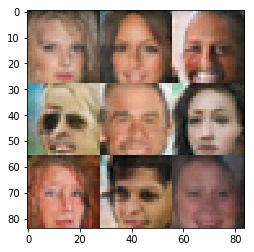

27801.27802.27803.27804.27805.27806.27807.27808.27809.27810.Epoch 5/5... Discriminator Loss: 1.0796... Generator Loss: 0.7277
27811.27812.27813.27814.27815.27816.27817.27818.27819.27820.Epoch 5/5... Discriminator Loss: 1.4907... Generator Loss: 0.6637
27821.27822.27823.27824.27825.27826.27827.27828.27829.27830.Epoch 5/5... Discriminator Loss: 1.2550... Generator Loss: 0.7531
27831.27832.27833.27834.27835.27836.27837.27838.27839.27840.Epoch 5/5... Discriminator Loss: 1.6685... Generator Loss: 0.3775
27841.27842.27843.27844.27845.27846.27847.27848.27849.27850.Epoch 5/5... Discriminator Loss: 1.4467... Generator Loss: 0.4682
27851.27852.27853.27854.27855.27856.27857.27858.27859.27860.Epoch 5/5... Discriminator Loss: 1.7499... Generator Loss: 0.2914
27861.27862.27863.27864.27865.27866.27867.27868.27869.27870.Epoch 5/5... Discriminator Loss: 1.4886... Generator Loss: 0.5373
27871.27872.27873.27874.27875.27876.27877.27878.27879.27880.Epoch 5/5... Discriminator Loss: 1.4804... Generator Loss:

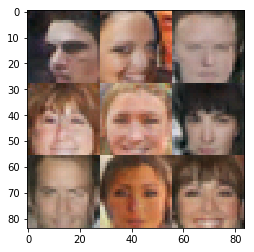

27901.27902.27903.27904.27905.27906.27907.27908.27909.27910.Epoch 5/5... Discriminator Loss: 1.0251... Generator Loss: 0.9208
27911.27912.27913.27914.27915.27916.27917.27918.27919.27920.Epoch 5/5... Discriminator Loss: 1.1315... Generator Loss: 0.7392
27921.27922.27923.27924.27925.27926.27927.27928.27929.27930.Epoch 5/5... Discriminator Loss: 1.3390... Generator Loss: 0.6839
27931.27932.27933.27934.27935.27936.27937.27938.27939.27940.Epoch 5/5... Discriminator Loss: 1.1109... Generator Loss: 0.9239
27941.27942.27943.27944.27945.27946.27947.27948.27949.27950.Epoch 5/5... Discriminator Loss: 1.2911... Generator Loss: 0.5442
27951.27952.27953.27954.27955.27956.27957.27958.27959.27960.Epoch 5/5... Discriminator Loss: 1.3381... Generator Loss: 0.5662
27961.27962.27963.27964.27965.27966.27967.27968.27969.27970.Epoch 5/5... Discriminator Loss: 1.2537... Generator Loss: 0.6514
27971.27972.27973.27974.27975.27976.27977.27978.27979.27980.Epoch 5/5... Discriminator Loss: 1.3131... Generator Loss:

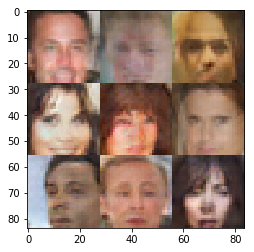

28001.28002.28003.28004.28005.28006.28007.28008.28009.28010.Epoch 5/5... Discriminator Loss: 0.8968... Generator Loss: 1.1834
28011.28012.28013.28014.28015.28016.28017.28018.28019.28020.Epoch 5/5... Discriminator Loss: 1.4519... Generator Loss: 0.8304
28021.28022.28023.28024.28025.28026.28027.28028.28029.28030.Epoch 5/5... Discriminator Loss: 1.3170... Generator Loss: 0.6220
28031.28032.28033.28034.28035.28036.28037.28038.28039.28040.Epoch 5/5... Discriminator Loss: 1.2071... Generator Loss: 0.7142
28041.28042.28043.28044.28045.28046.28047.28048.28049.28050.Epoch 5/5... Discriminator Loss: 1.3307... Generator Loss: 0.5186
28051.28052.28053.28054.28055.28056.28057.28058.28059.28060.Epoch 5/5... Discriminator Loss: 1.0327... Generator Loss: 0.7064
28061.28062.28063.28064.28065.28066.28067.28068.28069.28070.Epoch 5/5... Discriminator Loss: 1.2962... Generator Loss: 0.6444
28071.28072.28073.28074.28075.28076.28077.28078.28079.28080.Epoch 5/5... Discriminator Loss: 1.4834... Generator Loss:

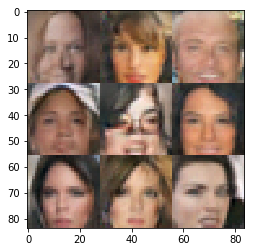

28101.28102.28103.28104.28105.28106.28107.28108.28109.28110.Epoch 5/5... Discriminator Loss: 1.3296... Generator Loss: 0.7157
28111.28112.28113.28114.28115.28116.28117.28118.28119.28120.Epoch 5/5... Discriminator Loss: 1.5655... Generator Loss: 0.4874
28121.28122.28123.28124.28125.28126.28127.28128.28129.28130.Epoch 5/5... Discriminator Loss: 1.0539... Generator Loss: 0.8707
28131.28132.28133.28134.28135.28136.28137.28138.28139.28140.Epoch 5/5... Discriminator Loss: 1.3950... Generator Loss: 0.5921
28141.28142.28143.28144.28145.28146.28147.28148.28149.28150.Epoch 5/5... Discriminator Loss: 1.0474... Generator Loss: 1.1522
28151.28152.28153.28154.28155.28156.28157.28158.28159.28160.Epoch 5/5... Discriminator Loss: 1.2710... Generator Loss: 0.8731
28161.28162.28163.28164.28165.28166.28167.28168.28169.28170.Epoch 5/5... Discriminator Loss: 1.1011... Generator Loss: 0.7066
28171.28172.28173.28174.28175.28176.28177.28178.28179.28180.Epoch 5/5... Discriminator Loss: 1.1254... Generator Loss:

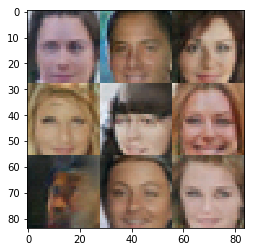

28201.28202.28203.28204.28205.28206.28207.28208.28209.28210.Epoch 5/5... Discriminator Loss: 1.2951... Generator Loss: 0.7445
28211.28212.28213.28214.28215.28216.28217.28218.28219.28220.Epoch 5/5... Discriminator Loss: 1.2588... Generator Loss: 0.6086
28221.28222.28223.28224.28225.28226.28227.28228.28229.28230.Epoch 5/5... Discriminator Loss: 1.3868... Generator Loss: 0.6124
28231.28232.28233.28234.28235.28236.28237.28238.28239.28240.Epoch 5/5... Discriminator Loss: 1.3161... Generator Loss: 0.5774
28241.28242.28243.28244.28245.28246.28247.28248.28249.28250.Epoch 5/5... Discriminator Loss: 0.9842... Generator Loss: 1.2719
28251.28252.28253.28254.28255.28256.28257.28258.28259.28260.Epoch 5/5... Discriminator Loss: 1.1077... Generator Loss: 0.8688
28261.28262.28263.28264.28265.28266.28267.28268.28269.28270.Epoch 5/5... Discriminator Loss: 1.9193... Generator Loss: 0.4017
28271.28272.28273.28274.28275.28276.28277.28278.28279.28280.Epoch 5/5... Discriminator Loss: 1.7266... Generator Loss:

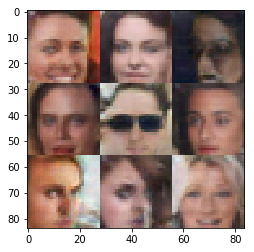

28301.28302.28303.28304.28305.28306.28307.28308.28309.28310.Epoch 5/5... Discriminator Loss: 1.2721... Generator Loss: 0.6172
28311.28312.28313.28314.28315.28316.28317.28318.28319.28320.Epoch 5/5... Discriminator Loss: 1.4333... Generator Loss: 0.5138
28321.28322.28323.28324.28325.28326.28327.28328.28329.28330.Epoch 5/5... Discriminator Loss: 1.3345... Generator Loss: 0.5182
28331.28332.28333.28334.28335.28336.28337.28338.28339.28340.Epoch 5/5... Discriminator Loss: 1.2769... Generator Loss: 0.6355
28341.28342.28343.28344.28345.28346.28347.28348.28349.28350.Epoch 5/5... Discriminator Loss: 1.4272... Generator Loss: 0.4516
28351.28352.28353.28354.28355.28356.28357.28358.28359.28360.Epoch 5/5... Discriminator Loss: 1.1574... Generator Loss: 0.9274
28361.28362.28363.28364.28365.28366.28367.28368.28369.28370.Epoch 5/5... Discriminator Loss: 1.2674... Generator Loss: 0.7108
28371.28372.28373.28374.28375.28376.28377.28378.28379.28380.Epoch 5/5... Discriminator Loss: 1.2844... Generator Loss:

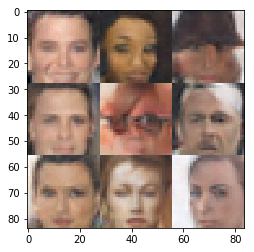

28401.28402.28403.28404.28405.28406.28407.28408.28409.28410.Epoch 5/5... Discriminator Loss: 1.5857... Generator Loss: 0.4062
28411.28412.28413.28414.28415.28416.28417.28418.28419.28420.Epoch 5/5... Discriminator Loss: 1.5523... Generator Loss: 0.4151
28421.28422.28423.28424.28425.28426.28427.28428.28429.28430.Epoch 5/5... Discriminator Loss: 1.7182... Generator Loss: 0.2677
28431.28432.28433.28434.28435.28436.28437.28438.28439.28440.Epoch 5/5... Discriminator Loss: 1.4697... Generator Loss: 0.4682
28441.28442.28443.28444.28445.28446.28447.28448.28449.28450.Epoch 5/5... Discriminator Loss: 1.4765... Generator Loss: 0.4074
28451.28452.28453.28454.28455.28456.28457.28458.28459.28460.Epoch 5/5... Discriminator Loss: 1.4765... Generator Loss: 0.5306
28461.28462.28463.28464.28465.28466.28467.28468.28469.28470.Epoch 5/5... Discriminator Loss: 1.3399... Generator Loss: 0.5323
28471.28472.28473.28474.28475.28476.28477.28478.28479.28480.Epoch 5/5... Discriminator Loss: 1.1600... Generator Loss:

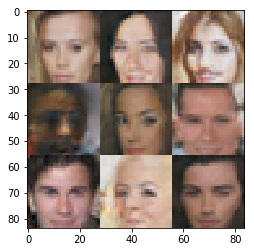

28501.28502.28503.28504.28505.28506.28507.28508.28509.28510.Epoch 5/5... Discriminator Loss: 1.3618... Generator Loss: 0.4917
28511.28512.28513.28514.28515.28516.28517.28518.28519.28520.Epoch 5/5... Discriminator Loss: 1.8610... Generator Loss: 0.3796
28521.28522.28523.28524.28525.28526.28527.28528.28529.28530.Epoch 5/5... Discriminator Loss: 0.9772... Generator Loss: 1.1067
28531.28532.28533.28534.28535.28536.28537.28538.28539.28540.Epoch 5/5... Discriminator Loss: 1.2337... Generator Loss: 0.7292
28541.28542.28543.28544.28545.28546.28547.28548.28549.28550.Epoch 5/5... Discriminator Loss: 1.3130... Generator Loss: 0.5784
28551.28552.28553.28554.28555.28556.28557.28558.28559.28560.Epoch 5/5... Discriminator Loss: 1.6066... Generator Loss: 0.4117
28561.28562.28563.28564.28565.28566.28567.28568.28569.28570.Epoch 5/5... Discriminator Loss: 0.9808... Generator Loss: 0.8130
28571.28572.28573.28574.28575.28576.28577.28578.28579.28580.Epoch 5/5... Discriminator Loss: 0.8081... Generator Loss:

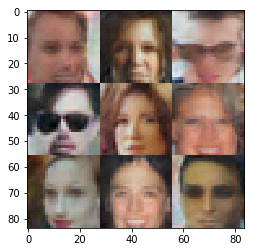

28601.28602.28603.28604.28605.28606.28607.28608.28609.28610.Epoch 5/5... Discriminator Loss: 1.6346... Generator Loss: 0.4237
28611.28612.28613.28614.28615.28616.28617.28618.28619.28620.Epoch 5/5... Discriminator Loss: 1.3529... Generator Loss: 0.6202
28621.28622.28623.28624.28625.28626.28627.28628.28629.28630.Epoch 5/5... Discriminator Loss: 1.2239... Generator Loss: 0.5363
28631.28632.28633.28634.28635.28636.28637.28638.28639.28640.Epoch 5/5... Discriminator Loss: 1.4713... Generator Loss: 0.5699
28641.28642.28643.28644.28645.28646.28647.28648.28649.28650.Epoch 5/5... Discriminator Loss: 1.2629... Generator Loss: 0.6610
28651.28652.28653.28654.28655.28656.28657.28658.28659.28660.Epoch 5/5... Discriminator Loss: 1.2752... Generator Loss: 0.6250
28661.28662.28663.28664.28665.28666.28667.28668.28669.28670.Epoch 5/5... Discriminator Loss: 1.4093... Generator Loss: 0.5271
28671.28672.28673.28674.28675.28676.28677.28678.28679.28680.Epoch 5/5... Discriminator Loss: 1.1548... Generator Loss:

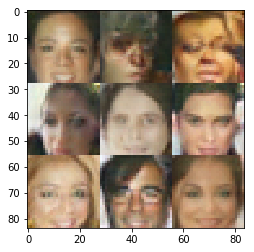

28701.28702.28703.28704.28705.28706.28707.28708.28709.28710.Epoch 5/5... Discriminator Loss: 1.2113... Generator Loss: 0.7121
28711.28712.28713.28714.28715.28716.28717.28718.28719.28720.Epoch 5/5... Discriminator Loss: 1.1227... Generator Loss: 0.6992
28721.28722.28723.28724.28725.28726.28727.28728.28729.28730.Epoch 5/5... Discriminator Loss: 1.2006... Generator Loss: 0.7893
28731.28732.28733.28734.28735.28736.28737.28738.28739.28740.Epoch 5/5... Discriminator Loss: 1.2087... Generator Loss: 0.5703
28741.28742.28743.28744.28745.28746.28747.28748.28749.28750.Epoch 5/5... Discriminator Loss: 1.2331... Generator Loss: 0.5828
28751.28752.28753.28754.28755.28756.28757.28758.28759.28760.Epoch 5/5... Discriminator Loss: 1.2950... Generator Loss: 0.5958
28761.28762.28763.28764.28765.28766.28767.28768.28769.28770.Epoch 5/5... Discriminator Loss: 1.2189... Generator Loss: 0.7881
28771.28772.28773.28774.28775.28776.28777.28778.28779.28780.Epoch 5/5... Discriminator Loss: 1.5271... Generator Loss:

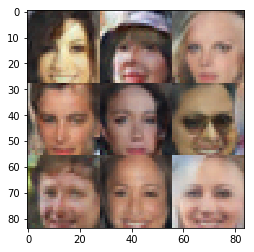

28801.28802.28803.28804.28805.28806.28807.28808.28809.28810.Epoch 5/5... Discriminator Loss: 1.0637... Generator Loss: 0.7294
28811.28812.28813.28814.28815.28816.28817.28818.28819.28820.Epoch 5/5... Discriminator Loss: 1.3486... Generator Loss: 0.5780
28821.28822.28823.28824.28825.28826.28827.28828.28829.28830.Epoch 5/5... Discriminator Loss: 1.5284... Generator Loss: 0.5652
28831.28832.28833.28834.28835.28836.28837.28838.28839.28840.Epoch 5/5... Discriminator Loss: 1.2144... Generator Loss: 0.8090
28841.28842.28843.28844.28845.28846.28847.28848.28849.28850.Epoch 5/5... Discriminator Loss: 1.3682... Generator Loss: 0.4797
28851.28852.28853.28854.28855.28856.28857.28858.28859.28860.Epoch 5/5... Discriminator Loss: 1.4257... Generator Loss: 0.5838
28861.28862.28863.28864.28865.28866.28867.28868.28869.28870.Epoch 5/5... Discriminator Loss: 1.4435... Generator Loss: 0.6175
28871.28872.28873.28874.28875.28876.28877.28878.28879.28880.Epoch 5/5... Discriminator Loss: 1.3227... Generator Loss:

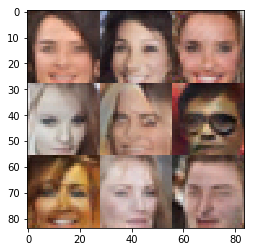

28901.28902.28903.28904.28905.28906.28907.28908.28909.28910.Epoch 5/5... Discriminator Loss: 1.2477... Generator Loss: 0.8274
28911.28912.28913.28914.28915.28916.28917.28918.28919.28920.Epoch 5/5... Discriminator Loss: 1.0925... Generator Loss: 0.6921
28921.28922.28923.28924.28925.28926.28927.28928.28929.28930.Epoch 5/5... Discriminator Loss: 1.6885... Generator Loss: 0.3476
28931.28932.28933.28934.28935.28936.28937.28938.28939.28940.Epoch 5/5... Discriminator Loss: 1.3408... Generator Loss: 0.5133
28941.28942.28943.28944.28945.28946.28947.28948.28949.28950.Epoch 5/5... Discriminator Loss: 1.5762... Generator Loss: 0.4176
28951.28952.28953.28954.28955.28956.28957.28958.28959.28960.Epoch 5/5... Discriminator Loss: 1.0538... Generator Loss: 0.9052
28961.28962.28963.28964.28965.28966.28967.28968.28969.28970.Epoch 5/5... Discriminator Loss: 1.0179... Generator Loss: 0.8165
28971.28972.28973.28974.28975.28976.28977.28978.28979.28980.Epoch 5/5... Discriminator Loss: 1.0665... Generator Loss:

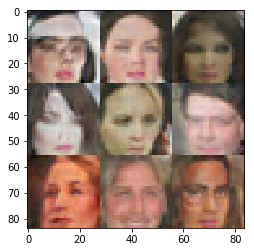

29001.29002.29003.29004.29005.29006.29007.29008.29009.29010.Epoch 5/5... Discriminator Loss: 1.3427... Generator Loss: 0.5226
29011.29012.29013.29014.29015.29016.29017.29018.29019.29020.Epoch 5/5... Discriminator Loss: 1.2863... Generator Loss: 0.7375
29021.29022.29023.29024.29025.29026.29027.29028.29029.29030.Epoch 5/5... Discriminator Loss: 1.6539... Generator Loss: 0.3738
29031.29032.29033.29034.29035.29036.29037.29038.29039.29040.Epoch 5/5... Discriminator Loss: 1.3497... Generator Loss: 0.5457
29041.29042.29043.29044.29045.29046.29047.29048.29049.29050.Epoch 5/5... Discriminator Loss: 1.3819... Generator Loss: 0.6281
29051.29052.29053.29054.29055.29056.29057.29058.29059.29060.Epoch 5/5... Discriminator Loss: 1.4946... Generator Loss: 0.5467
29061.29062.29063.29064.29065.29066.29067.29068.29069.29070.Epoch 5/5... Discriminator Loss: 1.0872... Generator Loss: 0.8858
29071.29072.29073.29074.29075.29076.29077.29078.29079.29080.Epoch 5/5... Discriminator Loss: 1.3021... Generator Loss:

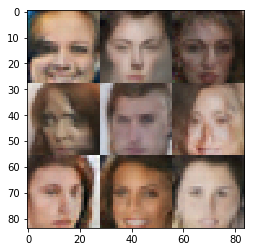

29101.29102.29103.29104.29105.29106.29107.29108.29109.29110.Epoch 5/5... Discriminator Loss: 1.2797... Generator Loss: 0.5448
29111.29112.29113.29114.29115.29116.29117.29118.29119.29120.Epoch 5/5... Discriminator Loss: 1.4053... Generator Loss: 0.5374
29121.29122.29123.29124.29125.29126.29127.29128.29129.29130.Epoch 5/5... Discriminator Loss: 1.4842... Generator Loss: 0.5556
29131.29132.29133.29134.29135.29136.29137.29138.29139.29140.Epoch 5/5... Discriminator Loss: 1.4338... Generator Loss: 0.4147
29141.29142.29143.29144.29145.29146.29147.29148.29149.29150.Epoch 5/5... Discriminator Loss: 0.9380... Generator Loss: 0.9810
29151.29152.29153.29154.29155.29156.29157.29158.29159.29160.Epoch 5/5... Discriminator Loss: 1.4380... Generator Loss: 0.6313
29161.29162.29163.29164.29165.29166.29167.29168.29169.29170.Epoch 5/5... Discriminator Loss: 1.0552... Generator Loss: 0.9222
29171.29172.29173.29174.29175.29176.29177.29178.29179.29180.Epoch 5/5... Discriminator Loss: 1.3833... Generator Loss:

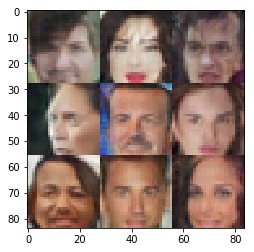

29201.29202.29203.29204.29205.29206.29207.29208.29209.29210.Epoch 5/5... Discriminator Loss: 1.2991... Generator Loss: 0.9049
29211.29212.29213.29214.29215.29216.29217.29218.29219.29220.Epoch 5/5... Discriminator Loss: 1.1746... Generator Loss: 0.7023
29221.29222.29223.29224.29225.29226.29227.29228.29229.29230.Epoch 5/5... Discriminator Loss: 1.3601... Generator Loss: 0.5518
29231.29232.29233.29234.29235.29236.29237.29238.29239.29240.Epoch 5/5... Discriminator Loss: 1.5091... Generator Loss: 0.4470
29241.29242.29243.29244.29245.29246.29247.29248.29249.29250.Epoch 5/5... Discriminator Loss: 1.4573... Generator Loss: 0.4931
29251.29252.29253.29254.29255.29256.29257.29258.29259.29260.Epoch 5/5... Discriminator Loss: 1.0986... Generator Loss: 0.7558
29261.29262.29263.29264.29265.29266.29267.29268.29269.29270.Epoch 5/5... Discriminator Loss: 1.1910... Generator Loss: 0.5856
29271.29272.29273.29274.29275.29276.29277.29278.29279.29280.Epoch 5/5... Discriminator Loss: 1.1330... Generator Loss:

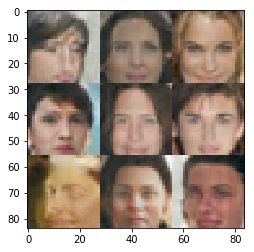

29301.29302.29303.29304.29305.29306.29307.29308.29309.29310.Epoch 5/5... Discriminator Loss: 1.3810... Generator Loss: 0.5893
29311.29312.29313.29314.29315.29316.29317.29318.29319.29320.Epoch 5/5... Discriminator Loss: 1.3038... Generator Loss: 0.6775
29321.29322.29323.29324.29325.29326.29327.29328.29329.29330.Epoch 5/5... Discriminator Loss: 1.4198... Generator Loss: 0.4804
29331.29332.29333.29334.29335.29336.29337.29338.29339.29340.Epoch 5/5... Discriminator Loss: 1.4578... Generator Loss: 0.4252
29341.29342.29343.29344.29345.29346.29347.29348.29349.29350.Epoch 5/5... Discriminator Loss: 1.3265... Generator Loss: 0.5778
29351.29352.29353.29354.29355.29356.29357.29358.29359.29360.Epoch 5/5... Discriminator Loss: 0.8854... Generator Loss: 0.9460
29361.29362.29363.29364.29365.29366.29367.29368.29369.29370.Epoch 5/5... Discriminator Loss: 1.1877... Generator Loss: 0.6045
29371.29372.29373.29374.29375.29376.29377.29378.29379.29380.Epoch 5/5... Discriminator Loss: 1.2372... Generator Loss:

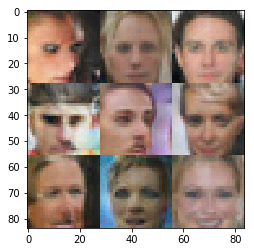

29401.29402.29403.29404.29405.29406.29407.29408.29409.29410.Epoch 5/5... Discriminator Loss: 1.3089... Generator Loss: 0.6042
29411.29412.29413.29414.29415.29416.29417.29418.29419.29420.Epoch 5/5... Discriminator Loss: 1.3579... Generator Loss: 0.6577
29421.29422.29423.29424.29425.29426.29427.29428.29429.29430.Epoch 5/5... Discriminator Loss: 1.4981... Generator Loss: 0.5527
29431.29432.29433.29434.29435.29436.29437.29438.29439.29440.Epoch 5/5... Discriminator Loss: 1.3652... Generator Loss: 0.6322
29441.29442.29443.29444.29445.29446.29447.29448.29449.29450.Epoch 5/5... Discriminator Loss: 1.5166... Generator Loss: 0.4947
29451.29452.29453.29454.29455.29456.29457.29458.29459.29460.Epoch 5/5... Discriminator Loss: 1.4705... Generator Loss: 0.4504
29461.29462.29463.29464.29465.29466.29467.29468.29469.29470.Epoch 5/5... Discriminator Loss: 1.3713... Generator Loss: 0.4418
29471.29472.29473.29474.29475.29476.29477.29478.29479.29480.Epoch 5/5... Discriminator Loss: 0.8489... Generator Loss:

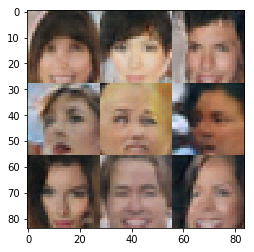

29501.29502.29503.29504.29505.29506.29507.29508.29509.29510.Epoch 5/5... Discriminator Loss: 1.0653... Generator Loss: 0.8108
29511.29512.29513.29514.29515.29516.29517.29518.29519.29520.Epoch 5/5... Discriminator Loss: 1.0457... Generator Loss: 0.7309
29521.29522.29523.29524.29525.29526.29527.29528.29529.29530.Epoch 5/5... Discriminator Loss: 1.1897... Generator Loss: 0.7519
29531.29532.29533.29534.29535.29536.29537.29538.29539.29540.Epoch 5/5... Discriminator Loss: 1.1606... Generator Loss: 0.6491
29541.29542.29543.29544.29545.29546.29547.29548.29549.29550.Epoch 5/5... Discriminator Loss: 1.4606... Generator Loss: 0.4858
29551.29552.29553.29554.29555.29556.29557.29558.29559.29560.Epoch 5/5... Discriminator Loss: 1.4350... Generator Loss: 0.4302
29561.29562.29563.29564.29565.29566.29567.29568.29569.29570.Epoch 5/5... Discriminator Loss: 1.4673... Generator Loss: 0.5054
29571.29572.29573.29574.29575.29576.29577.29578.29579.29580.Epoch 5/5... Discriminator Loss: 1.2155... Generator Loss:

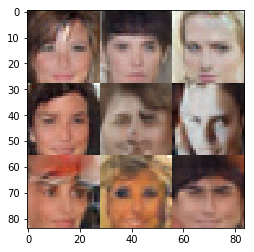

29601.29602.29603.29604.29605.29606.29607.29608.29609.29610.Epoch 5/5... Discriminator Loss: 1.4389... Generator Loss: 0.6139
29611.29612.29613.29614.29615.29616.29617.29618.29619.29620.Epoch 5/5... Discriminator Loss: 1.2784... Generator Loss: 0.6166
29621.29622.29623.29624.29625.29626.29627.29628.29629.29630.Epoch 5/5... Discriminator Loss: 0.8940... Generator Loss: 0.8496
29631.29632.29633.29634.29635.29636.29637.29638.29639.29640.Epoch 5/5... Discriminator Loss: 1.2800... Generator Loss: 0.5792
29641.29642.29643.29644.29645.29646.29647.29648.29649.29650.Epoch 5/5... Discriminator Loss: 1.2608... Generator Loss: 0.5271
29651.29652.29653.29654.29655.29656.29657.29658.29659.29660.Epoch 5/5... Discriminator Loss: 1.0631... Generator Loss: 0.8396
29661.29662.29663.29664.29665.29666.29667.29668.29669.29670.Epoch 5/5... Discriminator Loss: 1.3018... Generator Loss: 0.6273
29671.29672.29673.29674.29675.29676.29677.29678.29679.29680.Epoch 5/5... Discriminator Loss: 1.1002... Generator Loss:

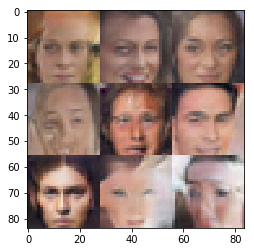

29701.29702.29703.29704.29705.29706.29707.29708.29709.29710.Epoch 5/5... Discriminator Loss: 1.4597... Generator Loss: 0.5005
29711.29712.29713.29714.29715.29716.29717.29718.29719.29720.Epoch 5/5... Discriminator Loss: 1.4020... Generator Loss: 0.7495
29721.29722.29723.29724.29725.29726.29727.29728.29729.29730.Epoch 5/5... Discriminator Loss: 1.0273... Generator Loss: 0.7597
29731.29732.29733.29734.29735.29736.29737.29738.29739.29740.Epoch 5/5... Discriminator Loss: 1.1232... Generator Loss: 0.8799
29741.29742.29743.29744.29745.29746.29747.29748.29749.29750.Epoch 5/5... Discriminator Loss: 1.1536... Generator Loss: 0.6374
29751.29752.29753.29754.29755.29756.29757.29758.29759.29760.Epoch 5/5... Discriminator Loss: 0.9079... Generator Loss: 1.0169
29761.29762.29763.29764.29765.29766.29767.29768.29769.29770.Epoch 5/5... Discriminator Loss: 1.4542... Generator Loss: 0.4953
29771.29772.29773.29774.29775.29776.29777.29778.29779.29780.Epoch 5/5... Discriminator Loss: 1.2860... Generator Loss:

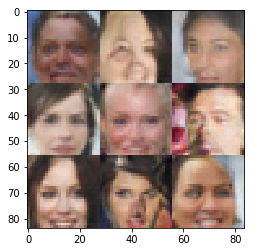

29801.29802.29803.29804.29805.29806.29807.29808.29809.29810.Epoch 5/5... Discriminator Loss: 0.9400... Generator Loss: 1.0755
29811.29812.29813.29814.29815.29816.29817.29818.29819.29820.Epoch 5/5... Discriminator Loss: 1.4207... Generator Loss: 0.5984
29821.29822.29823.29824.29825.29826.29827.29828.29829.29830.Epoch 5/5... Discriminator Loss: 1.3673... Generator Loss: 0.6075
29831.29832.29833.29834.29835.29836.29837.29838.29839.29840.Epoch 5/5... Discriminator Loss: 1.2358... Generator Loss: 0.7942
29841.29842.29843.29844.29845.29846.29847.29848.29849.29850.Epoch 5/5... Discriminator Loss: 1.2597... Generator Loss: 0.6400
29851.29852.29853.29854.29855.29856.29857.29858.29859.29860.Epoch 5/5... Discriminator Loss: 1.3504... Generator Loss: 0.5621
29861.29862.29863.29864.29865.29866.29867.29868.29869.29870.Epoch 5/5... Discriminator Loss: 1.3415... Generator Loss: 0.5627
29871.29872.29873.29874.29875.29876.29877.29878.29879.29880.Epoch 5/5... Discriminator Loss: 1.1351... Generator Loss:

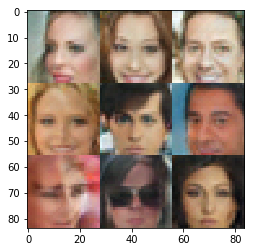

29901.29902.29903.29904.29905.29906.29907.29908.29909.29910.Epoch 5/5... Discriminator Loss: 1.2788... Generator Loss: 0.7506
29911.29912.29913.29914.29915.29916.29917.29918.29919.29920.Epoch 5/5... Discriminator Loss: 1.3177... Generator Loss: 0.6980
29921.29922.29923.29924.29925.29926.29927.29928.29929.29930.Epoch 5/5... Discriminator Loss: 1.1888... Generator Loss: 0.7076
29931.29932.29933.29934.29935.29936.29937.29938.29939.29940.Epoch 5/5... Discriminator Loss: 1.1923... Generator Loss: 0.6425
29941.29942.29943.29944.29945.29946.29947.29948.29949.29950.Epoch 5/5... Discriminator Loss: 1.2201... Generator Loss: 0.7498
29951.29952.29953.29954.29955.29956.29957.29958.29959.29960.Epoch 5/5... Discriminator Loss: 1.2113... Generator Loss: 0.8579
29961.29962.29963.29964.29965.29966.29967.29968.29969.29970.Epoch 5/5... Discriminator Loss: 1.2428... Generator Loss: 0.6295
29971.29972.29973.29974.29975.29976.29977.29978.29979.29980.Epoch 5/5... Discriminator Loss: 1.3994... Generator Loss:

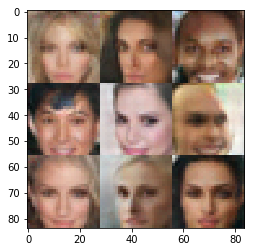

30001.30002.30003.30004.30005.30006.30007.30008.30009.30010.Epoch 5/5... Discriminator Loss: 1.4877... Generator Loss: 0.4523
30011.30012.30013.30014.30015.30016.30017.30018.30019.30020.Epoch 5/5... Discriminator Loss: 1.2502... Generator Loss: 0.6743
30021.30022.30023.30024.30025.30026.30027.30028.30029.30030.Epoch 5/5... Discriminator Loss: 1.2603... Generator Loss: 0.6838
30031.30032.30033.30034.30035.30036.30037.30038.30039.30040.Epoch 5/5... Discriminator Loss: 1.3317... Generator Loss: 0.5576
30041.30042.30043.30044.30045.30046.30047.30048.30049.30050.Epoch 5/5... Discriminator Loss: 1.3148... Generator Loss: 0.7205
30051.30052.30053.30054.30055.30056.30057.30058.30059.30060.Epoch 5/5... Discriminator Loss: 1.2442... Generator Loss: 0.6101
30061.30062.30063.30064.30065.30066.30067.30068.30069.30070.Epoch 5/5... Discriminator Loss: 1.3315... Generator Loss: 0.6061
30071.30072.30073.30074.30075.30076.30077.30078.30079.30080.Epoch 5/5... Discriminator Loss: 1.2691... Generator Loss:

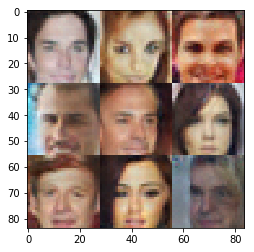

30101.30102.30103.30104.30105.30106.30107.30108.30109.30110.Epoch 5/5... Discriminator Loss: 1.2377... Generator Loss: 0.6876
30111.30112.30113.30114.30115.30116.30117.30118.30119.30120.Epoch 5/5... Discriminator Loss: 1.3728... Generator Loss: 0.6344
30121.30122.30123.30124.30125.30126.30127.30128.30129.30130.Epoch 5/5... Discriminator Loss: 1.1430... Generator Loss: 0.8384
30131.30132.30133.30134.30135.30136.30137.30138.30139.30140.Epoch 5/5... Discriminator Loss: 1.3429... Generator Loss: 0.6474
30141.30142.30143.30144.30145.30146.30147.30148.30149.30150.Epoch 5/5... Discriminator Loss: 1.3290... Generator Loss: 0.4779
30151.30152.30153.30154.30155.30156.30157.30158.30159.30160.Epoch 5/5... Discriminator Loss: 1.3007... Generator Loss: 0.6974
30161.30162.30163.30164.30165.30166.30167.30168.30169.30170.Epoch 5/5... Discriminator Loss: 1.1887... Generator Loss: 0.6440
30171.30172.30173.30174.30175.30176.30177.30178.30179.30180.Epoch 5/5... Discriminator Loss: 1.2962... Generator Loss:

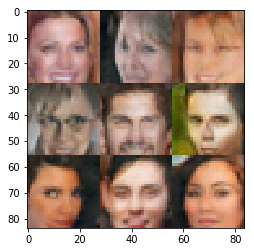

30201.30202.30203.30204.30205.30206.30207.30208.30209.30210.Epoch 5/5... Discriminator Loss: 1.2332... Generator Loss: 0.6936
30211.30212.30213.30214.30215.30216.30217.30218.30219.30220.Epoch 5/5... Discriminator Loss: 1.4228... Generator Loss: 0.6301
30221.30222.30223.30224.30225.30226.30227.30228.30229.30230.Epoch 5/5... Discriminator Loss: 1.2338... Generator Loss: 0.6679
30231.30232.30233.30234.30235.30236.30237.30238.30239.30240.Epoch 5/5... Discriminator Loss: 1.2640... Generator Loss: 0.7289
30241.30242.30243.30244.30245.30246.30247.30248.30249.30250.Epoch 5/5... Discriminator Loss: 1.3866... Generator Loss: 0.5489
30251.30252.30253.30254.30255.30256.30257.30258.30259.30260.Epoch 5/5... Discriminator Loss: 0.9135... Generator Loss: 0.9828
30261.30262.30263.30264.30265.30266.30267.30268.30269.30270.Epoch 5/5... Discriminator Loss: 1.4613... Generator Loss: 0.5115
30271.30272.30273.30274.30275.30276.30277.30278.30279.30280.Epoch 5/5... Discriminator Loss: 1.2325... Generator Loss:

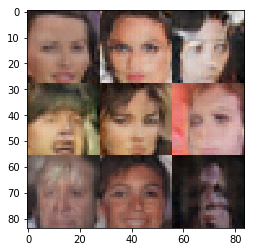

30301.30302.30303.30304.30305.30306.30307.30308.30309.30310.Epoch 5/5... Discriminator Loss: 1.3858... Generator Loss: 0.4491
30311.30312.30313.30314.30315.30316.30317.30318.30319.30320.Epoch 5/5... Discriminator Loss: 1.1753... Generator Loss: 0.5556
30321.30322.30323.30324.30325.30326.30327.30328.30329.30330.Epoch 5/5... Discriminator Loss: 1.5655... Generator Loss: 0.4026
30331.30332.30333.30334.30335.30336.30337.30338.30339.30340.Epoch 5/5... Discriminator Loss: 1.3334... Generator Loss: 0.5617
30341.30342.30343.30344.30345.30346.30347.30348.30349.30350.Epoch 5/5... Discriminator Loss: 1.3345... Generator Loss: 0.6307
30351.30352.30353.30354.30355.30356.30357.30358.30359.30360.Epoch 5/5... Discriminator Loss: 1.1381... Generator Loss: 0.7207
30361.30362.30363.30364.30365.30366.30367.30368.30369.30370.Epoch 5/5... Discriminator Loss: 0.9667... Generator Loss: 0.8725
30371.30372.30373.30374.30375.30376.30377.30378.30379.30380.Epoch 5/5... Discriminator Loss: 0.7911... Generator Loss:

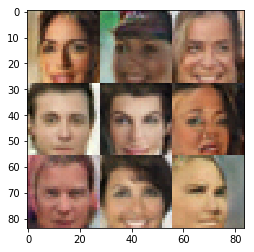

30401.30402.30403.30404.30405.30406.30407.30408.30409.30410.Epoch 5/5... Discriminator Loss: 1.3146... Generator Loss: 0.8878
30411.30412.30413.30414.30415.30416.30417.30418.30419.30420.Epoch 5/5... Discriminator Loss: 1.3246... Generator Loss: 0.5801
30421.30422.30423.30424.30425.30426.30427.30428.30429.30430.Epoch 5/5... Discriminator Loss: 1.1782... Generator Loss: 0.6033
30431.30432.30433.30434.30435.30436.30437.30438.30439.30440.Epoch 5/5... Discriminator Loss: 1.3279... Generator Loss: 0.5671
30441.30442.30443.30444.30445.30446.30447.30448.30449.30450.Epoch 5/5... Discriminator Loss: 1.3162... Generator Loss: 0.7016
30451.30452.30453.30454.30455.30456.30457.30458.30459.30460.Epoch 5/5... Discriminator Loss: 1.3326... Generator Loss: 0.5017
30461.30462.30463.30464.30465.30466.30467.30468.30469.30470.Epoch 5/5... Discriminator Loss: 1.4489... Generator Loss: 0.6681
30471.30472.30473.30474.30475.30476.30477.30478.30479.30480.Epoch 5/5... Discriminator Loss: 1.1853... Generator Loss:

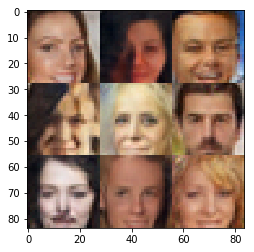

30501.30502.30503.30504.30505.30506.30507.30508.30509.30510.Epoch 5/5... Discriminator Loss: 1.3770... Generator Loss: 0.6669
30511.30512.30513.30514.30515.30516.30517.30518.30519.30520.Epoch 5/5... Discriminator Loss: 1.2842... Generator Loss: 0.5760
30521.30522.30523.30524.30525.30526.30527.30528.30529.30530.Epoch 5/5... Discriminator Loss: 1.4240... Generator Loss: 0.5155
30531.30532.30533.30534.30535.30536.30537.30538.30539.30540.Epoch 5/5... Discriminator Loss: 1.0390... Generator Loss: 0.7472
30541.30542.30543.30544.30545.30546.30547.30548.30549.30550.Epoch 5/5... Discriminator Loss: 1.6452... Generator Loss: 0.3700
30551.30552.30553.30554.30555.30556.30557.30558.30559.30560.Epoch 5/5... Discriminator Loss: 1.2445... Generator Loss: 0.6963
30561.30562.30563.30564.30565.30566.30567.30568.30569.30570.Epoch 5/5... Discriminator Loss: 1.3272... Generator Loss: 0.6897
30571.30572.30573.30574.30575.30576.30577.30578.30579.30580.Epoch 5/5... Discriminator Loss: 0.7168... Generator Loss:

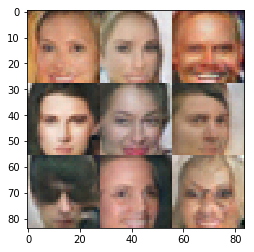

30601.30602.30603.30604.30605.30606.30607.30608.30609.30610.Epoch 5/5... Discriminator Loss: 1.4222... Generator Loss: 0.4939
30611.30612.30613.30614.30615.30616.30617.30618.30619.30620.Epoch 5/5... Discriminator Loss: 1.3872... Generator Loss: 0.6030
30621.30622.30623.30624.30625.30626.30627.30628.30629.30630.Epoch 5/5... Discriminator Loss: 1.0342... Generator Loss: 0.8593
30631.30632.30633.30634.30635.30636.30637.30638.30639.30640.Epoch 5/5... Discriminator Loss: 1.2503... Generator Loss: 0.6680
30641.30642.30643.30644.30645.30646.30647.30648.30649.30650.Epoch 5/5... Discriminator Loss: 1.8023... Generator Loss: 0.2969
30651.30652.30653.30654.30655.30656.30657.30658.30659.30660.Epoch 5/5... Discriminator Loss: 1.1558... Generator Loss: 0.8420
30661.30662.30663.30664.30665.30666.30667.30668.30669.30670.Epoch 5/5... Discriminator Loss: 1.3717... Generator Loss: 0.4700
30671.30672.30673.30674.30675.30676.30677.30678.30679.30680.Epoch 5/5... Discriminator Loss: 1.5101... Generator Loss:

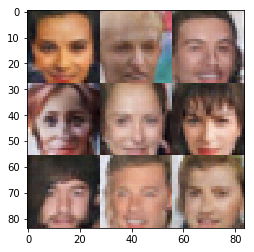

30701.30702.30703.30704.30705.30706.30707.30708.30709.30710.Epoch 5/5... Discriminator Loss: 1.3967... Generator Loss: 0.5944
30711.30712.30713.30714.30715.30716.30717.30718.30719.30720.Epoch 5/5... Discriminator Loss: 1.3078... Generator Loss: 0.6792
30721.30722.30723.30724.30725.30726.30727.30728.30729.30730.Epoch 5/5... Discriminator Loss: 1.1016... Generator Loss: 0.6529
30731.30732.30733.30734.30735.30736.30737.30738.30739.30740.Epoch 5/5... Discriminator Loss: 1.3043... Generator Loss: 0.6178
30741.30742.30743.30744.30745.30746.30747.30748.30749.30750.Epoch 5/5... Discriminator Loss: 1.2479... Generator Loss: 0.5899
30751.30752.30753.30754.30755.30756.30757.30758.30759.30760.Epoch 5/5... Discriminator Loss: 1.4629... Generator Loss: 0.5499
30761.30762.30763.30764.30765.30766.30767.30768.30769.30770.Epoch 5/5... Discriminator Loss: 1.2717... Generator Loss: 0.8344
30771.30772.30773.30774.30775.30776.30777.30778.30779.30780.Epoch 5/5... Discriminator Loss: 1.5023... Generator Loss:

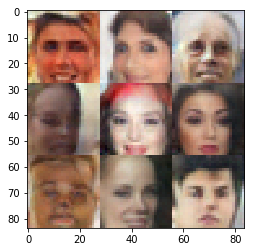

30801.30802.30803.30804.30805.30806.30807.30808.30809.30810.Epoch 5/5... Discriminator Loss: 1.5871... Generator Loss: 0.4726
30811.30812.30813.30814.30815.30816.30817.30818.30819.30820.Epoch 5/5... Discriminator Loss: 1.6031... Generator Loss: 0.4231
30821.30822.30823.30824.30825.30826.30827.30828.30829.30830.Epoch 5/5... Discriminator Loss: 0.9408... Generator Loss: 0.9062
30831.30832.30833.30834.30835.30836.30837.30838.30839.30840.Epoch 5/5... Discriminator Loss: 1.0657... Generator Loss: 0.9282
30841.30842.30843.30844.30845.30846.30847.30848.30849.30850.Epoch 5/5... Discriminator Loss: 1.2722... Generator Loss: 0.6484
30851.30852.30853.30854.30855.30856.30857.30858.30859.30860.Epoch 5/5... Discriminator Loss: 0.9474... Generator Loss: 1.1081
30861.30862.30863.30864.30865.30866.30867.30868.30869.30870.Epoch 5/5... Discriminator Loss: 1.3409... Generator Loss: 0.5137
30871.30872.30873.30874.30875.30876.30877.30878.30879.30880.Epoch 5/5... Discriminator Loss: 1.2980... Generator Loss:

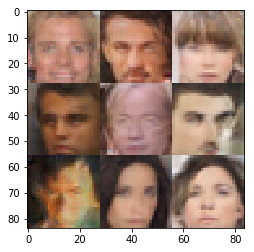

30901.30902.30903.30904.30905.30906.30907.30908.30909.30910.Epoch 5/5... Discriminator Loss: 1.0385... Generator Loss: 0.9100
30911.30912.30913.30914.30915.30916.30917.30918.30919.30920.Epoch 5/5... Discriminator Loss: 1.3047... Generator Loss: 0.5399
30921.30922.30923.30924.30925.30926.30927.30928.30929.30930.Epoch 5/5... Discriminator Loss: 1.0084... Generator Loss: 0.7549
30931.30932.30933.30934.30935.30936.30937.30938.30939.30940.Epoch 5/5... Discriminator Loss: 1.0303... Generator Loss: 0.8152
30941.30942.30943.30944.30945.30946.30947.30948.30949.30950.Epoch 5/5... Discriminator Loss: 1.2877... Generator Loss: 0.5528
30951.30952.30953.30954.30955.30956.30957.30958.30959.30960.Epoch 5/5... Discriminator Loss: 0.8472... Generator Loss: 1.0457
30961.30962.30963.30964.30965.30966.30967.30968.30969.30970.Epoch 5/5... Discriminator Loss: 1.3442... Generator Loss: 0.7001
30971.30972.30973.30974.30975.30976.30977.30978.30979.30980.Epoch 5/5... Discriminator Loss: 1.2885... Generator Loss:

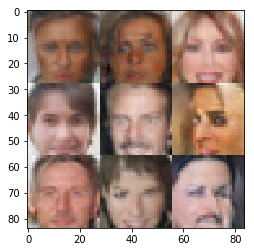

31001.31002.31003.31004.31005.31006.31007.31008.31009.31010.Epoch 5/5... Discriminator Loss: 1.4444... Generator Loss: 0.6179
31011.31012.31013.31014.31015.31016.31017.31018.31019.31020.Epoch 5/5... Discriminator Loss: 1.3830... Generator Loss: 0.6679
31021.31022.31023.31024.31025.31026.31027.31028.31029.31030.Epoch 5/5... Discriminator Loss: 1.1704... Generator Loss: 0.5559
31031.31032.31033.31034.31035.31036.31037.31038.31039.31040.Epoch 5/5... Discriminator Loss: 1.4596... Generator Loss: 0.5322
31041.31042.31043.31044.31045.31046.31047.31048.31049.31050.Epoch 5/5... Discriminator Loss: 1.2481... Generator Loss: 0.5617
31051.31052.31053.31054.31055.31056.31057.31058.31059.31060.Epoch 5/5... Discriminator Loss: 1.1110... Generator Loss: 0.7122
31061.31062.31063.31064.31065.31066.31067.31068.31069.31070.Epoch 5/5... Discriminator Loss: 1.2983... Generator Loss: 0.6971
31071.31072.31073.31074.31075.31076.31077.31078.31079.31080.Epoch 5/5... Discriminator Loss: 1.2549... Generator Loss:

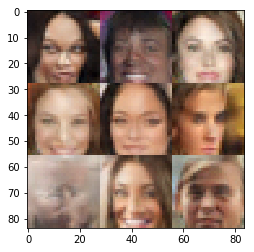

31101.31102.31103.31104.31105.31106.31107.31108.31109.31110.Epoch 5/5... Discriminator Loss: 1.2587... Generator Loss: 0.6752
31111.31112.31113.31114.31115.31116.31117.31118.31119.31120.Epoch 5/5... Discriminator Loss: 1.2527... Generator Loss: 0.6362
31121.31122.31123.31124.31125.31126.31127.31128.31129.31130.Epoch 5/5... Discriminator Loss: 1.2203... Generator Loss: 0.6712
31131.31132.31133.31134.31135.31136.31137.31138.31139.31140.Epoch 5/5... Discriminator Loss: 1.1778... Generator Loss: 0.6886
31141.31142.31143.31144.31145.31146.31147.31148.31149.31150.Epoch 5/5... Discriminator Loss: 1.4011... Generator Loss: 0.6425
31151.31152.31153.31154.31155.31156.31157.31158.31159.31160.Epoch 5/5... Discriminator Loss: 1.4782... Generator Loss: 0.4533
31161.31162.31163.31164.31165.31166.31167.31168.31169.31170.Epoch 5/5... Discriminator Loss: 1.3771... Generator Loss: 0.5334
31171.31172.31173.31174.31175.31176.31177.31178.31179.31180.Epoch 5/5... Discriminator Loss: 1.3263... Generator Loss:

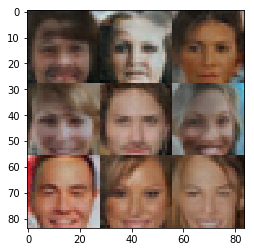

31201.31202.31203.31204.31205.31206.31207.31208.31209.31210.Epoch 5/5... Discriminator Loss: 1.1276... Generator Loss: 0.7211
31211.31212.31213.31214.31215.31216.31217.31218.31219.31220.Epoch 5/5... Discriminator Loss: 1.2804... Generator Loss: 0.6528
31221.31222.31223.31224.31225.31226.31227.31228.31229.31230.Epoch 5/5... Discriminator Loss: 1.1596... Generator Loss: 0.5834
31231.31232.31233.31234.31235.31236.31237.31238.31239.31240.Epoch 5/5... Discriminator Loss: 1.0745... Generator Loss: 0.8364
31241.31242.31243.31244.31245.31246.31247.31248.31249.31250.Epoch 5/5... Discriminator Loss: 1.3989... Generator Loss: 0.5755
31251.31252.31253.31254.31255.31256.31257.31258.31259.31260.Epoch 5/5... Discriminator Loss: 1.4526... Generator Loss: 0.4956
31261.31262.31263.31264.31265.31266.31267.31268.31269.31270.Epoch 5/5... Discriminator Loss: 1.2034... Generator Loss: 0.7562
31271.31272.31273.31274.31275.31276.31277.31278.31279.31280.Epoch 5/5... Discriminator Loss: 1.0621... Generator Loss:

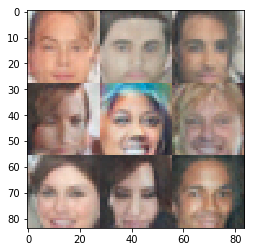

31301.31302.31303.31304.31305.31306.31307.31308.31309.31310.Epoch 5/5... Discriminator Loss: 1.4432... Generator Loss: 0.4900
31311.31312.31313.31314.31315.31316.31317.31318.31319.31320.Epoch 5/5... Discriminator Loss: 1.4280... Generator Loss: 0.6013
31321.31322.31323.31324.31325.31326.31327.31328.31329.31330.Epoch 5/5... Discriminator Loss: 1.8092... Generator Loss: 0.4161
31331.31332.31333.31334.31335.31336.31337.31338.31339.31340.Epoch 5/5... Discriminator Loss: 1.4650... Generator Loss: 0.5472
31341.31342.31343.31344.31345.31346.31347.31348.31349.31350.Epoch 5/5... Discriminator Loss: 1.2519... Generator Loss: 0.5656
31351.31352.31353.31354.31355.31356.31357.31358.31359.31360.Epoch 5/5... Discriminator Loss: 0.9805... Generator Loss: 1.0134
31361.31362.31363.31364.31365.31366.31367.31368.31369.31370.Epoch 5/5... Discriminator Loss: 1.1921... Generator Loss: 0.6419
31371.31372.31373.31374.31375.31376.31377.31378.31379.31380.Epoch 5/5... Discriminator Loss: 1.6194... Generator Loss:

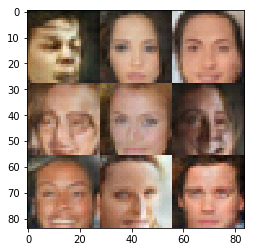

31401.31402.31403.31404.31405.31406.31407.31408.31409.31410.Epoch 5/5... Discriminator Loss: 1.4183... Generator Loss: 0.5500
31411.31412.31413.31414.31415.31416.31417.31418.31419.31420.Epoch 5/5... Discriminator Loss: 1.2397... Generator Loss: 0.5891
31421.31422.31423.31424.31425.31426.31427.31428.31429.31430.Epoch 5/5... Discriminator Loss: 1.1932... Generator Loss: 0.6836
31431.31432.31433.31434.31435.31436.31437.31438.31439.31440.Epoch 5/5... Discriminator Loss: 1.2985... Generator Loss: 0.4867
31441.31442.31443.31444.31445.31446.31447.31448.31449.31450.Epoch 5/5... Discriminator Loss: 1.4516... Generator Loss: 0.5519
31451.31452.31453.31454.31455.31456.31457.31458.31459.31460.Epoch 5/5... Discriminator Loss: 1.3260... Generator Loss: 0.6785
31461.31462.31463.31464.31465.31466.31467.31468.31469.31470.Epoch 5/5... Discriminator Loss: 1.2254... Generator Loss: 0.7897
31471.31472.31473.31474.31475.31476.31477.31478.31479.31480.Epoch 5/5... Discriminator Loss: 1.3929... Generator Loss:

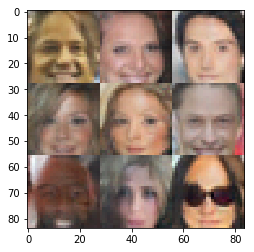

31501.31502.31503.31504.31505.31506.31507.31508.31509.31510.Epoch 5/5... Discriminator Loss: 0.9618... Generator Loss: 0.7728
31511.31512.31513.31514.31515.31516.31517.31518.31519.31520.Epoch 5/5... Discriminator Loss: 1.1532... Generator Loss: 0.6372
31521.31522.31523.31524.31525.31526.31527.31528.31529.31530.Epoch 5/5... Discriminator Loss: 1.0414... Generator Loss: 0.7680
31531.31532.31533.31534.31535.31536.31537.31538.31539.31540.Epoch 5/5... Discriminator Loss: 1.1374... Generator Loss: 0.7543
31541.31542.31543.31544.31545.31546.31547.31548.31549.31550.Epoch 5/5... Discriminator Loss: 1.1795... Generator Loss: 0.7546
31551.31552.31553.31554.31555.31556.31557.31558.31559.31560.Epoch 5/5... Discriminator Loss: 1.5216... Generator Loss: 0.4978
31561.31562.31563.31564.31565.31566.31567.31568.31569.31570.Epoch 5/5... Discriminator Loss: 1.2962... Generator Loss: 0.6491
31571.31572.31573.31574.31575.31576.31577.31578.31579.31580.Epoch 5/5... Discriminator Loss: 1.4345... Generator Loss:

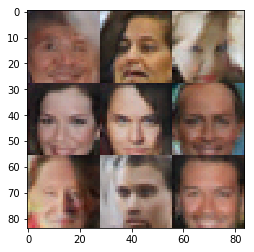

31601.31602.31603.31604.31605.31606.31607.31608.31609.31610.Epoch 5/5... Discriminator Loss: 1.8149... Generator Loss: 0.3776
31611.31612.31613.31614.31615.31616.31617.31618.31619.31620.Epoch 5/5... Discriminator Loss: 1.3791... Generator Loss: 0.5307
31621.31622.31623.31624.31625.31626.31627.31628.31629.31630.Epoch 5/5... Discriminator Loss: 1.0126... Generator Loss: 0.9249
31631.31632.31633.31634.31635.31636.31637.31638.31639.31640.Epoch 5/5... Discriminator Loss: 1.5331... Generator Loss: 0.5216
31641.31642.31643.31644.31645.31646.31647.31648.31649.31650.Epoch 5/5... Discriminator Loss: 1.2787... Generator Loss: 0.5398
31651.31652.31653.31654.31655.

In [13]:
batch_size = 32
z_dim = 80
learning_rate = 0.0004
beta1 = 0.50


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 5

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.